# 🎶 Music Generation with Transformers

In this notebook, we'll walk through the steps required to train your own Transformer model to generate music in the style of the Bach cello suites

In [52]:
%load_ext autoreload
%autoreload 2

import os
import glob
import numpy as np
import time
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras import layers, models, losses, callbacks

%cd /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks

import music21

from transformer_utils import (
    parse_midi_files,
    load_parsed_files,
    get_midi_note,
    SinePositionEncoding,
)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
/home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks


## 0. Parameters <a name="parameters"></a>

In [53]:
PARSE_MIDI_FILES = True
PARSED_DATA_PATH = '/home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/11_music/01_transformer/parsed_data'
DATASET_REPETITIONS = 1

SEQ_LEN = 50
EMBEDDING_DIM = 256
KEY_DIM = 256
N_HEADS = 5
DROPOUT_RATE = 0.3
FEED_FORWARD_DIM = 256
LOAD_MODEL = False

# optimization
EPOCHS = 5000
BATCH_SIZE = 256

GENERATE_LEN = 50

## 1. Prepare the Data

In [54]:
# Load the data
file_list = glob.glob("/home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/data/bach-cello/*.mid")
print(f"Found {len(file_list)} midi files")

Found 36 midi files


In [55]:
parser = music21.converter

In [56]:
example_score = (
    music21.converter.parse(file_list[1]).splitAtQuarterLength(12)[0].chordify()
)

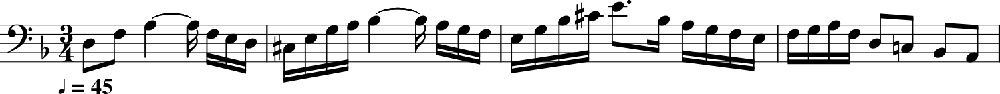

In [57]:
example_score.show()

In [58]:
example_score.show("text")

{0.0} <music21.metadata.Metadata object at 0x7f44bb1d88b0>
{0.0} <music21.stream.Measure 1 offset=0.0>
    {0.0} <music21.instrument.Violoncello 'Solo Cello: Solo Cello'>
    {0.0} <music21.instrument.Violoncello 'Violoncello'>
    {0.0} <music21.clef.BassClef>
    {0.0} <music21.tempo.MetronomeMark largo Quarter=45>
    {0.0} <music21.key.Key of F major>
    {0.0} <music21.meter.TimeSignature 3/4>
    {0.0} <music21.chord.Chord D3>
    {0.5} <music21.chord.Chord F3>
    {1.0} <music21.chord.Chord A3>
    {2.25} <music21.chord.Chord F3>
    {2.5} <music21.chord.Chord E3>
    {2.75} <music21.chord.Chord D3>
{3.0} <music21.stream.Measure 2 offset=3.0>
    {0.0} <music21.chord.Chord C#3>
    {0.25} <music21.chord.Chord E3>
    {0.5} <music21.chord.Chord G3>
    {0.75} <music21.chord.Chord A3>
    {1.0} <music21.chord.Chord B-3>
    {2.25} <music21.chord.Chord A3>
    {2.5} <music21.chord.Chord G3>
    {2.75} <music21.chord.Chord F3>
{6.0} <music21.stream.Measure 3 offset=6.0>
    {0.0} <m

In [59]:
if PARSE_MIDI_FILES:
    notes, durations = parse_midi_files(
        file_list, parser, SEQ_LEN + 1, PARSED_DATA_PATH
    )
else:
    notes, durations = load_parsed_files()

1 Parsing /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/data/bach-cello/cs6-5gav.mid


/tmp/ipykernel_154144/3287489010.py:2: Music21DeprecationWarning: .flat is deprecated.  Call .flatten() instead
  notes, durations = parse_midi_files(


806 notes parsed
2 Parsing /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/data/bach-cello/cs2-1pre.mid
1444 notes parsed
3 Parsing /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/data/bach-cello/cs2-3cou.mid
2185 notes parsed
4 Parsing /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/data/bach-cello/cs1-4sar.mid
2448 notes parsed
5 Parsing /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/data/bach-cello/cs3-5bou.mid
3329 notes parsed
6 Parsing /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/data/bach-cello/cs5-3cou.mid
3759 notes parsed
7 Parsing /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/data/bach-cello/cs5-5gav.mid
4961 notes parsed
8 Parsing /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/data/bach-cello/cs3-3cou.mid
5950 notes parsed
9 Parsing /home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/data/b

In [60]:
example_notes = notes[658]
example_durations = durations[658]
print("\nNotes string\n", example_notes, "...")
print("\nDuration string\n", example_durations, "...")


Notes string
 E4 D4 E4 F#4 G4 D4 C#4 B3 A3 D4 D4 D4 C#4 D4 C#4 B3 E4 C#4 A4 A4 A4 B4 A4 G4 F#4 B4 A4 G4 F#4 E4 A3 G4 F#4 E4 G3 E-4 E4 G4 A3 F#4 B3 E-4 E3 B3 E4 F#4 G4 G4 C#3 E3 A3 ...

Duration string
 0.5 0.5 0.5 0.5 1.0 0.5 0.5 0.5 0.5 1.0 1.0 1.0 0.5 0.5 0.5 0.5 1.0 2.0 1.0 1.0 1.0 0.5 0.5 0.5 0.5 1.0 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 1.0 1.0 0.5 0.5 0.5 ...


## 2. Tokenize the data <a name="tokenize"></a>

In [61]:
def create_dataset(elements):
    ds = (
        tf.data.Dataset.from_tensor_slices(elements)
        .batch(BATCH_SIZE, drop_remainder=True)
        .shuffle(1000)
    )
    vectorize_layer = layers.TextVectorization(
        standardize=None, output_mode="int"
    )
    vectorize_layer.adapt(ds)
    vocab = vectorize_layer.get_vocabulary()
    return ds, vectorize_layer, vocab


notes_seq_ds, notes_vectorize_layer, notes_vocab = create_dataset(notes)
durations_seq_ds, durations_vectorize_layer, durations_vocab = create_dataset(
    durations
) # Here was are just using layers.TextVectorization(standardize=None, output_mode="int") twice on the notes and the duration
seq_ds = tf.data.Dataset.zip((notes_seq_ds, durations_seq_ds))

2023-08-27 15:34:54.020112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [27581]
	 [[{{node Placeholder/_0}}]]
2023-08-27 15:34:54.020318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [27581]
	 [[{{node Placeholder/_0}}]]
2023-08-27 15:34:54.275097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [27

In [62]:
# Display the same example notes and durations converted to ints
example_tokenised_notes = notes_vectorize_layer(example_notes)
example_tokenised_durations = durations_vectorize_layer(example_durations)
print("{:10} {:10}".format("note token", "duration token"))
for i, (note_int, duration_int) in enumerate(
    zip(
        example_tokenised_notes.numpy()[:11],
        example_tokenised_durations.numpy()[:11],
    )
):
    print(f"{note_int:10}{duration_int:10}")

note token duration token
        15         3
         7         3
        15         3
        21         3
        22         4
         7         3
        17         3
         9         3
         3         3
         7         4
         7         4


In [63]:
notes_vocab_size = len(notes_vocab)
durations_vocab_size = len(durations_vocab)

# Display some token:note mappings
print(f"\nNOTES_VOCAB: length = {len(notes_vocab)}")
for i, note in enumerate(notes_vocab[:10]):
    print(f"{i}: {note}")

print(f"\nDURATIONS_VOCAB: length = {len(durations_vocab)}")
# Display some token:duration mappings
for i, note in enumerate(durations_vocab[:10]):
    print(f"{i}: {note}")


NOTES_VOCAB: length = 59
0: 
1: [UNK]
2: G3
3: A3
4: D3
5: F3
6: C4
7: D4
8: E3
9: B3

DURATIONS_VOCAB: length = 24
0: 
1: [UNK]
2: 0.25
3: 0.5
4: 1.0
5: 1/3
6: 0.75
7: 1.5
8: 1/12
9: 0.0


## 3. Create the Training Set <a name="create"></a>

In [64]:
# Create the training set of sequences and the same sequences shifted by one note
def prepare_inputs(notes, durations):
    notes = tf.expand_dims(notes, -1)
    durations = tf.expand_dims(durations, -1)
    tokenized_notes = notes_vectorize_layer(notes)
    tokenized_durations = durations_vectorize_layer(durations)
    x = (tokenized_notes[:, :-1], tokenized_durations[:, :-1])
    y = (tokenized_notes[:, 1:], tokenized_durations[:, 1:])
    return x, y
    # We are treating this the same as if it were words. Our test set is just the train shifted by one, as we are going to predict the next element of the sequence


ds = seq_ds.map(prepare_inputs).repeat(DATASET_REPETITIONS)

In [65]:
example_input_output = ds.take(1).get_single_element()
print(example_input_output)

((<tf.Tensor: shape=(256, 50), dtype=int64, numpy=
array([[ 8,  3,  9, ..., 15, 21, 21],
       [ 3,  9, 17, ..., 21, 21, 21],
       [ 9, 17,  7, ..., 21, 21, 15],
       ...,
       [17,  7,  3, ..., 22,  3, 21],
       [ 7,  3,  2, ...,  3, 21,  3],
       [ 3,  2,  3, ..., 21,  3, 15]])>, <tf.Tensor: shape=(256, 50), dtype=int64, numpy=
array([[ 4,  9,  9, ...,  3,  3,  7],
       [ 9,  9,  9, ...,  3,  7,  3],
       [ 9,  9, 19, ...,  7,  3,  3],
       ...,
       [ 3,  3,  3, ...,  3,  3,  3],
       [ 3,  3,  3, ...,  3,  3,  4],
       [ 3,  3,  3, ...,  3,  4,  3]])>), (<tf.Tensor: shape=(256, 50), dtype=int64, numpy=
array([[ 3,  9, 17, ..., 21, 21, 21],
       [ 9, 17,  7, ..., 21, 21, 15],
       [17,  7, 15, ..., 21, 15,  7],
       ...,
       [ 7,  3,  2, ...,  3, 21,  3],
       [ 3,  2,  3, ..., 21,  3, 15],
       [ 2,  3,  9, ...,  3, 15,  3]])>, <tf.Tensor: shape=(256, 50), dtype=int64, numpy=
array([[ 9,  9,  9, ...,  3,  7,  3],
       [ 9,  9, 19, ...,  7,  3, 

## 5. Create the causal attention mask function <a name="causal"></a>

In [66]:
def causal_attention_mask(batch_size, n_dest, n_src, dtype):
    i = tf.range(n_dest)[:, None]
    j = tf.range(n_src)
    m = i >= j - n_src + n_dest
    mask = tf.cast(m, dtype)
    mask = tf.reshape(mask, [1, n_dest, n_src])
    mult = tf.concat(
        [tf.expand_dims(batch_size, -1), tf.constant([1, 1], dtype=tf.int32)], 0
    )
    return tf.tile(mask, mult)


np.transpose(causal_attention_mask(1, 10, 10, dtype=tf.int32)[0])

array([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [0, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [0, 0, 1, 1, 1, 1, 1, 1, 1, 1],
       [0, 0, 0, 1, 1, 1, 1, 1, 1, 1],
       [0, 0, 0, 0, 1, 1, 1, 1, 1, 1],
       [0, 0, 0, 0, 0, 1, 1, 1, 1, 1],
       [0, 0, 0, 0, 0, 0, 1, 1, 1, 1],
       [0, 0, 0, 0, 0, 0, 0, 1, 1, 1],
       [0, 0, 0, 0, 0, 0, 0, 0, 1, 1],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=int32)

## 6. Create a Transformer Block layer <a name="transformer"></a>

In [67]:
class TransformerBlock(layers.Layer):
    def __init__(
        self,
        num_heads,
        key_dim,
        embed_dim,
        ff_dim,
        name,
        dropout_rate=DROPOUT_RATE,
    ):
        super(TransformerBlock, self).__init__(name=name)
        self.num_heads = num_heads
        self.key_dim = key_dim
        self.embed_dim = embed_dim
        self.ff_dim = ff_dim
        self.dropout_rate = dropout_rate
        self.attn = layers.MultiHeadAttention(
            num_heads, key_dim, output_shape=embed_dim
        )
        self.dropout_1 = layers.Dropout(self.dropout_rate)
        self.ln_1 = layers.LayerNormalization(epsilon=1e-6)
        self.ffn_1 = layers.Dense(self.ff_dim, activation="relu")
        self.ffn_2 = layers.Dense(self.embed_dim)
        self.dropout_2 = layers.Dropout(self.dropout_rate)
        self.ln_2 = layers.LayerNormalization(epsilon=1e-6)

    def call(self, inputs):
        input_shape = tf.shape(inputs)
        batch_size = input_shape[0]
        seq_len = input_shape[1]
        causal_mask = causal_attention_mask(
            batch_size, seq_len, seq_len, tf.bool
        )
        attention_output, attention_scores = self.attn(
            inputs,
            inputs,
            attention_mask=causal_mask,
            return_attention_scores=True,
        )
        attention_output = self.dropout_1(attention_output)
        out1 = self.ln_1(inputs + attention_output)
        ffn_1 = self.ffn_1(out1)
        ffn_2 = self.ffn_2(ffn_1)
        ffn_output = self.dropout_2(ffn_2)
        return (self.ln_2(out1 + ffn_output), attention_scores)

    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "key_dim": self.key_dim,
                "embed_dim": self.embed_dim,
                "num_heads": self.num_heads,
                "ff_dim": self.ff_dim,
                "dropout_rate": self.dropout_rate,
            }
        )
        return config

## 7. Create the Token and Position Embedding <a name="embedder"></a>

### Mathematical Overview of Sine Position Encoding

After the embedding layer, where we turn each note/duration integer into a learnable vector in $d$ dimensional space, we are then going to further encode the position of the note/duration by the following:

$$ PE_{pos, 2i} = \sin\left( \frac{pos}{10000^{2i/d}} \right) $$
$$ PE_{pos, 2i+1} = \cos\left( \frac{pos}{10000^{(2i+1)/d}} \right) $$

In [68]:
class TokenAndPositionEmbedding(layers.Layer):
    def __init__(self, vocab_size, embed_dim):
        super(TokenAndPositionEmbedding, self).__init__()
        self.vocab_size = vocab_size
        self.embed_dim = embed_dim
        self.token_emb = layers.Embedding(
            input_dim=vocab_size,
            output_dim=embed_dim,
            embeddings_initializer="he_uniform",
        )
        self.pos_emb = SinePositionEncoding()

    def call(self, x):
        embedding = self.token_emb(x) # Apply the embedding first
        positions = self.pos_emb(embedding) # Then the sine position encoding
        return embedding + positions

    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "vocab_size": self.vocab_size,
                "embed_dim": self.embed_dim,
            }
        )
        return config

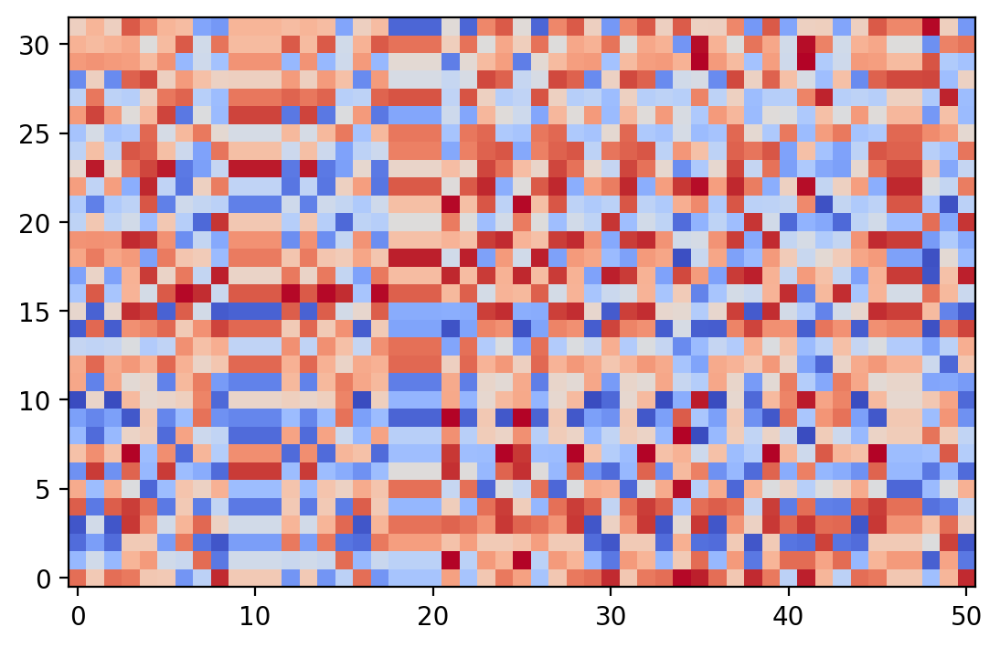

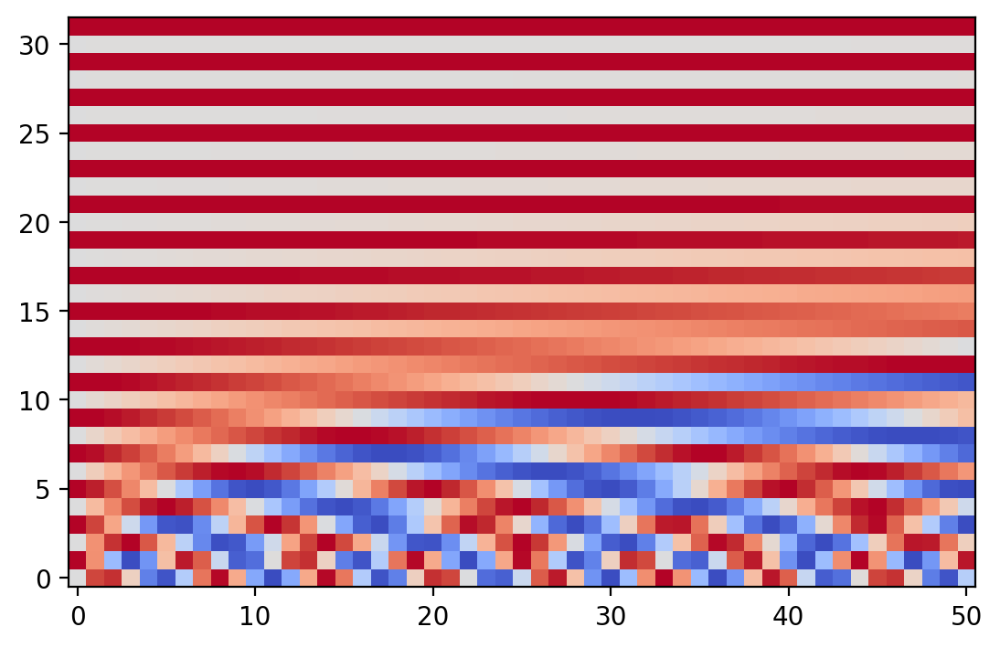

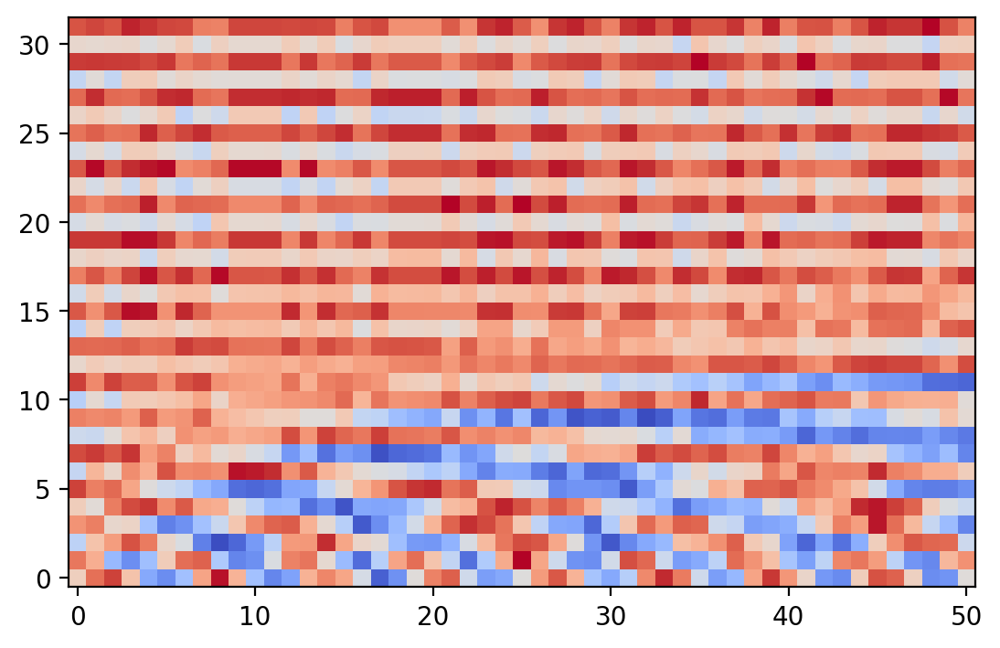

In [69]:
tpe = TokenAndPositionEmbedding(notes_vocab_size, 32)
token_embedding = tpe.token_emb(example_tokenised_notes)
position_embedding = tpe.pos_emb(token_embedding)
embedding = tpe(example_tokenised_notes)
plt.imshow(
    np.transpose(token_embedding),
    cmap="coolwarm",
    interpolation="nearest",
    origin="lower",
)
plt.show()
plt.imshow(
    np.transpose(position_embedding),
    cmap="coolwarm",
    interpolation="nearest",
    origin="lower",
)
plt.show()
plt.imshow(
    np.transpose(embedding),
    cmap="coolwarm",
    interpolation="nearest",
    origin="lower",
)
plt.show()

## 8. Build the Transformer model <a name="transformer_decoder"></a>

### Mathematical Overview of the Transformer

The transformer has the following structure:

<div style='text-align: center;'>
    <img src='/home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/Graphics/Transformer_Block.png' alt='Transformer_Block' width='300'>
</div>

Essentially, each of $Q,K,V$ are fed into the multi-headed attention, the $Q$ information also passes around the attention layer and is added to the output (skip connection, like in Residual Blocks), then *Layer Normalized*, before being passed to the feedforward network and so on.

We note that batch normalization normalizes each feature independently across the mini-batch. Layer normalization normalizes each of the inputs in the batch independently across all features.

<div style='text-align: center;'>
    <img src='/home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/Graphics/Normalization_Types.png' alt='Normalization_Types' width='750'>
</div>

In [70]:
note_inputs = layers.Input(shape=(None,), dtype=tf.int32)
durations_inputs = layers.Input(shape=(None,), dtype=tf.int32)
note_embeddings = TokenAndPositionEmbedding(
    notes_vocab_size, EMBEDDING_DIM // 2
)(note_inputs)
duration_embeddings = TokenAndPositionEmbedding(
    durations_vocab_size, EMBEDDING_DIM // 2
)(durations_inputs)
embeddings = layers.Concatenate()([note_embeddings, duration_embeddings])
x, attention_scores = TransformerBlock(
    N_HEADS, KEY_DIM, EMBEDDING_DIM, FEED_FORWARD_DIM, name="attention"
)(embeddings)
note_outputs = layers.Dense(
    notes_vocab_size, activation="softmax", name="note_outputs"
)(x) # Layer for notes
duration_outputs = layers.Dense(
    durations_vocab_size, activation="softmax", name="duration_outputs"
)(x) # Layer for duration
model = models.Model(
    inputs=[note_inputs, durations_inputs],
    outputs=[note_outputs, duration_outputs],  # attention_scores
)
model.compile(
    "adam",
    loss=[
        losses.SparseCategoricalCrossentropy(),
        losses.SparseCategoricalCrossentropy(),
    ],
)
att_model = models.Model(
    inputs=[note_inputs, durations_inputs], outputs=attention_scores
)

In [71]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, None)]       0           []                               
                                                                                                  
 input_4 (InputLayer)           [(None, None)]       0           []                               
                                                                                                  
 token_and_position_embedding_5  (None, None, 128)   7552        ['input_3[0][0]']                
  (TokenAndPositionEmbedding)                                                                     
                                                                                                  
 token_and_position_embedding_6  (None, None, 128)   3072        ['input_4[0][0]']          

In [72]:
if LOAD_MODEL:
    model.load_weights("./checkpoint/checkpoint.ckpt")
    # model = models.load_model('./models/model', compile=True)

## 9. Train the Transformer <a name="train"></a>

In [73]:
# Create a MusicGenerator checkpoint
class MusicGenerator(callbacks.Callback):
    def __init__(self, index_to_note, index_to_duration, top_k=10):
        self.index_to_note = index_to_note
        self.note_to_index = {
            note: index for index, note in enumerate(index_to_note)
        }
        self.index_to_duration = index_to_duration
        self.duration_to_index = {
            duration: index for index, duration in enumerate(index_to_duration)
        }

    def sample_from(self, probs, temperature):
        probs = probs ** (1 / temperature)
        probs = probs / np.sum(probs)
        return np.random.choice(len(probs), p=probs), probs

    def get_note(self, notes, durations, temperature): # Essentially the same as we have doing, but with two sequences
        sample_note_idx = 1
        while sample_note_idx == 1:
            sample_note_idx, note_probs = self.sample_from(
                notes[0][-1], temperature
            )
            sample_note = self.index_to_note[sample_note_idx]

        sample_duration_idx = 1
        while sample_duration_idx == 1:
            sample_duration_idx, duration_probs = self.sample_from(
                durations[0][-1], temperature
            )
            sample_duration = self.index_to_duration[sample_duration_idx]

        new_note = get_midi_note(sample_note, sample_duration)

        return (
            new_note,
            sample_note_idx,
            sample_note,
            note_probs,
            sample_duration_idx,
            sample_duration,
            duration_probs,
        )

    def generate(self, start_notes, start_durations, max_tokens, temperature):
        attention_model = models.Model(
            inputs=self.model.input,
            outputs=self.model.get_layer("attention").output,
        )

        start_note_tokens = [self.note_to_index.get(x, 1) for x in start_notes]
        start_duration_tokens = [
            self.duration_to_index.get(x, 1) for x in start_durations
        ]
        sample_note = None
        sample_duration = None
        info = []
        midi_stream = music21.stream.Stream()

        midi_stream.append(music21.clef.BassClef())

        for sample_note, sample_duration in zip(start_notes, start_durations):
            new_note = get_midi_note(sample_note, sample_duration)
            if new_note is not None:
                midi_stream.append(new_note)

        while len(start_note_tokens) < max_tokens:
            x1 = np.array([start_note_tokens])
            x2 = np.array([start_duration_tokens])
            notes, durations = self.model.predict([x1, x2], verbose=0)

            repeat = True

            while repeat:
                (
                    new_note,
                    sample_note_idx,
                    sample_note,
                    note_probs,
                    sample_duration_idx,
                    sample_duration,
                    duration_probs,
                ) = self.get_note(notes, durations, temperature)

                if (
                    isinstance(new_note, music21.chord.Chord)
                    or isinstance(new_note, music21.note.Note)
                    or isinstance(new_note, music21.note.Rest)
                ) and sample_duration == "0.0":
                    repeat = True
                else:
                    repeat = False

            if new_note is not None:
                midi_stream.append(new_note)

            _, att = attention_model.predict([x1, x2], verbose=0)

            info.append(
                {
                    "prompt": [start_notes.copy(), start_durations.copy()],
                    "midi": midi_stream,
                    "chosen_note": (sample_note, sample_duration),
                    "note_probs": note_probs,
                    "duration_probs": duration_probs,
                    "atts": att[0, :, -1, :],
                }
            )
            start_note_tokens.append(sample_note_idx)
            start_duration_tokens.append(sample_duration_idx)
            start_notes.append(sample_note)
            start_durations.append(sample_duration)

            if sample_note == "START":
                break

        return info

    def on_epoch_end(self, epoch, logs=None):
        if epoch % 500: # Generating only every 500 epochs
            info = self.generate(
                ["START"], ["0.0"], max_tokens=GENERATE_LEN, temperature=0.5
            )
            midi_stream = info[-1]["midi"].chordify()
            print(info[-1]["prompt"])
            midi_stream.show()
            midi_stream.write(
                "midi",
                fp=os.path.join(
                    "/home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/11_music/01_transformer/output",
                    "output-" + str(epoch).zfill(4) + ".mid",
                ),
            )

In [74]:
# Create a model save checkpoint
model_checkpoint_callback = callbacks.ModelCheckpoint(
    filepath="./checkpoint/checkpoint.ckpt",
    save_weights_only=True,
    save_freq="epoch",
    verbose=0,
)

tensorboard_callback = callbacks.TensorBoard(log_dir="./logs")

# Tokenize starting prompt
music_generator = MusicGenerator(notes_vocab, durations_vocab)

Epoch 1/5000


2023-08-27 15:34:55.559605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_10' with dtype string and shape [27581]
	 [[{{node Placeholder/_10}}]]
2023-08-27 15:34:55.559963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_28' with dtype int64
	 [[{{node Placeholder/_28}}]]


107/107 [==============================] - 62s 559ms/step - loss: 4.9013 - note_outputs_loss: 3.4965 - duration_outputs_loss: 1.4049
Epoch 2/5000
107/107 [==============================] - ETA: 0s - loss: 4.1347 - note_outputs_loss: 3.3505 - duration_outputs_loss: 0.7842[['START', 'D4', 'E-3', 'D4', 'G3', 'G#3', 'A3', 'C4', 'B3', 'G#3', 'C#4', 'A3', 'B3', 'B-3', 'B3', 'G3', 'F3', 'D3', 'G3', 'E3', 'D3', 'F3', 'D3', 'D3', 'F3', 'D3', 'F3', 'E-3', 'D3', 'G2', 'D3', 'A3', 'F3', 'D3', 'C3', 'E-3', 'E-3', 'E-3', 'D3', 'D3', 'E-3', 'A3', 'D3', 'A3', 'A3', 'F3', 'G3', 'F3', 'E-3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


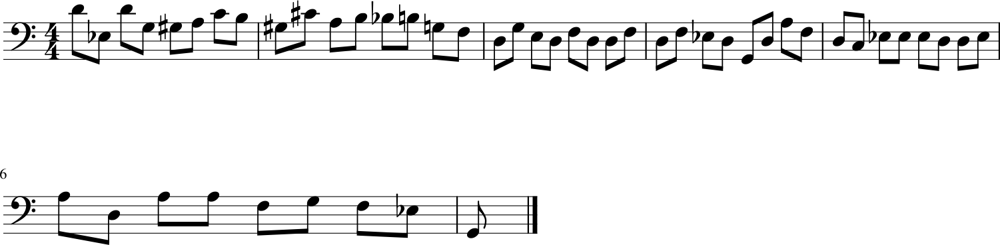

107/107 [==============================] - 67s 629ms/step - loss: 4.1347 - note_outputs_loss: 3.3505 - duration_outputs_loss: 0.7842
Epoch 3/5000
107/107 [==============================] - ETA: 0s - loss: 3.7107 - note_outputs_loss: 3.0241 - duration_outputs_loss: 0.6866[['START', 'A4', 'A3', 'G3', 'A3', 'G3', 'D3', 'C#3', 'D3', 'B2', 'D3', 'E3', 'D3', 'G2', 'D3', 'A2', 'D3', 'D3', 'F2', 'D3', 'E3', 'D3', 'D3', 'D3', 'A2', 'D3', 'B2', 'C#3', 'A2', 'B2', 'A2', 'D3', 'G2', 'C3', 'B2', 'B2', 'G2', 'E3', 'D3', 'G3', 'D3', 'C3', 'B2', 'G2', 'B2', 'G3', 'A3', 'G3', 'A3'], ['0.0', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3']]


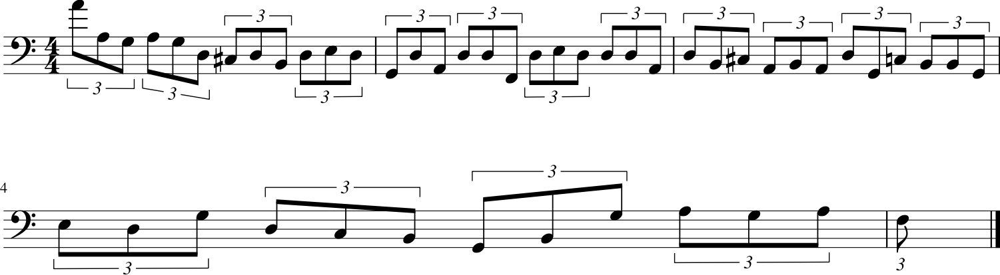

107/107 [==============================] - 67s 625ms/step - loss: 3.7107 - note_outputs_loss: 3.0241 - duration_outputs_loss: 0.6866
Epoch 4/5000
107/107 [==============================] - ETA: 0s - loss: 3.4535 - note_outputs_loss: 2.7879 - duration_outputs_loss: 0.6656[['START', 'E4', 'D4', 'E4', 'E4', 'D4', 'E4', 'D4', 'E4', 'F#4', 'E4', 'A4', 'B3', 'C#4', 'D4', 'E4', 'F#4', 'E4', 'D4', 'E4', 'E4', 'E4', 'F#4', 'E4', 'E4', 'E4', 'F#4', 'E4', 'E4', 'E4', 'D4', 'D4', 'C#4', 'C#4', 'D4', 'E4', 'F#4', 'E4', 'B3', 'A3', 'D4', 'C#4', 'B3', 'A3', 'D4', 'A3', 'B3', 'A3', 'D4'], ['0.0', '1.0', '1/6', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


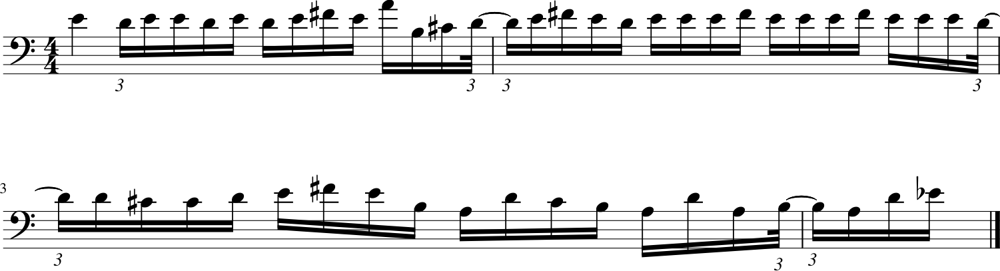

107/107 [==============================] - 67s 626ms/step - loss: 3.4535 - note_outputs_loss: 2.7879 - duration_outputs_loss: 0.6656
Epoch 5/5000
107/107 [==============================] - ETA: 0s - loss: 3.2670 - note_outputs_loss: 2.6469 - duration_outputs_loss: 0.6201[['START', 'A4', 'A4', 'A4', 'B4', 'F#4', 'F#4', 'F#4', 'F#4', 'F#4', 'G4', 'F#4', 'F#4', 'F#4', 'G4', 'F#4', 'F#4', 'G4', 'F#4', 'G4', 'F#4', 'G4', 'F#4', 'F#4', 'B4', 'F#4', 'G4', 'F#4', 'F#4', 'G4', 'F#4', 'F#4', 'F#4', 'F#4', 'G4', 'F#4', 'F#4', 'G4', 'F#4', 'F#4', 'F#4', 'A4', 'G4', 'F#4', 'G4', 'F#4', 'D4', 'F#4', 'D4'], ['0.0', '3.0', '1.0', '0.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


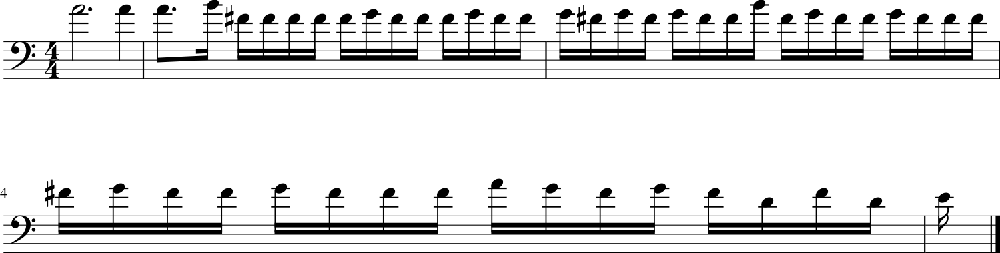

107/107 [==============================] - 64s 597ms/step - loss: 3.2670 - note_outputs_loss: 2.6469 - duration_outputs_loss: 0.6201
Epoch 6/5000
107/107 [==============================] - ETA: 0s - loss: 3.1979 - note_outputs_loss: 2.6013 - duration_outputs_loss: 0.5966[['START', '4/4TS', 'E-3', 'D3', 'E-3', 'D3', 'E-3', 'F3', 'E-3', 'D3', 'E-3', 'D3', 'E-3', 'G#3', 'G3', 'C4', 'B-3', 'B-3', 'A3', 'B-3', 'C4', 'B-3', 'E-4', 'E-4', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'E-3', 'B-3', 'G3', 'B-3', 'B-3', 'A3', 'B-3', 'B-3', 'B-3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'G3', 'E-3', 'F3', 'E-3', 'D3', 'B-3'], ['0.0', '0.0', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3']]


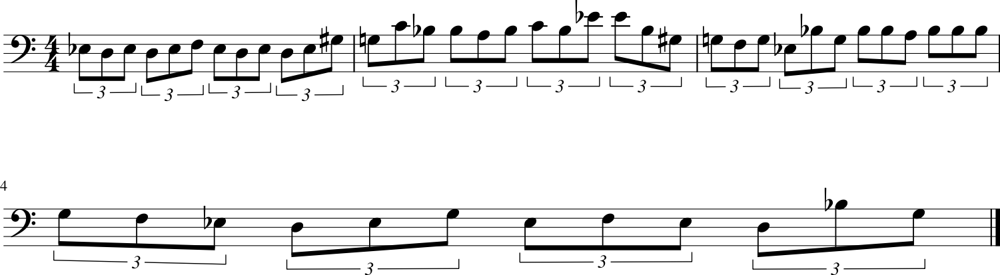

107/107 [==============================] - 65s 603ms/step - loss: 3.1979 - note_outputs_loss: 2.6013 - duration_outputs_loss: 0.5966
Epoch 7/5000
107/107 [==============================] - ETA: 0s - loss: 3.1136 - note_outputs_loss: 2.5289 - duration_outputs_loss: 0.5846[['START', '4/4TS', '3/4TS', 'G3', 'A3', 'G3', 'A3', 'G3', 'A3', 'G3', 'F3', 'D3', 'E3', 'F3', 'G3', 'F3', 'D3', 'D3', 'E3', 'D3', 'E3', 'F3', 'G3', 'A3', 'G3', 'F3', 'G3', 'A3', 'F3', 'E3', 'D3', 'C3', 'D3', 'E3', 'F#3', 'G3', 'A3', 'G3', 'A3', 'G3', 'F#3', 'G3', 'G3', 'A3', 'B3', 'C4', 'B3', 'C4', 'B3'], ['0.0', '0.0', '0.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


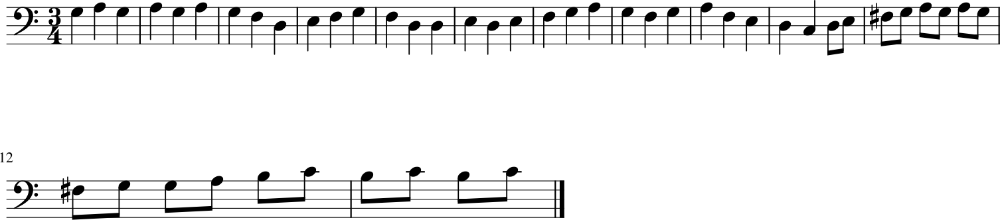

107/107 [==============================] - 64s 599ms/step - loss: 3.1136 - note_outputs_loss: 2.5289 - duration_outputs_loss: 0.5846
Epoch 8/5000
107/107 [==============================] - ETA: 0s - loss: 3.0815 - note_outputs_loss: 2.5055 - duration_outputs_loss: 0.5760[['START', '4/4TS', '3/4TS', 'G3', 'B-3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'F3', 'E-3', 'D3', 'E-3', 'D3', 'E-3', 'D3', 'E-3', 'D3', 'E-3', 'D3', 'E-3', 'D3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'D3', 'E-3', 'D3', 'E-3', 'F3', 'E-3', 'D3', 'E-3', 'D3'], ['0.0', '0.0', '0.0', '1/6', '1/12', '1/6', '1/12', '1/6', '1/12', '1/6', '1/12', '1/6', '1/3', '1/3', '1/3', '1/3', '1/12', '1/6', '1/12', '1/3', '1/3', '1/12', '1/6', '1/12', '1/6', '1/12', '1/6', '1/12', '1/6', '1/12', '1/6', '1/12', '1/6', '1/12', '1/6', '1/12', '1/12', '1/6', '1/12', '1/6', '1/12', '1/6', '1/12', '1/6', '1/12', '1/6', '1/12', '1/6', '1/12']]


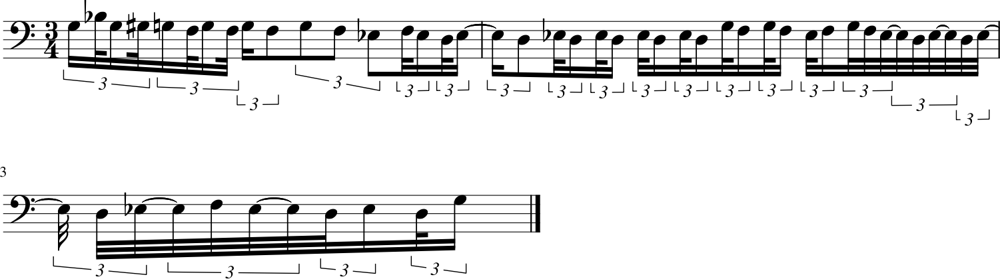

107/107 [==============================] - 65s 607ms/step - loss: 3.0815 - note_outputs_loss: 2.5055 - duration_outputs_loss: 0.5760
Epoch 9/5000
107/107 [==============================] - ETA: 0s - loss: 3.0495 - note_outputs_loss: 2.4753 - duration_outputs_loss: 0.5742[['START', '3/4TS', '3/4TS', 'C4', 'B3', 'C4', 'B3', 'C4', 'D4', 'E-4', 'D4', 'C#4', 'D4', 'C#4', 'B3', 'D4', 'C#4', 'C#4', 'D4', 'C#4', 'D4', 'A3', 'B3', 'C4', 'A3', 'B3', 'A3', 'B3', 'C4', 'B3', 'C4', 'D4', 'C4', 'B3', 'A3', 'A3', 'B3', 'A3', 'A3', 'B3', 'A3', 'B3', 'C4', 'A3', 'A3', 'G3', 'A3', 'B3', 'C4'], ['0.0', '0.0', '0.0', '3.0', '2.0', '1.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


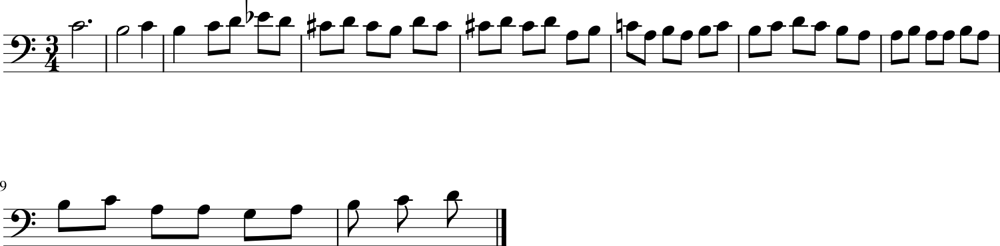

107/107 [==============================] - 64s 598ms/step - loss: 3.0495 - note_outputs_loss: 2.4753 - duration_outputs_loss: 0.5742
Epoch 10/5000
107/107 [==============================] - ETA: 0s - loss: 3.0421 - note_outputs_loss: 2.4505 - duration_outputs_loss: 0.5916[['START', '4/4TS', '4/4TS', '4/4TS', 'rest', 'B3', 'C4', 'B3', 'C4', 'B3', 'C4', 'D4', 'C4', 'D4', 'E-4', 'D4', 'E-4', 'D4', 'B3', 'C4', 'B3', 'C4', 'B3', 'C4', 'B3', 'C4', 'D4', 'C4', 'B3', 'C4', 'D4', 'E-4', 'D4', 'E-4', 'D4', 'E-4', 'D4', 'E-4', 'D4', 'C4', 'A3', 'C4', 'B3', 'C4', 'B3', 'A3', 'A3', 'B3', 'C4'], ['0.0', '0.0', '0.0', '0.0', '2.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


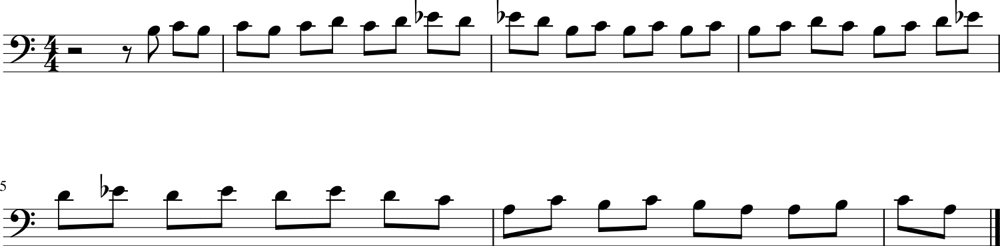

107/107 [==============================] - 64s 596ms/step - loss: 3.0421 - note_outputs_loss: 2.4505 - duration_outputs_loss: 0.5916
Epoch 11/5000
107/107 [==============================] - ETA: 0s - loss: 2.9719 - note_outputs_loss: 2.4087 - duration_outputs_loss: 0.5632[['START', '3/4TS', 'G3', 'A3', 'B-3', 'C4', 'B-3', 'G3', 'A3', 'G3', 'F3', 'G3', 'A3', 'G3', 'F3', 'E3', 'F3', 'E3', 'D3', 'C3', 'D3', 'E3', 'F3', 'E3', 'D3', 'E3', 'C3', 'E3', 'F3', 'G3', 'A3', 'B3', 'C4', 'E3', 'D3', 'E3', 'F3', 'E3', 'D3', 'E3', 'F3', 'E3', 'D3', 'E3', 'F#3', 'E3', 'D3', 'C3', 'D3'], ['0.0', '0.0', '0.5', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


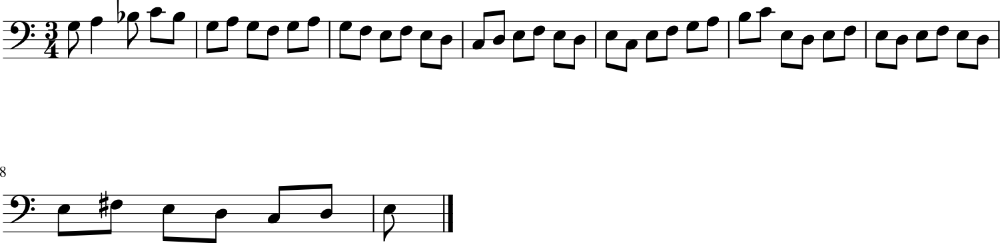

107/107 [==============================] - 64s 597ms/step - loss: 2.9719 - note_outputs_loss: 2.4087 - duration_outputs_loss: 0.5632
Epoch 12/5000
107/107 [==============================] - ETA: 0s - loss: 2.9459 - note_outputs_loss: 2.3871 - duration_outputs_loss: 0.5588[['START', '3/4TS', 'rest', 'D4', 'C4', 'B-3', 'C4', 'D4', 'C4', 'B-3', 'A3', 'B-3', 'G3', 'F#3', 'G3', 'A3', 'B-3', 'G3', 'A3', 'B-3', 'A3', 'G3', 'F#3', 'G3', 'F#3', 'G3', 'E3', 'F#3', 'G3', 'F#3', 'E3', 'F#3', 'G3', 'F#3', 'G3', 'F#3', 'E3', 'F#3', 'G3', 'A3', 'F#3', 'E3', 'F#3', 'E3', 'F#3', 'G3', 'A3', 'F#3', 'G3'], ['0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


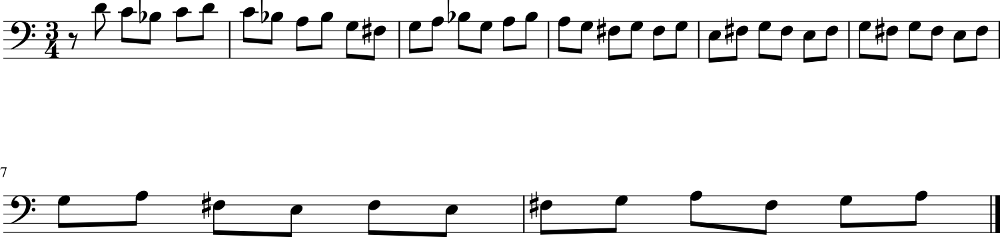

107/107 [==============================] - 64s 597ms/step - loss: 2.9459 - note_outputs_loss: 2.3871 - duration_outputs_loss: 0.5588
Epoch 13/5000
107/107 [==============================] - ETA: 0s - loss: 2.9297 - note_outputs_loss: 2.3709 - duration_outputs_loss: 0.5588[['START', '3/4TS', 'E2', '3/4TS', 'B-3', 'A3', 'B-3', 'A3', 'B-3', 'A3', 'B-3', 'A3', 'B-3', 'E-4', 'C4', 'A3', 'B-3', 'A3', 'B-3', 'G3', 'F3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'E-4', 'D4', 'E-4', 'E-4', 'E-4', 'D4', 'C4', 'B-3', 'C4', 'B-3', 'C4', 'E-3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3'], ['0.0', '0.0', '2.0', '0.0', '2.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


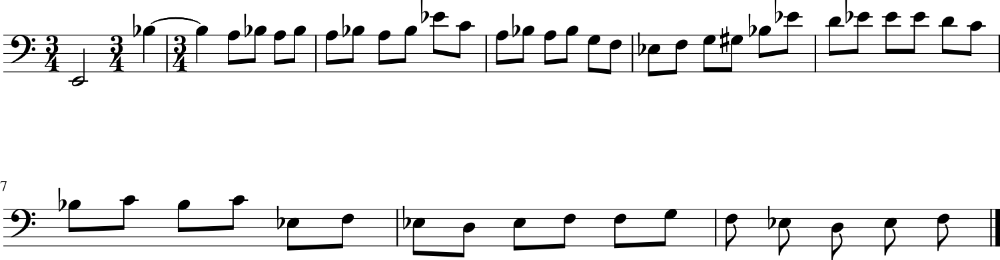

107/107 [==============================] - 64s 598ms/step - loss: 2.9297 - note_outputs_loss: 2.3709 - duration_outputs_loss: 0.5588
Epoch 14/5000
107/107 [==============================] - ETA: 0s - loss: 2.9182 - note_outputs_loss: 2.3583 - duration_outputs_loss: 0.5599[['START', '4/4TS', '4/4TS', 'rest', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'A3', 'G3', 'F#3', 'G3', 'A3', 'G3', 'F#3', 'G3', 'A3', 'G3', 'F#3', 'E3', 'G3', 'F#3', 'G3', 'A3', 'B3', 'G3', 'F#3', 'E3', 'D3', 'F#3', 'D3', 'E3', 'F#3', 'A3', 'G3', 'F#3', 'E3', 'F#3', 'E3', 'D3', 'C3', 'B2', 'A2', 'D3', 'E3', 'F#3', 'A3', 'G3'], ['0.0', '0.0', '0.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


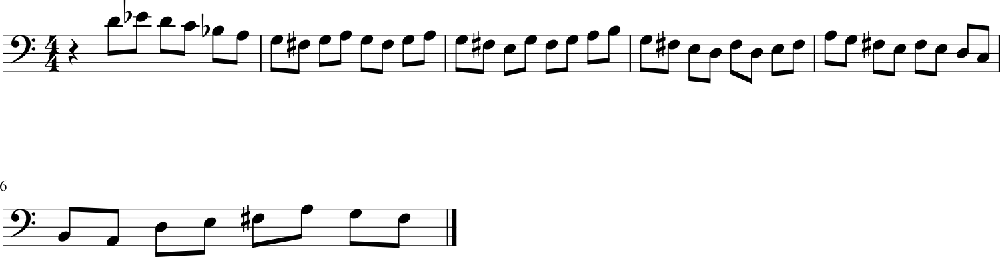

107/107 [==============================] - 64s 597ms/step - loss: 2.9182 - note_outputs_loss: 2.3583 - duration_outputs_loss: 0.5599
Epoch 15/5000
107/107 [==============================] - ETA: 0s - loss: 2.8881 - note_outputs_loss: 2.3330 - duration_outputs_loss: 0.5551[['START', '4/4TS', '4/4TS', 'G2', 'G2', 'F#2', 'G2', 'B2', 'D3', 'E-3', 'G2', 'B2', 'D3', 'G2', 'C3', 'B2', 'D3', 'E-3', 'D3', 'E-3', 'D3', 'E-3', 'D3', 'E-3', 'B2', 'D3', 'E-3', 'D3', 'F3', 'E-3', 'D3', 'F3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'B2', 'G2', 'F3', 'A2', 'B2', 'D3', 'E-3', 'D3', 'E-3', 'D3', 'C3', 'B2'], ['0.0', '0.0', '0.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


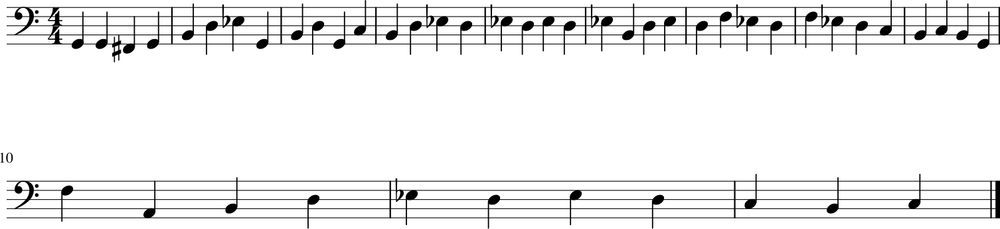

107/107 [==============================] - 65s 606ms/step - loss: 2.8881 - note_outputs_loss: 2.3330 - duration_outputs_loss: 0.5551
Epoch 16/5000
107/107 [==============================] - ETA: 0s - loss: 2.8743 - note_outputs_loss: 2.3215 - duration_outputs_loss: 0.5528[['START', '4/4TS', '3/4TS', 'rest', 'B3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'B-3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'C3', 'D3', 'E-3', 'B-2', 'C3', 'B-2', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'E-3', 'F3', 'G3'], ['0.0', '0.0', '0.0', '1.0', '1.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


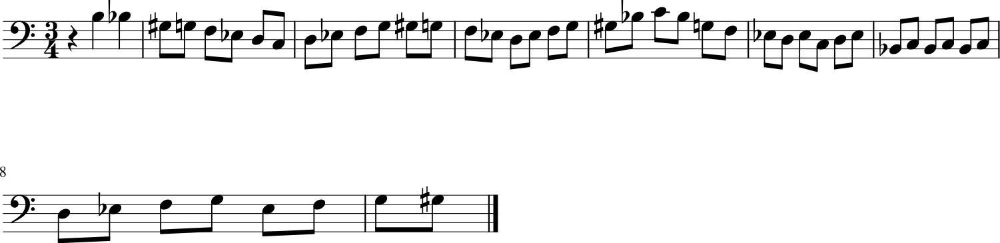

107/107 [==============================] - 64s 600ms/step - loss: 2.8743 - note_outputs_loss: 2.3215 - duration_outputs_loss: 0.5528
Epoch 17/5000
107/107 [==============================] - ETA: 0s - loss: 2.8458 - note_outputs_loss: 2.3016 - duration_outputs_loss: 0.5442[['START', 'C:major', '6/8TS', 'rest', 'B3'], ['0.0', '0.0', '0.0', '3.0', '1.0']]


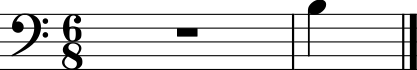

107/107 [==============================] - 61s 573ms/step - loss: 2.8458 - note_outputs_loss: 2.3016 - duration_outputs_loss: 0.5442
Epoch 18/5000
107/107 [==============================] - ETA: 0s - loss: 2.8520 - note_outputs_loss: 2.2890 - duration_outputs_loss: 0.5630[['START', 'E-:major', '4/4TS', '3/4TS', 'B-3', 'A3', 'B-3', 'A3', 'G3', 'A3', 'B-3', 'A3', 'B-3', 'A3', 'G3', 'F3', 'E3', 'F3', 'E3', 'F3', 'G3', 'A3', 'B-3', 'A3', 'G3', 'A3', 'B-3', 'G3', 'A3', 'B-3', 'G3', 'F3', 'G3', 'F3', 'E3', 'F3', 'G3', 'G3', 'F3', 'E3', 'D3', 'C#3', 'E3', 'F3', 'G3', 'F3', 'E3', 'F3', 'E3'], ['0.0', '0.0', '0.0', '0.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


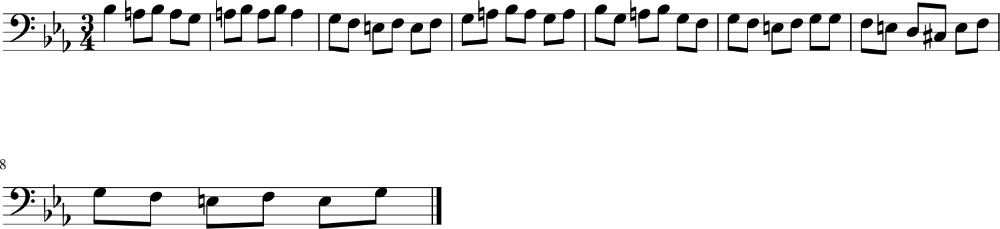

107/107 [==============================] - 65s 605ms/step - loss: 2.8520 - note_outputs_loss: 2.2890 - duration_outputs_loss: 0.5630
Epoch 19/5000
107/107 [==============================] - ETA: 0s - loss: 2.8220 - note_outputs_loss: 2.2697 - duration_outputs_loss: 0.5523[['START', 'C:major', '3/4TS', 'G3', 'B-3', 'A3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'D3', 'E-3', 'C3', 'E-3', 'F3', 'G3', 'G#3', 'G#3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2', 'E-2', 'E-2', 'G2', 'F2', 'E-2', 'G2', 'B-2', 'A2', 'C3', 'B-2', 'G#2', 'B-2', 'C3', 'E-2', 'F2', 'G2', 'G#2', 'G2', 'F2', 'D3', 'E-3', 'F3'], ['0.0', '0.0', '0.0', '2.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


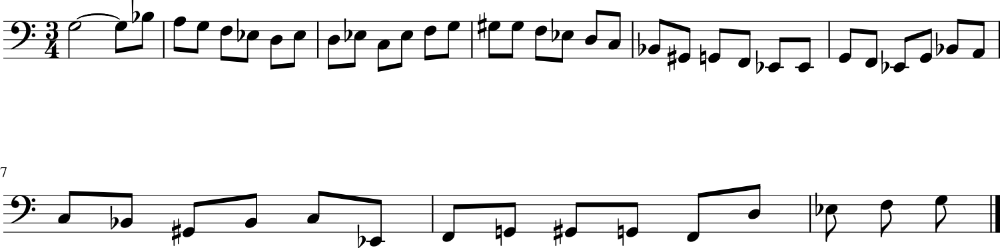

107/107 [==============================] - 64s 600ms/step - loss: 2.8220 - note_outputs_loss: 2.2697 - duration_outputs_loss: 0.5523
Epoch 20/5000
107/107 [==============================] - ETA: 0s - loss: 2.7993 - note_outputs_loss: 2.2527 - duration_outputs_loss: 0.5466[['START', '3/4TS', '3/4TS', 'E-3', 'D3', 'E-3', 'F3', 'B-2', 'D3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'E-3', 'D3', 'C3', 'D3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'C3', 'B-2', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'B-3'], ['0.0', '0.0', '0.0', '2.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


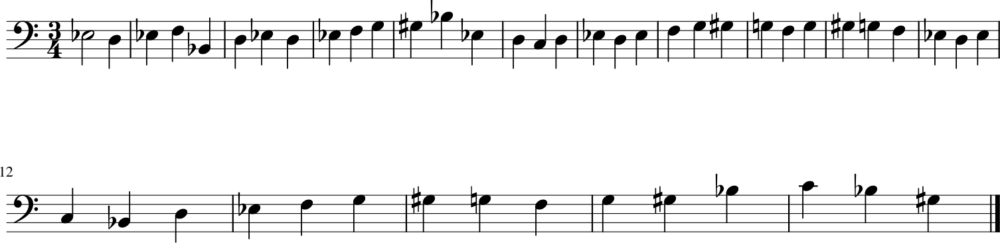

107/107 [==============================] - 65s 612ms/step - loss: 2.7993 - note_outputs_loss: 2.2527 - duration_outputs_loss: 0.5466
Epoch 21/5000
107/107 [==============================] - ETA: 0s - loss: 2.7984 - note_outputs_loss: 2.2508 - duration_outputs_loss: 0.5476[['START', '3/4TS', 'G2', 'C4', 'B-3', 'G3', 'G#3', 'B-3', 'G3', 'F3', 'G3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B2', 'F3'], ['0.0', '0.0', '2.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


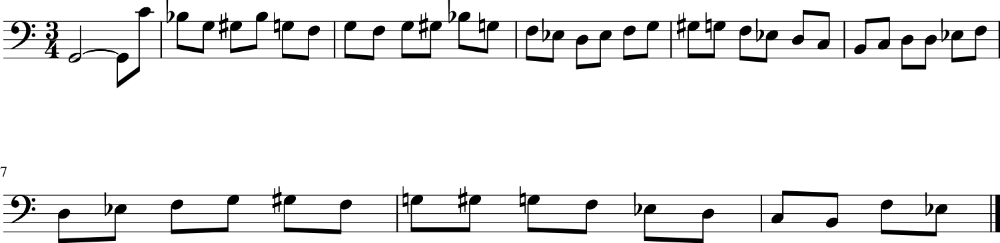

107/107 [==============================] - 64s 600ms/step - loss: 2.7984 - note_outputs_loss: 2.2508 - duration_outputs_loss: 0.5476
Epoch 22/5000
107/107 [==============================] - ETA: 0s - loss: 2.7881 - note_outputs_loss: 2.2387 - duration_outputs_loss: 0.5494[['START', '3/4TS', '3/4TS', 'C4', 'G2', 'C4', 'B3', 'C4', 'B3', 'C4', 'B3', 'C4', 'B3', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'D3', 'E3', 'F3', 'G3', 'B3', 'C4', 'B3', 'C4', 'E3', 'G3', 'C4', 'B3', 'C4', 'B3', 'C4', 'B3', 'C4', 'B3', 'C4', 'D4', 'F3', 'E3', 'F3', 'G3', 'E3', 'F3', 'D3', 'E3', 'F3', 'G2'], ['0.0', '0.0', '0.0', '1.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


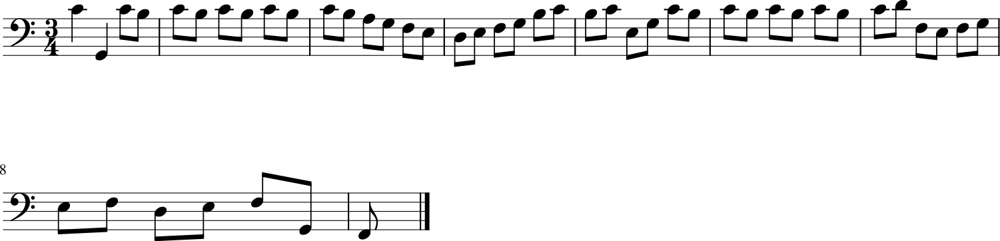

107/107 [==============================] - 65s 605ms/step - loss: 2.7881 - note_outputs_loss: 2.2387 - duration_outputs_loss: 0.5494
Epoch 23/5000
107/107 [==============================] - ETA: 0s - loss: 2.7646 - note_outputs_loss: 2.2184 - duration_outputs_loss: 0.5462[['START', '4/4TS', '4/4TS', 'rest'], ['0.0', '0.0', '0.0', '1.0']]


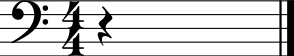

107/107 [==============================] - 62s 578ms/step - loss: 2.7646 - note_outputs_loss: 2.2184 - duration_outputs_loss: 0.5462
Epoch 24/5000
107/107 [==============================] - ETA: 0s - loss: 2.7548 - note_outputs_loss: 2.2073 - duration_outputs_loss: 0.5476[['START', '3/4TS', '3/4TS', 'D4', 'C4', 'B3', 'A3', 'G3', 'F#3', 'G3', 'A3', 'G3', 'F#3', 'G3', 'A3', 'G3', 'F#3', 'G3', 'A3', 'B3', 'C4', 'B3', 'D4', 'C4', 'B3', 'A3', 'C4', 'B3', 'A3', 'G3', 'F3', 'G3', 'F3', 'E3', 'D3', 'C3', 'B-2', 'A2', 'G2', 'F2', 'E2', 'G2', 'F2', 'A2', 'C3', 'B-2', 'C3', 'D3', 'E3'], ['0.0', '0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


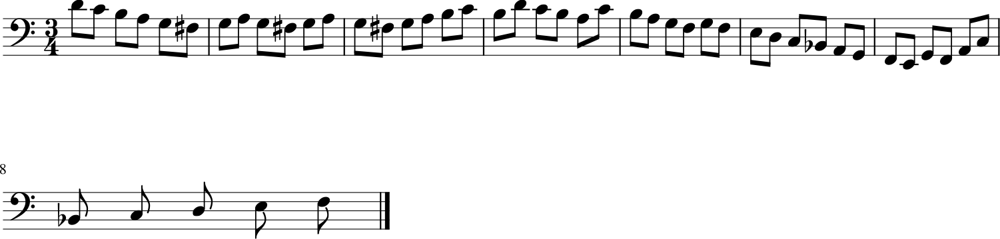

107/107 [==============================] - 65s 610ms/step - loss: 2.7548 - note_outputs_loss: 2.2073 - duration_outputs_loss: 0.5476
Epoch 25/5000
107/107 [==============================] - ETA: 0s - loss: 2.7456 - note_outputs_loss: 2.1962 - duration_outputs_loss: 0.5494[['START', '3/4TS', 'rest', 'rest'], ['0.0', '0.0', '0.5', '0.5']]


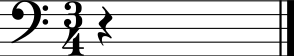

107/107 [==============================] - 63s 584ms/step - loss: 2.7456 - note_outputs_loss: 2.1962 - duration_outputs_loss: 0.5494
Epoch 26/5000
107/107 [==============================] - ETA: 0s - loss: 2.7250 - note_outputs_loss: 2.1829 - duration_outputs_loss: 0.5421[['START', '4/4TS', '4/4TS', 'rest', 'G2', 'C4', 'rest', 'B-3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G#3', 'G3'], ['0.0', '0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


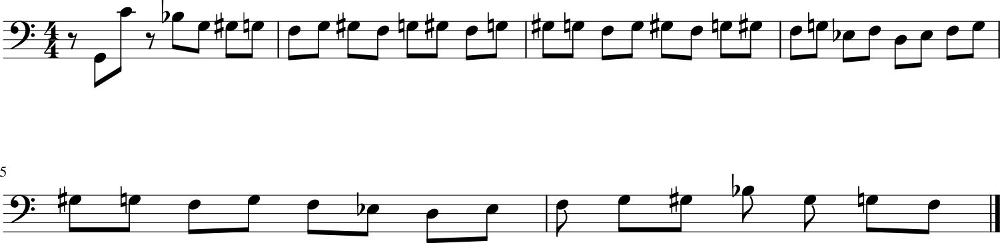

107/107 [==============================] - 65s 607ms/step - loss: 2.7250 - note_outputs_loss: 2.1829 - duration_outputs_loss: 0.5421
Epoch 27/5000
107/107 [==============================] - ETA: 0s - loss: 2.6949 - note_outputs_loss: 2.1575 - duration_outputs_loss: 0.5374[['START', '4/4TS', '4/4TS', 'rest', 'C4', 'B-3', 'A3', 'B-3', 'A3', 'B-3', 'D4', 'C4', 'G3', 'F#3', 'E3', 'D3', 'C3', 'E3', 'B-2', 'A2', 'B-2', 'A2', 'G2', 'F2', 'A2', 'D3', 'E3', 'F#3', 'G3', 'A3', 'B-3', 'A3', 'G3', 'F#3', 'G3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'F#3', 'G3', 'A3', 'G3', 'F#3', 'A3', 'B3', 'C4', 'A3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


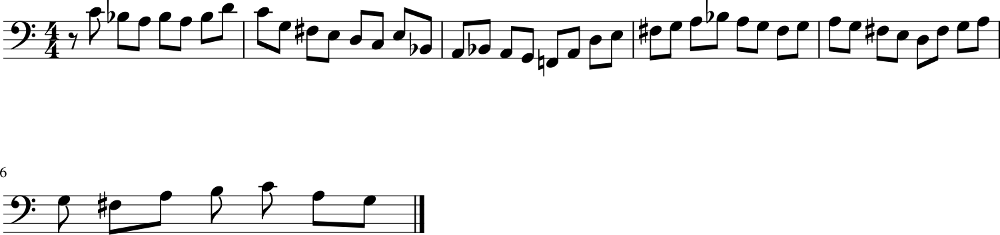

107/107 [==============================] - 65s 608ms/step - loss: 2.6949 - note_outputs_loss: 2.1575 - duration_outputs_loss: 0.5374
Epoch 28/5000
107/107 [==============================] - ETA: 0s - loss: 2.6983 - note_outputs_loss: 2.1524 - duration_outputs_loss: 0.5459[['START', '3/4TS', '3/4TS', 'A3', 'C4', 'B3', 'A3', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'C3', 'B2', 'A2', 'G2', 'B2', 'D3', 'A2', 'G2', 'B2', 'C#3', 'D3', 'E3', 'F#3', 'G3', 'A3', 'F#3', 'D3', 'E3', 'F#3', 'G3', 'A3', 'F#3', 'G3', 'A3', 'F#3', 'D3', 'D3', 'D3', 'D3', 'D3', 'B2', 'D3', 'A2', 'D3', 'B2', 'B2'], ['0.0', '0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


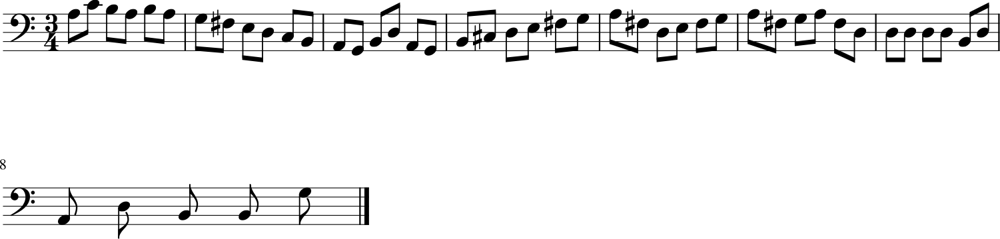

107/107 [==============================] - 65s 604ms/step - loss: 2.6983 - note_outputs_loss: 2.1524 - duration_outputs_loss: 0.5459
Epoch 29/5000
107/107 [==============================] - ETA: 0s - loss: 2.6645 - note_outputs_loss: 2.1322 - duration_outputs_loss: 0.5323[['START', '3/4TS', '3/4TS', 'C4', 'B3', 'A3', 'G3', 'F#3', 'G3', 'A3', 'F#3', 'G3', 'A3', 'F#3', 'G3', 'A3', 'D3', 'F#3', 'A3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'G3', 'A3', 'B3', 'G3', 'G2', 'B3', 'E3', 'G3', 'F#3', 'G3', 'D3', 'G2', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'G3', 'A3', 'B3', 'G3', 'F#3', 'E3', 'D3'], ['0.0', '0.0', '0.0', '1.0', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


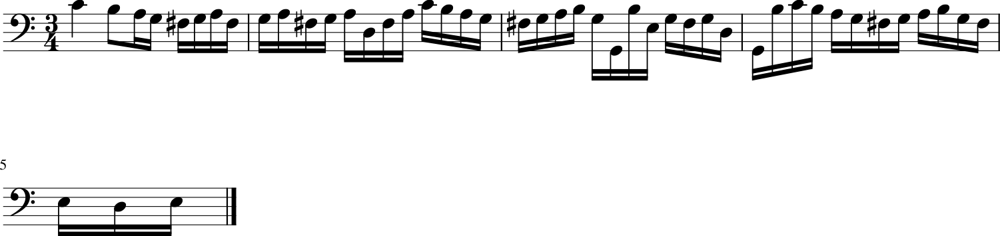

107/107 [==============================] - 66s 614ms/step - loss: 2.6645 - note_outputs_loss: 2.1322 - duration_outputs_loss: 0.5323
Epoch 30/5000
107/107 [==============================] - ETA: 0s - loss: 2.6770 - note_outputs_loss: 2.1338 - duration_outputs_loss: 0.5432[['START', '3/4TS', '3/4TS', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'A3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'C4', 'B-3', 'C4', 'A3', 'B-3', 'A3', 'G3', 'F#3', 'G3', 'F#3', 'G3', 'A3', 'B-3', 'C4', 'B-3', 'C4', 'D4', 'C4', 'A3', 'B-3', 'A3', 'B-3', 'C4', 'A3', 'F#3', 'G3', 'A3', 'B-3', 'C4', 'A3', 'G3', 'F3'], ['0.0', '0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


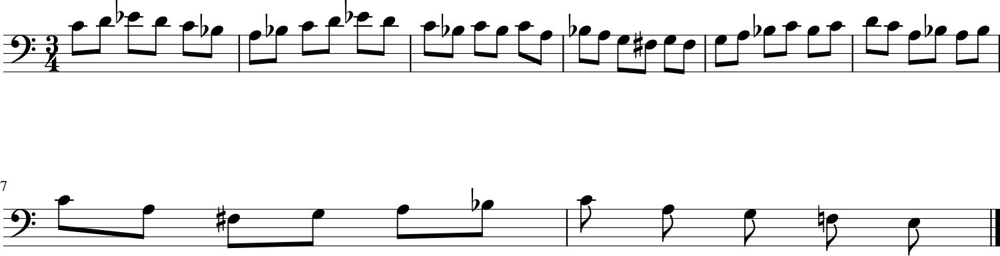

107/107 [==============================] - 65s 604ms/step - loss: 2.6770 - note_outputs_loss: 2.1338 - duration_outputs_loss: 0.5432
Epoch 31/5000
107/107 [==============================] - ETA: 0s - loss: 2.6419 - note_outputs_loss: 2.1054 - duration_outputs_loss: 0.5365[['START', '3/4TS', 'rest', 'rest', 'E-3', 'A4', 'A4', 'A4', 'F#4', 'E4', 'G4', 'F#4', 'G4', 'F#4', 'E4', 'D4', 'E4', 'F#4', 'E4', 'D4', 'E4', 'F#4', 'G4', 'F#4', 'E4', 'F#4', 'E4', 'E4', 'E4', 'E4', 'E4', 'E4', 'F#4', 'E4', 'E4', 'E4', 'E4', 'F#4', 'E4', 'D4', 'C4', 'B3', 'A3', 'B3', 'C4', 'B3', 'C4', 'B3', 'A3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


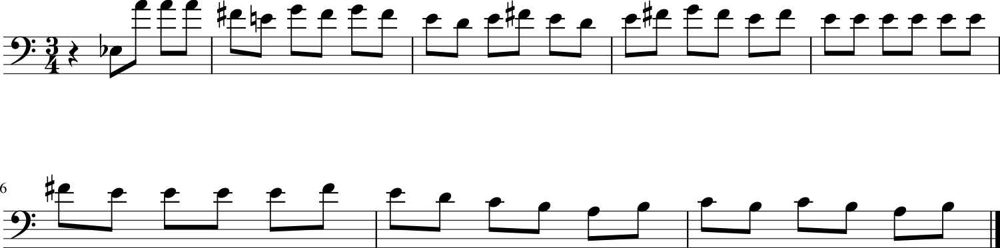

107/107 [==============================] - 65s 603ms/step - loss: 2.6419 - note_outputs_loss: 2.1054 - duration_outputs_loss: 0.5365
Epoch 32/5000
107/107 [==============================] - ETA: 0s - loss: 2.6464 - note_outputs_loss: 2.1111 - duration_outputs_loss: 0.5353[['START', '4/4TS', '3/8TS', 'rest', 'D4', 'D4', 'C4', 'B3', 'C4', 'B3', 'G#3', 'B3', 'C4', 'D4', 'B3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'D3', 'E-3', 'C3', 'B2', 'C3', 'D3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G3', 'B-3'], ['0.0', '0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


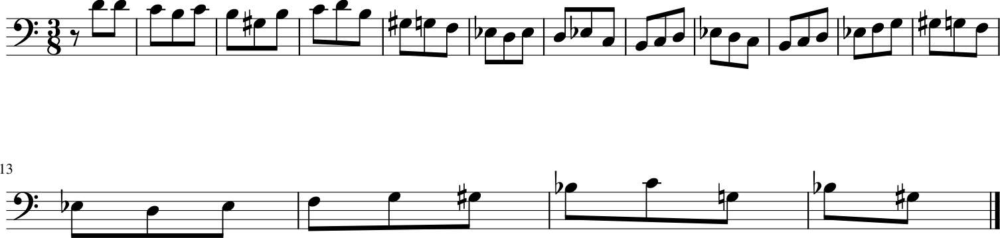

107/107 [==============================] - 65s 606ms/step - loss: 2.6464 - note_outputs_loss: 2.1111 - duration_outputs_loss: 0.5353
Epoch 33/5000
107/107 [==============================] - ETA: 0s - loss: 2.6156 - note_outputs_loss: 2.0864 - duration_outputs_loss: 0.5292[['START', '3/4TS', '4/4TS', 'rest', 'G3', 'C4', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'B-2', 'G#2', 'G2', 'F2', 'G3', 'F3', 'G3'], ['0.0', '0.0', '0.0', '2.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


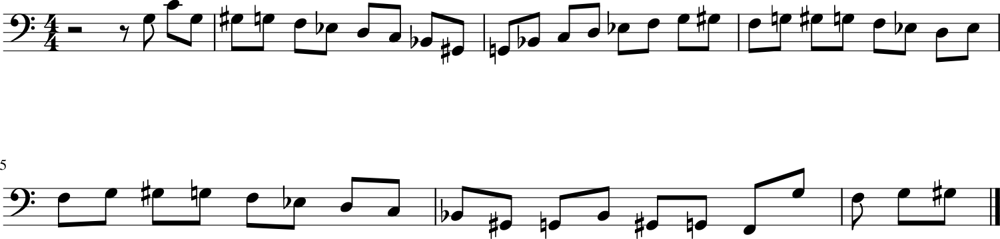

107/107 [==============================] - 65s 609ms/step - loss: 2.6156 - note_outputs_loss: 2.0864 - duration_outputs_loss: 0.5292
Epoch 34/5000
107/107 [==============================] - ETA: 0s - loss: 2.6075 - note_outputs_loss: 2.0674 - duration_outputs_loss: 0.5401[['START', 'E-:major', '3/4TS', 'B-3', 'A3', 'B-3', 'C4', 'B-3', 'A3', 'G3', 'F3', 'E3', 'F3', 'G3', 'E-3', 'F3', 'E-3', 'D3', 'C3', 'D3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'E-3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2'], ['0.0', '0.0', '0.0', '1.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


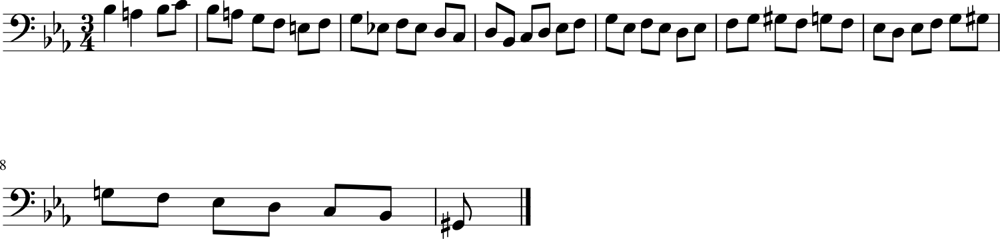

107/107 [==============================] - 65s 611ms/step - loss: 2.6075 - note_outputs_loss: 2.0674 - duration_outputs_loss: 0.5401
Epoch 35/5000
107/107 [==============================] - ETA: 0s - loss: 2.5945 - note_outputs_loss: 2.0542 - duration_outputs_loss: 0.5402[['START', '3/4TS', 'rest', 'C4', 'B3', 'A3', 'G3', 'F#3', 'G3', 'A3', 'B3', 'C4', 'A3', 'B3', 'C4', 'A3', 'B3', 'A3', 'G3', 'F#3', 'G3', 'A3', 'F#3', 'E3', 'F#3', 'G3', 'A3', 'B3', 'C4', 'E3', 'F#3', 'G3', 'A3', 'B3', 'C4', 'A3', 'F#3', 'G3', 'A3', 'F#3', 'A3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'G3', 'E3', 'F#3'], ['0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


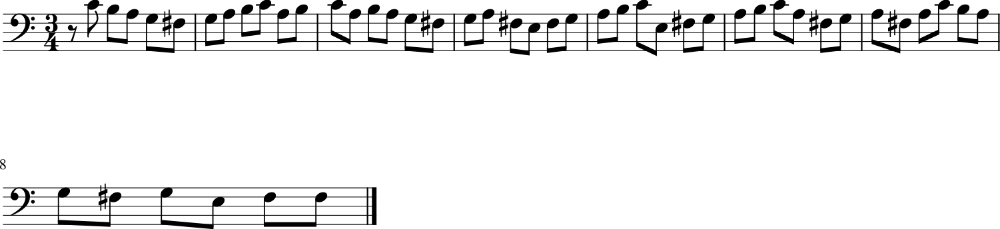

107/107 [==============================] - 65s 605ms/step - loss: 2.5945 - note_outputs_loss: 2.0542 - duration_outputs_loss: 0.5402
Epoch 36/5000
107/107 [==============================] - ETA: 0s - loss: 2.5802 - note_outputs_loss: 2.0431 - duration_outputs_loss: 0.5371[['START', 'C:major', '3/4TS', 'rest', 'C4', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'C3', 'B2', 'A2', 'B2', 'C3', 'D3', 'E3', 'F#3', 'A3', 'G3', 'F#3', 'D3', 'B2', 'A2', 'B2', 'G2', 'B2', 'D3', 'A2', 'B2', 'G2', 'B2', 'D3', 'E2', 'B2', 'C#3', 'D3', 'E3', 'F#3', 'G3', 'A3', 'B3', 'A3', 'G3', 'F#3', 'E3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


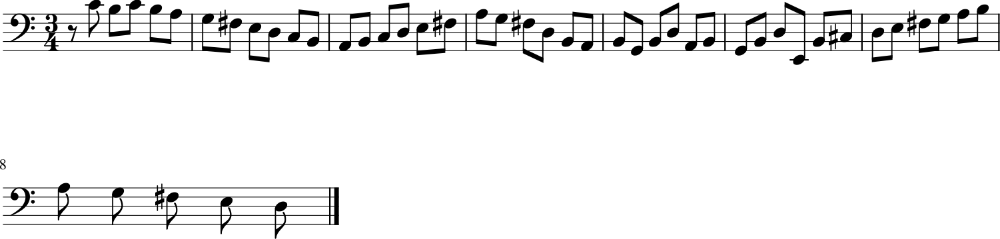

107/107 [==============================] - 65s 609ms/step - loss: 2.5802 - note_outputs_loss: 2.0431 - duration_outputs_loss: 0.5371
Epoch 37/5000
107/107 [==============================] - ETA: 0s - loss: 2.5522 - note_outputs_loss: 2.0215 - duration_outputs_loss: 0.5307[['START', '3/4TS', 'G3', 'E-3', 'G3', 'C4', 'B-3', 'G#3', 'B-3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'E-3', 'C3', 'D3', 'F3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'C3', 'B2', 'C3', 'D3', 'C3', 'D3', 'E-3', 'F3', 'G3'], ['0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


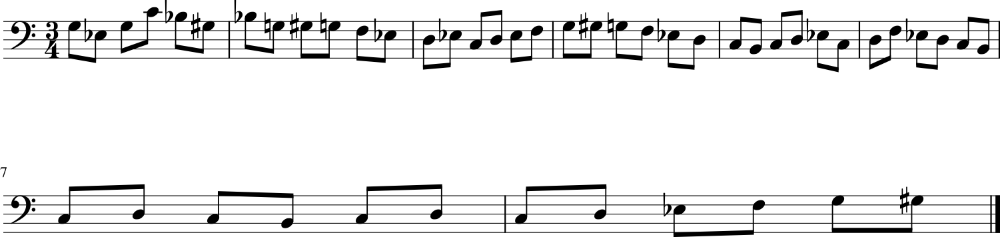

107/107 [==============================] - 65s 608ms/step - loss: 2.5522 - note_outputs_loss: 2.0215 - duration_outputs_loss: 0.5307
Epoch 38/5000
107/107 [==============================] - ETA: 0s - loss: 2.5581 - note_outputs_loss: 2.0262 - duration_outputs_loss: 0.5319[['START', '3/4TS', '3/4TS', 'G3', 'G2', 'C4', 'B3', 'G3', 'F#3', 'E3', 'D3', 'C3', 'D3', 'E3', 'F#3', 'G3', 'A3', 'B3', 'A3', 'G3', 'F#3', 'G3', 'A3', 'B3', 'G3', 'D3', 'E3', 'G3', 'C4', 'D3', 'C4', 'E3', 'D3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'G3', 'D3', 'F#3', 'G3', 'A3', 'B3', 'G3', 'D3', 'G2', 'G3', 'A3'], ['0.0', '0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


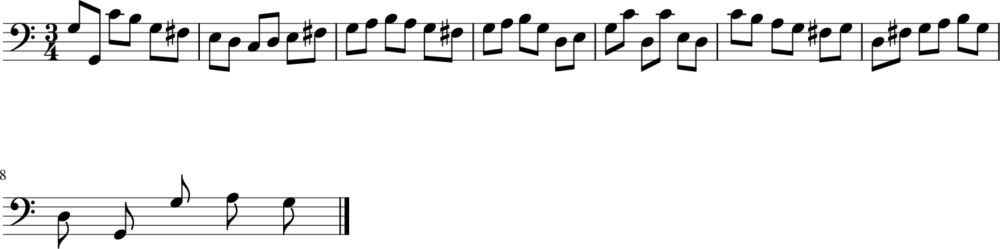

107/107 [==============================] - 65s 607ms/step - loss: 2.5581 - note_outputs_loss: 2.0262 - duration_outputs_loss: 0.5319
Epoch 39/5000
107/107 [==============================] - ETA: 0s - loss: 2.5356 - note_outputs_loss: 1.9973 - duration_outputs_loss: 0.5382[['START', '3/4TS', 'rest'], ['0.0', '0.0', '2.5']]


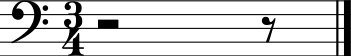

107/107 [==============================] - 62s 578ms/step - loss: 2.5356 - note_outputs_loss: 1.9973 - duration_outputs_loss: 0.5382
Epoch 40/5000
107/107 [==============================] - ETA: 0s - loss: 2.5346 - note_outputs_loss: 2.0043 - duration_outputs_loss: 0.5303WARNING:tensorflow:5 out of the last 105 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7f44bbfaa830> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
[['START', '3/4TS', 'rest', 

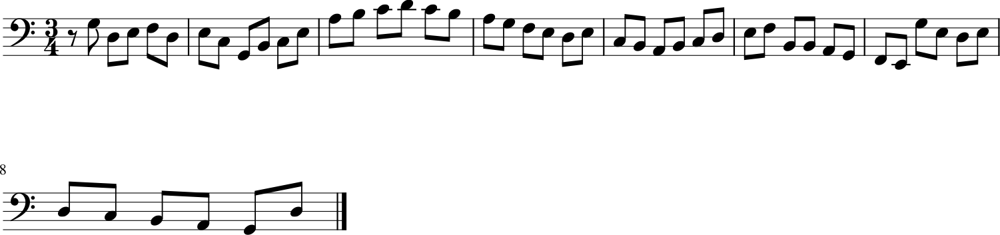

107/107 [==============================] - 65s 607ms/step - loss: 2.5346 - note_outputs_loss: 2.0043 - duration_outputs_loss: 0.5303
Epoch 41/5000
107/107 [==============================] - ETA: 0s - loss: 2.5186 - note_outputs_loss: 1.9839 - duration_outputs_loss: 0.5347[['START', '3/4TS', 'G2', 'G3', 'E3', 'C3', 'G2', 'B2', 'C3', 'G2', 'B2', 'D3', 'G2', 'B2', 'D3', 'G2', 'B2', 'G2', 'B2', 'D3', 'G3', 'E3', 'G2', 'C3', 'G2', 'B2', 'G2', 'E3', 'C3', 'G2', 'C4', 'C4', 'A3', 'C4', 'B3', 'A3', 'G3', 'A3', 'A3', 'A3', 'G3', 'A3', 'A3', 'A3', 'A3', 'B3', 'C4', 'A3', 'B3'], ['0.0', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3', '1/3']]


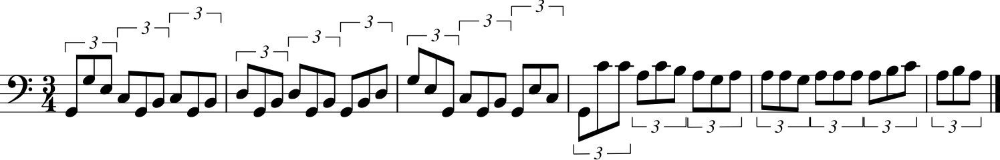

107/107 [==============================] - 66s 615ms/step - loss: 2.5186 - note_outputs_loss: 1.9839 - duration_outputs_loss: 0.5347
Epoch 42/5000
107/107 [==============================] - ETA: 0s - loss: 2.4991 - note_outputs_loss: 1.9613 - duration_outputs_loss: 0.5377[['START', '3/4TS', 'rest', 'C4', 'C4', 'B3', 'C4', 'D4', 'B3', 'C4', 'D4', 'B3', 'A3', 'B3', 'C4', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'G3', 'A3', 'F#3', 'G3', 'A3', 'B3', 'C4', 'A3', 'G3', 'F#3', 'G3', 'A3', 'B3', 'C4', 'D4', 'B3', 'G3', 'E3', 'G3', 'F#3', 'G3', 'E3', 'G3', 'F#3', 'G3', 'D3', 'E3', 'F#3'], ['0.0', '3.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


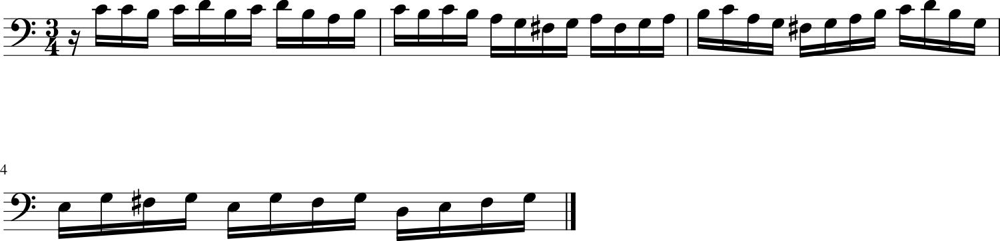

107/107 [==============================] - 65s 612ms/step - loss: 2.4991 - note_outputs_loss: 1.9613 - duration_outputs_loss: 0.5377
Epoch 43/5000
107/107 [==============================] - ETA: 0s - loss: 2.4908 - note_outputs_loss: 1.9546 - duration_outputs_loss: 0.5363[['START', 'C:major', '3/4TS', 'C4', 'C4', 'B-3', 'A3', 'G3', 'A3', 'B-3', 'C4', 'A3', 'B-3', 'G3', 'A3', 'G3', 'A3', 'B-3', 'D4', 'C4', 'B-3', 'A3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'A2', 'B-2', 'C3', 'A2', 'B-2', 'D3', 'G3', 'A3', 'G3', 'A3', 'B-3', 'G3', 'A3', 'A3', 'G3', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3'], ['0.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


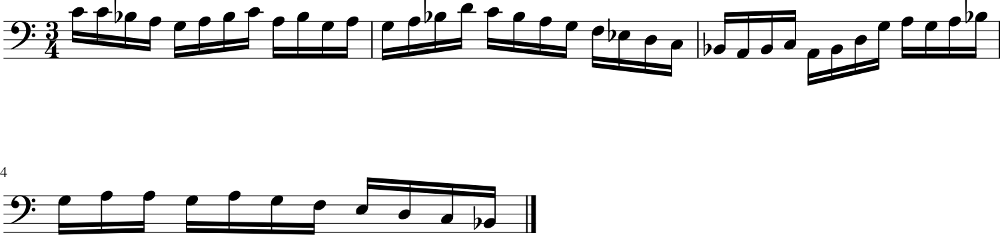

107/107 [==============================] - 65s 612ms/step - loss: 2.4908 - note_outputs_loss: 1.9546 - duration_outputs_loss: 0.5363
Epoch 44/5000
107/107 [==============================] - ETA: 0s - loss: 2.4838 - note_outputs_loss: 1.9430 - duration_outputs_loss: 0.5408[['START', '3/4TS', 'C4', 'rest'], ['0.0', '1.0', '0.5', '0.5']]


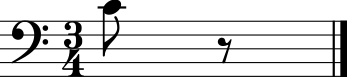

107/107 [==============================] - 62s 577ms/step - loss: 2.4838 - note_outputs_loss: 1.9430 - duration_outputs_loss: 0.5408
Epoch 45/5000
107/107 [==============================] - ETA: 0s - loss: 2.4618 - note_outputs_loss: 1.9298 - duration_outputs_loss: 0.5320[['START', '3/4TS', '3/4TS', 'C4', 'D4', 'B3', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'B2', 'C3', 'D3', 'E3', 'C3', 'F2', 'A3', 'A3', 'G3', 'A3', 'A3', 'B-3', 'D3', 'G3', 'F3', 'E3', 'D3', 'C#3', 'B2', 'A2', 'B2', 'C#3', 'D3', 'E3', 'F#3', 'G3', 'A3', 'G3', 'A3', 'B3', 'C#4', 'D4', 'E4', 'F#4', 'E4', 'D4', 'C#4'], ['0.0', '0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


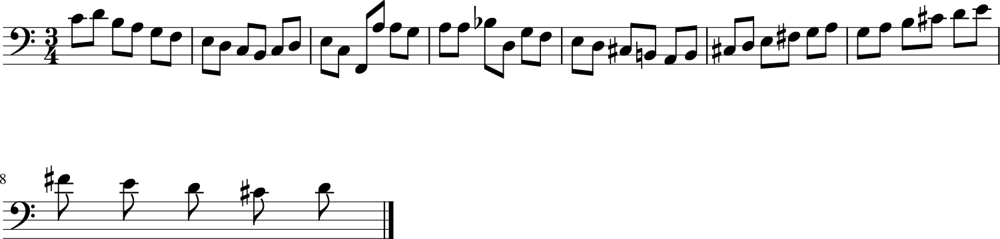

107/107 [==============================] - 65s 610ms/step - loss: 2.4618 - note_outputs_loss: 1.9298 - duration_outputs_loss: 0.5320
Epoch 46/5000
107/107 [==============================] - ETA: 0s - loss: 2.4497 - note_outputs_loss: 1.9138 - duration_outputs_loss: 0.5360[['START', 'C:major', '3/4TS', 'rest', 'D4', 'D4', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'B2', 'A2', 'C3', 'E3', 'F#3', 'G3', 'A2', 'G2', 'F#3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'G3', 'A3', 'B3', 'C4', 'D4', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'C3', 'D3', 'C3', 'B2', 'A2', 'G2', 'D3', 'E3'], ['0.0', '0.0', '0.0', '2.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


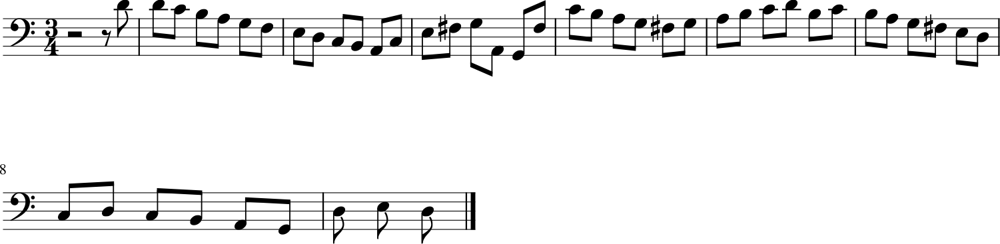

107/107 [==============================] - 66s 614ms/step - loss: 2.4497 - note_outputs_loss: 1.9138 - duration_outputs_loss: 0.5360
Epoch 47/5000
107/107 [==============================] - ETA: 0s - loss: 2.4326 - note_outputs_loss: 1.8963 - duration_outputs_loss: 0.5363[['START', '4/4TS', '3/8TS', 'rest', 'B3', 'E-3', 'C4', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2', 'G#3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


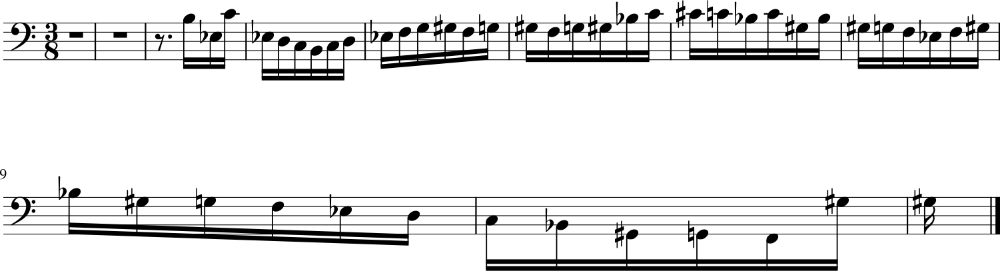

107/107 [==============================] - 65s 607ms/step - loss: 2.4326 - note_outputs_loss: 1.8963 - duration_outputs_loss: 0.5363
Epoch 48/5000
107/107 [==============================] - ETA: 0s - loss: 2.4135 - note_outputs_loss: 1.8808 - duration_outputs_loss: 0.5327[['START', '3/4TS', 'rest'], ['0.0', '0.5', '0.5']]


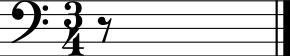

107/107 [==============================] - 62s 581ms/step - loss: 2.4135 - note_outputs_loss: 1.8808 - duration_outputs_loss: 0.5327
Epoch 49/5000
107/107 [==============================] - ETA: 0s - loss: 2.4158 - note_outputs_loss: 1.8778 - duration_outputs_loss: 0.5380WARNING:tensorflow:5 out of the last 105 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7f44bbfaaf80> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
[['START', '3/4TS', 'rest'],

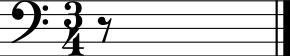

107/107 [==============================] - 62s 584ms/step - loss: 2.4158 - note_outputs_loss: 1.8778 - duration_outputs_loss: 0.5380
Epoch 50/5000
107/107 [==============================] - ETA: 0s - loss: 2.4056 - note_outputs_loss: 1.8616 - duration_outputs_loss: 0.5441[['START', 'E-:major', '4/4TS', 'rest', 'B-3', 'C4', 'C#4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'C3', 'D3', 'E-3', 'F3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


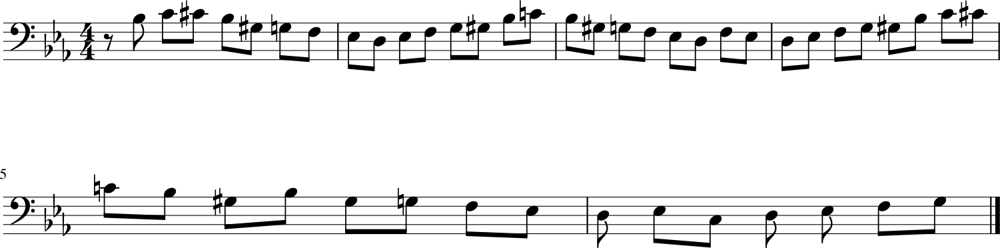

107/107 [==============================] - 65s 611ms/step - loss: 2.4056 - note_outputs_loss: 1.8616 - duration_outputs_loss: 0.5441
Epoch 51/5000
107/107 [==============================] - ETA: 0s - loss: 2.3763 - note_outputs_loss: 1.8427 - duration_outputs_loss: 0.5336[['START', '4/4TS', 'rest'], ['0.0', '0.0', '2.5']]


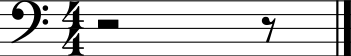

107/107 [==============================] - 62s 582ms/step - loss: 2.3763 - note_outputs_loss: 1.8427 - duration_outputs_loss: 0.5336
Epoch 52/5000
107/107 [==============================] - ETA: 0s - loss: 2.3737 - note_outputs_loss: 1.8435 - duration_outputs_loss: 0.5302[['START', '4/4TS', 'rest'], ['0.0', '0.0', '5.5']]


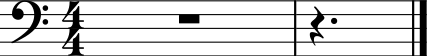

107/107 [==============================] - 63s 586ms/step - loss: 2.3737 - note_outputs_loss: 1.8435 - duration_outputs_loss: 0.5302
Epoch 53/5000
107/107 [==============================] - ETA: 0s - loss: 2.3583 - note_outputs_loss: 1.8236 - duration_outputs_loss: 0.5348[['START', 'E-:major', '3/4TS', 'B-3', 'G3', 'B-3', 'E-3', 'B-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2', 'G2', 'E-3', 'C4', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'E-3', 'C3', 'D3', 'B-2', 'G#2', 'G2', 'G#2', 'B-2', 'C3', 'D3'], ['0.0', '0.0', '0.0', '5.5', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


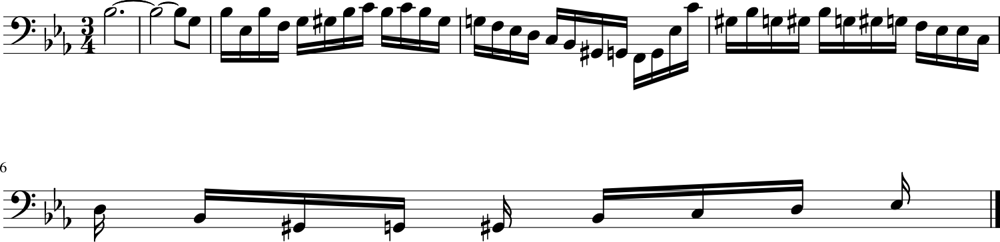

107/107 [==============================] - 65s 611ms/step - loss: 2.3583 - note_outputs_loss: 1.8236 - duration_outputs_loss: 0.5348
Epoch 54/5000
107/107 [==============================] - ETA: 0s - loss: 2.3538 - note_outputs_loss: 1.8187 - duration_outputs_loss: 0.5351[['START', '3/4TS', 'rest', 'D4', 'rest'], ['0.0', '0.25', '0.25', '0.25', '0.25']]


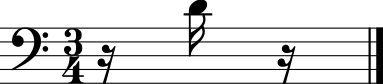

107/107 [==============================] - 63s 585ms/step - loss: 2.3538 - note_outputs_loss: 1.8187 - duration_outputs_loss: 0.5351
Epoch 55/5000
107/107 [==============================] - ETA: 0s - loss: 2.3468 - note_outputs_loss: 1.8075 - duration_outputs_loss: 0.5393[['START', '4/4TS', 'rest'], ['0.0', '0.0', '0.5']]


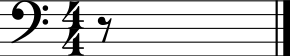

107/107 [==============================] - 62s 582ms/step - loss: 2.3468 - note_outputs_loss: 1.8075 - duration_outputs_loss: 0.5393
Epoch 56/5000
107/107 [==============================] - ETA: 0s - loss: 2.3265 - note_outputs_loss: 1.7903 - duration_outputs_loss: 0.5362[['START', '3/4TS', 'rest', 'C4', 'C4', 'C4', 'C4', 'B-3', 'G#3', 'B-3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'B-3', 'G#3', 'B-3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'E-2', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'A3', 'B-3', 'G3', 'A3', 'G3', 'F3', 'E3', 'F3', 'F3', 'D3', 'E3', 'F3', 'G3', 'E3', 'F3', 'D3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


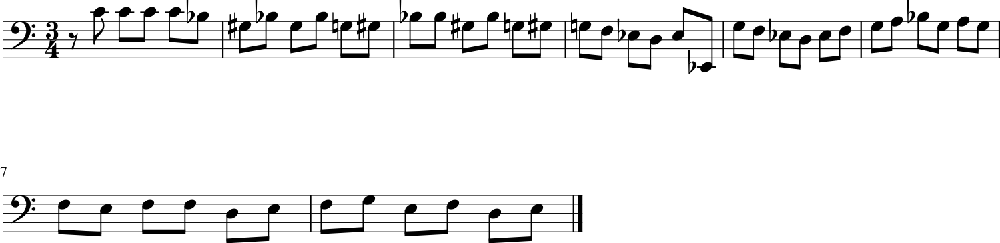

107/107 [==============================] - 66s 617ms/step - loss: 2.3265 - note_outputs_loss: 1.7903 - duration_outputs_loss: 0.5362
Epoch 57/5000
107/107 [==============================] - ETA: 0s - loss: 2.3220 - note_outputs_loss: 1.7844 - duration_outputs_loss: 0.5376[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'C4', 'C4', 'rest'], ['0.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


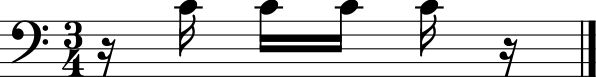

107/107 [==============================] - 65s 610ms/step - loss: 2.3220 - note_outputs_loss: 1.7844 - duration_outputs_loss: 0.5376
Epoch 58/5000
107/107 [==============================] - ETA: 0s - loss: 2.2976 - note_outputs_loss: 1.7658 - duration_outputs_loss: 0.5318[['START', 'D:major', '3/4TS', 'D3', 'E3', 'F#3', 'D3', 'E3', 'F#3', 'D3', 'E3', 'F#3', 'G3', 'A3', 'B3', 'C4', 'A3', 'C4', 'B3', 'A3', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'E3', 'F#3', 'D3', 'E3', 'F#3', 'D3', 'F#3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


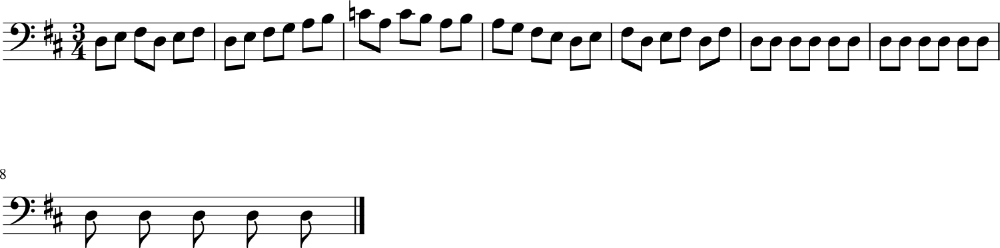

107/107 [==============================] - 69s 642ms/step - loss: 2.2976 - note_outputs_loss: 1.7658 - duration_outputs_loss: 0.5318
Epoch 59/5000
107/107 [==============================] - ETA: 0s - loss: 2.3053 - note_outputs_loss: 1.7710 - duration_outputs_loss: 0.5343[['START', '3/4TS', 'rest'], ['0.0', '0.5', '0.5']]


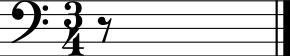

107/107 [==============================] - 65s 607ms/step - loss: 2.3053 - note_outputs_loss: 1.7710 - duration_outputs_loss: 0.5343
Epoch 60/5000
107/107 [==============================] - ETA: 0s - loss: 2.2850 - note_outputs_loss: 1.7446 - duration_outputs_loss: 0.5403[['START', 'E-:major', '4/4TS', 'rest', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'B-2', 'E-2', 'B-3', 'B-3', 'G3', 'B-3', 'E-3', 'G3', 'B-2', 'E-2', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-2', 'E-2', 'G#3', 'G3', 'F3'], ['0.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '0.5', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


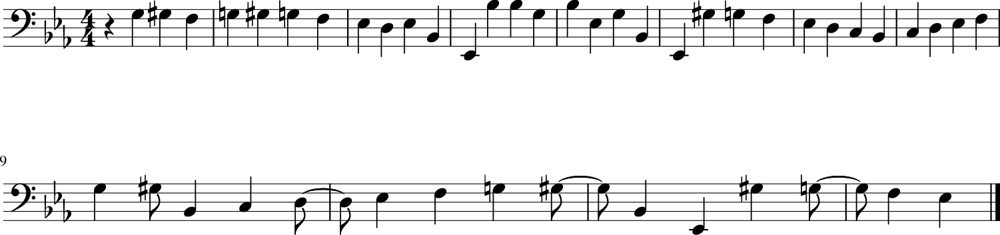

107/107 [==============================] - 66s 614ms/step - loss: 2.2850 - note_outputs_loss: 1.7446 - duration_outputs_loss: 0.5403
Epoch 61/5000
107/107 [==============================] - ETA: 0s - loss: 2.2761 - note_outputs_loss: 1.7345 - duration_outputs_loss: 0.5416[['START', 'E-:major', '3/2TS', 'E-3', 'B-2', 'C3', 'D3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'E-3', 'E-2', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'F3', 'G3', 'E-3', 'C3', 'D3', 'E-3', 'F3', 'G3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


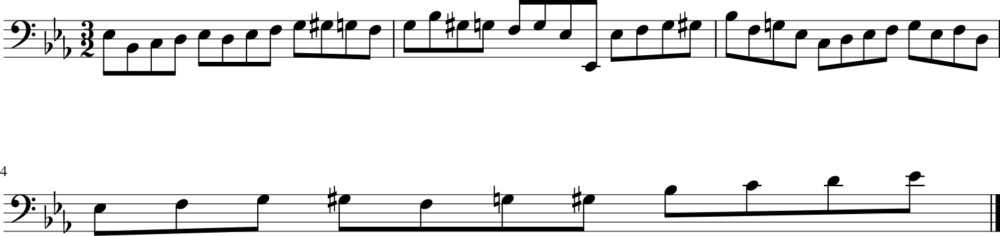

107/107 [==============================] - 65s 609ms/step - loss: 2.2761 - note_outputs_loss: 1.7345 - duration_outputs_loss: 0.5416
Epoch 62/5000
107/107 [==============================] - ETA: 0s - loss: 2.2656 - note_outputs_loss: 1.7291 - duration_outputs_loss: 0.5366[['START', 'D:major', '3/4TS', 'C4', 'B3', 'A3', 'B3', 'C4', 'B3', 'C4', 'A3', 'B3', 'A3', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'C3', 'B2', 'G2', 'B2', 'D3', 'G3', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'C3', 'B2', 'G2', 'B2', 'D3', 'G3', 'B2', 'G2', 'B3', 'A3', 'G3', 'F#3', 'G3', 'E3'], ['0.0', '0.0', '0.0', '2.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


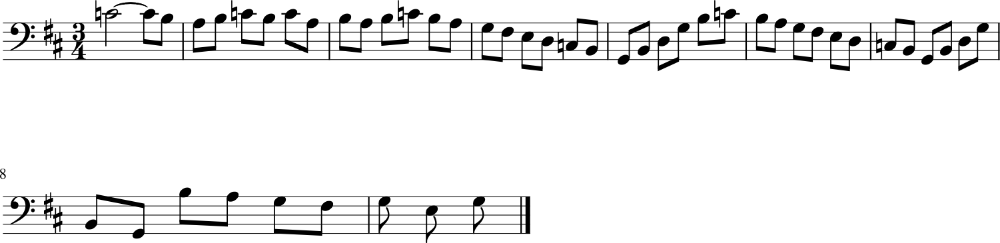

107/107 [==============================] - 65s 612ms/step - loss: 2.2656 - note_outputs_loss: 1.7291 - duration_outputs_loss: 0.5366
Epoch 63/5000
107/107 [==============================] - ETA: 0s - loss: 2.2545 - note_outputs_loss: 1.7212 - duration_outputs_loss: 0.5332[['START', 'E-:major', '4/4TS', 'rest', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'B-3', 'G3', 'G#3', 'B-3', 'C4', 'C#4', 'G3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'C3', 'D3', 'C3', 'B-2', 'D3', 'G#2', 'G2'], ['0.0', '0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


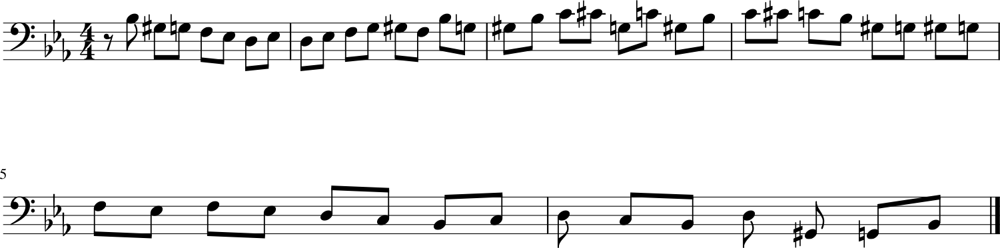

107/107 [==============================] - 66s 616ms/step - loss: 2.2545 - note_outputs_loss: 1.7212 - duration_outputs_loss: 0.5332
Epoch 64/5000
107/107 [==============================] - ETA: 0s - loss: 2.2463 - note_outputs_loss: 1.7080 - duration_outputs_loss: 0.5383[['START', '3/4TS', 'rest', 'C4', 'rest', 'C4', 'rest', 'D4', 'rest'], ['0.0', '0.0', '5.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


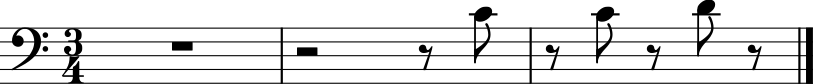

107/107 [==============================] - 62s 583ms/step - loss: 2.2463 - note_outputs_loss: 1.7080 - duration_outputs_loss: 0.5383
Epoch 65/5000
107/107 [==============================] - ETA: 0s - loss: 2.2384 - note_outputs_loss: 1.7021 - duration_outputs_loss: 0.5362[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'E-3', 'E-2', 'C3', 'B2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'E-3', 'C3', 'B-2', 'G#2', 'G2', 'G#2', 'G2', 'G#2', 'F2', 'E-2', 'E-4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'B-2', 'E-2', 'G#3', 'G3', 'F3', 'E-3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


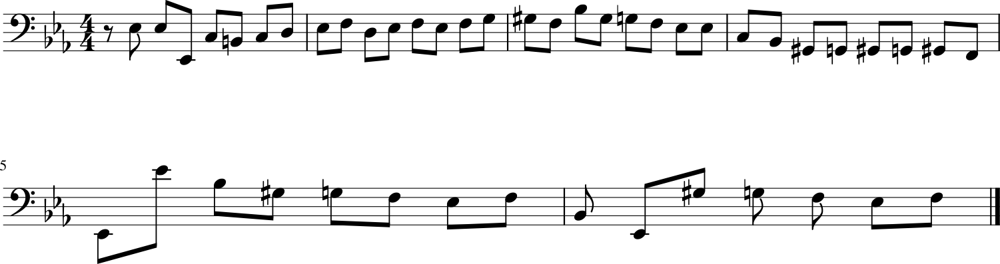

107/107 [==============================] - 65s 606ms/step - loss: 2.2384 - note_outputs_loss: 1.7021 - duration_outputs_loss: 0.5362
Epoch 66/5000
107/107 [==============================] - ETA: 0s - loss: 2.2307 - note_outputs_loss: 1.6855 - duration_outputs_loss: 0.5452[['START', 'F:major', '3/4TS', 'rest', 'A3', 'A3', 'B-3', 'G3', 'A3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'A3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'G#2', 'B-2', 'C3', 'D3', 'E-3', 'C#4', 'G#2', 'C4'], ['0.0', '0.0', '0.0', '3.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


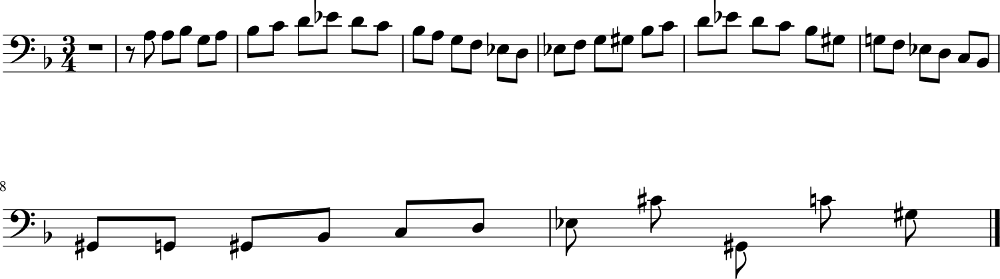

107/107 [==============================] - 65s 608ms/step - loss: 2.2307 - note_outputs_loss: 1.6855 - duration_outputs_loss: 0.5452
Epoch 67/5000
107/107 [==============================] - ETA: 0s - loss: 2.2327 - note_outputs_loss: 1.6857 - duration_outputs_loss: 0.5470[['START', 'F:major', '3/8TS', 'rest', 'D4', 'D4', 'G#3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'G#2', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'G#3', 'G3', 'G#3'], ['0.0', '0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


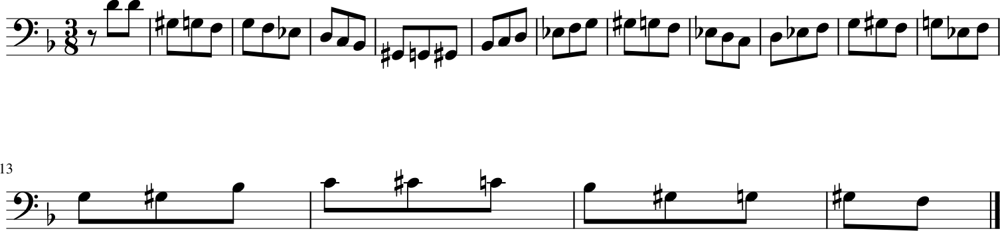

107/107 [==============================] - 66s 616ms/step - loss: 2.2327 - note_outputs_loss: 1.6857 - duration_outputs_loss: 0.5470
Epoch 68/5000
107/107 [==============================] - ETA: 0s - loss: 2.2141 - note_outputs_loss: 1.6759 - duration_outputs_loss: 0.5382[['START', 'E-:major', '3/4TS', 'rest', 'E-3', 'rest', 'E-3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'E-3', 'D3', 'E-3', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'A3', 'B-3', 'C4', 'A3', 'B-3', 'C4', 'A3', 'F3', 'E3', 'D3', 'F4', 'E4', 'C4', 'D4', 'C4', 'D4', 'C4', 'B-3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


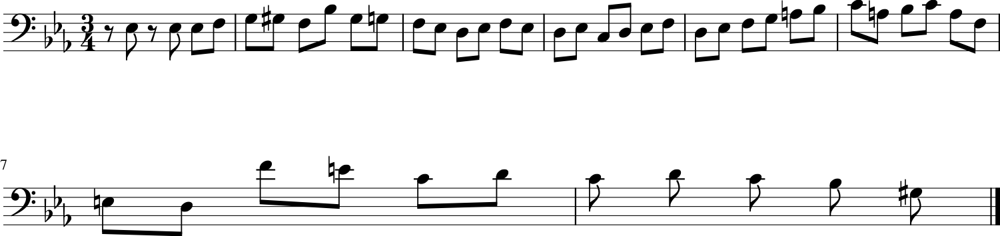

107/107 [==============================] - 65s 607ms/step - loss: 2.2141 - note_outputs_loss: 1.6759 - duration_outputs_loss: 0.5382
Epoch 69/5000
107/107 [==============================] - ETA: 0s - loss: 2.1946 - note_outputs_loss: 1.6552 - duration_outputs_loss: 0.5394[['START', 'E-:major', '4/4TS', 'rest', 'B-3', 'C4', 'C#4', 'B-3', 'C4', 'D4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'D4', 'F4', 'E-4', 'D4', 'C4', 'B-3', 'E-4', 'A3', 'G3', 'A3', 'A3', 'B-3', 'C4', 'A3', 'B-3', 'C4', 'D4'], ['0.0', '0.0', '0.0', '3.0', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


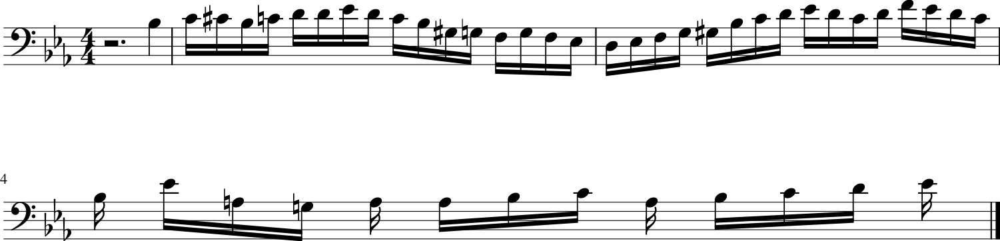

107/107 [==============================] - 65s 611ms/step - loss: 2.1946 - note_outputs_loss: 1.6552 - duration_outputs_loss: 0.5394
Epoch 70/5000
107/107 [==============================] - ETA: 0s - loss: 2.1932 - note_outputs_loss: 1.6525 - duration_outputs_loss: 0.5407[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'E-3', 'B-2', 'C3', 'G#2', 'G2', 'F2', 'G#2', 'D3', 'F3', 'D3', 'E-3', 'C3', 'B2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


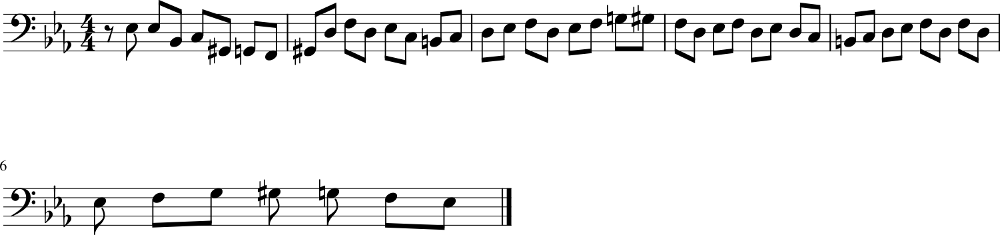

107/107 [==============================] - 65s 604ms/step - loss: 2.1932 - note_outputs_loss: 1.6525 - duration_outputs_loss: 0.5407
Epoch 71/5000
107/107 [==============================] - ETA: 0s - loss: 2.1802 - note_outputs_loss: 1.6437 - duration_outputs_loss: 0.5365[['START', 'F:major', '3/4TS', '3/4TS', 'B-3', 'G#3', 'G3', 'F3', 'E3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'D4', 'B-3', 'E-4', 'D4', 'C4', 'D4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2', 'G#3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2'], ['0.0', '0.0', '0.0', '0.0', '2.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


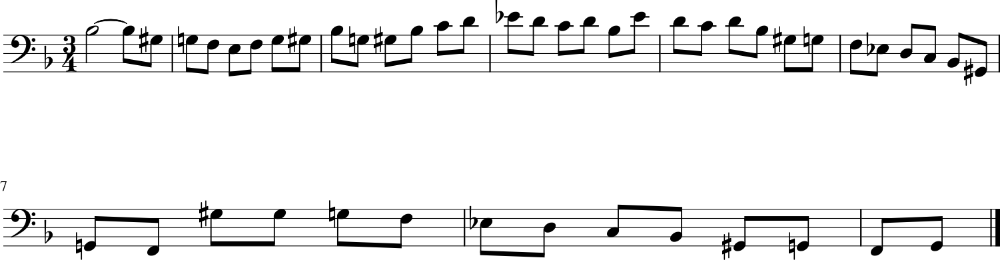

107/107 [==============================] - 65s 608ms/step - loss: 2.1802 - note_outputs_loss: 1.6437 - duration_outputs_loss: 0.5365
Epoch 72/5000
107/107 [==============================] - ETA: 0s - loss: 2.1750 - note_outputs_loss: 1.6364 - duration_outputs_loss: 0.5386[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'E-3', 'D3', 'E-3', 'E-2', 'E-4', 'B-3', 'G3', 'B-3', 'E-3', 'B-3', 'F3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3'], ['0.0', '0.0', '0.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


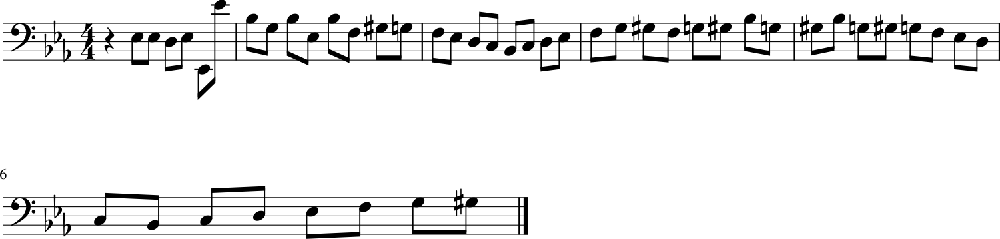

107/107 [==============================] - 65s 605ms/step - loss: 2.1750 - note_outputs_loss: 1.6364 - duration_outputs_loss: 0.5386
Epoch 73/5000
107/107 [==============================] - ETA: 0s - loss: 2.1799 - note_outputs_loss: 1.6396 - duration_outputs_loss: 0.5403[['START', 'F:major', 'rest', 'B-3', 'G2', 'G#2', 'F2', 'G2', 'G#2', 'F2', 'G2', 'G#2', 'F2', 'G#2', 'C#3', 'C3', 'B2', 'D3', 'G#2', 'G2', 'F2', 'G#3', 'G3', 'G#3', 'F3', 'F3', 'E-3', 'D3', 'E-3', 'G3', 'E-3', 'G#2', 'G3', 'D3', 'E-3', 'G#2', 'F3', 'D3', 'E-3', 'C3', 'B2', 'G#2', 'G2', 'F2', 'E-2', 'G2', 'B2', 'D3', 'F3'], ['0.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '1.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


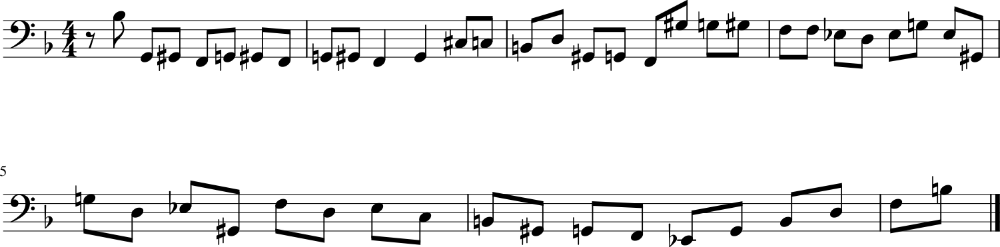

107/107 [==============================] - 65s 605ms/step - loss: 2.1799 - note_outputs_loss: 1.6396 - duration_outputs_loss: 0.5403
Epoch 74/5000
107/107 [==============================] - ETA: 0s - loss: 2.1626 - note_outputs_loss: 1.6239 - duration_outputs_loss: 0.5388[['START', 'C:major', '3/4TS', 'C4', 'B3', 'A3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'C3', 'B2', 'A2', 'G2', 'D3', 'E3', 'F3', 'G3', 'A3', 'B3', 'C4', 'G3', 'E4', 'D4', 'E4', 'F4', 'D4', 'E4', 'F4', 'E4', 'D4', 'C4', 'B3', 'A3', 'B3', 'C4', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'C3', 'B2'], ['0.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


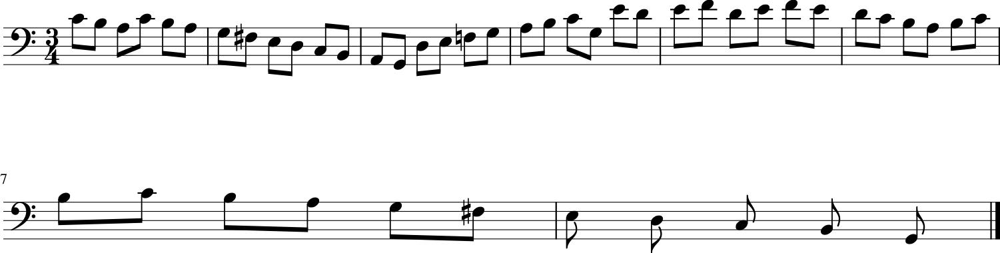

107/107 [==============================] - 65s 603ms/step - loss: 2.1626 - note_outputs_loss: 1.6239 - duration_outputs_loss: 0.5388
Epoch 75/5000
107/107 [==============================] - ETA: 0s - loss: 2.1613 - note_outputs_loss: 1.6156 - duration_outputs_loss: 0.5457[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'C3', 'B2', 'C3', 'D3', 'E-3', 'D3', 'E-3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


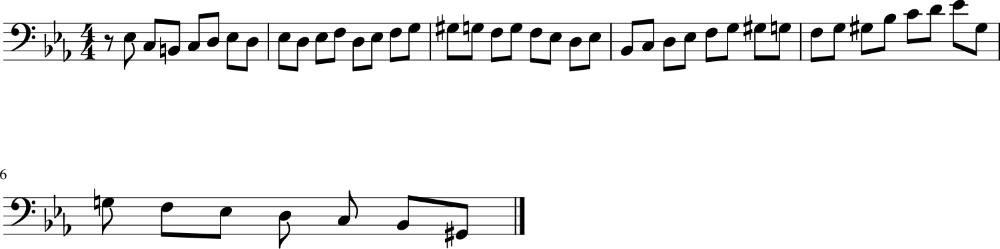

107/107 [==============================] - 65s 606ms/step - loss: 2.1613 - note_outputs_loss: 1.6156 - duration_outputs_loss: 0.5457
Epoch 76/5000
107/107 [==============================] - ETA: 0s - loss: 2.1471 - note_outputs_loss: 1.6070 - duration_outputs_loss: 0.5401[['START', 'E-:major', '4/4TS', 'rest', 'B-3', 'E-4', 'G2', 'F2', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'G3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


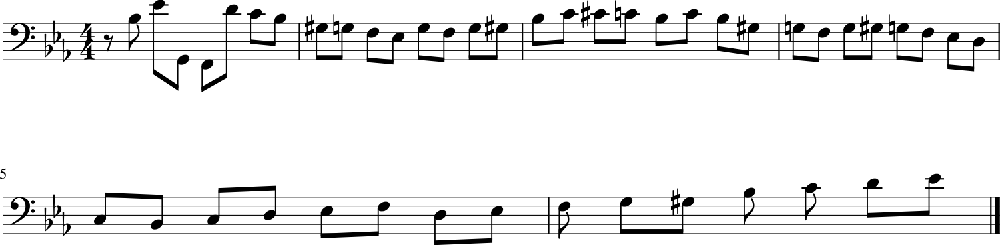

107/107 [==============================] - 65s 605ms/step - loss: 2.1471 - note_outputs_loss: 1.6070 - duration_outputs_loss: 0.5401
Epoch 77/5000
107/107 [==============================] - ETA: 0s - loss: 2.1385 - note_outputs_loss: 1.6003 - duration_outputs_loss: 0.5382[['START', 'C:major', '3/8TS', '3/4TS', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G2', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'F3', 'F2', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'E-3', 'F3', 'D3'], ['0.0', '0.0', '0.0', '0.0', '2.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


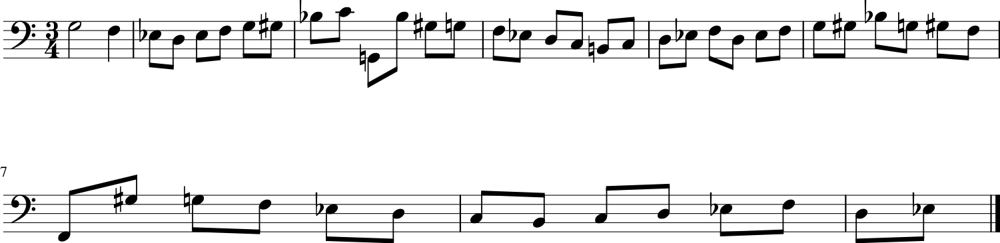

107/107 [==============================] - 65s 603ms/step - loss: 2.1385 - note_outputs_loss: 1.6003 - duration_outputs_loss: 0.5382
Epoch 78/5000
107/107 [==============================] - ETA: 0s - loss: 2.1197 - note_outputs_loss: 1.5788 - duration_outputs_loss: 0.5409[['START', '4/4TS', 'rest', 'G3', 'B3', 'A3', 'G3', 'F#3', 'G3', 'E3', 'F#3', 'G3', 'E3', 'F#3', 'G3', 'A3', 'B3', 'E3', 'B2', 'E-3', 'E2', 'E3', 'D3', 'C3', 'B2', 'G#3', 'B3', 'D4', 'C4', 'B3', 'A3', 'B3', 'A3', 'G#3', 'A3', 'E3', 'A3', 'G#3', 'A3', 'E3', 'A3', 'B3', 'A3', 'G#3', 'A3', 'E3', 'A3', 'E3', 'A3'], ['0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


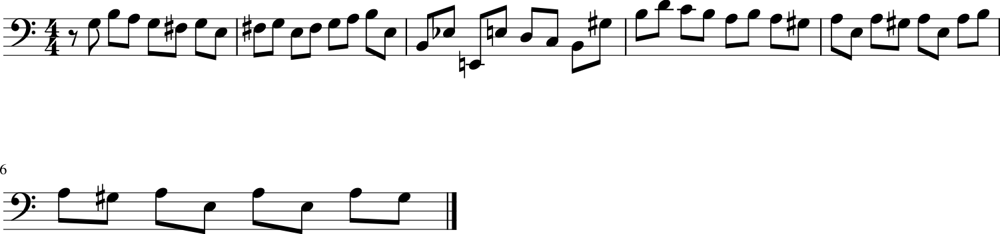

107/107 [==============================] - 65s 609ms/step - loss: 2.1197 - note_outputs_loss: 1.5788 - duration_outputs_loss: 0.5409
Epoch 79/5000
107/107 [==============================] - ETA: 0s - loss: 2.1261 - note_outputs_loss: 1.5881 - duration_outputs_loss: 0.5380[['START', 'E-:major', '3/2TS', 'D2', 'B-3', 'G3', 'B-3', 'E-3', 'B-3', 'C4', 'G#3', 'B-3', 'G3', 'G#3', 'G3', 'G#3', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'D3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'E-3', 'D3', 'C3'], ['0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


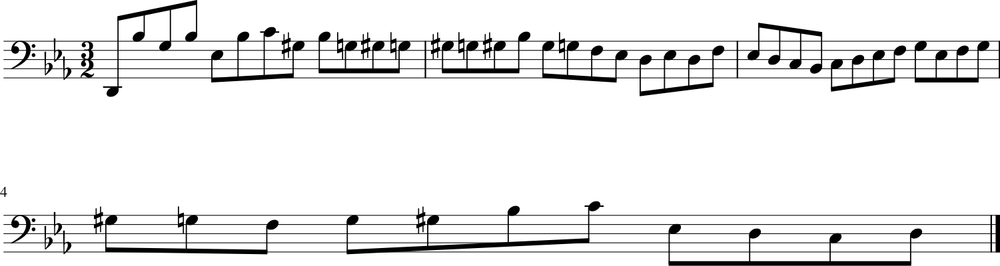

107/107 [==============================] - 65s 607ms/step - loss: 2.1261 - note_outputs_loss: 1.5881 - duration_outputs_loss: 0.5380
Epoch 80/5000
107/107 [==============================] - ETA: 0s - loss: 2.1178 - note_outputs_loss: 1.5740 - duration_outputs_loss: 0.5438[['START', 'C:major', '3/4TS', 'C4', 'C4', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'B2', 'C3', 'E3', 'A3', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'C3', 'B2', 'A2', 'G2', 'F#2', 'A3', 'B3', 'A3', 'G3', 'F#3', 'G3', 'E3', 'F#3', 'D3', 'C3', 'B2', 'G2', 'B2', 'D3', 'G3', 'F#3', 'G3', 'A3', 'F#3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


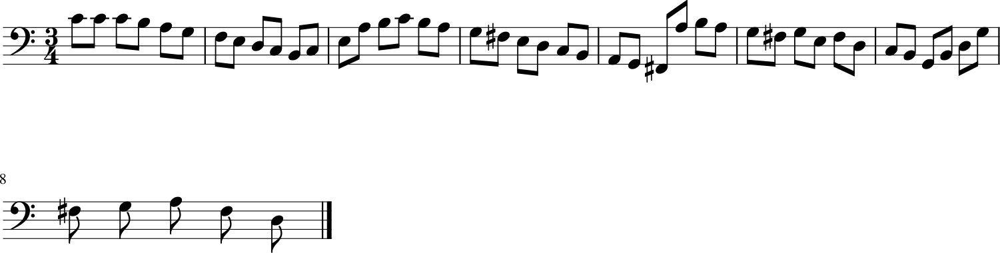

107/107 [==============================] - 65s 609ms/step - loss: 2.1178 - note_outputs_loss: 1.5740 - duration_outputs_loss: 0.5438
Epoch 81/5000
107/107 [==============================] - ETA: 0s - loss: 2.1158 - note_outputs_loss: 1.5742 - duration_outputs_loss: 0.5416[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'G#2'], ['0.0', '0.0', '0.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


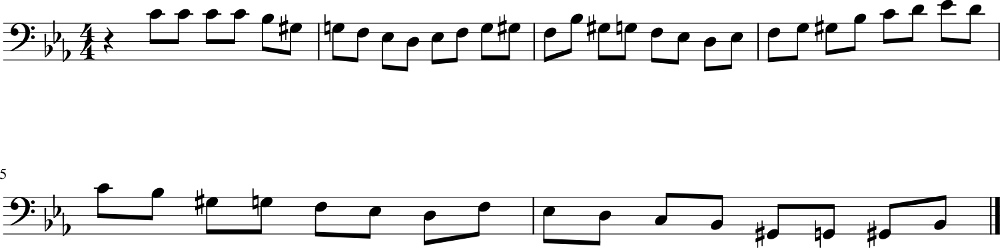

107/107 [==============================] - 65s 609ms/step - loss: 2.1158 - note_outputs_loss: 1.5742 - duration_outputs_loss: 0.5416
Epoch 82/5000
107/107 [==============================] - ETA: 0s - loss: 2.1005 - note_outputs_loss: 1.5605 - duration_outputs_loss: 0.5400[['START', 'F:major', '3/8TS', 'rest', 'A3', 'D4', 'A3', 'F3', 'D3', 'F3', 'A2', 'B-2', 'D3', 'F3', 'B-3', 'A3', 'B-3', 'G3', 'A3', 'F3', 'G3', 'A3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'A3', 'B-3', 'C4', 'B-3', 'C4', 'B-3', 'A3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4'], ['0.0', '0.0', '0.0', '2.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


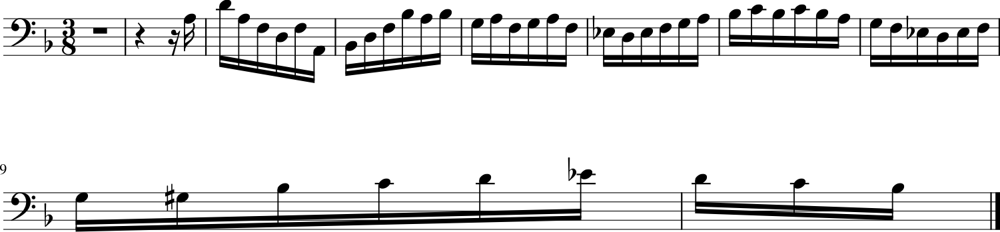

107/107 [==============================] - 66s 613ms/step - loss: 2.1005 - note_outputs_loss: 1.5605 - duration_outputs_loss: 0.5400
Epoch 83/5000
107/107 [==============================] - ETA: 0s - loss: 2.1036 - note_outputs_loss: 1.5642 - duration_outputs_loss: 0.5394[['START', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'G2', 'B2', 'D3', 'G3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'B-3', 'E-4', 'E-3', 'E-3', 'F3', 'B-2', 'B-3', 'E-3', 'C3'], ['0.0', '0.0', '1.0', '0.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


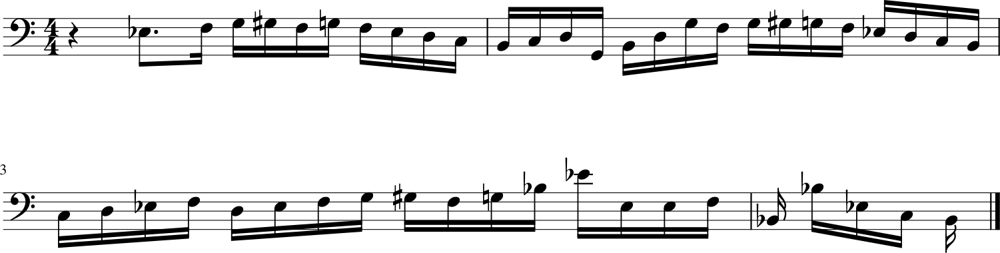

107/107 [==============================] - 65s 606ms/step - loss: 2.1036 - note_outputs_loss: 1.5642 - duration_outputs_loss: 0.5394
Epoch 84/5000
107/107 [==============================] - ETA: 0s - loss: 2.0875 - note_outputs_loss: 1.5480 - duration_outputs_loss: 0.5395[['START', 'E-:major', '4/4TS', 'rest', 'B-3', 'C4', 'C#4', 'B-3', 'C4', 'C#4', 'B-3', 'F#3', 'G3', 'A3', 'B-2', 'A2', 'F#3', 'B3', 'E-3', 'D3', 'C3', 'B2', 'G2', 'D3', 'F#3', 'A3', 'C4', 'D4', 'B3', 'G3', 'D3', 'E3', 'G3', 'A3', 'B3', 'C4', 'A3', 'D4', 'B3', 'G3', 'D3', 'B2', 'D3', 'A2', 'G2', 'D3', 'E3', 'D3', 'E3'], ['0.0', '0.0', '0.0', '3.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


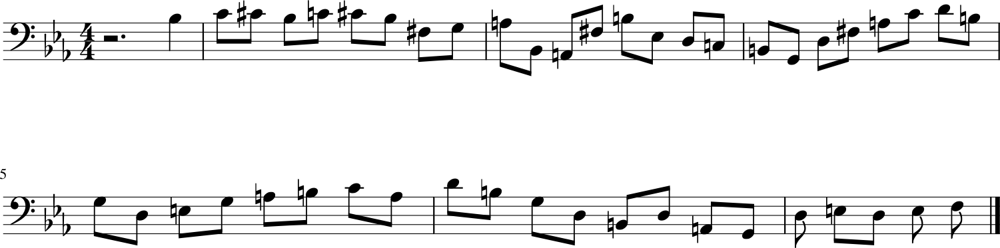

107/107 [==============================] - 65s 607ms/step - loss: 2.0875 - note_outputs_loss: 1.5480 - duration_outputs_loss: 0.5395
Epoch 85/5000
107/107 [==============================] - ETA: 0s - loss: 2.0832 - note_outputs_loss: 1.5415 - duration_outputs_loss: 0.5417[['START', '4/4TS', 'rest', 'D4', 'rest', 'D4', 'rest', 'D4', 'rest', 'D4', 'rest', 'D4', 'rest', 'D4', 'rest', 'D4', 'rest', 'G3', 'rest'], ['0.0', '0.0', '2.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


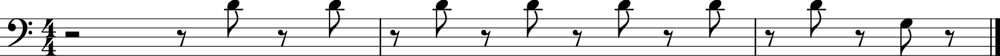

107/107 [==============================] - 63s 586ms/step - loss: 2.0832 - note_outputs_loss: 1.5415 - duration_outputs_loss: 0.5417
Epoch 86/5000
107/107 [==============================] - ETA: 0s - loss: 2.0871 - note_outputs_loss: 1.5464 - duration_outputs_loss: 0.5407[['START', '4/4TS', 'rest'], ['0.0', '0.0', '0.5']]


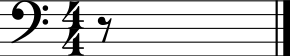

107/107 [==============================] - 62s 580ms/step - loss: 2.0871 - note_outputs_loss: 1.5464 - duration_outputs_loss: 0.5407
Epoch 87/5000
107/107 [==============================] - ETA: 0s - loss: 2.0712 - note_outputs_loss: 1.5288 - duration_outputs_loss: 0.5424[['START', 'E-:major', '4/4TS', 'rest', 'E-4', 'C4', 'G3', 'G#3', 'G3', 'G#3', 'G3', 'G#3', 'G3', 'C4', 'G3', 'C4', 'G3', 'C4', 'G3', 'C4', 'G3', 'C4', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'G3', 'C4', 'G3', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'E-3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-2', 'C3'], ['0.0', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


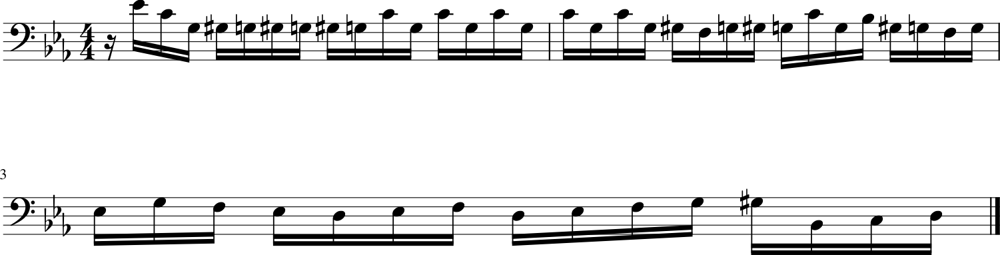

107/107 [==============================] - 65s 612ms/step - loss: 2.0712 - note_outputs_loss: 1.5288 - duration_outputs_loss: 0.5424
Epoch 88/5000
107/107 [==============================] - ETA: 0s - loss: 2.0824 - note_outputs_loss: 1.5325 - duration_outputs_loss: 0.5499[['START', '3/4TS', 'rest', 'C4', 'D3', 'F3', 'D3', 'E3', 'F3', 'D3', 'E3', 'F3', 'G3', 'A3', 'B-3', 'G3', 'A3', 'F3', 'E3', 'F3', 'G3', 'A3', 'F3', 'D3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'C4', 'F3', 'E-3', 'D3', 'E-3', 'C3', 'B-2', 'C3', 'D3', 'E-3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


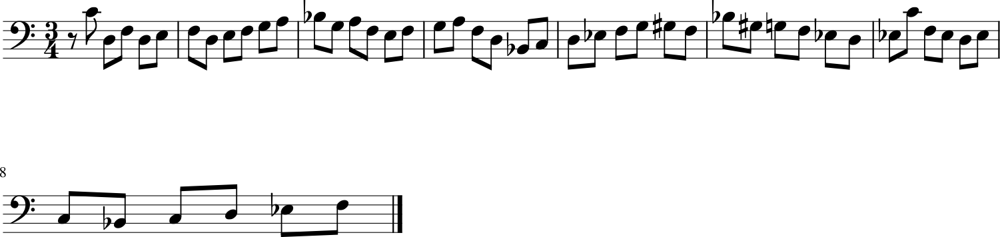

107/107 [==============================] - 65s 604ms/step - loss: 2.0824 - note_outputs_loss: 1.5325 - duration_outputs_loss: 0.5499
Epoch 89/5000
107/107 [==============================] - ETA: 0s - loss: 2.0708 - note_outputs_loss: 1.5260 - duration_outputs_loss: 0.5448[['START', '3/8TS', 'rest', 'G3', 'G3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'G3'], ['0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


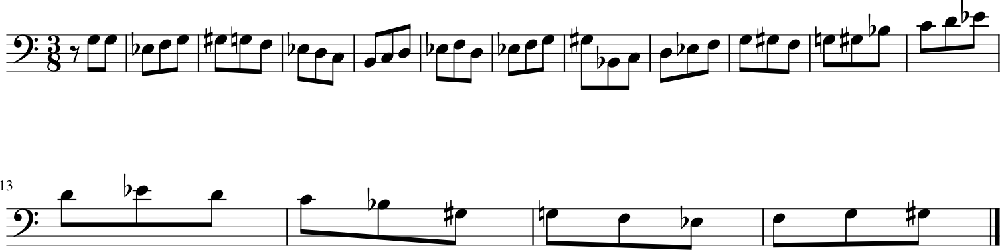

107/107 [==============================] - 65s 609ms/step - loss: 2.0708 - note_outputs_loss: 1.5260 - duration_outputs_loss: 0.5448
Epoch 90/5000
107/107 [==============================] - ETA: 0s - loss: 2.0644 - note_outputs_loss: 1.5230 - duration_outputs_loss: 0.5414[['START', '4/4TS', 'rest', 'G3', 'D4', 'E4', 'C#4', 'D4', 'E4', 'F4', 'E4', 'D4', 'E4', 'F4', 'D4', 'E4', 'C4', 'C4', 'E4', 'C4', 'B3', 'A3', 'B3', 'C4', 'A3', 'G3', 'F#3', 'E3', 'D3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'C3', 'B2', 'A2', 'G2', 'F#2', 'E2', 'D2', 'E4', 'E4', 'E4', 'C#4', 'A3', 'E3'], ['0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


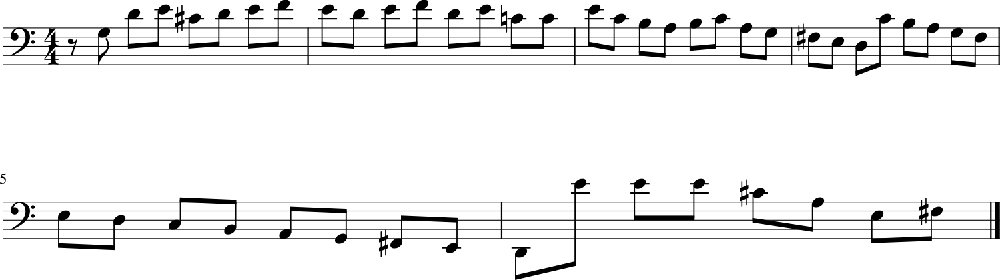

107/107 [==============================] - 65s 609ms/step - loss: 2.0644 - note_outputs_loss: 1.5230 - duration_outputs_loss: 0.5414
Epoch 91/5000
107/107 [==============================] - ETA: 0s - loss: 2.0534 - note_outputs_loss: 1.5120 - duration_outputs_loss: 0.5414[['START', 'E-:major', '4/4TS', 'rest', 'G3', 'C4', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'F3', 'F2', 'C4', 'G#3', 'B-3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'G3', 'C4', 'G#3', 'E-3', 'G#3', 'G3', 'G#3', 'B-3', 'G3', 'F3', 'E-3', 'G#3', 'D3', 'B-3', 'G#3', 'G3', 'F3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


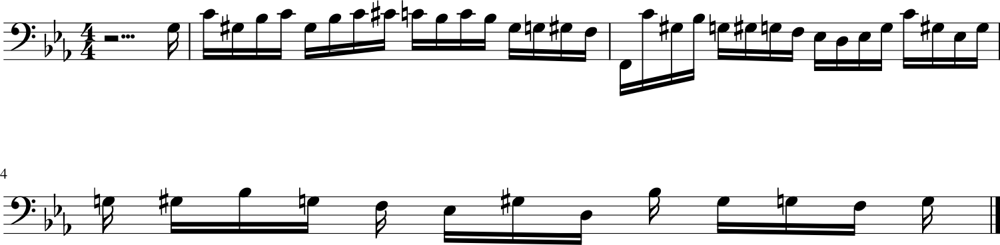

107/107 [==============================] - 66s 615ms/step - loss: 2.0534 - note_outputs_loss: 1.5120 - duration_outputs_loss: 0.5414
Epoch 92/5000
107/107 [==============================] - ETA: 0s - loss: 2.0394 - note_outputs_loss: 1.4991 - duration_outputs_loss: 0.5403[['START', 'C:major', '3/4TS', 'C4', 'B3', 'A3', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'C3', 'B2', 'A2', 'G2', 'D3', 'F#3', 'A3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'D3', 'D3', 'E3', 'D3', 'C#3', 'D3', 'E3', 'F#3', 'E3', 'F#3', 'E3', 'D3', 'C#3', 'D3', 'E3', 'F#3', 'E3', 'F#3', 'E3', 'D3', 'E3'], ['0.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


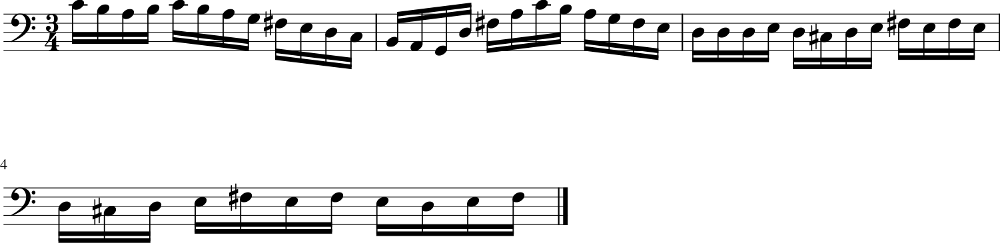

107/107 [==============================] - 66s 614ms/step - loss: 2.0394 - note_outputs_loss: 1.4991 - duration_outputs_loss: 0.5403
Epoch 93/5000
107/107 [==============================] - ETA: 0s - loss: 2.0300 - note_outputs_loss: 1.4863 - duration_outputs_loss: 0.5437[['START', '4/4TS', 'rest', 'D4', 'D4', 'C4', 'C4', 'C4', 'rest'], ['0.0', '0.0', '2.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


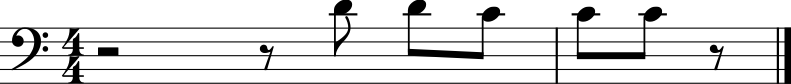

107/107 [==============================] - 62s 583ms/step - loss: 2.0300 - note_outputs_loss: 1.4863 - duration_outputs_loss: 0.5437
Epoch 94/5000
107/107 [==============================] - ETA: 0s - loss: 2.0334 - note_outputs_loss: 1.4899 - duration_outputs_loss: 0.5435[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G3', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'C3', 'D3', 'E-3', 'F3', 'G3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'E-4', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


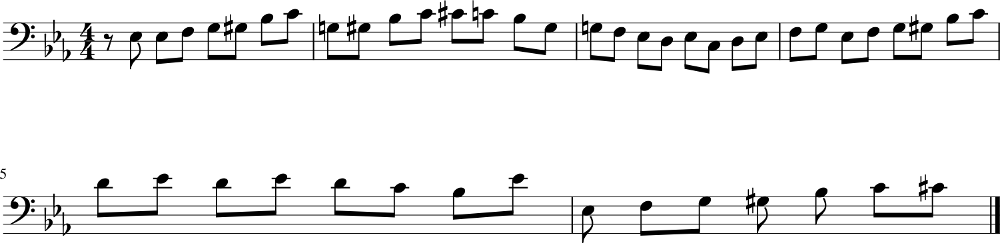

107/107 [==============================] - 65s 610ms/step - loss: 2.0334 - note_outputs_loss: 1.4899 - duration_outputs_loss: 0.5435
Epoch 95/5000
107/107 [==============================] - ETA: 0s - loss: 2.0242 - note_outputs_loss: 1.4841 - duration_outputs_loss: 0.5401[['START', 'C:major', '3/4TS', 'C4', 'B3', 'A3', 'G3', 'F#3', 'G3', 'E3', 'F#3', 'G3', 'E3', 'F#3', 'D3', 'A2', 'D2', 'A2', 'D3', 'F#3', 'A3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'G3', 'E3', 'G2', 'F#3', 'A3', 'G3', 'F#3', 'G2', 'G3', 'G2', 'G3', 'G2', 'F#3', 'G2', 'D3', 'G2', 'B2', 'G2', 'G2', 'G2', 'G2', 'B3', 'G2'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


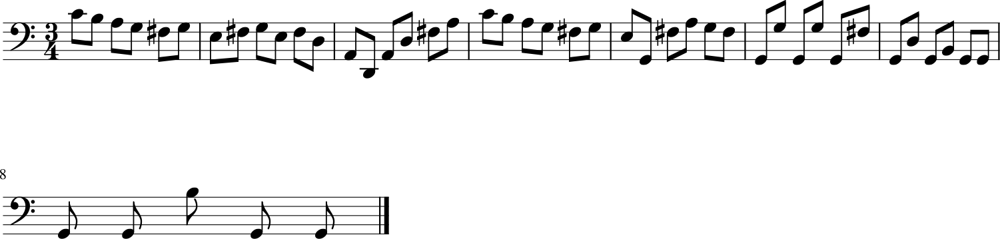

107/107 [==============================] - 65s 610ms/step - loss: 2.0242 - note_outputs_loss: 1.4841 - duration_outputs_loss: 0.5401
Epoch 96/5000
107/107 [==============================] - ETA: 0s - loss: 2.0281 - note_outputs_loss: 1.4817 - duration_outputs_loss: 0.5464[['START', 'F:major', '3/8TS', 'rest', 'A3', 'A3', 'B-3', 'B-3', 'B-3', 'A3', 'G3', 'F3', 'E3', 'F3', 'A3', 'D3', 'E3', 'F3', 'A3', 'D3', 'E3', 'F3', 'D3', 'E3', 'F3', 'G3', 'F3', 'E3', 'D3', 'E3', 'F3', 'D3', 'E3', 'F3', 'D3', 'G3', 'E3', 'F3', 'D3', 'E3', 'F3', 'D3', 'E3', 'F3', 'G3', 'F3', 'E3', 'D3', 'E3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


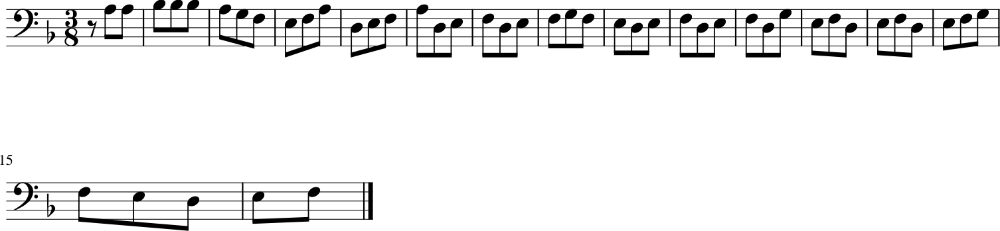

107/107 [==============================] - 65s 612ms/step - loss: 2.0281 - note_outputs_loss: 1.4817 - duration_outputs_loss: 0.5464
Epoch 97/5000
107/107 [==============================] - ETA: 0s - loss: 2.0200 - note_outputs_loss: 1.4727 - duration_outputs_loss: 0.5473[['START', '4/4TS', 'rest', 'D4', 'rest'], ['0.0', '0.5', '0.5', '0.5', '0.5']]


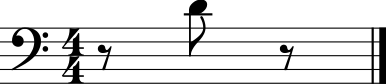

107/107 [==============================] - 63s 586ms/step - loss: 2.0200 - note_outputs_loss: 1.4727 - duration_outputs_loss: 0.5473
Epoch 98/5000
107/107 [==============================] - ETA: 0s - loss: 2.0035 - note_outputs_loss: 1.4634 - duration_outputs_loss: 0.5400[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'B-3', 'E-4', 'E-3', 'E-3', 'E-3', 'E-3', 'E-3', 'E-2', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'C4'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


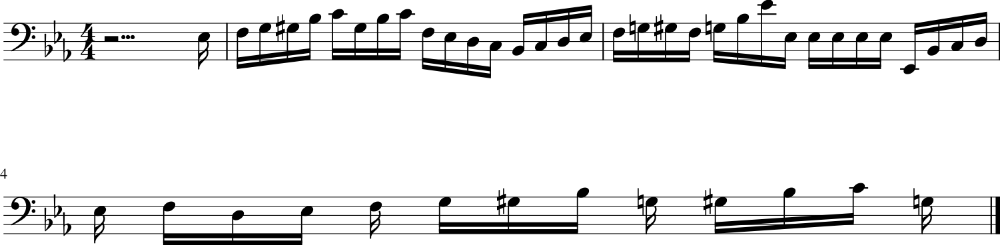

107/107 [==============================] - 65s 608ms/step - loss: 2.0035 - note_outputs_loss: 1.4634 - duration_outputs_loss: 0.5400
Epoch 99/5000
107/107 [==============================] - ETA: 0s - loss: 1.9953 - note_outputs_loss: 1.4526 - duration_outputs_loss: 0.5427[['START', 'E-:major', '4/4TS', 'rest', 'B3', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'E-4', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'F3', 'C4', 'B-3', 'G#3', 'G3', 'F3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


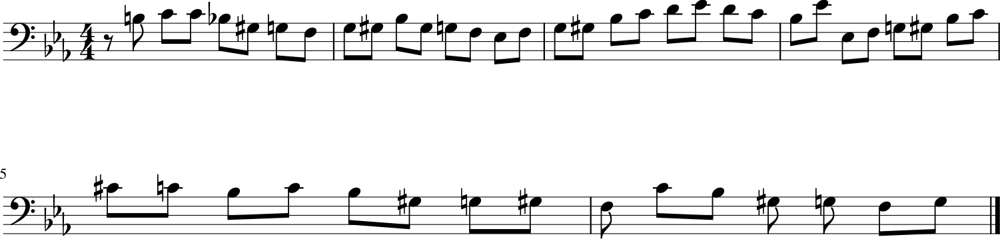

107/107 [==============================] - 66s 612ms/step - loss: 1.9953 - note_outputs_loss: 1.4526 - duration_outputs_loss: 0.5427
Epoch 100/5000
107/107 [==============================] - ETA: 0s - loss: 1.9950 - note_outputs_loss: 1.4551 - duration_outputs_loss: 0.5399[['START', '3/2TS', 'rest', 'B3', 'rest', 'B3', 'rest', 'B3', 'rest', 'B3', 'D4', 'D4', 'B3', 'G3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'G3', 'F3', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2', 'G2', 'G3', 'D3', 'E-3', 'B-3', 'D3', 'E-3', 'F3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


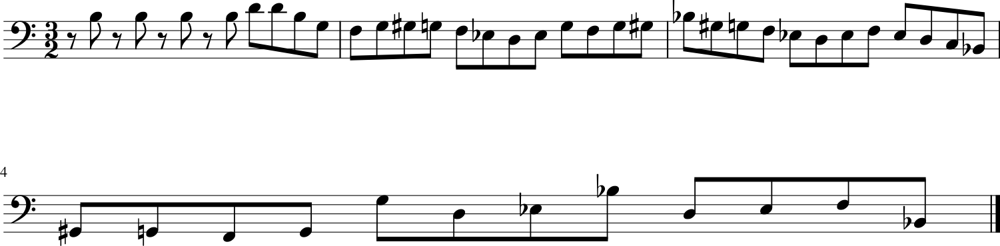

107/107 [==============================] - 65s 608ms/step - loss: 1.9950 - note_outputs_loss: 1.4551 - duration_outputs_loss: 0.5399
Epoch 101/5000
107/107 [==============================] - ETA: 0s - loss: 1.9818 - note_outputs_loss: 1.4416 - duration_outputs_loss: 0.5402[['START', '4/4TS', 'rest', 'C4', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3'], ['0.0', '3.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


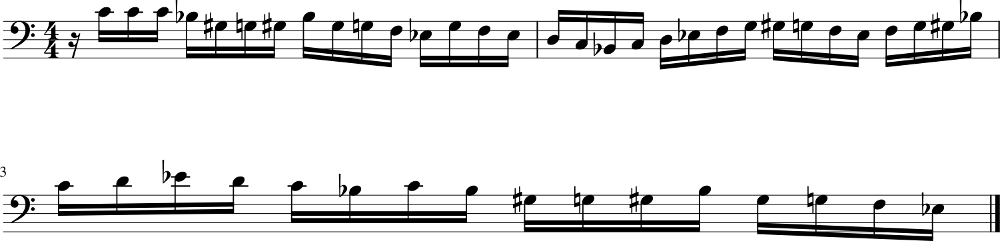

107/107 [==============================] - 65s 608ms/step - loss: 1.9818 - note_outputs_loss: 1.4416 - duration_outputs_loss: 0.5402
Epoch 102/5000
107/107 [==============================] - ETA: 0s - loss: 1.9993 - note_outputs_loss: 1.4502 - duration_outputs_loss: 0.5492[['START', 'C:major', '3/4TS', 'C4', 'B3', 'C4', 'B3', 'A3', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'C3', 'E3', 'A3', 'B3', 'C4', 'B3', 'C4', 'A3', 'E3', 'A3', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'G3', 'A3', 'F#3', 'G3', 'A3', 'F#3', 'D3', 'A2', 'F#2', 'D2', 'D3', 'F#3', 'A3', 'C4', 'B3', 'A3', 'G3'], ['0.0', '3.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


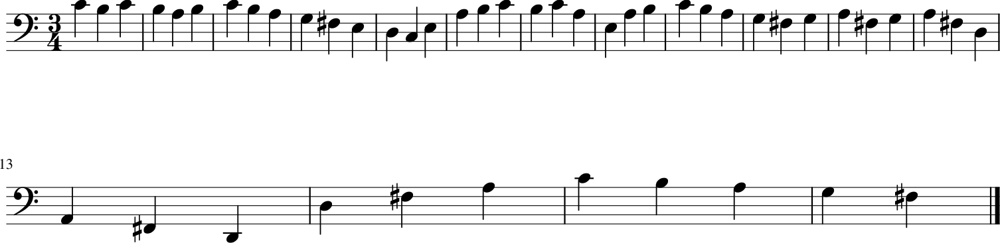

107/107 [==============================] - 65s 607ms/step - loss: 1.9993 - note_outputs_loss: 1.4502 - duration_outputs_loss: 0.5492
Epoch 103/5000
107/107 [==============================] - ETA: 0s - loss: 1.9844 - note_outputs_loss: 1.4410 - duration_outputs_loss: 0.5434[['START', '4/4TS', 'rest', 'D4', 'rest', 'F#4', 'D4', 'D4', 'D4', 'D4', 'D4', 'D4', 'D4', 'C#4', 'C#4', 'C#4', 'D4', 'E4', 'D4', 'E4', 'F#4', 'E4', 'D4', 'E4', 'F#4', 'G4', 'D4', 'C#4', 'B3', 'A3', 'A4', 'A4', 'B4', 'A4', 'G4', 'F#4', 'E4', 'D4', 'C#4', 'B3', 'A3', 'A4', 'A4', 'B4', 'A4', 'G4', 'F#4', 'E4', 'D4'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


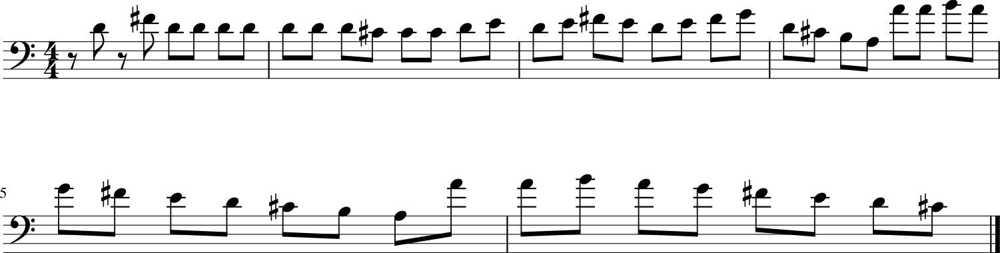

107/107 [==============================] - 66s 613ms/step - loss: 1.9844 - note_outputs_loss: 1.4410 - duration_outputs_loss: 0.5434
Epoch 104/5000
107/107 [==============================] - ETA: 0s - loss: 1.9838 - note_outputs_loss: 1.4392 - duration_outputs_loss: 0.5446[['START', '4/4TS', 'rest', 'G3', 'C4', 'G3', 'G#3', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G#3', 'G#3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'E-3', 'D3', 'C3', 'D3', 'E-3'], ['0.0', '0.0', '2.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '1.0', '0.5']]


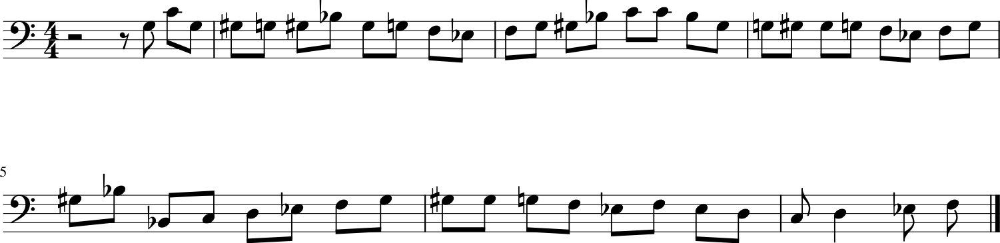

107/107 [==============================] - 65s 608ms/step - loss: 1.9838 - note_outputs_loss: 1.4392 - duration_outputs_loss: 0.5446
Epoch 105/5000
107/107 [==============================] - ETA: 0s - loss: 1.9771 - note_outputs_loss: 1.4333 - duration_outputs_loss: 0.5438[['START', 'E-:major', '4/4TS', 'rest', 'D4', 'D4', 'D4', 'G3', 'E-3', 'G3', 'C4', 'C#4', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'B-2', 'C3', 'D3', 'E-3', 'C#4', 'G#2', 'C4'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


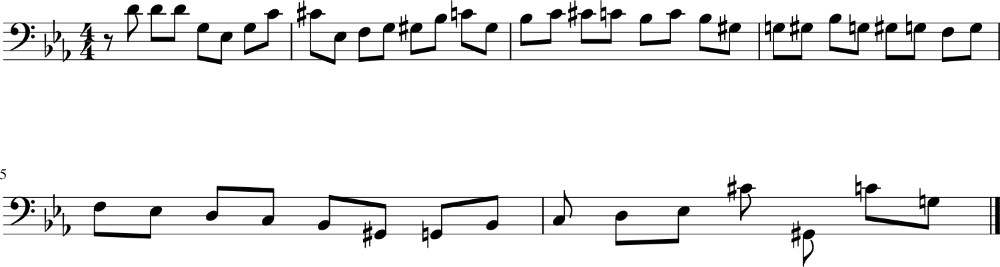

107/107 [==============================] - 64s 602ms/step - loss: 1.9771 - note_outputs_loss: 1.4333 - duration_outputs_loss: 0.5438
Epoch 106/5000
107/107 [==============================] - ETA: 0s - loss: 1.9697 - note_outputs_loss: 1.4268 - duration_outputs_loss: 0.5429[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'G#2', 'F2', 'E-2', 'G2', 'B-2', 'D3', 'F3', 'B-3', 'B-3', 'F3', 'G3'], ['0.0', '0.0', '0.0', '3.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1/3', '1/3']]


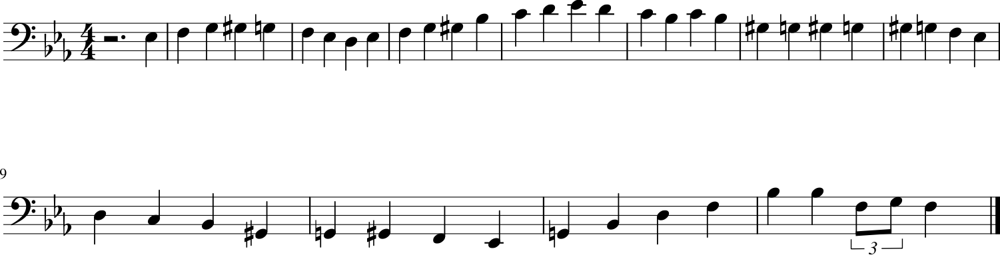

107/107 [==============================] - 65s 607ms/step - loss: 1.9697 - note_outputs_loss: 1.4268 - duration_outputs_loss: 0.5429
Epoch 107/5000
107/107 [==============================] - ETA: 0s - loss: 1.9670 - note_outputs_loss: 1.4241 - duration_outputs_loss: 0.5429[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C4', 'B3', 'C4', 'G#3', 'F3', 'G#3', 'D3', 'C4', 'G3', 'C4', 'G3', 'C4', 'G3', 'C4', 'G3', 'C4', 'G3', 'C4', 'G3', 'G#3', 'F3', 'G3', 'B-3'], ['0.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


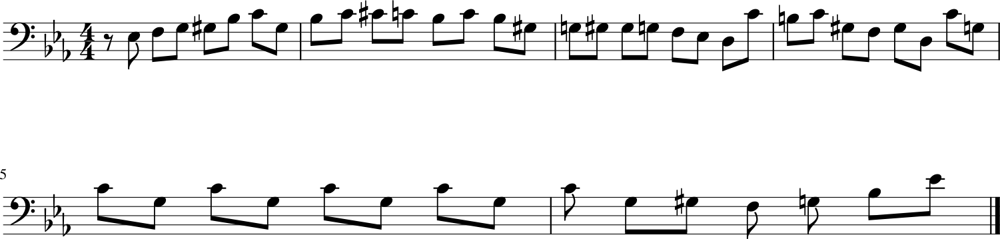

107/107 [==============================] - 65s 608ms/step - loss: 1.9670 - note_outputs_loss: 1.4241 - duration_outputs_loss: 0.5429
Epoch 108/5000
107/107 [==============================] - ETA: 0s - loss: 1.9590 - note_outputs_loss: 1.4106 - duration_outputs_loss: 0.5484[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'C4', 'B-3', 'G#3', 'B-3', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'B-3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


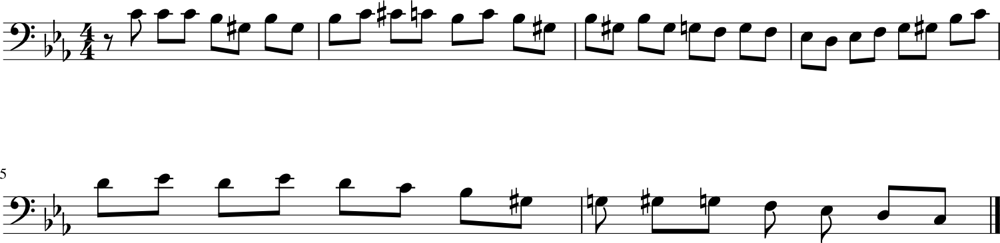

107/107 [==============================] - 65s 606ms/step - loss: 1.9590 - note_outputs_loss: 1.4106 - duration_outputs_loss: 0.5484
Epoch 109/5000
107/107 [==============================] - ETA: 0s - loss: 1.9486 - note_outputs_loss: 1.4084 - duration_outputs_loss: 0.5401[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E3', 'F3', 'F3', 'D3', 'C#3', 'B2', 'A2', 'G2', 'F2', 'E2', 'D2', 'F2', 'A2', 'D3', 'E3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'G#3'], ['0.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


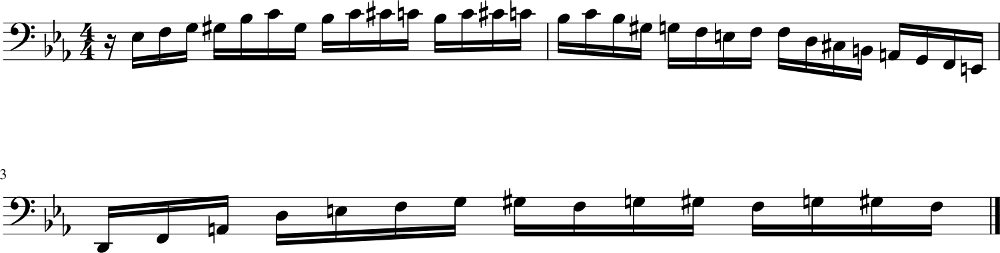

107/107 [==============================] - 65s 603ms/step - loss: 1.9486 - note_outputs_loss: 1.4084 - duration_outputs_loss: 0.5401
Epoch 110/5000
107/107 [==============================] - ETA: 0s - loss: 1.9541 - note_outputs_loss: 1.4092 - duration_outputs_loss: 0.5448[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'F3', 'F2', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2', 'G2', 'D3', 'D3', 'D3', 'C3', 'C3', 'G3', 'G#2', 'G3'], ['0.0', '0.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


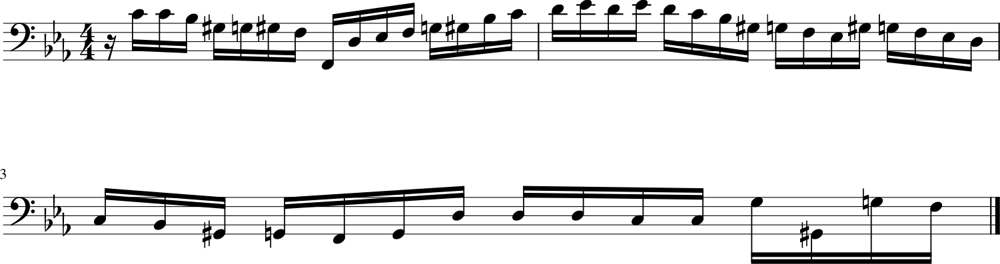

107/107 [==============================] - 66s 617ms/step - loss: 1.9541 - note_outputs_loss: 1.4092 - duration_outputs_loss: 0.5448
Epoch 111/5000
107/107 [==============================] - ETA: 0s - loss: 1.9549 - note_outputs_loss: 1.4107 - duration_outputs_loss: 0.5442[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'F3', 'F3', 'F3', 'E-3', 'D3', 'E-3', 'C3', 'B2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'C3', 'G3', 'rest', 'E-3', 'F3', 'G3', 'D3', 'E-3', 'A2', 'F3', 'D3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


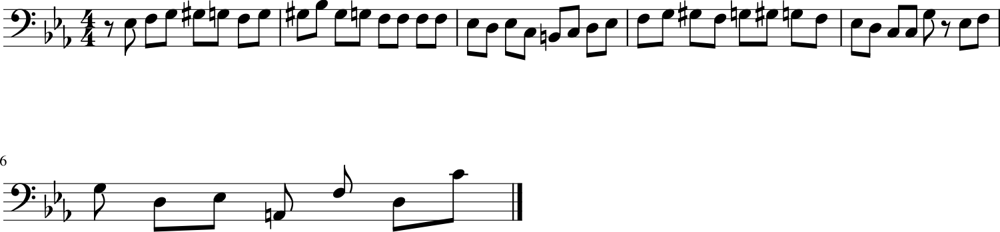

107/107 [==============================] - 66s 618ms/step - loss: 1.9549 - note_outputs_loss: 1.4107 - duration_outputs_loss: 0.5442
Epoch 112/5000
107/107 [==============================] - ETA: 0s - loss: 1.9480 - note_outputs_loss: 1.4035 - duration_outputs_loss: 0.5445[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'B-3', 'G#3', 'G3', 'G#3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C4', 'B-3', 'B-3', 'C4', 'D3', 'E-3', 'D3', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'D3'], ['0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


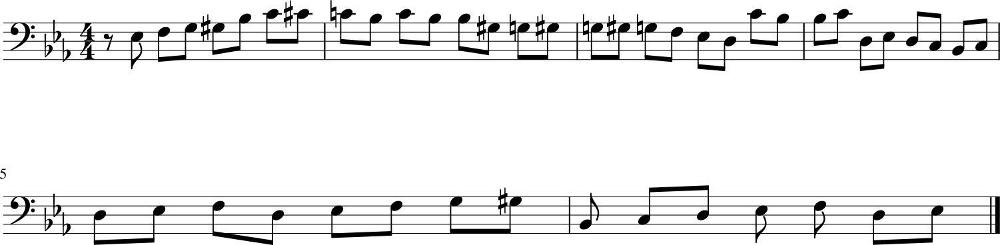

107/107 [==============================] - 68s 638ms/step - loss: 1.9480 - note_outputs_loss: 1.4035 - duration_outputs_loss: 0.5445
Epoch 113/5000
107/107 [==============================] - ETA: 0s - loss: 1.9413 - note_outputs_loss: 1.3980 - duration_outputs_loss: 0.5433[['START', 'D:major', '4/4TS', 'rest', 'F#4', 'F#4', 'G4', 'F#4', 'E4', 'D4', 'D4', 'D4', 'C#4', 'B3', 'A3', 'D4', 'D4', 'D4', 'B3', 'C#4', 'A3', 'E4', 'C#4', 'E4', 'A4', 'E4', 'F#4', 'G4', 'E4', 'F#4', 'G4', 'E4', 'F#4', 'F#4', 'F#4', 'E4', 'E4', 'E-4', 'E4', 'E4', 'G4', 'E-4', 'E4', 'F#4', 'E4', 'E4', 'G4', 'E-4', 'E4'], ['0.0', '0.5', '0.25', '0.25', '0.25', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


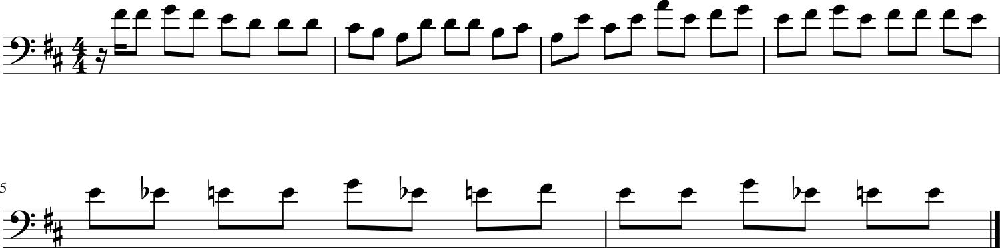

107/107 [==============================] - 68s 640ms/step - loss: 1.9413 - note_outputs_loss: 1.3980 - duration_outputs_loss: 0.5433
Epoch 114/5000
107/107 [==============================] - ETA: 0s - loss: 1.9492 - note_outputs_loss: 1.4001 - duration_outputs_loss: 0.5491[['START', 'E-:major', '4/4TS', 'rest', 'D4', 'D4', 'D4', 'G3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'E-3', 'G3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'E-3', 'F3', 'G3', 'C3', 'E-3', 'C3', 'D3', 'C3', 'D3', 'F3', 'G#3', 'G#3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'C3', 'G2', 'F2', 'G2', 'C3', 'E-3', 'C3', 'B2', 'C3', 'D3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


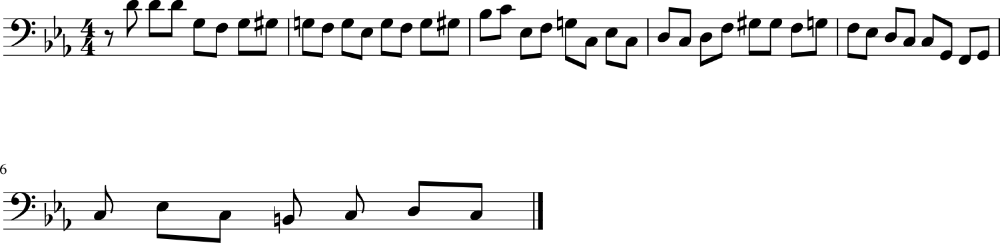

107/107 [==============================] - 67s 630ms/step - loss: 1.9492 - note_outputs_loss: 1.4001 - duration_outputs_loss: 0.5491
Epoch 115/5000
107/107 [==============================] - ETA: 0s - loss: 1.9446 - note_outputs_loss: 1.3934 - duration_outputs_loss: 0.5512[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'G3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'F3', 'G#3', 'G3', 'F3', 'E-3', 'D3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


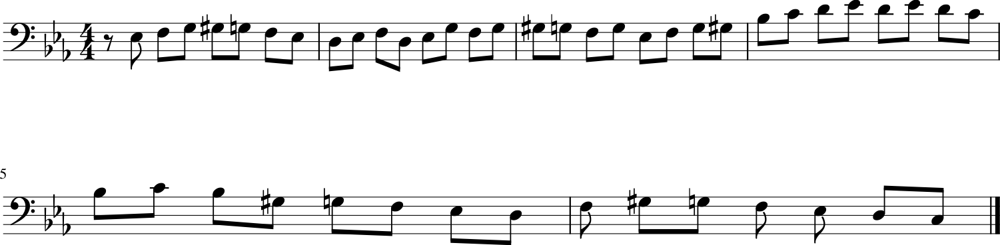

107/107 [==============================] - 65s 608ms/step - loss: 1.9446 - note_outputs_loss: 1.3934 - duration_outputs_loss: 0.5512
Epoch 116/5000
107/107 [==============================] - ETA: 0s - loss: 1.9263 - note_outputs_loss: 1.3841 - duration_outputs_loss: 0.5422[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'D3', 'E-3', 'B-2', 'G#2', 'G2', 'F2', 'B-3', 'E-3', 'G3', 'D3', 'F3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'D3', 'E-3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4'], ['0.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


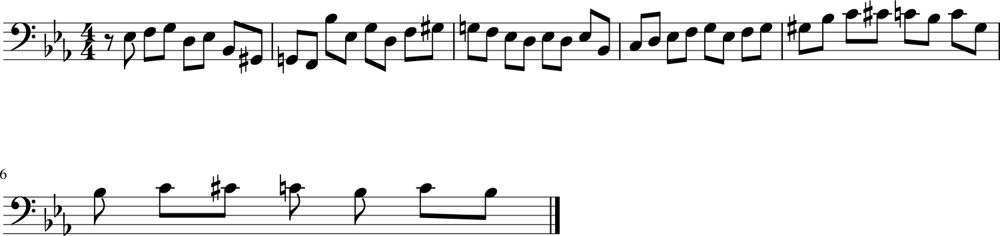

107/107 [==============================] - 65s 606ms/step - loss: 1.9263 - note_outputs_loss: 1.3841 - duration_outputs_loss: 0.5422
Epoch 117/5000
107/107 [==============================] - ETA: 0s - loss: 1.9198 - note_outputs_loss: 1.3761 - duration_outputs_loss: 0.5437[['START', 'C:major', '3/4TS', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'C3', 'B2', 'A2', 'G2', 'D3', 'E3', 'F#3', 'G3', 'A3', 'B3', 'C4', 'D4', 'B3', 'G3', 'A3', 'B3', 'A3', 'B3', 'C4', 'B3', 'A3', 'B3', 'A3', 'B3', 'C4', 'A3', 'D4', 'B3', 'A3', 'B3', 'C4', 'A3', 'D4', 'B3', 'A3', 'B3', 'C4', 'A3', 'D4'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


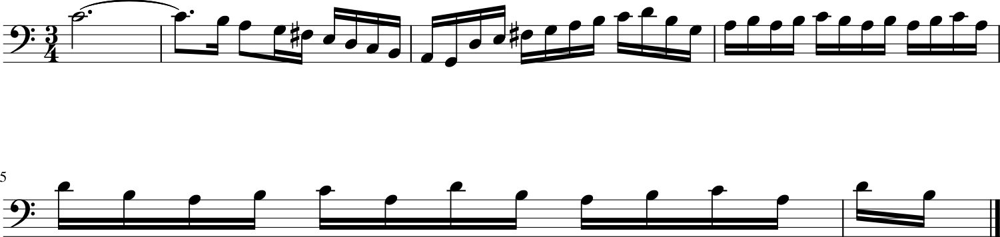

107/107 [==============================] - 65s 608ms/step - loss: 1.9198 - note_outputs_loss: 1.3761 - duration_outputs_loss: 0.5437
Epoch 118/5000
107/107 [==============================] - ETA: 0s - loss: 1.9162 - note_outputs_loss: 1.3767 - duration_outputs_loss: 0.5394[['START', 'C:major', '3/4TS', 'C4', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'B2', 'A2', 'G2', 'D3', 'C3', 'D3', 'E3', 'F#3', 'G3', 'A3', 'B3', 'C4', 'G3', 'A3', 'F#3', 'G3', 'A3', 'B3', 'C4', 'B3', 'A3', 'B3', 'E3', 'F#3', 'G3', 'A3', 'B3', 'C4', 'E3', 'D3', 'E3'], ['0.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


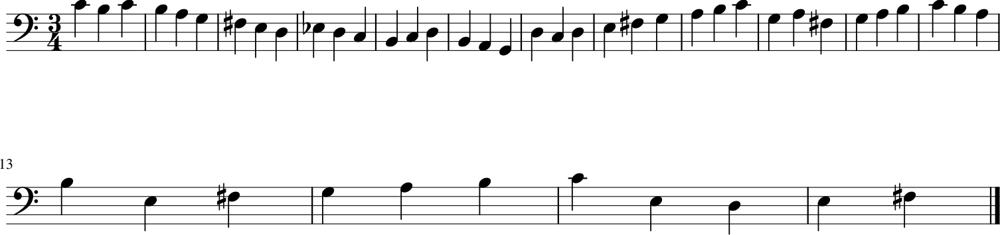

107/107 [==============================] - 65s 606ms/step - loss: 1.9162 - note_outputs_loss: 1.3767 - duration_outputs_loss: 0.5394
Epoch 119/5000
107/107 [==============================] - ETA: 0s - loss: 1.9060 - note_outputs_loss: 1.3620 - duration_outputs_loss: 0.5440[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'E-3', 'F3', 'B-3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G#3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


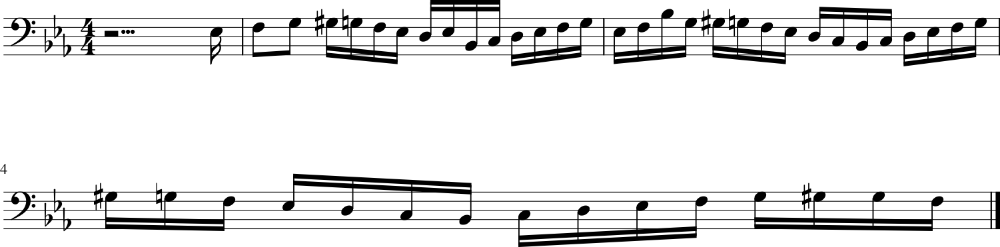

107/107 [==============================] - 65s 604ms/step - loss: 1.9060 - note_outputs_loss: 1.3620 - duration_outputs_loss: 0.5440
Epoch 120/5000
107/107 [==============================] - ETA: 0s - loss: 1.9150 - note_outputs_loss: 1.3714 - duration_outputs_loss: 0.5436[['START', 'E-:major', '4/4TS', 'C3', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'F3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'F3', 'E-3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


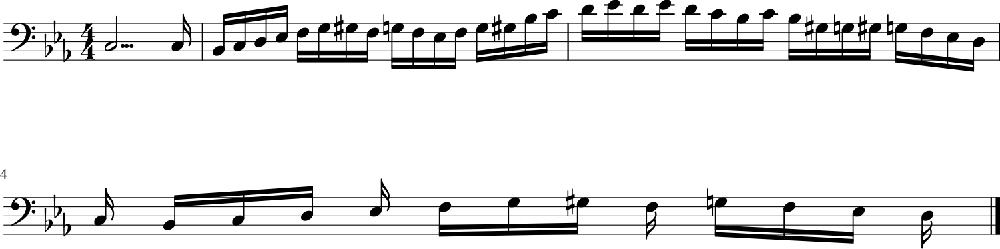

107/107 [==============================] - 65s 607ms/step - loss: 1.9150 - note_outputs_loss: 1.3714 - duration_outputs_loss: 0.5436
Epoch 121/5000
107/107 [==============================] - ETA: 0s - loss: 1.9166 - note_outputs_loss: 1.3708 - duration_outputs_loss: 0.5459[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'E-3', 'F3', 'B-3', 'G3', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'G#3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


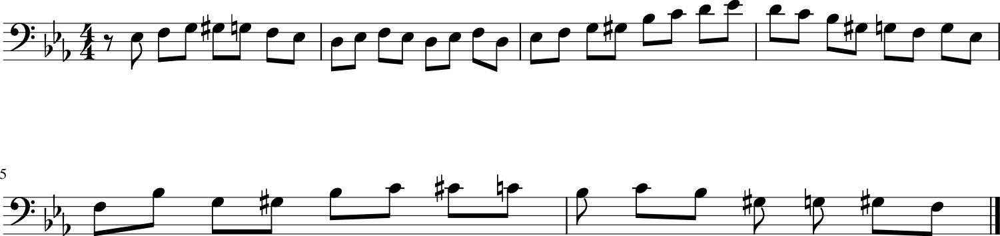

107/107 [==============================] - 65s 611ms/step - loss: 1.9166 - note_outputs_loss: 1.3708 - duration_outputs_loss: 0.5459
Epoch 122/5000
107/107 [==============================] - ETA: 0s - loss: 1.8994 - note_outputs_loss: 1.3577 - duration_outputs_loss: 0.5418[['START', 'E-:major', '4/4TS', 'rest', 'D4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2', 'G2', 'G#2', 'F2', 'E-4', 'D4', 'C4', 'D4', 'B-3', 'E-3', 'C4', 'F3', 'A3', 'C4', 'B-3', 'C4', 'B-3', 'A3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'A2'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


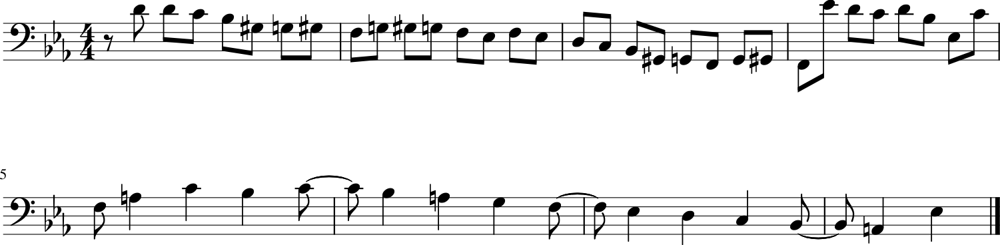

107/107 [==============================] - 64s 601ms/step - loss: 1.8994 - note_outputs_loss: 1.3577 - duration_outputs_loss: 0.5418
Epoch 123/5000
107/107 [==============================] - ETA: 0s - loss: 1.9134 - note_outputs_loss: 1.3707 - duration_outputs_loss: 0.5427[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'D3', 'E-3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G3', 'G#3', 'B-3', 'C4', 'F3', 'D4', 'F3', 'E-3', 'D3', 'E-3', 'C2', 'D2', 'E-2', 'F2', 'G2', 'D4', 'C4', 'B3', 'A3', 'C4', 'B3', 'A3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


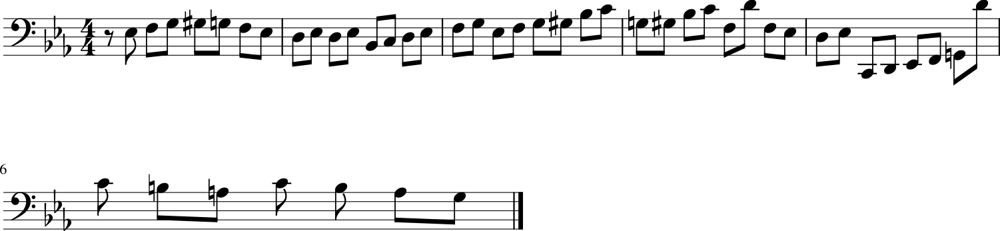

107/107 [==============================] - 65s 603ms/step - loss: 1.9134 - note_outputs_loss: 1.3707 - duration_outputs_loss: 0.5427
Epoch 124/5000
107/107 [==============================] - ETA: 0s - loss: 1.8953 - note_outputs_loss: 1.3508 - duration_outputs_loss: 0.5444[['START', 'E-:major', '4/4TS', 'rest', 'G3', 'C4', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'G3', 'B-3', 'E-4', 'E-3', 'E-3', 'F3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'F3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B2'], ['0.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


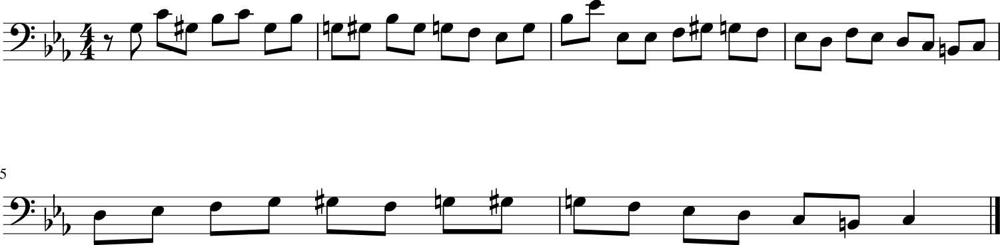

107/107 [==============================] - 64s 602ms/step - loss: 1.8953 - note_outputs_loss: 1.3508 - duration_outputs_loss: 0.5444
Epoch 125/5000
107/107 [==============================] - ETA: 0s - loss: 1.8905 - note_outputs_loss: 1.3475 - duration_outputs_loss: 0.5430[['START', 'C:major', '3/4TS', 'C4', 'B3', 'A3', 'B3', 'C4', 'B3', 'C4', 'B3', 'A3', 'B3', 'C4', 'B3', 'A3', 'B3', 'C4', 'A3', 'D4', 'B3', 'A3', 'B3', 'C4', 'A3', 'D4', 'B3', 'A3', 'B3', 'C4', 'B3', 'A3', 'B3', 'A3', 'B3', 'A3', 'B3', 'A3', 'B3', 'C4', 'A3', 'B3', 'A3', 'B3', 'A3', 'B3', 'A3', 'A3', 'B3'], ['0.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


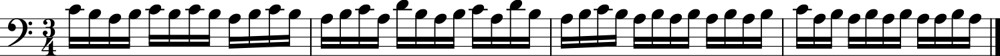

107/107 [==============================] - 65s 611ms/step - loss: 1.8905 - note_outputs_loss: 1.3475 - duration_outputs_loss: 0.5430
Epoch 126/5000
107/107 [==============================] - ETA: 0s - loss: 1.8958 - note_outputs_loss: 1.3519 - duration_outputs_loss: 0.5438[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'G3', 'C4', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'C3', 'C2', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'C4', 'D3', 'E-3', 'D3', 'C3', 'D3'], ['0.0', '5.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


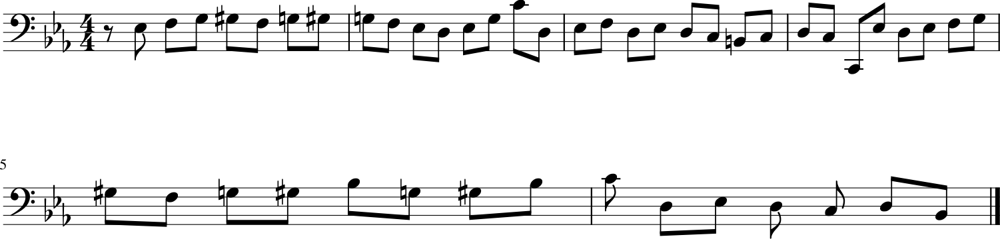

107/107 [==============================] - 65s 612ms/step - loss: 1.8958 - note_outputs_loss: 1.3519 - duration_outputs_loss: 0.5438
Epoch 127/5000
107/107 [==============================] - ETA: 0s - loss: 1.8907 - note_outputs_loss: 1.3509 - duration_outputs_loss: 0.5398[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'E-3', 'D3', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'B-3', 'G#3', 'G3', 'F3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


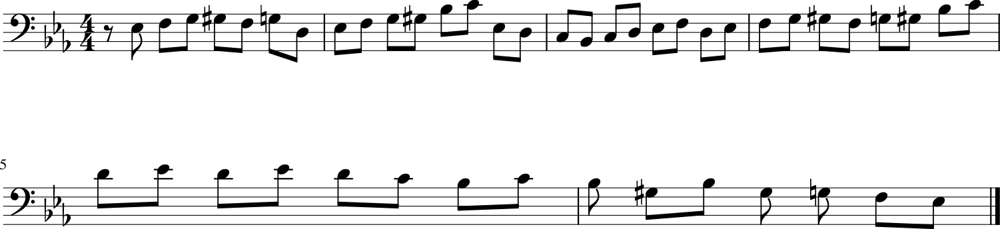

107/107 [==============================] - 65s 610ms/step - loss: 1.8907 - note_outputs_loss: 1.3509 - duration_outputs_loss: 0.5398
Epoch 128/5000
107/107 [==============================] - ETA: 0s - loss: 1.8800 - note_outputs_loss: 1.3354 - duration_outputs_loss: 0.5446[['START', 'E-:major', '4/4TS', 'rest', 'G3', 'C4', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'F3', 'C4', 'E-3', 'D3', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G3', 'B-3', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'B-3', 'C4', 'F#3', 'F3', 'F#3', 'F#3', 'D4', 'C4', 'B-3'], ['0.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


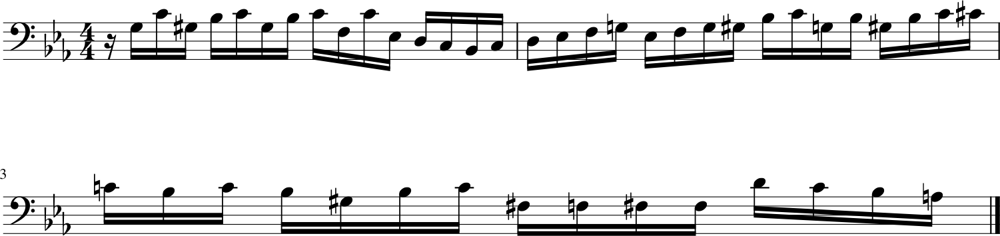

107/107 [==============================] - 64s 598ms/step - loss: 1.8800 - note_outputs_loss: 1.3354 - duration_outputs_loss: 0.5446
Epoch 129/5000
107/107 [==============================] - ETA: 0s - loss: 1.8807 - note_outputs_loss: 1.3375 - duration_outputs_loss: 0.5432[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2', 'G#2', 'D3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


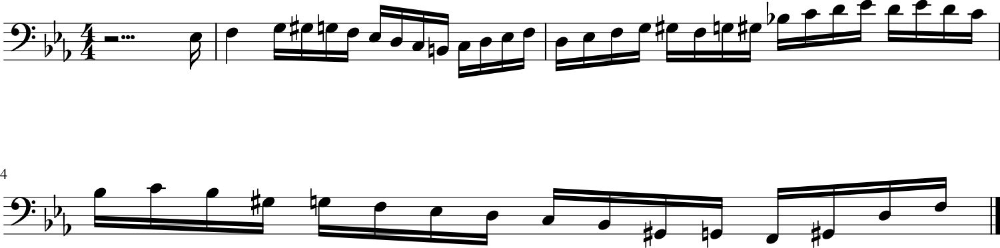

107/107 [==============================] - 65s 605ms/step - loss: 1.8807 - note_outputs_loss: 1.3375 - duration_outputs_loss: 0.5432
Epoch 130/5000
107/107 [==============================] - ETA: 0s - loss: 1.8770 - note_outputs_loss: 1.3357 - duration_outputs_loss: 0.5413[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'E-3', 'D3', 'C3', 'D3', 'B-2', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'C4', 'C#4'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


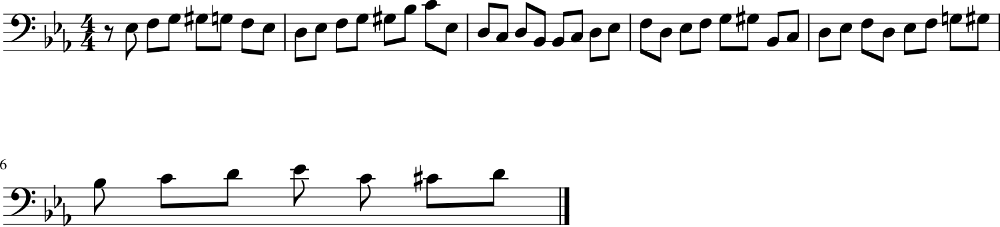

107/107 [==============================] - 64s 602ms/step - loss: 1.8770 - note_outputs_loss: 1.3357 - duration_outputs_loss: 0.5413
Epoch 131/5000
107/107 [==============================] - ETA: 0s - loss: 1.8761 - note_outputs_loss: 1.3294 - duration_outputs_loss: 0.5467[['START', 'C:major', '3/4TS', 'C4', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'G2', 'E2', 'G2', 'A3', 'rest', 'G3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3'], ['0.0', '0.0', '0.0', '5.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


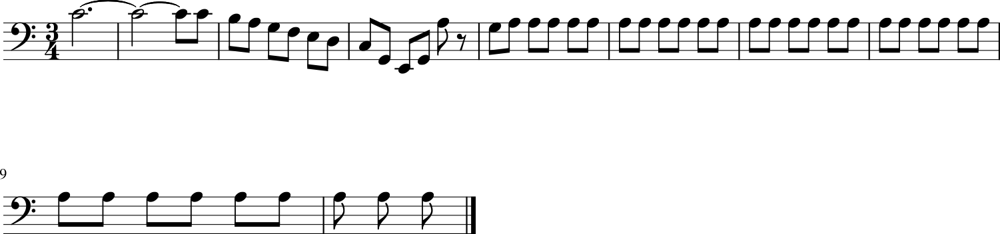

107/107 [==============================] - 64s 601ms/step - loss: 1.8761 - note_outputs_loss: 1.3294 - duration_outputs_loss: 0.5467
Epoch 132/5000
107/107 [==============================] - ETA: 0s - loss: 1.8692 - note_outputs_loss: 1.3295 - duration_outputs_loss: 0.5397[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'E-3', 'E-4', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'E-3', 'D3', 'C3'], ['0.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


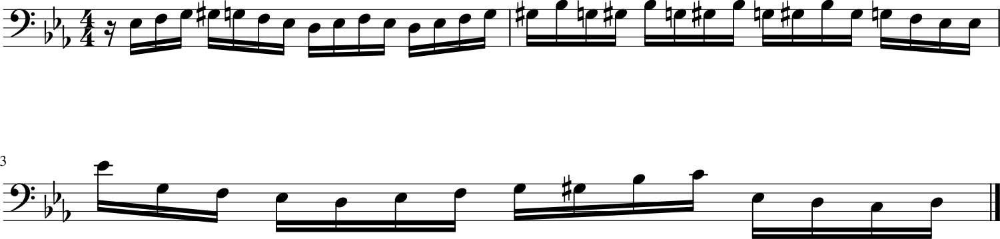

107/107 [==============================] - 64s 602ms/step - loss: 1.8692 - note_outputs_loss: 1.3295 - duration_outputs_loss: 0.5397
Epoch 133/5000
107/107 [==============================] - ETA: 0s - loss: 1.8669 - note_outputs_loss: 1.3198 - duration_outputs_loss: 0.5471[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'B2', 'C3', 'G#2', 'D3', 'F3', 'G#3', 'D4', 'C4', 'B3', 'A3', 'G#3', 'A3', 'E3', 'G#3', 'A3', 'E3', 'C#3', 'E3', 'A2', 'C#3', 'E3', 'G3', 'B-3', 'G#3', 'A3', 'D4', 'E4', 'F4', 'G4', 'E4', 'D3', 'A3', 'F4', 'E4', 'D4', 'C4', 'D4'], ['0.0', '0.0', '0.0', '3.75', '0.25', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


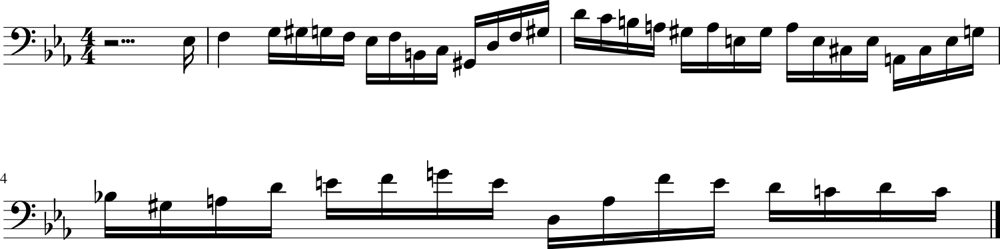

107/107 [==============================] - 65s 610ms/step - loss: 1.8669 - note_outputs_loss: 1.3198 - duration_outputs_loss: 0.5471
Epoch 134/5000
107/107 [==============================] - ETA: 0s - loss: 1.8653 - note_outputs_loss: 1.3191 - duration_outputs_loss: 0.5462[['START', 'E-:major', '4/4TS', 'rest', 'G3', 'D4', 'A3', 'B-3', 'A3', 'G3', 'F3', 'E3', 'G3', 'C#3', 'G3', 'B2', 'A2', 'G2', 'F2', 'E2', 'D2', 'F2', 'A2', 'D3', 'F3', 'A3', 'D4', 'G#3', 'A3', 'B3', 'D4', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'F3', 'D3', 'B2', 'C3', 'E3', 'A3', 'B3', 'C4', 'A3', 'D4', 'A3', 'F3'], ['0.0', '0.0', '0.0', '2.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


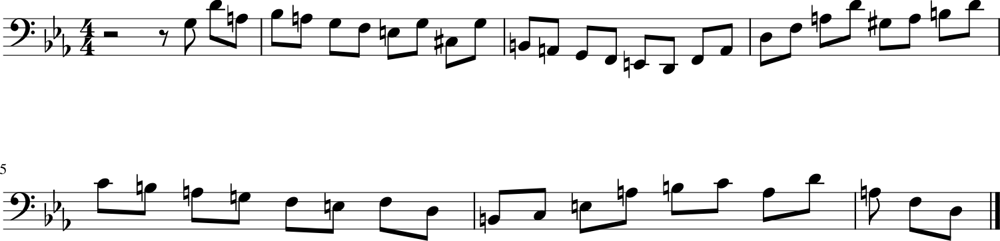

107/107 [==============================] - 65s 604ms/step - loss: 1.8653 - note_outputs_loss: 1.3191 - duration_outputs_loss: 0.5462
Epoch 135/5000
107/107 [==============================] - ETA: 0s - loss: 1.8684 - note_outputs_loss: 1.3233 - duration_outputs_loss: 0.5451[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'B-3', 'G#3', 'B-3', 'G#3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'E-3', 'E-3', 'F3', 'G3', 'D3', 'E-3', 'B-2', 'G#2', 'E-3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


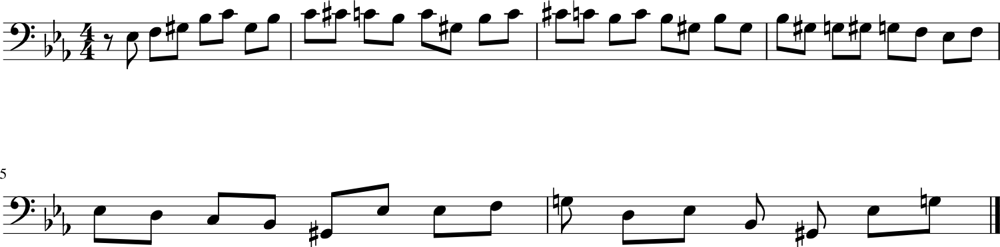

107/107 [==============================] - 65s 611ms/step - loss: 1.8684 - note_outputs_loss: 1.3233 - duration_outputs_loss: 0.5451
Epoch 136/5000
107/107 [==============================] - ETA: 0s - loss: 1.8601 - note_outputs_loss: 1.3137 - duration_outputs_loss: 0.5464[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'E-3', 'F3', 'D3', 'E-3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2', 'G2', 'G#2', 'F2', 'E-2', 'F2', 'G2', 'E-2', 'F2', 'G2', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'B-2', 'G2', 'C#4', 'B-3', 'G#3', 'G3', 'F3', 'E-3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


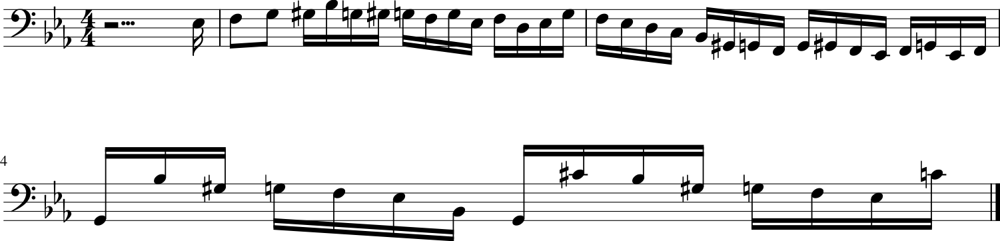

107/107 [==============================] - 65s 608ms/step - loss: 1.8601 - note_outputs_loss: 1.3137 - duration_outputs_loss: 0.5464
Epoch 137/5000
107/107 [==============================] - ETA: 0s - loss: 1.8594 - note_outputs_loss: 1.3135 - duration_outputs_loss: 0.5459[['START', 'E-:major', '4/4TS', 'rest', 'D4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'G3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2', 'G#3', 'G3', 'F3', 'B-2', 'G#3', 'G3', 'F3', 'E-2', 'G3', 'F3', 'E-3', 'A2', 'F#3', 'F3'], ['0.0', '0.0', '0.0', '1.0', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


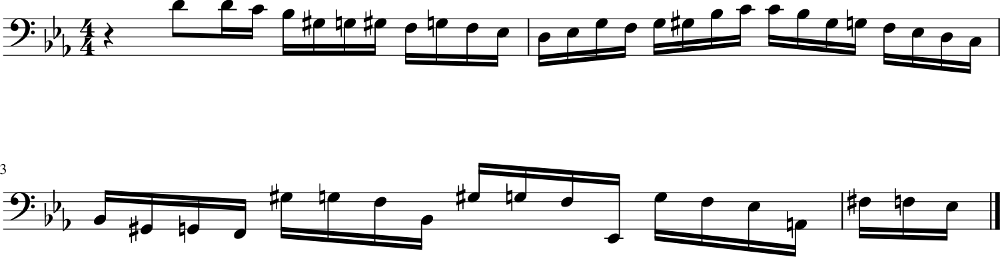

107/107 [==============================] - 65s 607ms/step - loss: 1.8594 - note_outputs_loss: 1.3135 - duration_outputs_loss: 0.5459
Epoch 138/5000
107/107 [==============================] - ETA: 0s - loss: 1.8616 - note_outputs_loss: 1.3141 - duration_outputs_loss: 0.5475[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'B-2', 'D3', 'E-3', 'E-2', 'E-3', 'E-3', 'F3', 'G3', 'G#3', 'B-2', 'E-2', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'B-2', 'C3', 'D3', 'E-3', 'C#4', 'G#2', 'C4', 'F3', 'E-3', 'F2', 'G#2', 'B-2', 'C3', 'D3', 'C4', 'G2', 'B-3', 'E-3', 'D3', 'E-2', 'G2', 'B-2', 'D3'], ['0.0', '3.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


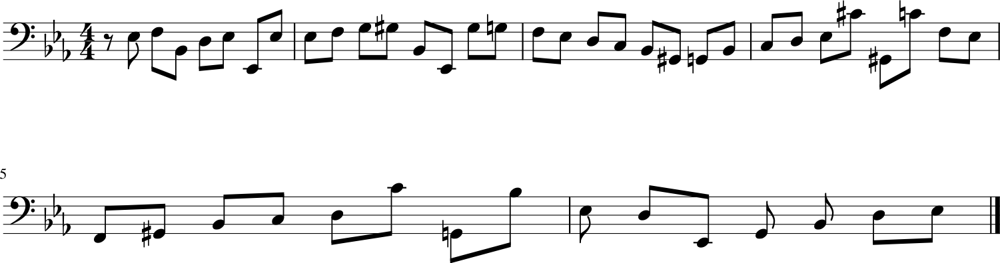

107/107 [==============================] - 64s 603ms/step - loss: 1.8616 - note_outputs_loss: 1.3141 - duration_outputs_loss: 0.5475
Epoch 139/5000
107/107 [==============================] - ETA: 0s - loss: 1.8536 - note_outputs_loss: 1.3057 - duration_outputs_loss: 0.5479[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


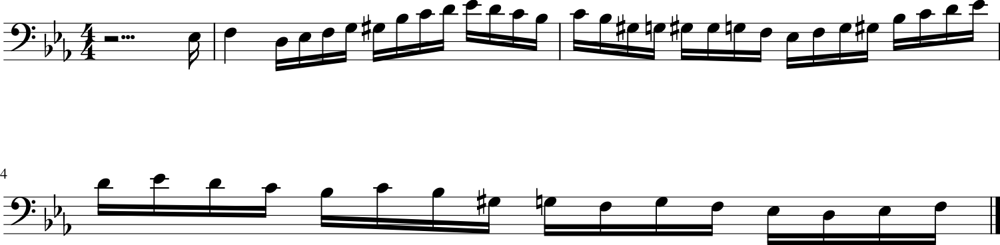

107/107 [==============================] - 65s 604ms/step - loss: 1.8536 - note_outputs_loss: 1.3057 - duration_outputs_loss: 0.5479
Epoch 140/5000
107/107 [==============================] - ETA: 0s - loss: 1.8489 - note_outputs_loss: 1.3044 - duration_outputs_loss: 0.5446[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'F3', 'G3', 'E-3', 'F3', 'G3', 'G3', 'E-3', 'B-3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'G#2', 'B-2', 'C3', 'D3', 'E3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'G#2', 'B-2', 'C3', 'D3', 'E3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


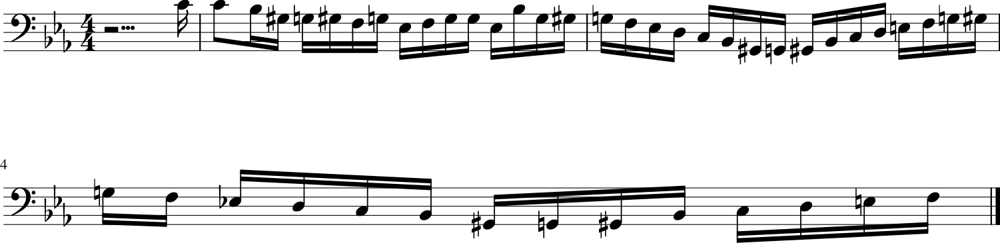

107/107 [==============================] - 65s 612ms/step - loss: 1.8489 - note_outputs_loss: 1.3044 - duration_outputs_loss: 0.5446
Epoch 141/5000
107/107 [==============================] - ETA: 0s - loss: 1.8499 - note_outputs_loss: 1.3044 - duration_outputs_loss: 0.5455[['START', 'E-:major', '12/8TS', 'rest', 'E-3', 'E-3', 'D3', 'E-3', 'D3', 'E-3', 'D3', 'E-3', 'D3', 'E-3', 'D3', 'E-2', 'G3', 'F3', 'B-3', 'B-3', 'G3', 'B-3', 'E-3', 'G3', 'C4', 'G#3', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'C#3', 'E-3', 'C3', 'C#3', 'E-3', 'C3', 'C#3', 'E-3', 'C3'], ['0.0', '0.0', '0.0', '2.0', '1.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


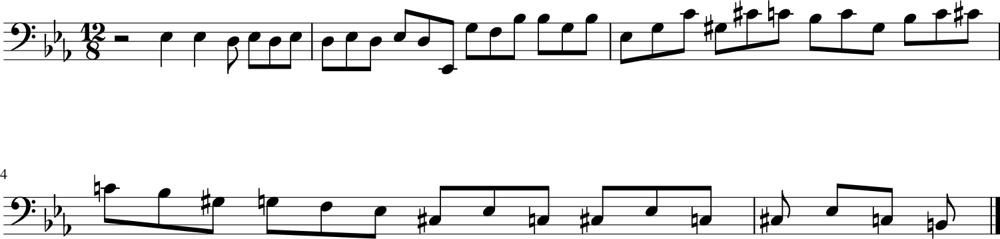

107/107 [==============================] - 65s 603ms/step - loss: 1.8499 - note_outputs_loss: 1.3044 - duration_outputs_loss: 0.5455
Epoch 142/5000
107/107 [==============================] - ETA: 0s - loss: 1.8420 - note_outputs_loss: 1.2997 - duration_outputs_loss: 0.5423[['START', 'C#5', '4/4TS', 'rest'], ['0.0', '0.5', '0.5', '0.5']]


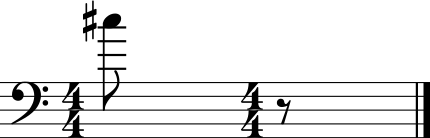

107/107 [==============================] - 62s 581ms/step - loss: 1.8420 - note_outputs_loss: 1.2997 - duration_outputs_loss: 0.5423
Epoch 143/5000
107/107 [==============================] - ETA: 0s - loss: 1.8407 - note_outputs_loss: 1.2952 - duration_outputs_loss: 0.5455[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'E-3', 'F3', 'E-3', 'D3', 'F3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'G2', 'B2', 'D3', 'G3', 'F3', 'G3', 'G#3', 'G3'], ['0.0', '2.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


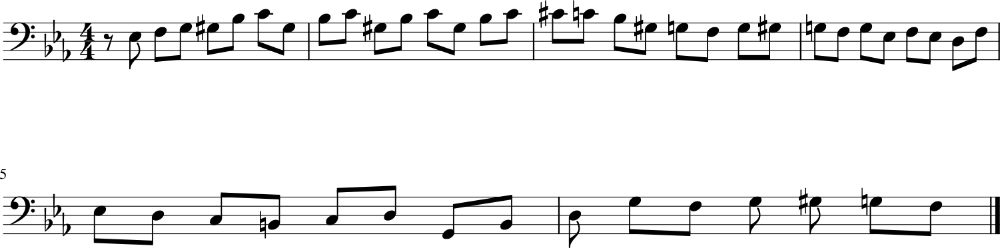

107/107 [==============================] - 65s 605ms/step - loss: 1.8407 - note_outputs_loss: 1.2952 - duration_outputs_loss: 0.5455
Epoch 144/5000
107/107 [==============================] - ETA: 0s - loss: 1.8325 - note_outputs_loss: 1.2885 - duration_outputs_loss: 0.5440[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'E-3', 'D3', 'C3', 'D3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


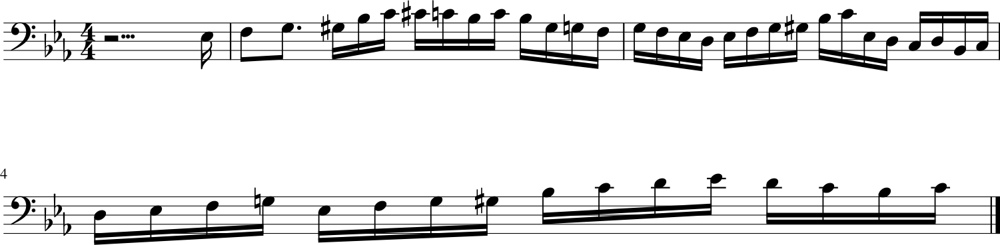

107/107 [==============================] - 65s 612ms/step - loss: 1.8325 - note_outputs_loss: 1.2885 - duration_outputs_loss: 0.5440
Epoch 145/5000
107/107 [==============================] - ETA: 0s - loss: 1.8384 - note_outputs_loss: 1.2925 - duration_outputs_loss: 0.5459[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'E-3', 'B2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'B-3', 'E-4', 'G3', 'F3', 'E-3', 'B-2', 'D4', 'E-4', 'rest'], ['0.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


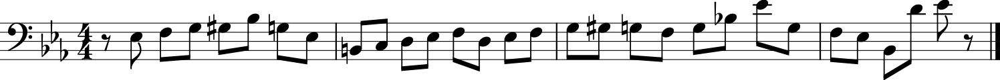

107/107 [==============================] - 64s 601ms/step - loss: 1.8384 - note_outputs_loss: 1.2925 - duration_outputs_loss: 0.5459
Epoch 146/5000
107/107 [==============================] - ETA: 0s - loss: 1.8343 - note_outputs_loss: 1.2877 - duration_outputs_loss: 0.5466[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'F3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'G#3', 'F3', 'G3', 'B-3', 'D3', 'E-3', 'G2', 'B-2', 'E-2', 'B-2'], ['0.0', '0.0', '0.0', '2.0', '1.0', '1.0', '1.0', '1.0', '1.0', '0.5', '0.5', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '0.5', '1.0', '1.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


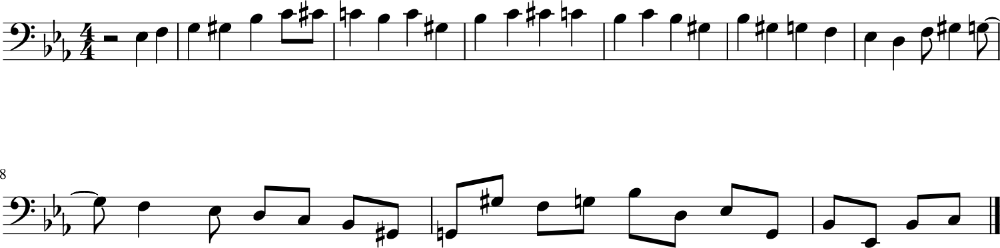

107/107 [==============================] - 66s 613ms/step - loss: 1.8343 - note_outputs_loss: 1.2877 - duration_outputs_loss: 0.5466
Epoch 147/5000
107/107 [==============================] - ETA: 0s - loss: 1.8340 - note_outputs_loss: 1.2897 - duration_outputs_loss: 0.5443[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3'], ['0.0', '0.5', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


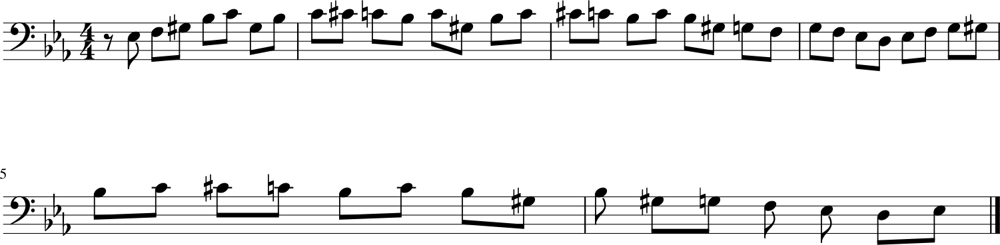

107/107 [==============================] - 65s 609ms/step - loss: 1.8340 - note_outputs_loss: 1.2897 - duration_outputs_loss: 0.5443
Epoch 148/5000
107/107 [==============================] - ETA: 0s - loss: 1.8394 - note_outputs_loss: 1.2945 - duration_outputs_loss: 0.5449[['START', 'E-:major', '3/4TS', 'rest', 'E-3', 'E-3', 'B-2', 'G2', 'E-3', 'E-3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'E-3', 'F3', 'D3', 'E-3', 'G3', 'C3', 'E-3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'C4', 'D4', 'E-4', 'E-4', 'D4', 'C4', 'B-3', 'C4'], ['0.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


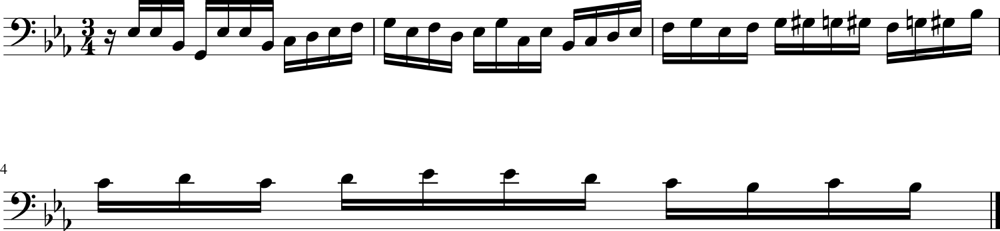

107/107 [==============================] - 65s 612ms/step - loss: 1.8394 - note_outputs_loss: 1.2945 - duration_outputs_loss: 0.5449
Epoch 149/5000
107/107 [==============================] - ETA: 0s - loss: 1.8234 - note_outputs_loss: 1.2792 - duration_outputs_loss: 0.5442[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'F3', 'C4', 'E-3', 'D3', 'E-3', 'D3', 'C3', 'D3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'A3', 'B-3', 'C4', 'F3', 'D4', 'F3', 'F3', 'C#3', 'D3', 'F3', 'E3', 'F3', 'G3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


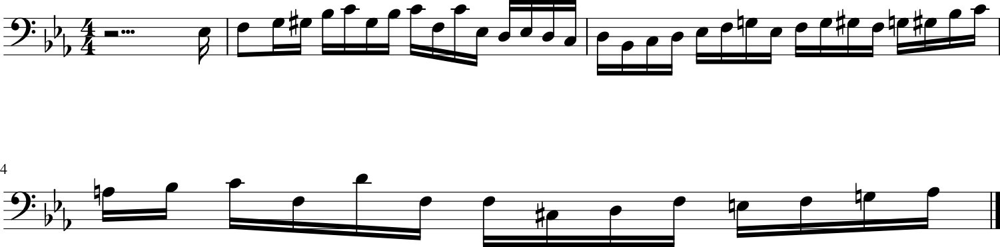

107/107 [==============================] - 66s 618ms/step - loss: 1.8234 - note_outputs_loss: 1.2792 - duration_outputs_loss: 0.5442
Epoch 150/5000
107/107 [==============================] - ETA: 0s - loss: 1.8280 - note_outputs_loss: 1.2824 - duration_outputs_loss: 0.5457[['START', 'C:major', '3/4TS', 'C4', 'C4', 'A3', 'B3', 'C4', 'D4', 'E3', 'G2', 'A3', 'B3', 'C4', 'B3', 'A3', 'B3', 'G3', 'B3', 'E3', 'G3', 'F3', 'E3', 'D3', 'C3', 'G2', 'G3', 'E3', 'C3', 'G2', 'C4', 'G3', 'E3', 'F3', 'C3', 'B2', 'C3', 'C2', 'E3', 'C3', 'C3', 'E3', 'F#3', 'G3', 'A3', 'E3', 'G3', 'F#3', 'A3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


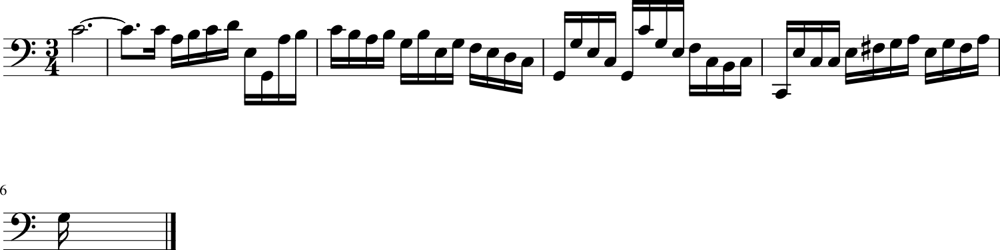

107/107 [==============================] - 65s 611ms/step - loss: 1.8280 - note_outputs_loss: 1.2824 - duration_outputs_loss: 0.5457
Epoch 151/5000
107/107 [==============================] - ETA: 0s - loss: 1.8149 - note_outputs_loss: 1.2693 - duration_outputs_loss: 0.5456[['START', 'E-:major', '4/4TS', 'rest', 'C3', 'C3', 'D3', 'E-3', 'F3', 'G3', 'A3', 'B-3', 'G3', 'A3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'C#4', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C4', 'A3', 'B-3', 'C4', 'B-3', 'A3', 'G3', 'F3', 'E-3', 'D3', 'E-3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.5', '0.25', '0.25', '0.25', '0.5', '0.75', '0.25', '0.5', '0.25', '0.25', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


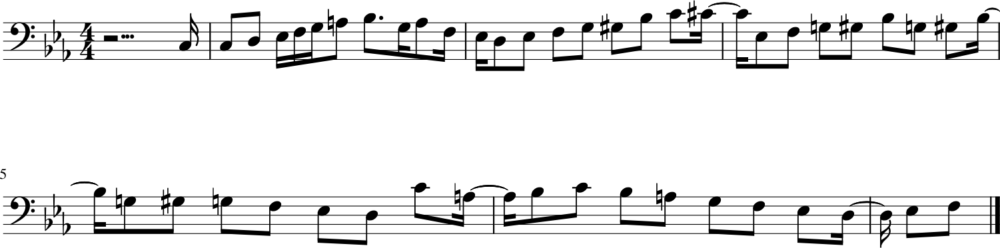

107/107 [==============================] - 65s 610ms/step - loss: 1.8149 - note_outputs_loss: 1.2693 - duration_outputs_loss: 0.5456
Epoch 152/5000
107/107 [==============================] - ETA: 0s - loss: 1.8156 - note_outputs_loss: 1.2698 - duration_outputs_loss: 0.5458[['START', 'E-:major', '12/8TS', 'rest', 'E-3', 'E-3', 'D3', 'E-3', 'D3', 'E-3', 'B-2', 'C3', 'D3', 'E-2', 'G3', 'F3', 'E-3', 'F3', 'B-3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'C4', 'C#4', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4'], ['0.0', '0.0', '0.0', '3.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


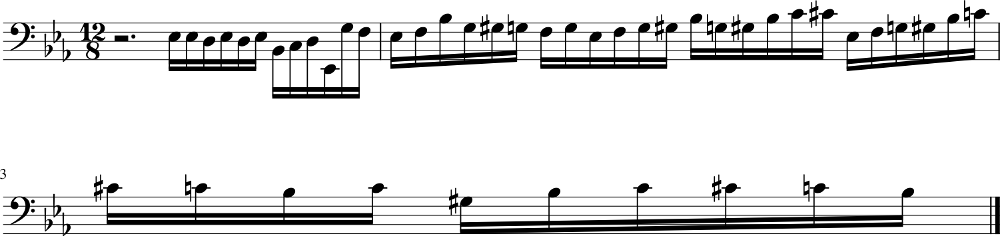

107/107 [==============================] - 66s 614ms/step - loss: 1.8156 - note_outputs_loss: 1.2698 - duration_outputs_loss: 0.5458
Epoch 153/5000
107/107 [==============================] - ETA: 0s - loss: 1.8121 - note_outputs_loss: 1.2660 - duration_outputs_loss: 0.5461[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'G3', 'E-3', 'B-3', 'C4', 'A3', 'B-3', 'C4', 'D4', 'E-4', 'F3', 'G3', 'A3', 'B-3', 'C4', 'A3', 'B-3', 'C4', 'D4', 'E-4', 'E-4', 'E-4', 'C4', 'D4', 'B-3', 'D4', 'A3', 'D4', 'G3', 'D4', 'F3', 'E-3', 'D4', 'C4', 'B-3', 'A3', 'C4'], ['0.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


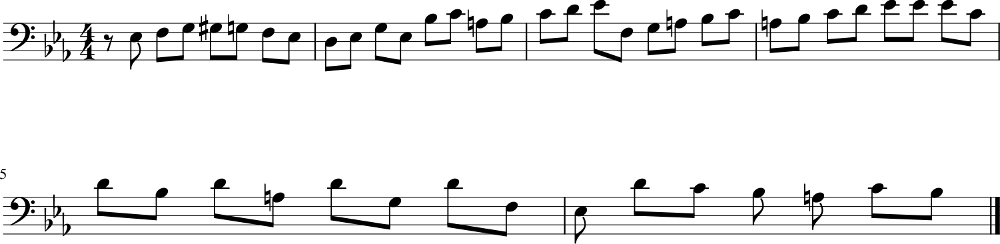

107/107 [==============================] - 65s 611ms/step - loss: 1.8121 - note_outputs_loss: 1.2660 - duration_outputs_loss: 0.5461
Epoch 154/5000
107/107 [==============================] - ETA: 0s - loss: 1.8100 - note_outputs_loss: 1.2676 - duration_outputs_loss: 0.5425[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'C4', 'B-3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'D3', 'F3', 'E-3', 'D3', 'E-3', 'D3', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'E-4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'B-2', 'D4'], ['0.0', '0.0', '0.0', '5.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


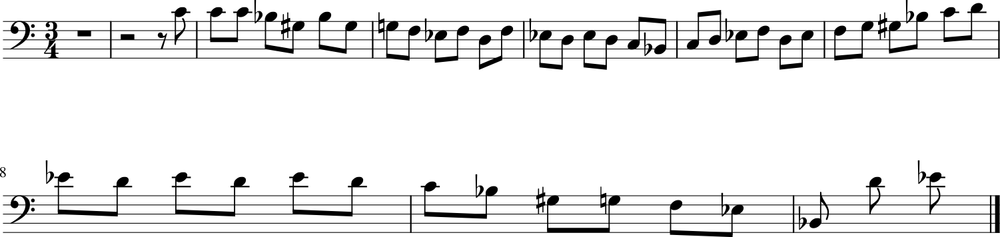

107/107 [==============================] - 65s 608ms/step - loss: 1.8100 - note_outputs_loss: 1.2676 - duration_outputs_loss: 0.5425
Epoch 155/5000
107/107 [==============================] - ETA: 0s - loss: 1.8061 - note_outputs_loss: 1.2627 - duration_outputs_loss: 0.5434[['START', 'C:major', '4/4TS', 'rest', 'G3', 'C4', 'G3', 'E3', 'F3', 'G3', 'E3', 'F3', 'D3', 'E3', 'C3', 'C2', 'C3', 'E-3', 'G#3', 'G3', 'G#3', 'F3', 'E-3', 'F3', 'E-3', 'D3', 'E-3', 'C3', 'B2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3'], ['0.0', '0.0', '0.0', '5.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


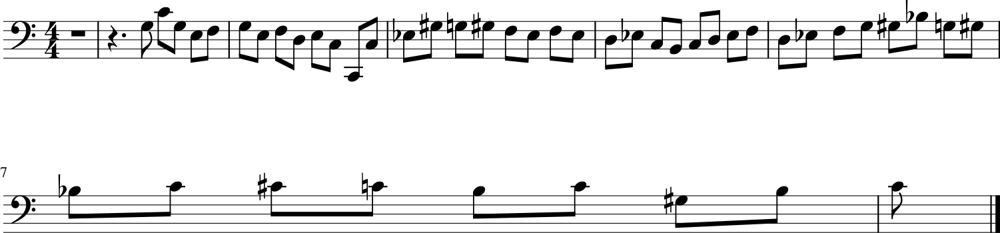

107/107 [==============================] - 65s 609ms/step - loss: 1.8061 - note_outputs_loss: 1.2627 - duration_outputs_loss: 0.5434
Epoch 156/5000
107/107 [==============================] - ETA: 0s - loss: 1.8077 - note_outputs_loss: 1.2623 - duration_outputs_loss: 0.5454[['START', 'C:major', '4/4TS', 'rest', 'G3', 'G3', 'E3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'C4', 'F3', 'A3', 'D3', 'D4', 'C4', 'B-3', 'A3', 'G3', 'A3', 'F3', 'D4', 'C4', 'G3', 'E-4', 'D4', 'E-4', 'F4', 'E-4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


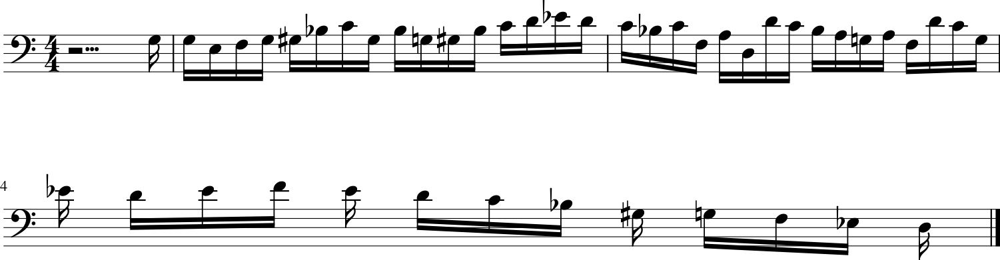

107/107 [==============================] - 66s 615ms/step - loss: 1.8077 - note_outputs_loss: 1.2623 - duration_outputs_loss: 0.5454
Epoch 157/5000
107/107 [==============================] - ETA: 0s - loss: 1.8023 - note_outputs_loss: 1.2590 - duration_outputs_loss: 0.5434[['START', 'E-:major', '4/4TS', 'rest', 'D4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'F3', 'G3', 'E-3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'B2', 'G3', 'D4', 'F4', 'E-4', 'C2', 'D4', 'C4', 'D4', 'B-3', 'D4', 'G3', 'F3', 'G3', 'E3', 'C#4', 'G3', 'E3', 'F3', 'D3', 'E3', 'F#3', 'G3', 'A3', 'B3', 'C4', 'D4', 'B3', 'G3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


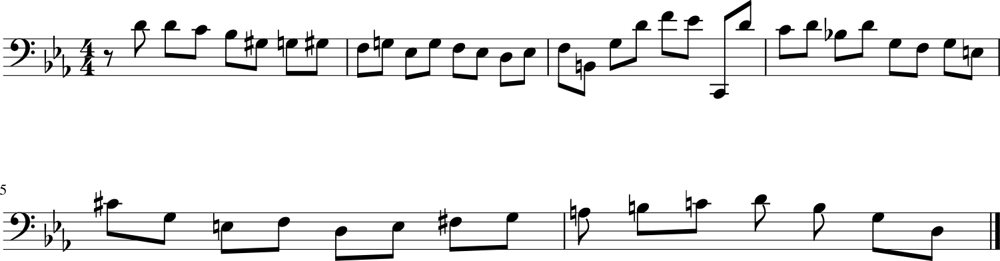

107/107 [==============================] - 65s 609ms/step - loss: 1.8023 - note_outputs_loss: 1.2590 - duration_outputs_loss: 0.5434
Epoch 158/5000
107/107 [==============================] - ETA: 0s - loss: 1.8020 - note_outputs_loss: 1.2580 - duration_outputs_loss: 0.5440[['START', 'C:major', '3/4TS', 'C4', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'G3', 'E3', 'G3', 'C4', 'A3', 'B-3', 'C4', 'B-3', 'A3', 'G3', 'F#3', 'G3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'D4', 'C4', 'B3', 'A3', 'B3', 'G3', 'D3', 'D3', 'D3', 'B2', 'G2', 'D3', 'B3', 'D3', 'E3', 'F3', 'G3', 'G3', 'F3', 'G3', 'G#3', 'G3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


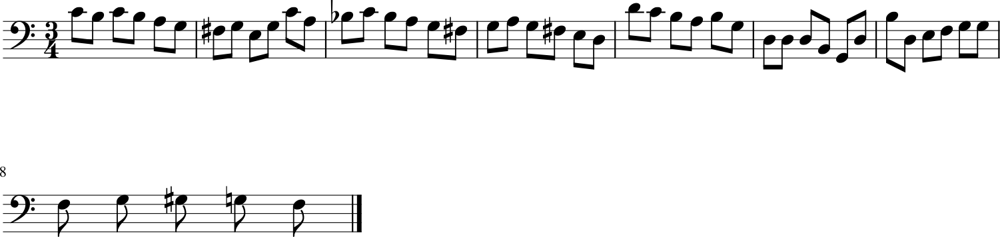

107/107 [==============================] - 65s 612ms/step - loss: 1.8020 - note_outputs_loss: 1.2580 - duration_outputs_loss: 0.5440
Epoch 159/5000
107/107 [==============================] - ETA: 0s - loss: 1.8028 - note_outputs_loss: 1.2550 - duration_outputs_loss: 0.5478[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'B-2', 'C3', 'D3', 'E-3', 'C#4', 'G#2', 'C#4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'C#3', 'E-3', 'C3', 'C#3', 'F3', 'G3', 'F3', 'F#3', 'E-3', 'D3', 'C3', 'B-2', 'C3', 'A2', 'C3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


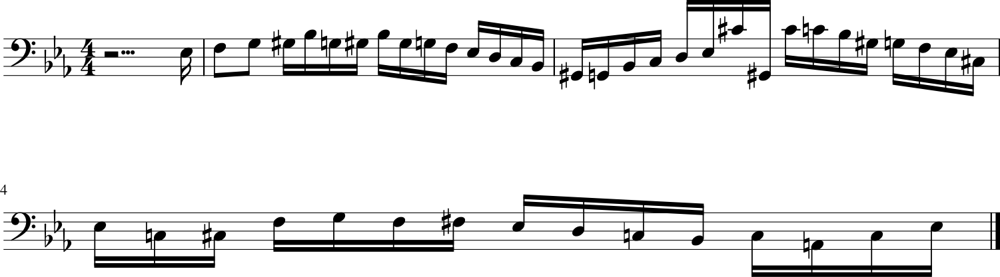

107/107 [==============================] - 65s 610ms/step - loss: 1.8028 - note_outputs_loss: 1.2550 - duration_outputs_loss: 0.5478
Epoch 160/5000
107/107 [==============================] - ETA: 0s - loss: 1.7972 - note_outputs_loss: 1.2560 - duration_outputs_loss: 0.5413[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'F#3', 'F3', 'F#3', 'E-3', 'D3', 'E-3', 'C3', 'B-2', 'C3', 'B-2', 'C3', 'A2', 'C3', 'E-3', 'D3', 'C3', 'D3', 'E-3', 'C3', 'E-3', 'D3', 'C3', 'D3', 'B2', 'C3', 'E-3'], ['0.0', '0.0', '0.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '0.5', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


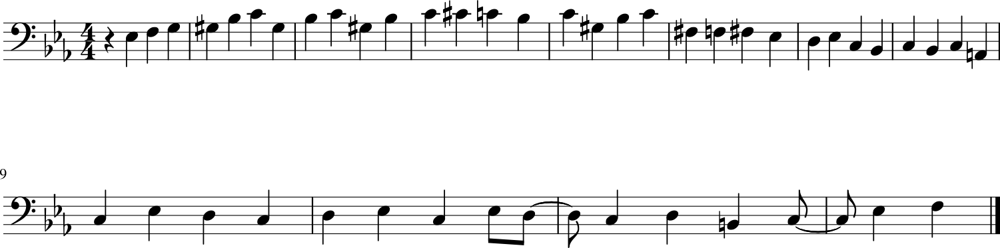

107/107 [==============================] - 66s 619ms/step - loss: 1.7972 - note_outputs_loss: 1.2560 - duration_outputs_loss: 0.5413
Epoch 161/5000
107/107 [==============================] - ETA: 0s - loss: 1.7962 - note_outputs_loss: 1.2490 - duration_outputs_loss: 0.5472[['START', 'E-:major', '3/4TS', 'rest', 'E-3', 'E-3', 'B-2', 'C3', 'D3', 'E-3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'G#3', 'F3', 'G3', 'B-3', 'E-4', 'G3', 'F3', 'E-3', 'B-2', 'D4', 'E-4', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'G3', 'E-3', 'G3', 'F3', 'E-3', 'D3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


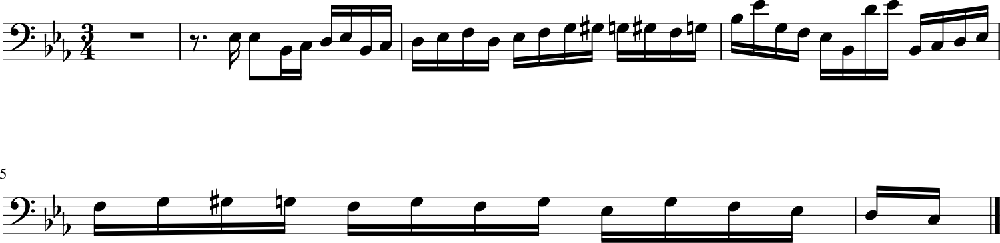

107/107 [==============================] - 65s 610ms/step - loss: 1.7962 - note_outputs_loss: 1.2490 - duration_outputs_loss: 0.5472
Epoch 162/5000
107/107 [==============================] - ETA: 0s - loss: 1.7900 - note_outputs_loss: 1.2453 - duration_outputs_loss: 0.5447[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'F3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'F3', 'F3', 'F3', 'C3', 'B-2', 'F3', 'F3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'B-2', 'C3', 'D3', 'E-3', 'C#4', 'G#2', 'C#4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'F2', 'G#2'], ['0.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


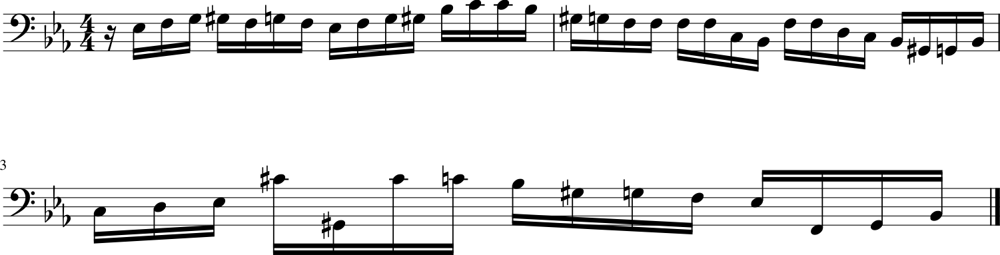

107/107 [==============================] - 65s 611ms/step - loss: 1.7900 - note_outputs_loss: 1.2453 - duration_outputs_loss: 0.5447
Epoch 163/5000
107/107 [==============================] - ETA: 0s - loss: 1.7864 - note_outputs_loss: 1.2432 - duration_outputs_loss: 0.5432[['START', 'E-:major', '4/4TS', 'G2', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G#3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2', 'G2', 'G#2', 'F2', 'E-3', 'C3', 'D3', 'E-3', 'E-2', 'C3', 'F3', 'E-3', 'F3', 'D3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.25', '0.25', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


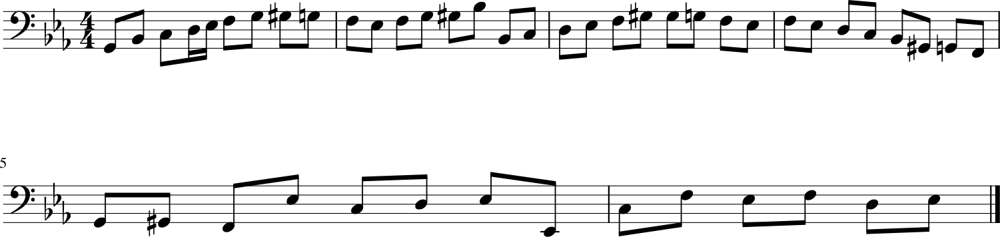

107/107 [==============================] - 65s 612ms/step - loss: 1.7864 - note_outputs_loss: 1.2432 - duration_outputs_loss: 0.5432
Epoch 164/5000
107/107 [==============================] - ETA: 0s - loss: 1.7816 - note_outputs_loss: 1.2382 - duration_outputs_loss: 0.5434[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'E-2', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'B-3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'E-3', 'G3', 'B-3', 'A3', 'C4', 'B-3', 'A3', 'G3', 'F3', 'A3', 'D3', 'E3', 'F3', 'A3', 'G3', 'A3', 'G3', 'B-3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


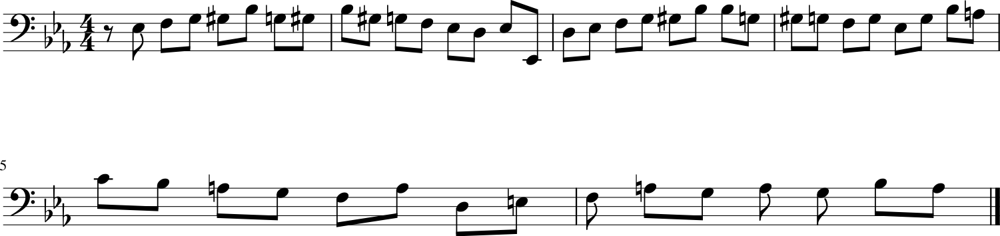

107/107 [==============================] - 66s 615ms/step - loss: 1.7816 - note_outputs_loss: 1.2382 - duration_outputs_loss: 0.5434
Epoch 165/5000
107/107 [==============================] - ETA: 0s - loss: 1.7894 - note_outputs_loss: 1.2447 - duration_outputs_loss: 0.5447[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C4', 'G2', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'E-3', 'F2', 'D3', 'D3', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'B-3', 'C4'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


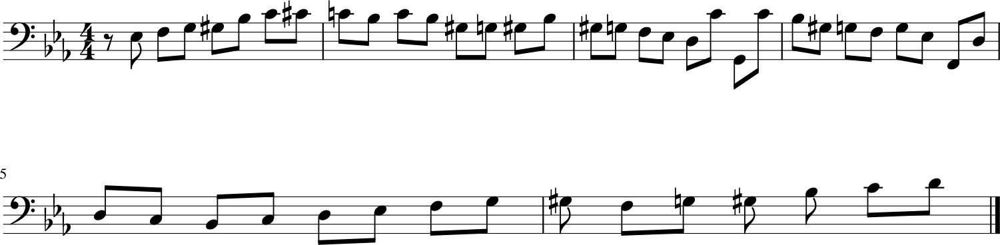

107/107 [==============================] - 66s 613ms/step - loss: 1.7894 - note_outputs_loss: 1.2447 - duration_outputs_loss: 0.5447
Epoch 166/5000
107/107 [==============================] - ETA: 0s - loss: 1.7792 - note_outputs_loss: 1.2356 - duration_outputs_loss: 0.5437[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'E-3', 'D3', 'C3', 'D3', 'B-2', 'B-2', 'G3', 'B-3', 'B-3', 'B-3', 'B-3', 'D3', 'E-3', 'B-2', 'C3', 'B-3', 'A3', 'E-2'], ['0.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]

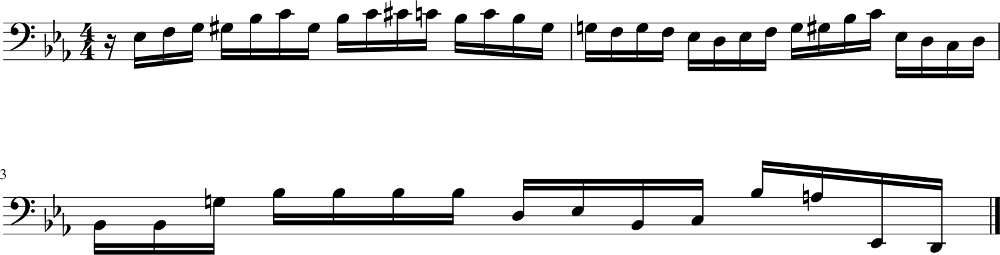

107/107 [==============================] - 66s 621ms/step - loss: 1.7792 - note_outputs_loss: 1.2356 - duration_outputs_loss: 0.5437
Epoch 167/5000
107/107 [==============================] - ETA: 0s - loss: 1.7826 - note_outputs_loss: 1.2375 - duration_outputs_loss: 0.5452[['START', 'C:major', '4/4TS', 'rest', 'G3', 'C4', 'B3', 'C4', 'D4', 'E3', 'C4', 'D4', 'C4', 'B3', 'A3', 'B3', 'G3', 'D3', 'E3', 'F3', 'D3', 'B2', 'A2', 'B2', 'G3', 'F3', 'E3', 'D3', 'E3', 'C3', 'D3', 'E3', 'F3', 'G3', 'E3', 'F3', 'C4', 'B3', 'C4', 'B3', 'G3', 'F3', 'D3', 'F3', 'E3', 'D3', 'C3', 'D3', 'B2'], ['0.0', '0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


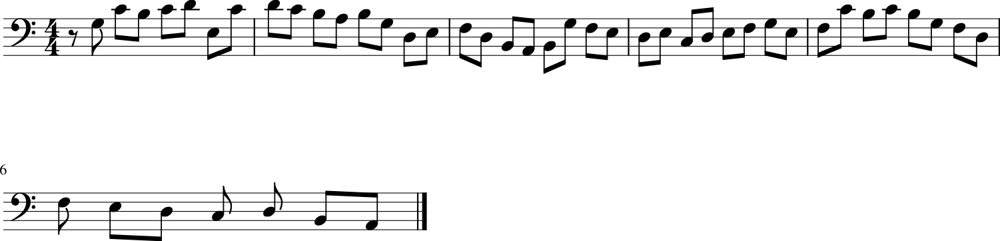

107/107 [==============================] - 69s 649ms/step - loss: 1.7826 - note_outputs_loss: 1.2375 - duration_outputs_loss: 0.5452
Epoch 168/5000
107/107 [==============================] - ETA: 0s - loss: 1.7772 - note_outputs_loss: 1.2338 - duration_outputs_loss: 0.5433[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'C4', 'G3', 'E3', 'F3', 'D3', 'E3', 'C3', 'G2', 'E3', 'D3', 'E3', 'F3', 'C3', 'B2', 'E3', 'F3', 'A2', 'G2', 'E3', 'F2', 'D3', 'A2', 'F2', 'E2', 'C#3', 'D3', 'E3', 'F3', 'G3', 'A3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'A3', 'G3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


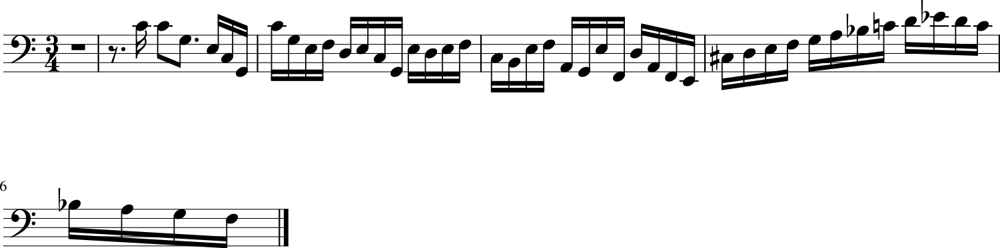

107/107 [==============================] - 69s 642ms/step - loss: 1.7772 - note_outputs_loss: 1.2338 - duration_outputs_loss: 0.5433
Epoch 169/5000
107/107 [==============================] - ETA: 0s - loss: 1.7791 - note_outputs_loss: 1.2310 - duration_outputs_loss: 0.5481[['START', 'G:major', '4/4TS', 'rest', 'B3', 'B3', 'B3', 'C4', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'C4', 'B3', 'A3', 'B3', 'G2', 'A2', 'B2', 'C3', 'D3', 'G2', 'B-3', 'B-3', 'D3', 'E3', 'C3', 'B-2', 'C3', 'B-2', 'A2', 'G2', 'F2', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'C#3', 'B-3', 'G#3', 'A3', 'E4', 'C#4'], ['0.0', '0.0', '0.0', '2.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


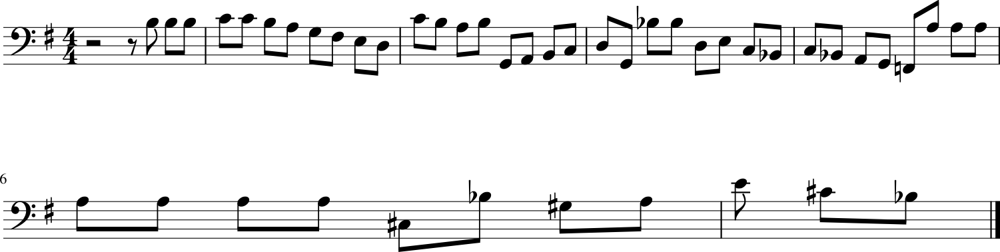

107/107 [==============================] - 68s 632ms/step - loss: 1.7791 - note_outputs_loss: 1.2310 - duration_outputs_loss: 0.5481
Epoch 170/5000
107/107 [==============================] - ETA: 0s - loss: 1.7720 - note_outputs_loss: 1.2277 - duration_outputs_loss: 0.5443[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'G3', 'G#3', 'F3', 'F2', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'B-3', 'E-4', 'C2', 'D4', 'C4', 'D4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'B-2', 'C3', 'D3', 'E-3'], ['0.0', '0.0', '0.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


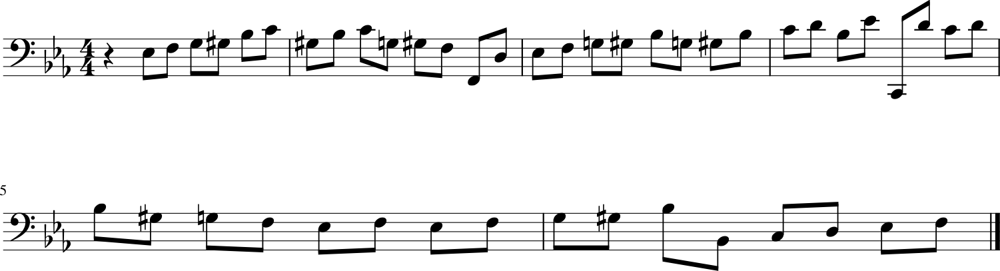

107/107 [==============================] - 64s 601ms/step - loss: 1.7720 - note_outputs_loss: 1.2277 - duration_outputs_loss: 0.5443
Epoch 171/5000
107/107 [==============================] - ETA: 0s - loss: 1.7738 - note_outputs_loss: 1.2290 - duration_outputs_loss: 0.5448[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'G#3', 'B-3', 'G3', 'E-3', 'B2', 'C3', 'G#3', 'E-3', 'F3', 'D3', 'G#2', 'E-2', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B2', 'A2', 'C3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'E-3', 'D3', 'C3', 'B2', 'A2', 'G2', 'D3', 'F3', 'B3', 'D4', 'C4', 'B3'], ['0.0', '0.0', '0.0', '3.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


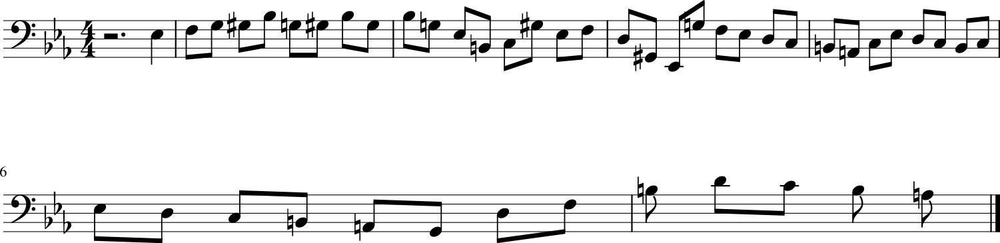

107/107 [==============================] - 66s 615ms/step - loss: 1.7738 - note_outputs_loss: 1.2290 - duration_outputs_loss: 0.5448
Epoch 172/5000
107/107 [==============================] - ETA: 0s - loss: 1.7587 - note_outputs_loss: 1.2202 - duration_outputs_loss: 0.5385[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C4', 'G2', 'B-2', 'C3', 'D3'], ['0.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


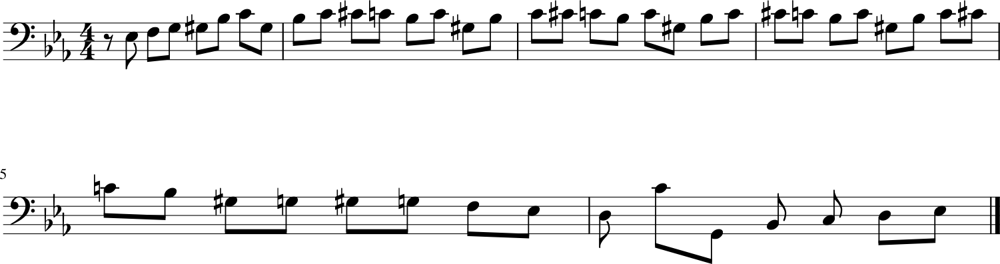

107/107 [==============================] - 65s 607ms/step - loss: 1.7587 - note_outputs_loss: 1.2202 - duration_outputs_loss: 0.5385
Epoch 173/5000
107/107 [==============================] - ETA: 0s - loss: 1.7726 - note_outputs_loss: 1.2255 - duration_outputs_loss: 0.5471[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E3', 'F3', 'G3', 'E3', 'C3', 'G2', 'E3', 'D3', 'E3', 'F3', 'C3', 'B2', 'C3', 'E3', 'A3', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'C3', 'B2', 'A2', 'G2', 'F#2', 'B3', 'C4', 'D4', 'D3', 'C#3', 'B2', 'D2', 'F#3', 'G3', 'A3', 'E3'], ['0.0', '0.0', '0.0', '5.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


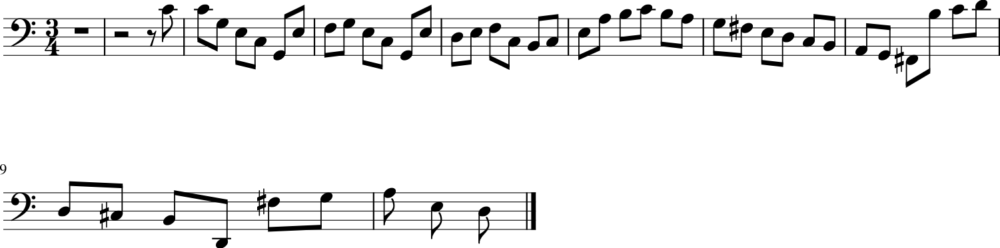

107/107 [==============================] - 65s 605ms/step - loss: 1.7726 - note_outputs_loss: 1.2255 - duration_outputs_loss: 0.5471
Epoch 174/5000
107/107 [==============================] - ETA: 0s - loss: 1.7593 - note_outputs_loss: 1.2191 - duration_outputs_loss: 0.5403[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E2', 'C2', 'C4', 'D4', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'G2', 'D3', 'C2', 'F3', 'E3', 'D3', 'E3', 'C3', 'B2', 'C3', 'D3', 'E3', 'F3', 'G3', 'A3', 'B3', 'C4', 'D4', 'B3', 'C4', 'A3', 'B3', 'G3', 'A3', 'B3', 'C4', 'D4'], ['0.0', '0.0', '0.0', '3.75', '0.25', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


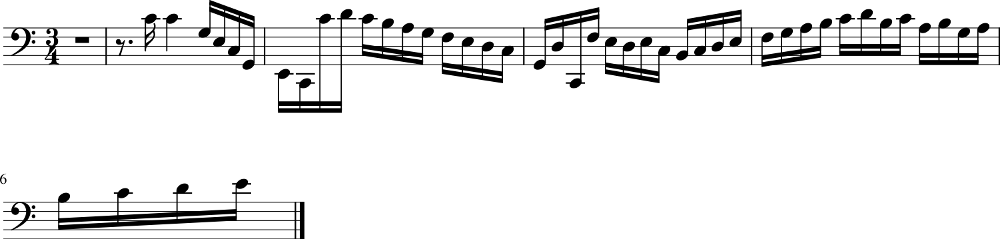

107/107 [==============================] - 65s 607ms/step - loss: 1.7593 - note_outputs_loss: 1.2191 - duration_outputs_loss: 0.5403
Epoch 175/5000
107/107 [==============================] - ETA: 0s - loss: 1.7596 - note_outputs_loss: 1.2154 - duration_outputs_loss: 0.5441[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'G3', 'G#3', 'F3', 'F2', 'D3', 'E-3', 'C3', 'D3', 'B-3', 'D3', 'E-3', 'E-2', 'G3', 'G#3', 'B-3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'A3', 'G3', 'A3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'A3', 'G3', 'D3', 'G3'], ['0.0', '0.0', '0.0', '1.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


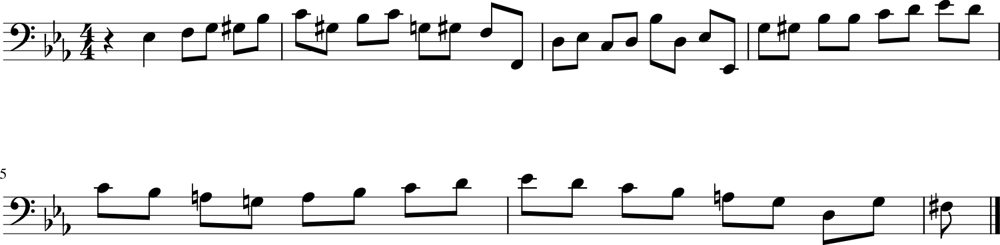

107/107 [==============================] - 65s 611ms/step - loss: 1.7596 - note_outputs_loss: 1.2154 - duration_outputs_loss: 0.5441
Epoch 176/5000
107/107 [==============================] - ETA: 0s - loss: 1.7655 - note_outputs_loss: 1.2200 - duration_outputs_loss: 0.5456[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'F3', 'E-4', 'D4', 'C4', 'D4', 'B-3', 'E-4', 'E-3', 'C4', 'F3', 'A3', 'G3', 'E-4', 'D4', 'C4', 'B-3', 'A3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'E-3', 'D3', 'C3', 'D3', 'B-2', 'C3', 'D3', 'E-3', 'F3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


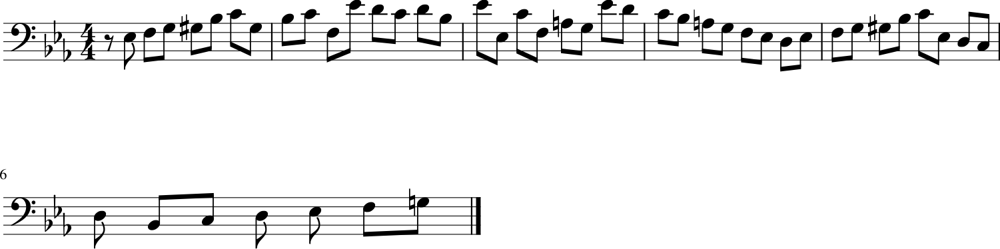

107/107 [==============================] - 65s 610ms/step - loss: 1.7655 - note_outputs_loss: 1.2200 - duration_outputs_loss: 0.5456
Epoch 177/5000
107/107 [==============================] - ETA: 0s - loss: 1.7570 - note_outputs_loss: 1.2124 - duration_outputs_loss: 0.5445[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E2', 'C2', 'C4', 'D4', 'C4', 'B3', 'G3', 'E3', 'F3', 'G3', 'E3', 'F3', 'D3', 'C#3', 'B2', 'A2', 'G2', 'B3', 'G3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'C3', 'B2', 'A2', 'G2', 'F#2', 'E2'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


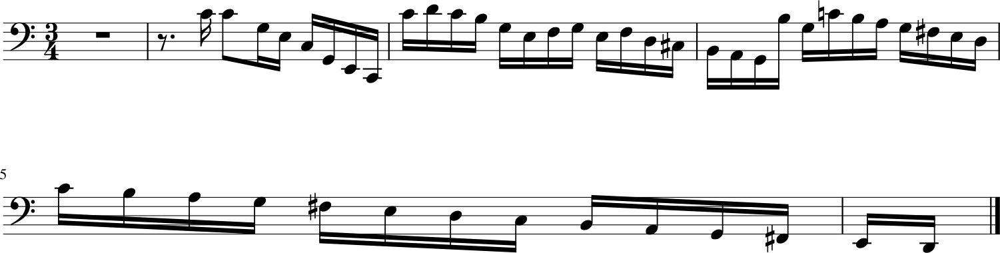

107/107 [==============================] - 65s 609ms/step - loss: 1.7570 - note_outputs_loss: 1.2124 - duration_outputs_loss: 0.5445
Epoch 178/5000
107/107 [==============================] - ETA: 0s - loss: 1.7490 - note_outputs_loss: 1.2065 - duration_outputs_loss: 0.5425[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G#3', 'B-3', 'E-4', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'B-3', 'G#3', 'F2', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C4', 'A3', 'B-3', 'A3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'C3', 'B-2', 'A2', 'E-3', 'G2'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


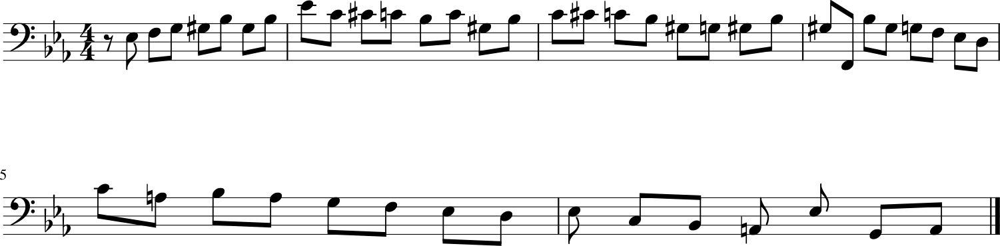

107/107 [==============================] - 66s 618ms/step - loss: 1.7490 - note_outputs_loss: 1.2065 - duration_outputs_loss: 0.5425
Epoch 179/5000
107/107 [==============================] - ETA: 0s - loss: 1.7612 - note_outputs_loss: 1.2155 - duration_outputs_loss: 0.5457[['START', 'C:major', '3/4TS', 'C4', 'rest', 'G3', 'C4', 'D4', 'B-3', 'C3', 'B-2', 'D3', 'E3', 'C3', 'B-2', 'G#2', 'G2', 'G#2', 'C3', 'G2', 'F2', 'E-3', 'C3', 'D3', 'E-3', 'C3', 'B2', 'D3', 'C3', 'B2', 'G2', 'A2', 'B2', 'C3', 'D3', 'E-3', 'C3', 'B2', 'C3', 'E-3', 'D3', 'E-3', 'C3', 'D3', 'E-3', 'F3', 'G3', 'E-3', 'F3'], ['0.0', '0.0', '0.0', '5.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


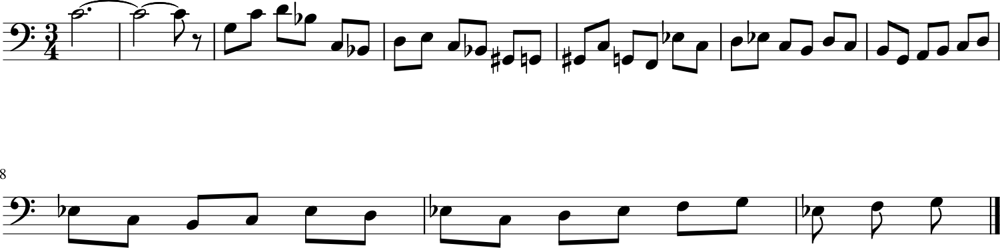

107/107 [==============================] - 66s 614ms/step - loss: 1.7612 - note_outputs_loss: 1.2155 - duration_outputs_loss: 0.5457
Epoch 180/5000
107/107 [==============================] - ETA: 0s - loss: 1.7580 - note_outputs_loss: 1.2125 - duration_outputs_loss: 0.5455[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'C4', 'G3', 'E3', 'C3', 'B-2', 'B-2', 'G#2', 'G2', 'G#2', 'G3', 'F3', 'E3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3', 'B2', 'D3', 'G#3', 'D3', 'B2', 'G3', 'E-3', 'C2', 'G3', 'C4', 'B3', 'C4', 'B3', 'E-4', 'C4', 'D4', 'B3', 'C4', 'A3', 'D4', 'F#3', 'B3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


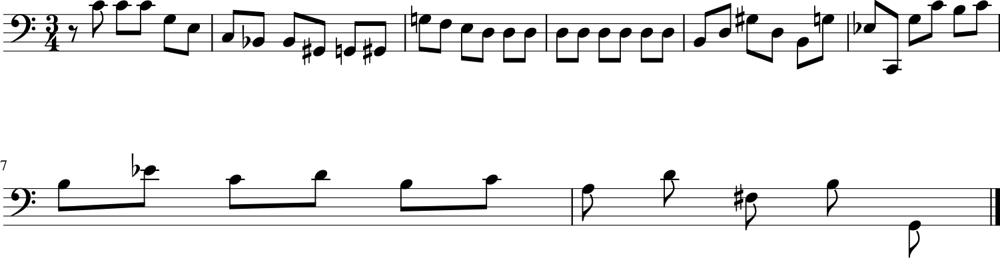

107/107 [==============================] - 65s 608ms/step - loss: 1.7580 - note_outputs_loss: 1.2125 - duration_outputs_loss: 0.5455
Epoch 181/5000
107/107 [==============================] - ETA: 0s - loss: 1.7571 - note_outputs_loss: 1.2108 - duration_outputs_loss: 0.5463[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'B-3', 'G#3', 'G3', 'G#3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C4', 'B3', 'C4', 'G#3', 'F3', 'G#3', 'D3', 'C4', 'G3', 'B-3', 'G#3', 'G3', 'F3', 'E3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


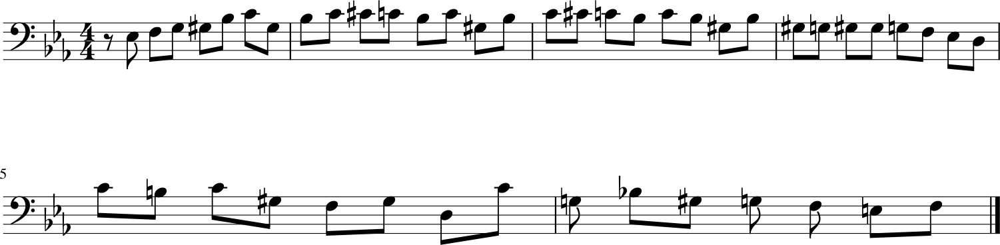

107/107 [==============================] - 65s 605ms/step - loss: 1.7571 - note_outputs_loss: 1.2108 - duration_outputs_loss: 0.5463
Epoch 182/5000
107/107 [==============================] - ETA: 0s - loss: 1.7449 - note_outputs_loss: 1.2016 - duration_outputs_loss: 0.5433[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'G3', 'E-3', 'F2', 'D3', 'C3', 'D3', 'E-3', 'C3', 'D3', 'E-3'], ['0.0', '3.0', '3.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '0.5', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


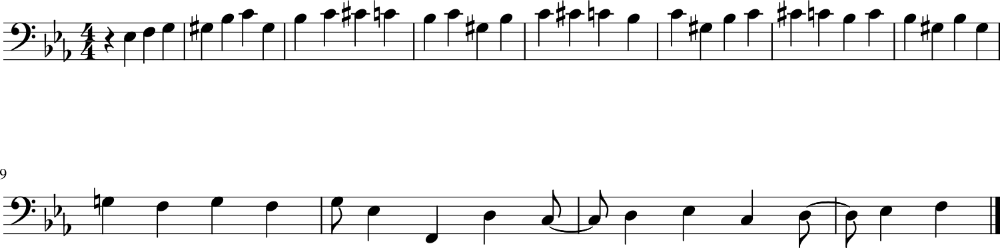

107/107 [==============================] - 66s 619ms/step - loss: 1.7449 - note_outputs_loss: 1.2016 - duration_outputs_loss: 0.5433
Epoch 183/5000
107/107 [==============================] - ETA: 0s - loss: 1.7543 - note_outputs_loss: 1.2070 - duration_outputs_loss: 0.5473[['START', 'C:major', '4/4TS', 'G2', 'E3', 'G2', 'G2', 'E3', 'G2', 'E3', 'G2', 'E3', 'G2', 'F3', 'G2', 'E3', 'G2', 'D3', 'G2', 'E3', 'G2', 'F3', 'G2', 'E3', 'G2', 'D3', 'G2', 'E3', 'G2', 'F3', 'G2', 'E3', 'G2', 'D3', 'G2', 'E3', 'G2', 'F#3', 'G2', 'G3', 'G2', 'F#3', 'G2', 'G3', 'G2', 'A3', 'G2', 'G3', 'G2'], ['0.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


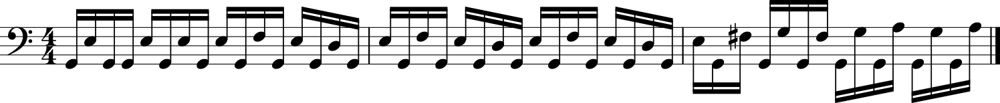

107/107 [==============================] - 66s 612ms/step - loss: 1.7543 - note_outputs_loss: 1.2070 - duration_outputs_loss: 0.5473
Epoch 184/5000
107/107 [==============================] - ETA: 0s - loss: 1.7423 - note_outputs_loss: 1.1988 - duration_outputs_loss: 0.5435[['START', 'C:major', '3/4TS', 'C4', 'C4', 'A3', 'B3', 'G3', 'F3', 'E3', 'G3', 'C4', 'E4', 'C4', 'G#3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'G3', 'F3', 'E-3', 'D3', 'F3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'G#2', 'B3', 'C4', 'B3', 'A3', 'G3', 'C4', 'G3', 'A3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3'], ['0.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


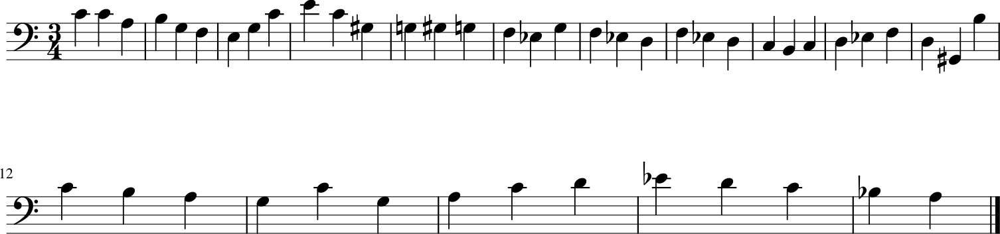

107/107 [==============================] - 66s 615ms/step - loss: 1.7423 - note_outputs_loss: 1.1988 - duration_outputs_loss: 0.5435
Epoch 185/5000
107/107 [==============================] - ETA: 0s - loss: 1.7388 - note_outputs_loss: 1.1988 - duration_outputs_loss: 0.5400[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'F3', 'F3', 'F3', 'F3', 'A2', 'C3', 'F3', 'E-3', 'D3', 'E-3', 'C3', 'B-2', 'G#2', 'G2', 'B-2', 'C3', 'D3', 'E-3', 'C#4', 'G#2', 'C#4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C4', 'G2'], ['0.0', '0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


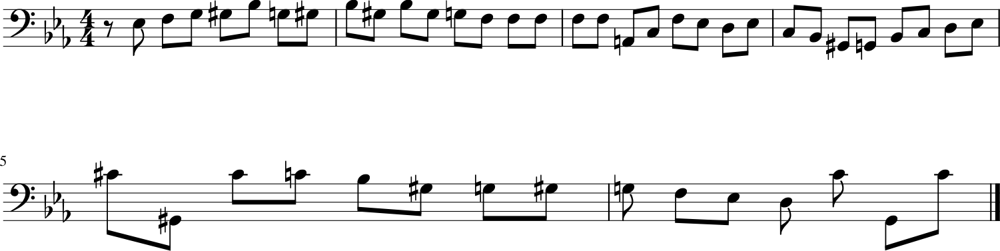

107/107 [==============================] - 66s 614ms/step - loss: 1.7388 - note_outputs_loss: 1.1988 - duration_outputs_loss: 0.5400
Epoch 186/5000
107/107 [==============================] - ETA: 0s - loss: 1.7459 - note_outputs_loss: 1.1959 - duration_outputs_loss: 0.5500[['START', 'C:major', '3/4TS', 'C4', 'C4', 'G3', 'E3', 'F3', 'G3', 'G#3', 'B-3', 'G#3', 'B-3', 'C4', 'D4', 'E-3', 'F3', 'G3', 'C3', 'E-3', 'G2', 'C3', 'E-3', 'G3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'G3', 'E-3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'C3', 'C2', 'G3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


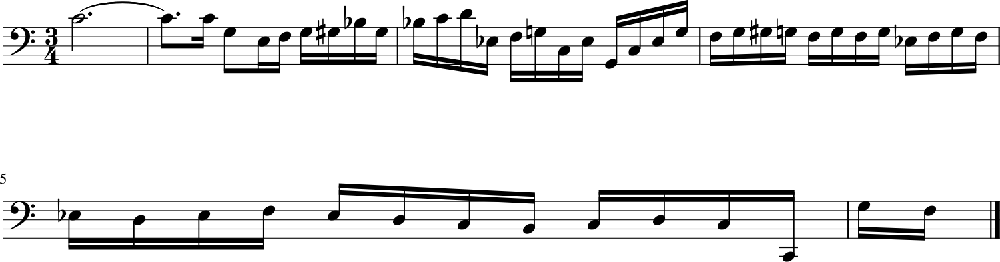

107/107 [==============================] - 66s 612ms/step - loss: 1.7459 - note_outputs_loss: 1.1959 - duration_outputs_loss: 0.5500
Epoch 187/5000
107/107 [==============================] - ETA: 0s - loss: 1.7445 - note_outputs_loss: 1.1961 - duration_outputs_loss: 0.5484[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'F3', 'G3', 'G#3', 'F3', 'E3', 'D3', 'C3', 'B2', 'A2', 'B3', 'C4', 'B3', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'F3', 'D3', 'B2', 'C3', 'G3', 'A3', 'F3', 'D3', 'B2', 'A3', 'G3', 'F3', 'E3', 'D3', 'E3', 'C3', 'C2', 'C3', 'D3', 'E3', 'F#3', 'G3', 'E3'], ['0.0', '0.0', '0.0', '5.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


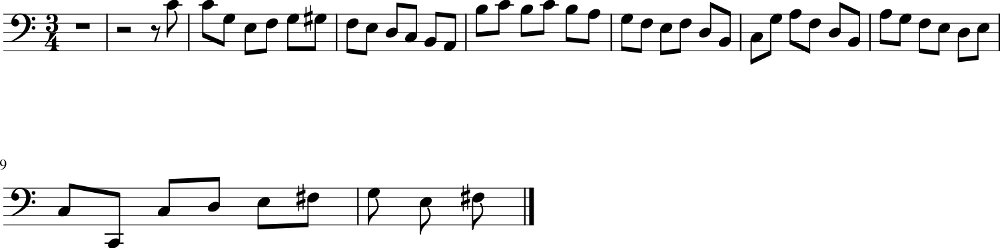

107/107 [==============================] - 66s 616ms/step - loss: 1.7445 - note_outputs_loss: 1.1961 - duration_outputs_loss: 0.5484
Epoch 188/5000
107/107 [==============================] - ETA: 0s - loss: 1.7348 - note_outputs_loss: 1.1929 - duration_outputs_loss: 0.5419[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'G3', 'G#3', 'F3', 'F2', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'F3', 'C#4', 'G3', 'C#4', 'C4', 'B-3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


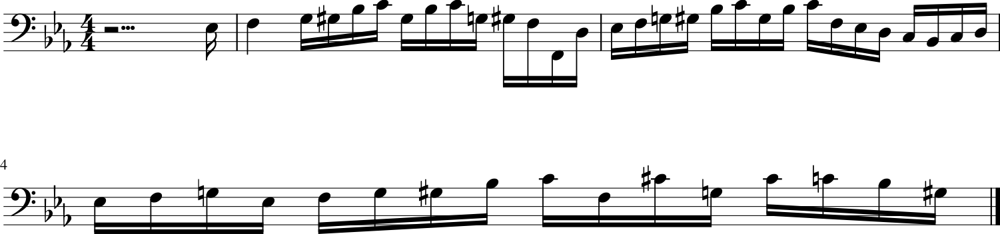

107/107 [==============================] - 65s 611ms/step - loss: 1.7348 - note_outputs_loss: 1.1929 - duration_outputs_loss: 0.5419
Epoch 189/5000
107/107 [==============================] - ETA: 0s - loss: 1.7357 - note_outputs_loss: 1.1894 - duration_outputs_loss: 0.5463[['START', 'C:major', '4/4TS', 'rest', 'G3', 'G3', 'E3', 'F3', 'G3', 'G#3', 'B-3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'D3', 'C4', 'G2', 'B-2', 'C3', 'D3', 'E3', 'F3', 'D3', 'G3', 'E3', 'D3', 'E3', 'F3', 'D3', 'G3', 'E3', 'D3', 'E3', 'F3', 'D3', 'G3', 'E3', 'D3', 'E3', 'F3', 'D3', 'G3', 'E3', 'D3', 'E3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


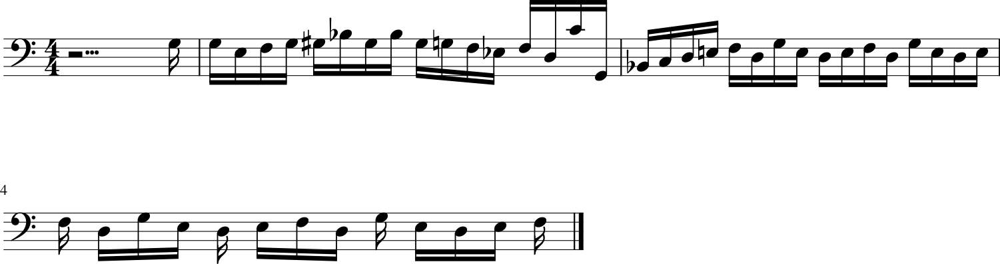

107/107 [==============================] - 66s 615ms/step - loss: 1.7357 - note_outputs_loss: 1.1894 - duration_outputs_loss: 0.5463
Epoch 190/5000
107/107 [==============================] - ETA: 0s - loss: 1.7287 - note_outputs_loss: 1.1854 - duration_outputs_loss: 0.5433[['START', 'C:major', '3/8TS', 'rest', 'C4', 'C4', 'B3', 'A3', 'G3', 'F#3', 'G3', 'E3', 'G3', 'F#3', 'E3', 'D3', 'C#3', 'B2', 'C#3', 'D3', 'E3', 'F#3', 'G3', 'A3', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'E3', 'F#3', 'D3', 'A3', 'F#3', 'D3', 'A3', 'E3', 'A3', 'F#3', 'A3', 'D3', 'A3', 'D3', 'E3', 'F#3', 'D4'], ['0.0', '0.0', '0.0', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


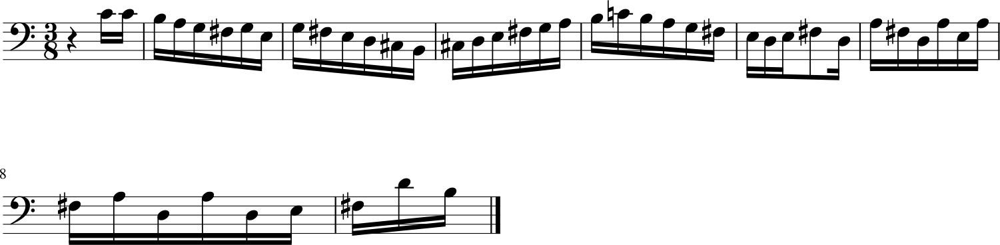

107/107 [==============================] - 65s 609ms/step - loss: 1.7287 - note_outputs_loss: 1.1854 - duration_outputs_loss: 0.5433
Epoch 191/5000
107/107 [==============================] - ETA: 0s - loss: 1.7349 - note_outputs_loss: 1.1916 - duration_outputs_loss: 0.5433[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'G3', 'G#3', 'F3', 'F2', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'D3', 'C3', 'G3', 'G2', 'B-2', 'C3', 'D3', 'E-3', 'D4', 'C4', 'B-3', 'A3', 'G3', 'F3', 'E3', 'F3', 'G3', 'A3', 'B-3', 'C4', 'A3', 'B-3'], ['0.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


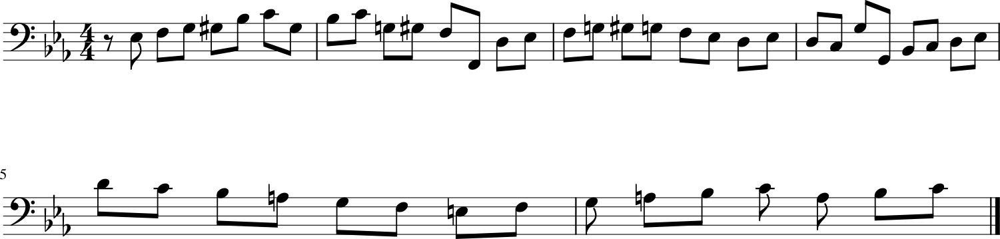

107/107 [==============================] - 65s 610ms/step - loss: 1.7349 - note_outputs_loss: 1.1916 - duration_outputs_loss: 0.5433
Epoch 192/5000
107/107 [==============================] - ETA: 0s - loss: 1.7416 - note_outputs_loss: 1.1953 - duration_outputs_loss: 0.5463[['START', 'C:major', '3/4TS', 'C4', 'C4', 'A3', 'B3', 'G3', 'F#3', 'E3', 'D3', 'C3', 'B2', 'A2', 'G2', 'D3', 'E3', 'A2', 'G2', 'D3', 'G2', 'D3', 'G2', 'A2', 'G2', 'D3', 'G2', 'A2', 'G2', 'E3', 'G2', 'A2', 'G2', 'F#3', 'G2', 'A2', 'G2', 'G3', 'C4', 'B3', 'A3', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'B2'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


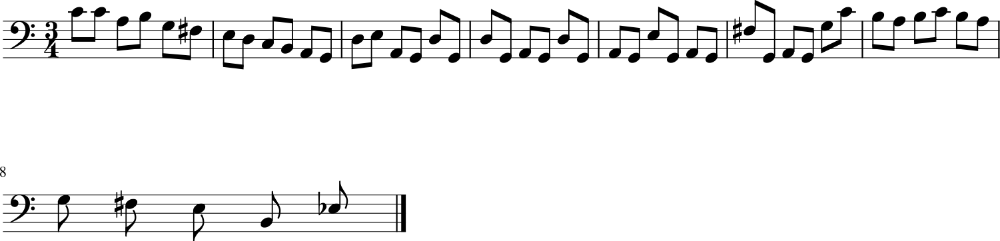

107/107 [==============================] - 65s 606ms/step - loss: 1.7416 - note_outputs_loss: 1.1953 - duration_outputs_loss: 0.5463
Epoch 193/5000
107/107 [==============================] - ETA: 0s - loss: 1.7393 - note_outputs_loss: 1.1917 - duration_outputs_loss: 0.5476[['START', 'C:major', '3/4TS', 'C4', 'C4', 'A3', 'F3', 'E3', 'D3', 'C3', 'B2', 'A2', 'B2', 'D3', 'E3', 'F3', 'C3', 'B2', 'C3', 'A2', 'B2', 'D3', 'G2', 'F2', 'G3', 'G3', 'E3', 'F#3', 'D3', 'F#3', 'A3', 'C4', 'E-4', 'D4', 'E-4', 'D4', 'E-4', 'F#3', 'E-4', 'B3', 'E-4', 'D4', 'C4', 'B-3', 'F#3', 'G3', 'D3', 'E-3', 'G3'], ['0.0', '0.0', '0.0', '5.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


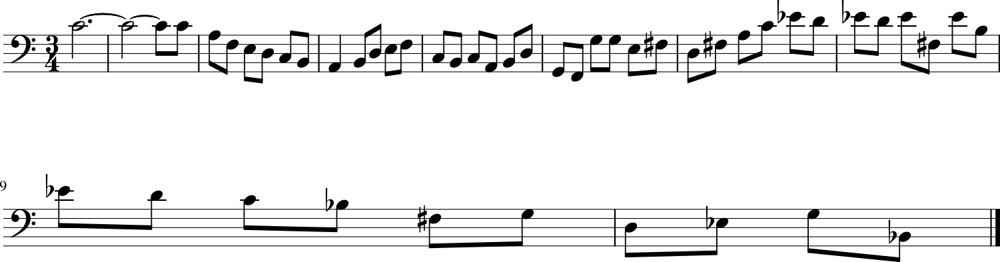

107/107 [==============================] - 66s 616ms/step - loss: 1.7393 - note_outputs_loss: 1.1917 - duration_outputs_loss: 0.5476
Epoch 194/5000
107/107 [==============================] - ETA: 0s - loss: 1.7369 - note_outputs_loss: 1.1914 - duration_outputs_loss: 0.5455[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E2', 'C2', 'C4', 'D4', 'D4', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'G2', 'B3', 'G3', 'F3', 'E3', 'D3', 'E3', 'C3', 'D3', 'E3', 'C3', 'A2', 'C3', 'E3', 'C3', 'G2', 'C3', 'E3', 'C3', 'E3', 'C3', 'E3', 'C3', 'E3', 'C3', 'E3'], ['0.0', '0.0', '0.0', '2.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


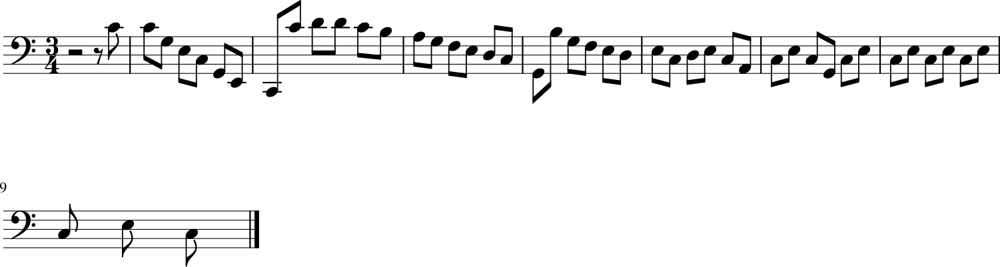

107/107 [==============================] - 66s 613ms/step - loss: 1.7369 - note_outputs_loss: 1.1914 - duration_outputs_loss: 0.5455
Epoch 195/5000
107/107 [==============================] - ETA: 0s - loss: 1.7259 - note_outputs_loss: 1.1828 - duration_outputs_loss: 0.5431[['START', 'C:major', '4/4TS', 'rest', 'E3', 'F3', 'G3', 'C3', 'B2', 'C3', 'C4', 'B3', 'A3', 'B3', 'G3', 'A3', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'G3', 'G3', 'E3', 'G3', 'C4', 'A3', 'F#3', 'D4', 'B3', 'G3', 'A3', 'B3', 'C4', 'D4', 'E4', 'D4', 'E-4', 'D4', 'C4', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3'], ['0.0', '0.0', '0.0', '5.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


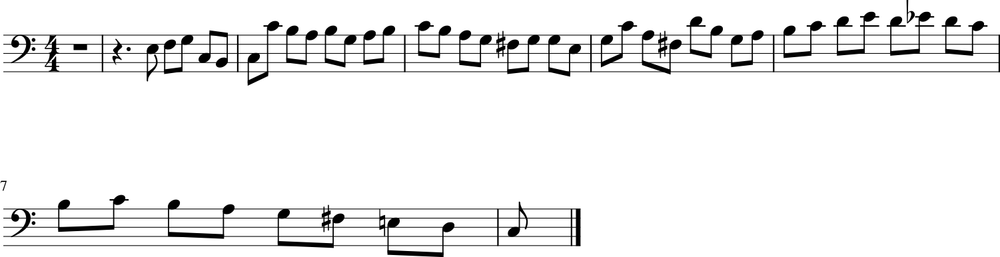

107/107 [==============================] - 66s 614ms/step - loss: 1.7259 - note_outputs_loss: 1.1828 - duration_outputs_loss: 0.5431
Epoch 196/5000
107/107 [==============================] - ETA: 0s - loss: 1.7233 - note_outputs_loss: 1.1775 - duration_outputs_loss: 0.5458[['START', 'G:major', '3/4TS', 'rest', 'G3', 'G3', 'D3', 'G3', 'D3', 'G3', 'D3', 'G3', 'D3', 'G3', 'D3', 'G3', 'D3', 'G3', 'D3', 'G3', 'D3', 'E3', 'D3', 'E3', 'C3', 'G3', 'B2', 'C3', 'E3', 'F3', 'A2', 'G2', 'F#2', 'A2', 'D3', 'E3', 'F#3', 'G3', 'A3', 'F#3', 'D3', 'C4', 'B3', 'A3', 'B3', 'A3', 'B3', 'C4', 'A3'], ['0.0', '0.0', '0.0', '1.0', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


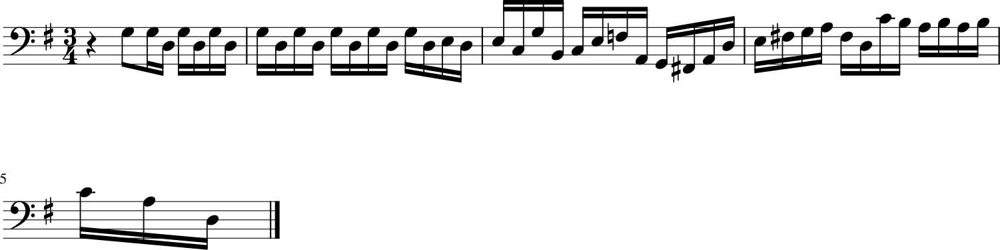

107/107 [==============================] - 67s 628ms/step - loss: 1.7233 - note_outputs_loss: 1.1775 - duration_outputs_loss: 0.5458
Epoch 197/5000
107/107 [==============================] - ETA: 0s - loss: 1.7174 - note_outputs_loss: 1.1746 - duration_outputs_loss: 0.5428[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2', 'G2', 'D3', 'D3', 'D3', 'C3', 'C3', 'G#3', 'F3', 'B-3', 'B-3', 'G#3', 'G3', 'F3', 'E3', 'G3', 'F3', 'E3', 'G3', 'D3'], ['0.0', '0.0', '0.0', '0.5', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


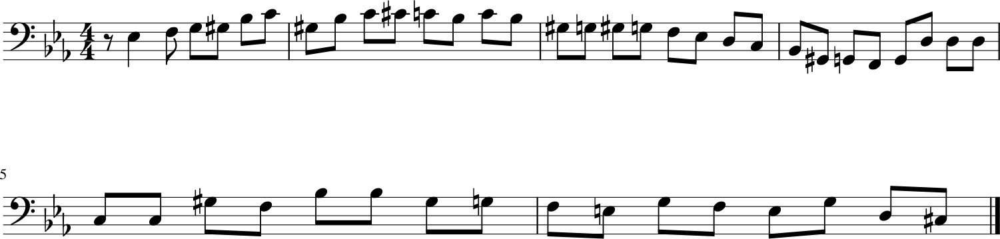

107/107 [==============================] - 67s 622ms/step - loss: 1.7174 - note_outputs_loss: 1.1746 - duration_outputs_loss: 0.5428
Epoch 198/5000
107/107 [==============================] - ETA: 0s - loss: 1.7282 - note_outputs_loss: 1.1830 - duration_outputs_loss: 0.5452[['START', 'C:major', '3/4TS', 'C3', 'B2', 'A2', 'B2', 'F3', 'E3', 'D3', 'C3', 'B2', 'C3', 'A2', 'B2', 'C3', 'E3', 'A3', 'B3', 'C4', 'B3', 'C4', 'B3', 'A3', 'B3', 'C4', 'A3', 'D3', 'C4', 'B3', 'A3', 'G3', 'A3', 'B3', 'A3', 'C4', 'A3', 'B3', 'G3', 'C3', 'E3', 'G3', 'B-3', 'A3', 'C4', 'B-3', 'A3', 'G3', 'F3'], ['0.0', '0.0', '0.0', '3.0', '1.0', '1.0', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


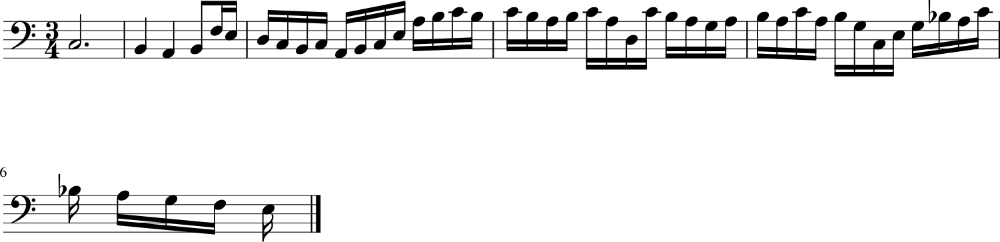

107/107 [==============================] - 66s 614ms/step - loss: 1.7282 - note_outputs_loss: 1.1830 - duration_outputs_loss: 0.5452
Epoch 199/5000
107/107 [==============================] - ETA: 0s - loss: 1.7202 - note_outputs_loss: 1.1738 - duration_outputs_loss: 0.5464[['START', 'C:major', '3/4TS', 'C4', 'rest', 'C4', 'C4', 'C4', 'G3', 'E3', 'F3', 'G3', 'G#3', 'F3', 'B-3', 'D3', 'E3', 'G#3', 'F3', 'B-3', 'E3', 'G#3', 'F3', 'B-3', 'D3', 'G3', 'E-3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'C3', 'B-2', 'G#2', 'G#2', 'C4', 'B-3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'C4', 'F3', 'D4'], ['0.0', '0.0', '0.0', '2.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


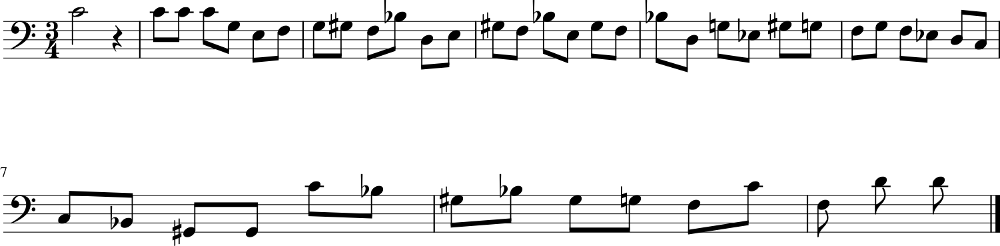

107/107 [==============================] - 65s 610ms/step - loss: 1.7202 - note_outputs_loss: 1.1738 - duration_outputs_loss: 0.5464
Epoch 200/5000
107/107 [==============================] - ETA: 0s - loss: 1.7096 - note_outputs_loss: 1.1643 - duration_outputs_loss: 0.5453[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'A3', 'B3', 'G3', 'D3', 'E3', 'C3', 'G2', 'A2', 'B2', 'C3', 'E3', 'F#3', 'D3', 'F#3', 'A3', 'D4', 'F#3', 'C3', 'B2', 'D3', 'A2', 'G2', 'F#2', 'E2', 'G2', 'A2', 'B2', 'C#3', 'D3', 'E3', 'F#3', 'G3', 'F#3', 'G3', 'A3', 'B3', 'E-3', 'E3', 'G3', 'B-3', 'C#4', 'D4', 'A3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


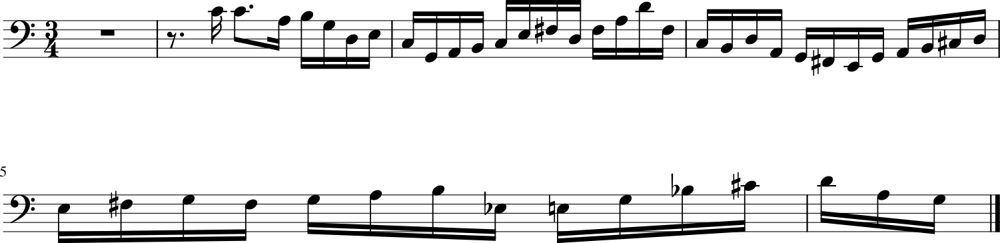

107/107 [==============================] - 66s 615ms/step - loss: 1.7096 - note_outputs_loss: 1.1643 - duration_outputs_loss: 0.5453
Epoch 201/5000
107/107 [==============================] - ETA: 0s - loss: 1.7253 - note_outputs_loss: 1.1794 - duration_outputs_loss: 0.5459[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2', 'G2', 'D3', 'D3', 'D3', 'C3', 'C3', 'G3', 'G#2', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'G2', 'B2', 'D3', 'G3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'F3'], ['0.0', '0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


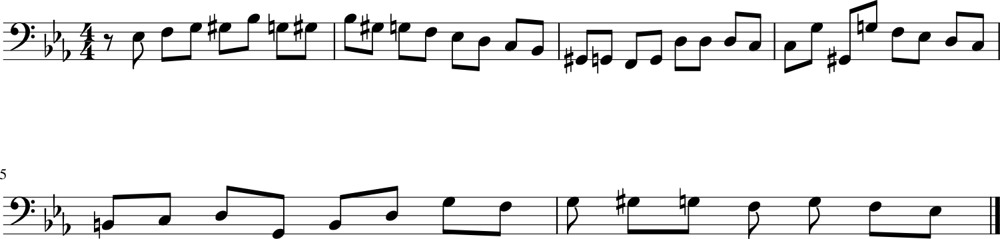

107/107 [==============================] - 64s 599ms/step - loss: 1.7253 - note_outputs_loss: 1.1794 - duration_outputs_loss: 0.5459
Epoch 202/5000
107/107 [==============================] - ETA: 0s - loss: 1.7045 - note_outputs_loss: 1.1650 - duration_outputs_loss: 0.5395[['START', 'G:major', '3/4TS', 'B3', 'C4', 'B3', 'C4', 'B3', 'C4', 'B3', 'D3', 'G3', 'D3', 'C3', 'D3', 'D3', 'B2', 'G2', 'D3', 'C3', 'F#2', 'B2', 'G2', 'B2', 'A2', 'G2', 'F#2', 'A3', 'B3', 'A3', 'G3', 'A3', 'C3', 'B2', 'A3', 'G3', 'E2', 'C3', 'E3', 'F#3', 'G3', 'A3', 'G3', 'F#3', 'A3', 'G3', 'F#3', 'E3', 'F#3'], ['0.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


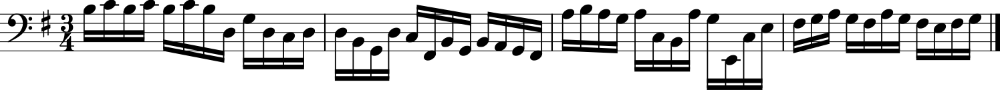

107/107 [==============================] - 64s 599ms/step - loss: 1.7045 - note_outputs_loss: 1.1650 - duration_outputs_loss: 0.5395
Epoch 203/5000
107/107 [==============================] - ETA: 0s - loss: 1.7158 - note_outputs_loss: 1.1685 - duration_outputs_loss: 0.5473[['START', 'E-:major', '4/4TS', 'rest', 'G3', 'E-4', 'D4', 'C4', 'B-3', 'A3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'D3', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'E-4', 'D4', 'E-4'], ['0.0', '0.0', '0.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


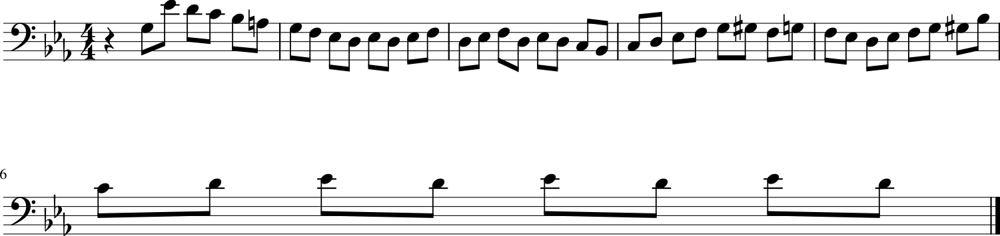

107/107 [==============================] - 64s 598ms/step - loss: 1.7158 - note_outputs_loss: 1.1685 - duration_outputs_loss: 0.5473
Epoch 204/5000
107/107 [==============================] - ETA: 0s - loss: 1.7086 - note_outputs_loss: 1.1646 - duration_outputs_loss: 0.5440[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'F3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2', 'G2'], ['0.0', '0.0', '0.0', '1.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


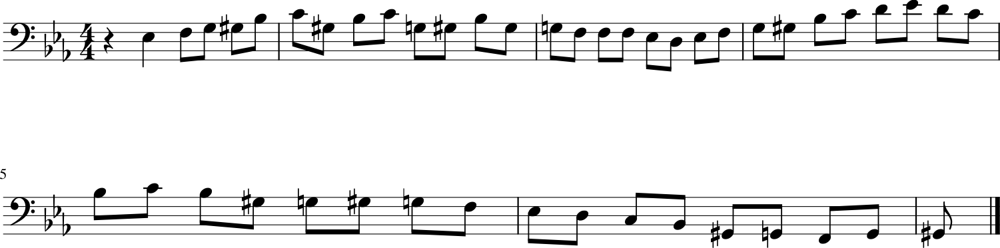

107/107 [==============================] - 65s 606ms/step - loss: 1.7086 - note_outputs_loss: 1.1646 - duration_outputs_loss: 0.5440
Epoch 205/5000
107/107 [==============================] - ETA: 0s - loss: 1.7100 - note_outputs_loss: 1.1653 - duration_outputs_loss: 0.5447[['START', 'G:major', '3/4TS', 'rest', 'G3', 'G3', 'D3', 'G3', 'D3', 'G3', 'D3', 'G3', 'D3', 'G2', 'E3', 'G2', 'D3', 'G2', 'D3', 'G2', 'D3', 'G2', 'E3', 'G2', 'C3', 'E3', 'F#3', 'D3', 'D4', 'C4', 'B3', 'G3', 'D3', 'F#3', 'G3', 'D3', 'G2', 'B3', 'C4', 'D4', 'B3', 'G3', 'F3', 'E3', 'G3', 'C4', 'E4', 'C4', 'G#3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


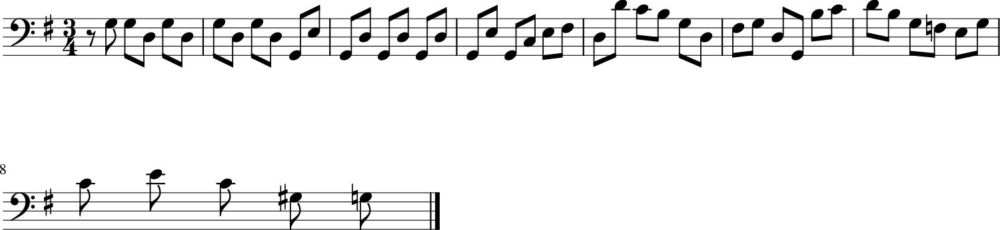

107/107 [==============================] - 64s 601ms/step - loss: 1.7100 - note_outputs_loss: 1.1653 - duration_outputs_loss: 0.5447
Epoch 206/5000
107/107 [==============================] - ETA: 0s - loss: 1.7000 - note_outputs_loss: 1.1586 - duration_outputs_loss: 0.5413[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'G3', 'A3', 'C4', 'E-3', 'D3', 'C3', 'B-2', 'D3', 'C3', 'B-2', 'A2', 'C3', 'B-2', 'C3', 'A2', 'B-2', 'C3', 'A2', 'B-2', 'C3', 'A2', 'B-2', 'C3', 'A2', 'B-2', 'C3', 'A2', 'B-2', 'C3', 'A2', 'B-2', 'C3', 'A2'], ['0.0', '0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


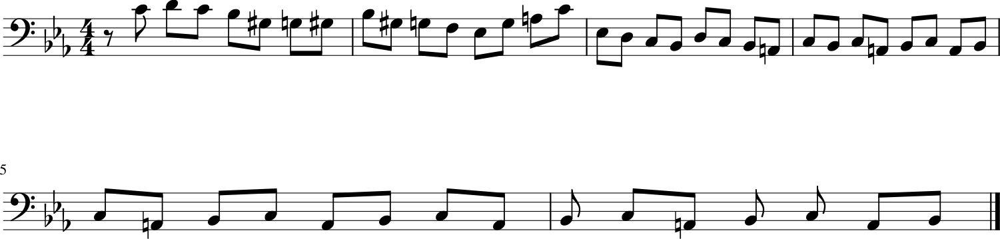

107/107 [==============================] - 64s 600ms/step - loss: 1.7000 - note_outputs_loss: 1.1586 - duration_outputs_loss: 0.5413
Epoch 207/5000
107/107 [==============================] - ETA: 0s - loss: 1.7168 - note_outputs_loss: 1.1682 - duration_outputs_loss: 0.5487[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'D4', 'C4', 'D4', 'E-4', 'D4', 'E-4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'B-3', 'E-4', 'D4', 'C4', 'D4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'E-3', 'C2', 'E-4', 'D4', 'C4', 'B-3', 'C4', 'A3', 'B-3', 'C4', 'D4'], ['0.0', '0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


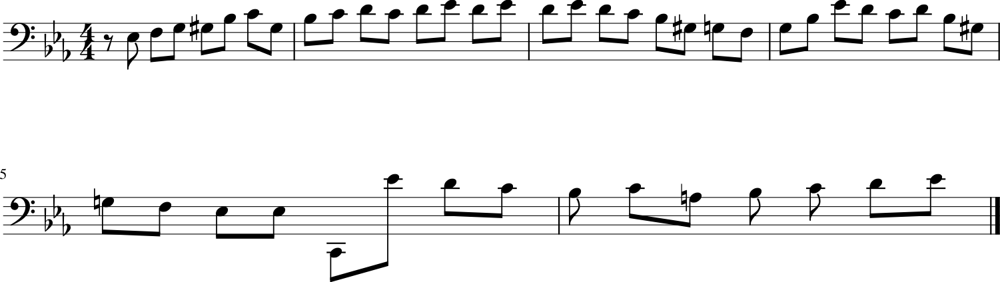

107/107 [==============================] - 65s 604ms/step - loss: 1.7168 - note_outputs_loss: 1.1682 - duration_outputs_loss: 0.5487
Epoch 208/5000
107/107 [==============================] - ETA: 0s - loss: 1.7002 - note_outputs_loss: 1.1573 - duration_outputs_loss: 0.5428[['START', 'C:major', '3/4TS', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E2', 'C2', 'C4', 'D4', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'G2', 'C3', 'E3', 'A3', 'F3', 'G2', 'D3', 'E3', 'F3', 'G2', 'G3', 'E3', 'G2', 'D3', 'G2', 'E3', 'G2', 'F#3', 'G2', 'G3', 'G2', 'G3', 'G2', 'G3', 'G2', 'B3', 'G2', 'A3'], ['0.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


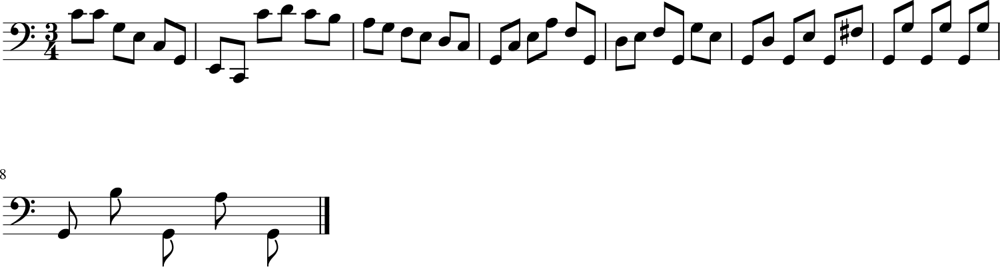

107/107 [==============================] - 64s 600ms/step - loss: 1.7002 - note_outputs_loss: 1.1573 - duration_outputs_loss: 0.5428
Epoch 209/5000
107/107 [==============================] - ETA: 0s - loss: 1.6987 - note_outputs_loss: 1.1550 - duration_outputs_loss: 0.5437[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E2', 'C2', 'C4', 'D4', 'C4', 'B3', 'G3', 'D3', 'E3', 'F3', 'D3', 'E3', 'F3', 'D3', 'E3', 'F3', 'G3', 'A3', 'B-3', 'G3', 'A3', 'F3', 'G3', 'F3', 'E3', 'F3', 'D3', 'E3', 'F3', 'G3', 'A3', 'B-3', 'C4', 'B-3', 'C4', 'F3', 'C4', 'F3', 'D4'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


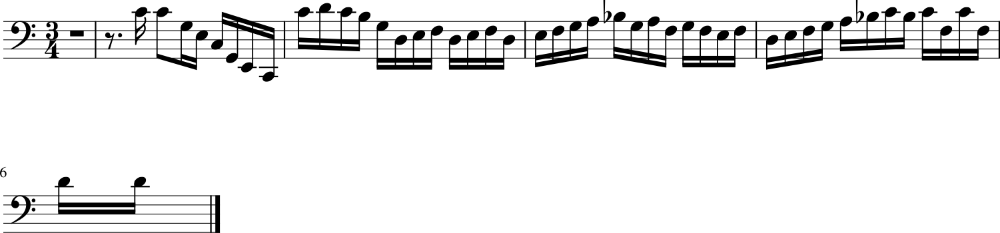

107/107 [==============================] - 65s 605ms/step - loss: 1.6987 - note_outputs_loss: 1.1550 - duration_outputs_loss: 0.5437
Epoch 210/5000
107/107 [==============================] - ETA: 0s - loss: 1.6987 - note_outputs_loss: 1.1541 - duration_outputs_loss: 0.5446[['START', 'C:major', '3/4TS', 'C4', 'C4', 'G3', 'E3', 'F3', 'B-3', 'E3', 'G3', 'B-3', 'D4', 'C4', 'B-3', 'E3', 'B-3', 'C4', 'B-3', 'G#3', 'B-3', 'C4', 'F#3', 'F3', 'F#3', 'D3', 'E-3', 'D3', 'E-3', 'C3', 'B-2', 'C3', 'G3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'E-4', 'D4', 'C4'], ['0.0', '0.0', '0.0', '1.0', '1.0', '0.5', '0.5', '0.5', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '0.5', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


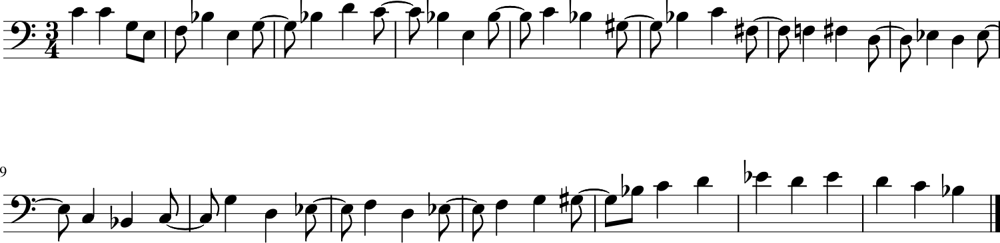

107/107 [==============================] - 65s 605ms/step - loss: 1.6987 - note_outputs_loss: 1.1541 - duration_outputs_loss: 0.5446
Epoch 211/5000
107/107 [==============================] - ETA: 0s - loss: 1.6930 - note_outputs_loss: 1.1495 - duration_outputs_loss: 0.5435[['START', 'C:major', '3/4TS', 'C4', 'C4', 'A3', 'B3', 'C4', 'B3', 'G3', 'C3', 'B3', 'A3', 'G3', 'F#3', 'A3', 'D4', 'D3', 'G3', 'F#3', 'G3', 'D3', 'G2', 'B2', 'D3', 'F#3', 'G3', 'E3', 'C#3', 'G3', 'A3', 'G3', 'F#3', 'A3', 'G3', 'A3', 'G3', 'A3', 'B3', 'C4', 'D4', 'E4', 'D4', 'E4', 'D4', 'C4', 'B3', 'C4', 'E3'], ['0.0', '0.0', '0.0', '5.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


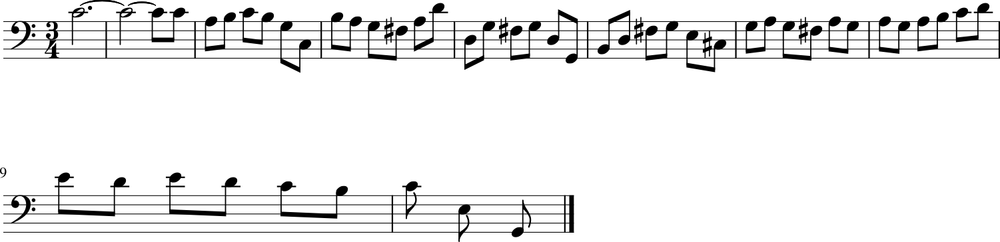

107/107 [==============================] - 65s 606ms/step - loss: 1.6930 - note_outputs_loss: 1.1495 - duration_outputs_loss: 0.5435
Epoch 212/5000
107/107 [==============================] - ETA: 0s - loss: 1.6964 - note_outputs_loss: 1.1533 - duration_outputs_loss: 0.5431[['START', 'C:major', '4/4TS', 'rest', 'C3', 'B2', 'C3', 'D3', 'E3', 'F3', 'G3', 'A3', 'B3', 'C4', 'D4', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'G2', 'E2', 'D2', 'C2', 'C3', 'D3', 'E3', 'F3', 'E3', 'E3', 'G3', 'D3', 'C3', 'C3', 'G3', 'B2', 'A2', 'G2', 'G3', 'F3', 'G3', 'E3', 'A2', 'G3', 'C4', 'E3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


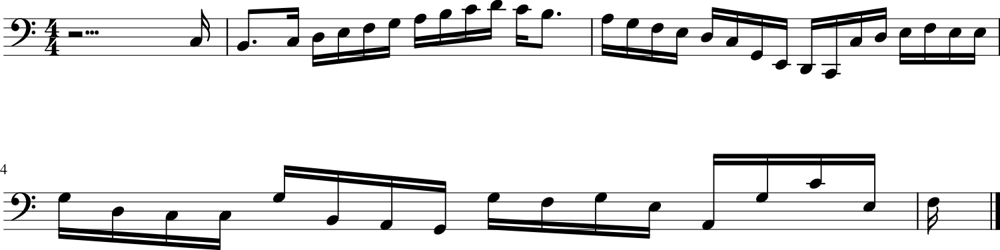

107/107 [==============================] - 64s 602ms/step - loss: 1.6964 - note_outputs_loss: 1.1533 - duration_outputs_loss: 0.5431
Epoch 213/5000
107/107 [==============================] - ETA: 0s - loss: 1.7046 - note_outputs_loss: 1.1597 - duration_outputs_loss: 0.5449[['START', 'C:major', '3/4TS', 'C4', 'C4', 'A3', 'F3', 'E3', 'D3', 'C3', 'B2', 'A2', 'B2', 'C3', 'A2', 'B2', 'D3', 'E3', 'F3', 'E3', 'D3', 'C3', 'E3', 'A3', 'B3', 'C4', 'A3', 'D4', 'A3', 'F3', 'D3', 'E3', 'F3', 'D3', 'G3', 'E3', 'C#3', 'B-3', 'A3', 'G3', 'C#3', 'G3', 'F3', 'E3', 'D3', 'E3', 'F3', 'G3', 'A3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


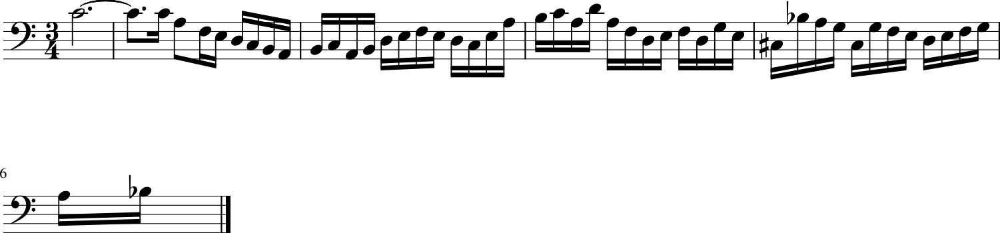

107/107 [==============================] - 64s 601ms/step - loss: 1.7046 - note_outputs_loss: 1.1597 - duration_outputs_loss: 0.5449
Epoch 214/5000
107/107 [==============================] - ETA: 0s - loss: 1.6942 - note_outputs_loss: 1.1500 - duration_outputs_loss: 0.5441[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'C4', 'G3', 'E3', 'F3', 'G3', 'E3', 'F3', 'G2', 'G3', 'E3', 'D3', 'E3', 'C3', 'G2', 'C3', 'E3', 'F#3', 'B2', 'A2', 'G2', 'F#2', 'E2', 'D2', 'C#2', 'A2', 'E3', 'F#3', 'G3', 'E3', 'F#3', 'G3', 'C2', 'A2', 'D3', 'E3', 'F#3', 'G3', 'E3', 'F#3', 'G3', 'E3', 'F#3', 'D3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


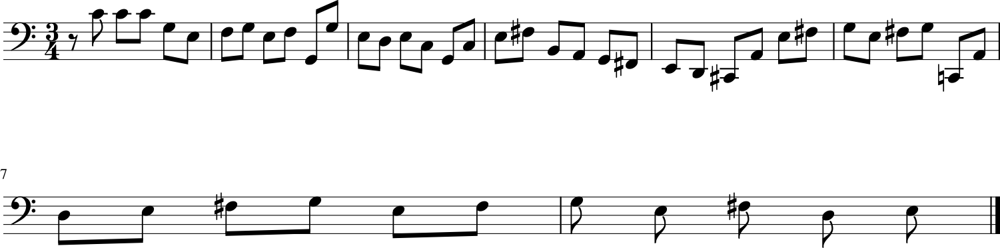

107/107 [==============================] - 64s 599ms/step - loss: 1.6942 - note_outputs_loss: 1.1500 - duration_outputs_loss: 0.5441
Epoch 215/5000
107/107 [==============================] - ETA: 0s - loss: 1.6971 - note_outputs_loss: 1.1510 - duration_outputs_loss: 0.5461[['START', 'C:major', '4/4TS', 'rest', 'E3', 'F3', 'G3', 'C3', 'B2', 'C3', 'C4', 'B3', 'A3', 'B3', 'G3', 'D3', 'E3', 'F3', 'B2', 'A2', 'B2', 'G3', 'C#3', 'D3', 'E3', 'F3', 'G3', 'A3', 'B3', 'C4', 'B3', 'C4', 'A3', 'D4', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'B2', 'E-3', 'E2', 'E3', 'D3', 'C3', 'B2', 'D3'], ['0.0', '0.0', '0.0', '3.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


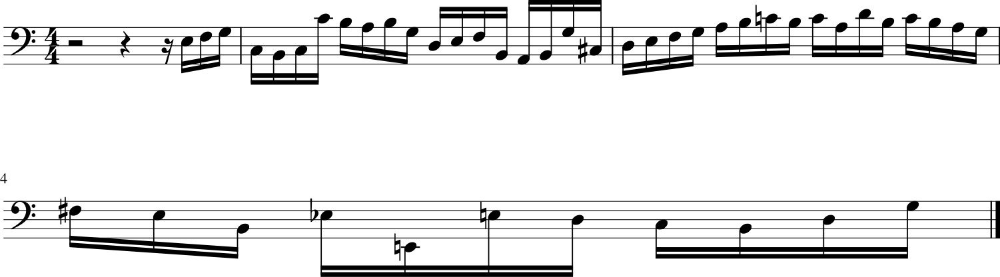

107/107 [==============================] - 64s 596ms/step - loss: 1.6971 - note_outputs_loss: 1.1510 - duration_outputs_loss: 0.5461
Epoch 216/5000
107/107 [==============================] - ETA: 0s - loss: 1.6941 - note_outputs_loss: 1.1519 - duration_outputs_loss: 0.5422[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'E-3', 'G3', 'C4', 'G2', 'A3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'F#3', 'G3', 'A3', 'B3', 'C4', 'A3', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'E3', 'F#3', 'G3', 'A3', 'B3', 'C4', 'A3', 'B3', 'G3', 'F#3', 'G3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


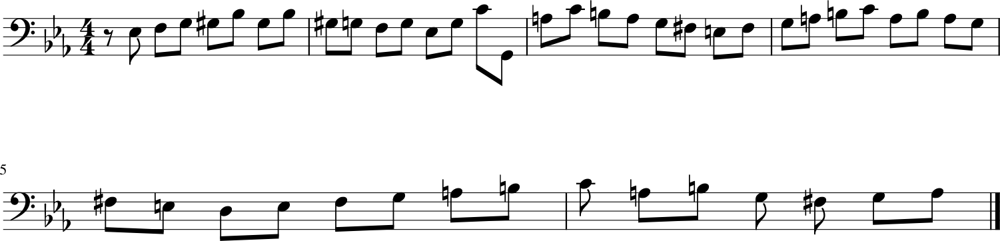

107/107 [==============================] - 65s 606ms/step - loss: 1.6941 - note_outputs_loss: 1.1519 - duration_outputs_loss: 0.5422
Epoch 217/5000
107/107 [==============================] - ETA: 0s - loss: 1.6924 - note_outputs_loss: 1.1488 - duration_outputs_loss: 0.5436[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'E-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.25', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


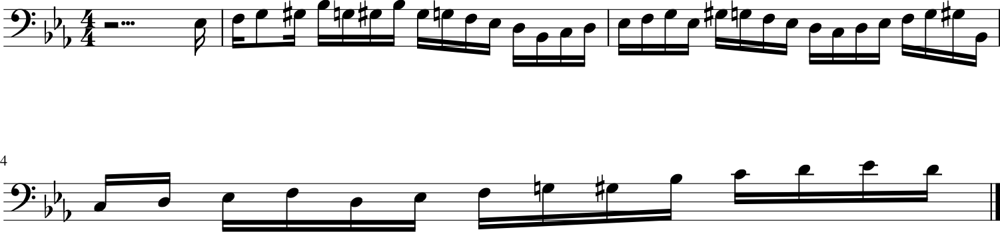

107/107 [==============================] - 64s 602ms/step - loss: 1.6924 - note_outputs_loss: 1.1488 - duration_outputs_loss: 0.5436
Epoch 218/5000
107/107 [==============================] - ETA: 0s - loss: 1.6879 - note_outputs_loss: 1.1431 - duration_outputs_loss: 0.5449[['START', 'E-:major', '4/4TS', 'rest', 'B-3', 'E-4', 'B-3', 'F3', 'G3', 'E-3', 'E-3', 'B-2', 'E-2', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'C3', 'G#3', 'A3', 'B3', 'G#3', 'A2', 'G#3', 'A3', 'B3', 'F3', 'E3', 'D3', 'E3', 'C3', 'F2', 'C4', 'A2', 'B2', 'C3', 'E-2', 'D2'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.75', '0.25', '0.75', '0.25', '1.0', '1.0', '0.75', '0.25', '0.25', '0.25', '0.75', '0.25', '0.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


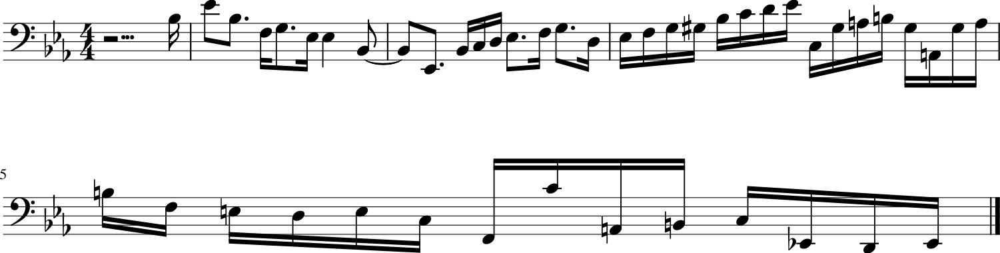

107/107 [==============================] - 65s 607ms/step - loss: 1.6879 - note_outputs_loss: 1.1431 - duration_outputs_loss: 0.5449
Epoch 219/5000
107/107 [==============================] - ETA: 0s - loss: 1.6857 - note_outputs_loss: 1.1430 - duration_outputs_loss: 0.5427[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'C4', 'G3', 'E3', 'F3', 'G3', 'E3', 'F3', 'G3', 'G#3', 'F3', 'E3', 'D3', 'C3', 'B2', 'C3', 'A2', 'C4', 'D4', 'F#3', 'C3', 'B2', 'A2', 'G2', 'B3', 'C4', 'B3', 'A3', 'B3', 'C4', 'G3', 'F#3', 'B3', 'C4', 'E3', 'D3', 'B3', 'C4', 'C3', 'B2', 'D3', 'F#3', 'A3', 'D4'], ['0.0', '0.0', '0.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


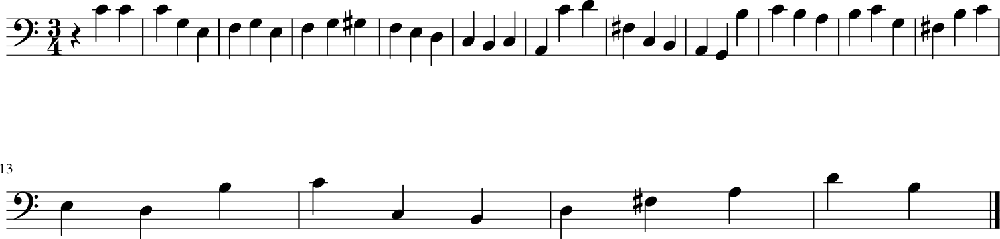

107/107 [==============================] - 64s 601ms/step - loss: 1.6857 - note_outputs_loss: 1.1430 - duration_outputs_loss: 0.5427
Epoch 220/5000
107/107 [==============================] - ETA: 0s - loss: 1.6936 - note_outputs_loss: 1.1476 - duration_outputs_loss: 0.5460[['START', 'C:major', '3/4TS', 'rest', 'C4', 'D4', 'G3', 'F3', 'E3', 'D3', 'C3', 'G2', 'B2', 'C3', 'C4', 'B3', 'A3', 'B3', 'G3', 'D3', 'E3', 'F3', 'B2', 'A2', 'B2', 'G3', 'F3', 'E3', 'D3', 'E3', 'C3', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'G2', 'E2', 'G2', 'C2', 'D2', 'E2', 'F2', 'G2', 'A2', 'F2'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


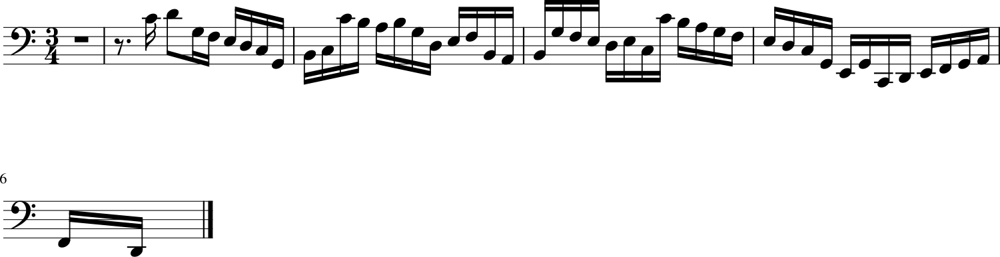

107/107 [==============================] - 64s 601ms/step - loss: 1.6936 - note_outputs_loss: 1.1476 - duration_outputs_loss: 0.5460
Epoch 221/5000
107/107 [==============================] - ETA: 0s - loss: 1.6799 - note_outputs_loss: 1.1364 - duration_outputs_loss: 0.5435[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2', 'G#3', 'G3', 'F3', 'B-2', 'G#3', 'G3', 'F3', 'E-2', 'G3', 'F3', 'E-3', 'A2', 'F#3', 'F3', 'E-3', 'D3', 'E-3', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3'], ['0.0', '0.0', '0.0', '0.75', '0.25', '1.0', '0.75', '0.25', '0.5', '0.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


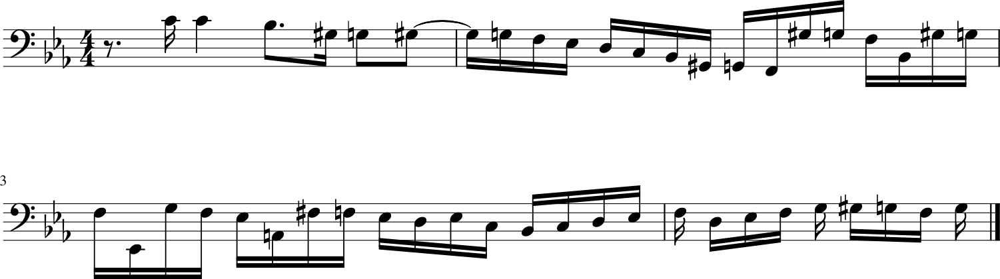

107/107 [==============================] - 65s 612ms/step - loss: 1.6799 - note_outputs_loss: 1.1364 - duration_outputs_loss: 0.5435
Epoch 222/5000
107/107 [==============================] - ETA: 0s - loss: 1.6831 - note_outputs_loss: 1.1387 - duration_outputs_loss: 0.5444[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'B3', 'C4', 'D4', 'E3', 'D4', 'C4', 'E3', 'G2', 'F3', 'E3', 'D3', 'C3', 'B2', 'A2', 'G2', 'F2', 'E2', 'G2', 'C3', 'E2', 'D2', 'C2', 'D2', 'E2', 'F2', 'G2', 'A2', 'B2', 'C3', 'D3', 'E3', 'F3', 'A2', 'G2', 'F2', 'E2', 'F2', 'G2', 'A2', 'B2', 'C3', 'D3', 'E3'], ['0.0', '0.0', '0.0', '2.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


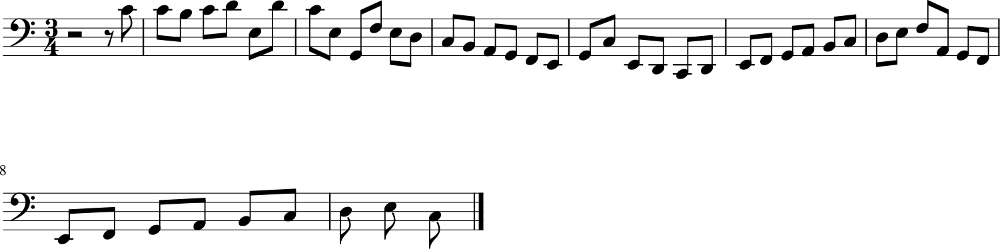

107/107 [==============================] - 68s 636ms/step - loss: 1.6831 - note_outputs_loss: 1.1387 - duration_outputs_loss: 0.5444
Epoch 223/5000
107/107 [==============================] - ETA: 0s - loss: 1.6819 - note_outputs_loss: 1.1362 - duration_outputs_loss: 0.5457[['START', 'C:major', '3/4TS', 'C4', 'C4', 'B3', 'C4', 'D4', 'E3', 'C4', 'D4', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'G3', 'A3', 'F#3', 'D3', 'A2', 'F#2', 'D2', 'A3', 'F#3', 'G3', 'C4', 'D3', 'F#3', 'G3', 'A3', 'F#3', 'D3', 'A3', 'B3', 'C4', 'D4', 'D4', 'B3', 'A3', 'A2', 'F#3', 'C4', 'B3', 'C4', 'D4', 'C4', 'B3'], ['0.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


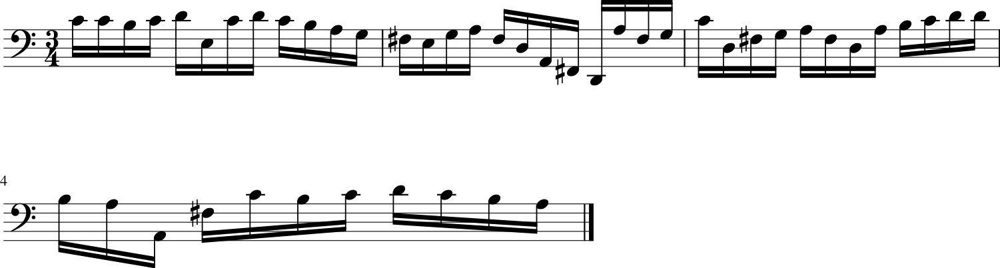

107/107 [==============================] - 68s 638ms/step - loss: 1.6819 - note_outputs_loss: 1.1362 - duration_outputs_loss: 0.5457
Epoch 224/5000
107/107 [==============================] - ETA: 0s - loss: 1.6799 - note_outputs_loss: 1.1368 - duration_outputs_loss: 0.5431[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'B3', 'C4', 'D4', 'G3', 'F3', 'E3', 'F3', 'B2', 'A2', 'B2', 'F3', 'E3', 'C2', 'F#3', 'C2', 'G3', 'C2', 'A3', 'G2', 'B3', 'G2', 'C4', 'G2', 'D4', 'G2', 'E4', 'G2', 'F#4', 'C4', 'F#4', 'C4', 'D4', 'F#4', 'G4', 'B3', 'A3', 'G4', 'F#4', 'D3', 'B3', 'D4', 'G4', 'B3'], ['0.0', '0.0', '0.0', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


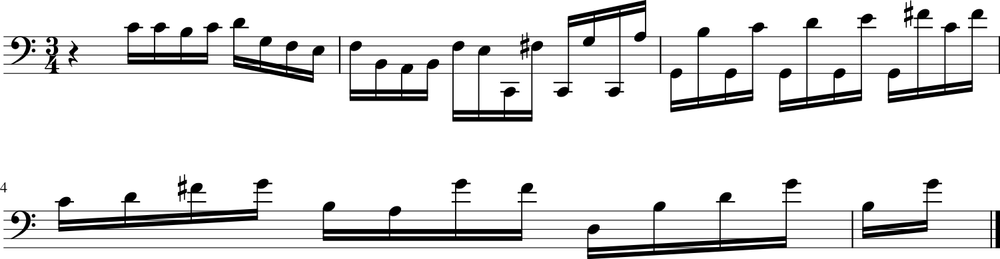

107/107 [==============================] - 66s 615ms/step - loss: 1.6799 - note_outputs_loss: 1.1368 - duration_outputs_loss: 0.5431
Epoch 225/5000
107/107 [==============================] - ETA: 0s - loss: 1.6791 - note_outputs_loss: 1.1352 - duration_outputs_loss: 0.5439[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'F3', 'G3', 'A3', 'B-3', 'C4', 'A3', 'B-3', 'C4', 'A3', 'B-3', 'C4', 'D4', 'E-4', 'E-4', 'E-4', 'C4'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.5', '0.5', '1/6', '1/12', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


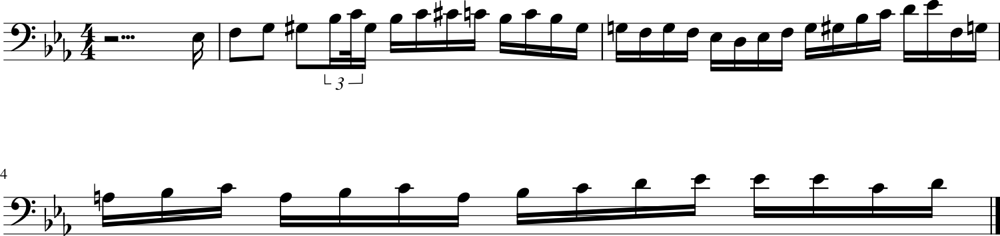

107/107 [==============================] - 65s 603ms/step - loss: 1.6791 - note_outputs_loss: 1.1352 - duration_outputs_loss: 0.5439
Epoch 226/5000
107/107 [==============================] - ETA: 0s - loss: 1.6817 - note_outputs_loss: 1.1352 - duration_outputs_loss: 0.5465[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'A3', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'G3', 'D3', 'G3', 'F#3', 'G3', 'D3', 'G2', 'B3', 'C4', 'D4', 'B3', 'G3', 'F3', 'E3', 'G3', 'C4', 'B3', 'G3', 'F3', 'E3', 'C3', 'G2', 'B2', 'C2', 'C4', 'C4', 'G3', 'G3', 'E3', 'F3', 'D3', 'E3', 'F3', 'D3', 'C#3', 'B2'], ['0.0', '0.0', '0.0', '5.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


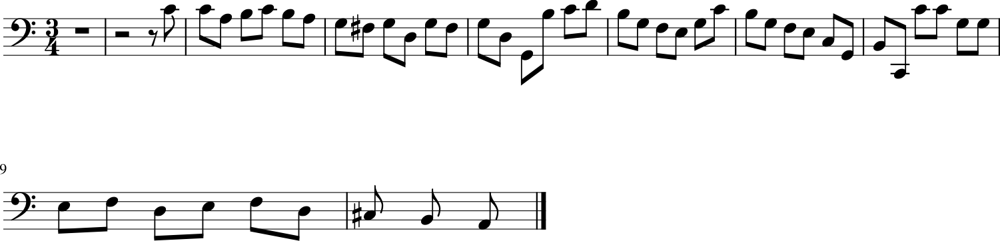

107/107 [==============================] - 64s 601ms/step - loss: 1.6817 - note_outputs_loss: 1.1352 - duration_outputs_loss: 0.5465
Epoch 227/5000
107/107 [==============================] - ETA: 0s - loss: 1.6813 - note_outputs_loss: 1.1350 - duration_outputs_loss: 0.5463[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'B-2', 'C3', 'D3', 'E-3', 'C#4', 'G#2', 'C#4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C4', 'G2', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'G3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


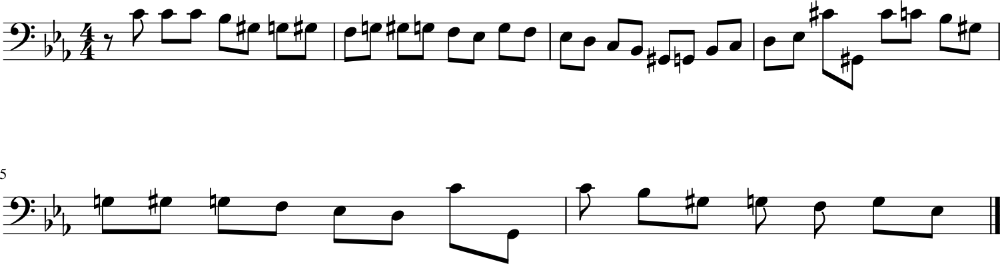

107/107 [==============================] - 64s 597ms/step - loss: 1.6813 - note_outputs_loss: 1.1350 - duration_outputs_loss: 0.5463
Epoch 228/5000
107/107 [==============================] - ETA: 0s - loss: 1.6843 - note_outputs_loss: 1.1365 - duration_outputs_loss: 0.5478[['START', '3/4TS', 'rest', 'D4', 'D4', 'D3', 'E3', 'C3', 'B-2', 'A2', 'B-2', 'G2', 'F2', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'A3', 'B-3', 'D2', 'B-3', 'G3', 'D3', 'G3', 'B-2', 'D3', 'G2', 'D2', 'B-3', 'G3', 'D3', 'G3', 'B-2', 'A2', 'G2', 'F#2', 'A2', 'B-2', 'C3', 'A2', 'B-2', 'D3', 'G3', 'B-3', 'G#3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


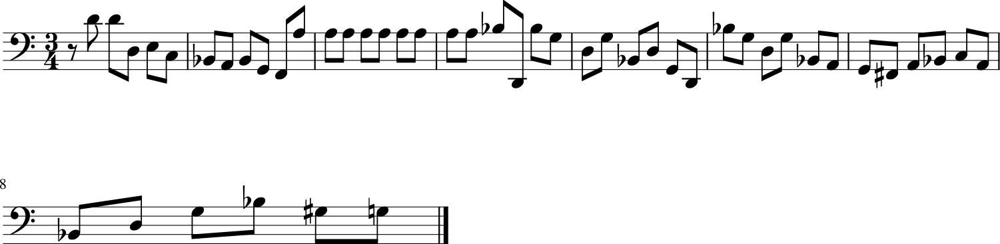

107/107 [==============================] - 64s 600ms/step - loss: 1.6843 - note_outputs_loss: 1.1365 - duration_outputs_loss: 0.5478
Epoch 229/5000
107/107 [==============================] - ETA: 0s - loss: 1.6765 - note_outputs_loss: 1.1330 - duration_outputs_loss: 0.5434[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'G3', 'G#3', 'F3', 'F2', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'E-4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'G3', 'F3', 'E-3'], ['0.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


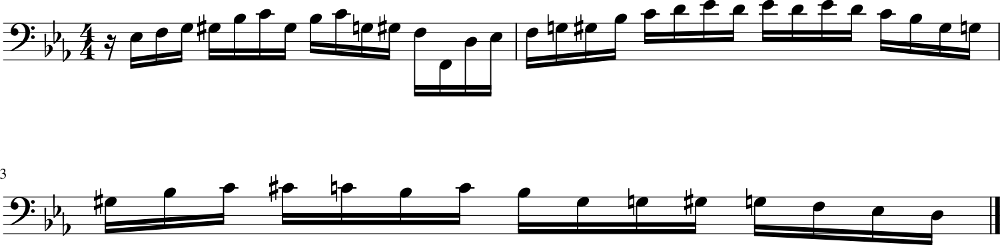

107/107 [==============================] - 65s 605ms/step - loss: 1.6765 - note_outputs_loss: 1.1330 - duration_outputs_loss: 0.5434
Epoch 230/5000
107/107 [==============================] - ETA: 0s - loss: 1.6793 - note_outputs_loss: 1.1329 - duration_outputs_loss: 0.5465[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'F#3', 'F3', 'F#3', 'E-3', 'D3', 'E-3', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'B-3', 'D3', 'E-3', 'C3', 'D3', 'E-3', 'F3', 'G3'], ['0.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


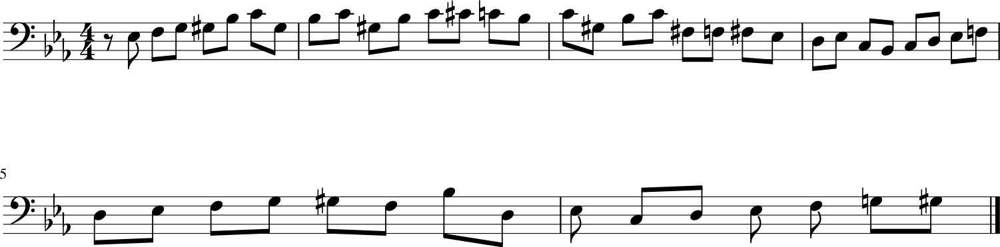

107/107 [==============================] - 64s 599ms/step - loss: 1.6793 - note_outputs_loss: 1.1329 - duration_outputs_loss: 0.5465
Epoch 231/5000
107/107 [==============================] - ETA: 0s - loss: 1.6678 - note_outputs_loss: 1.1217 - duration_outputs_loss: 0.5461[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'B-3', 'G#3', 'B-3', 'G#3', 'G3', 'G#3', 'F3', 'E3', 'F3', 'F3', 'E3', 'F3', 'D3', 'B-2', 'G#2', 'E-3', 'D3', 'E-2', 'G2', 'B-2', 'D3', 'E-3', 'G3', 'B-3', 'D4', 'C4', 'E-4', 'D4', 'C4', 'B-3', 'A3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'D3', 'C3', 'B-2'], ['0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


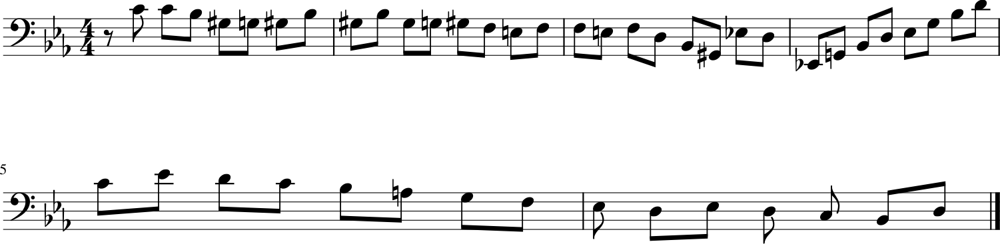

107/107 [==============================] - 64s 599ms/step - loss: 1.6678 - note_outputs_loss: 1.1217 - duration_outputs_loss: 0.5461
Epoch 232/5000
107/107 [==============================] - ETA: 0s - loss: 1.6714 - note_outputs_loss: 1.1277 - duration_outputs_loss: 0.5437[['START', 'F:major', '3/4TS', 'rest', 'D4', 'F4', 'A3', 'F3', 'A3', 'D3', 'F3', 'G3', 'A2', 'F3', 'E-3', 'D3', 'C4', 'A3', 'B-3', 'C4', 'A3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'A3', 'G3', 'B-2', 'A2', 'B-2', 'D3', 'F3', 'A3', 'D4', 'C4', 'D4', 'G#3', 'A3', 'B2', 'C4', 'B3', 'A3', 'G#3', 'A3', 'E3', 'A3'], ['0.0', '0.0', '0.0', '5.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


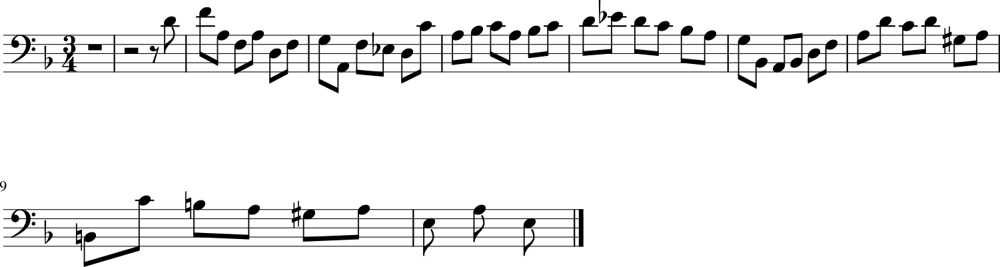

107/107 [==============================] - 64s 601ms/step - loss: 1.6714 - note_outputs_loss: 1.1277 - duration_outputs_loss: 0.5437
Epoch 233/5000
107/107 [==============================] - ETA: 0s - loss: 1.6631 - note_outputs_loss: 1.1198 - duration_outputs_loss: 0.5433[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E2', 'C2', 'C4', 'D4', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'G2', 'B3', 'G3', 'A3', 'C3', 'E3', 'G3', 'B-3', 'D4', 'C4', 'B-3', 'A3', 'G3', 'A3', 'F3', 'E3', 'D3', 'F3', 'A3', 'D4', 'A3', 'F3', 'D3', 'C4', 'B3', 'A3', 'G3'], ['0.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


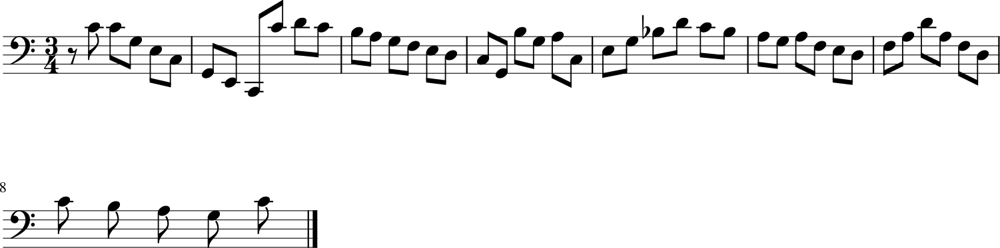

107/107 [==============================] - 64s 598ms/step - loss: 1.6631 - note_outputs_loss: 1.1198 - duration_outputs_loss: 0.5433
Epoch 234/5000
107/107 [==============================] - ETA: 0s - loss: 1.6679 - note_outputs_loss: 1.1236 - duration_outputs_loss: 0.5444[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'D3', 'B-2', 'G#2', 'G2', 'B-2', 'C3', 'D3', 'E-3', 'C#4', 'G#2', 'C#4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'C#3', 'E-3', 'C3', 'C#3', 'E-3', 'C3', 'C#3', 'E-3'], ['0.0', '0.0', '0.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


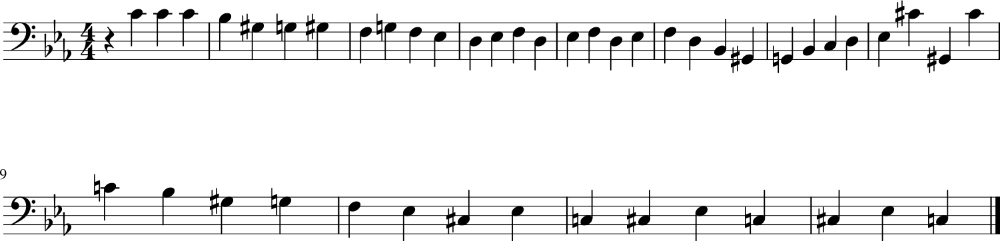

107/107 [==============================] - 64s 599ms/step - loss: 1.6679 - note_outputs_loss: 1.1236 - duration_outputs_loss: 0.5444
Epoch 235/5000
107/107 [==============================] - ETA: 0s - loss: 1.6759 - note_outputs_loss: 1.1280 - duration_outputs_loss: 0.5478[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'G3', 'G#3', 'F3', 'F2', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'C4', 'C#4', 'C#4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'B-2', 'C3', 'D3', 'E-3', 'F3'], ['0.0', '0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


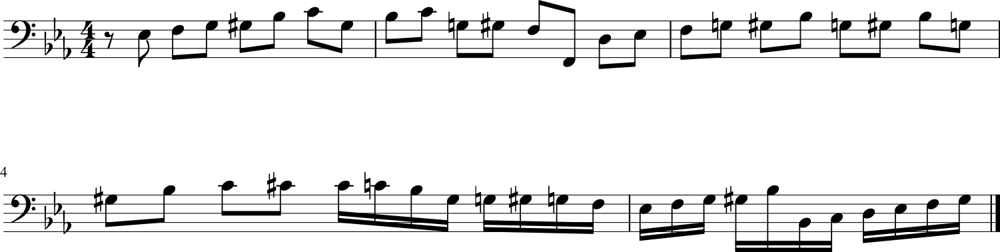

107/107 [==============================] - 64s 601ms/step - loss: 1.6759 - note_outputs_loss: 1.1280 - duration_outputs_loss: 0.5478
Epoch 236/5000
107/107 [==============================] - ETA: 0s - loss: 1.6643 - note_outputs_loss: 1.1215 - duration_outputs_loss: 0.5427[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'F3', 'F3', 'E-3', 'D3', 'E-3', 'C3', 'B-2', 'G#2', 'G2', 'G#2', 'F2', 'G2', 'D3', 'D3', 'D3', 'C3', 'C3', 'G3', 'G#2', 'G3', 'F3', 'E-3', 'F3', 'D3', 'E-3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'D3', 'G3', 'G#3'], ['0.0', '0.0', '0.0', '1.0', '1.0', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


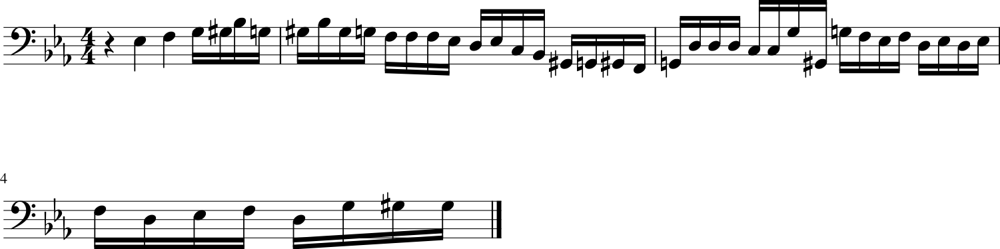

107/107 [==============================] - 64s 600ms/step - loss: 1.6643 - note_outputs_loss: 1.1215 - duration_outputs_loss: 0.5427
Epoch 237/5000
107/107 [==============================] - ETA: 0s - loss: 1.6637 - note_outputs_loss: 1.1186 - duration_outputs_loss: 0.5451[['START', 'C:major', '4/4TS', 'rest', 'E3', 'F3', 'G3', 'C3', 'B2', 'C3', 'C4', 'B3', 'A3', 'B3', 'G3', 'D3', 'E3', 'F3', 'B2', 'A2', 'G2', 'F2', 'E2', 'G2', 'C3', 'E2', 'D2', 'B2', 'C3', 'E3', 'G3', 'C4', 'D4', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'C3', 'B2', 'A2', 'G2', 'D3', 'F#3', 'A3', 'C4', 'B3'], ['0.0', '1.0', '0.5', '0.5', '0.5', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


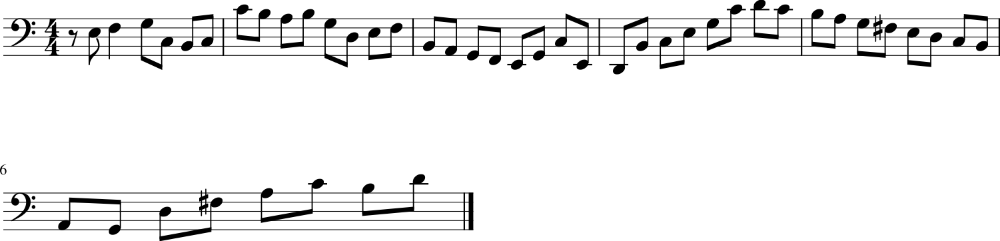

107/107 [==============================] - 64s 603ms/step - loss: 1.6637 - note_outputs_loss: 1.1186 - duration_outputs_loss: 0.5451
Epoch 238/5000
107/107 [==============================] - ETA: 0s - loss: 1.6646 - note_outputs_loss: 1.1188 - duration_outputs_loss: 0.5458[['START', 'C:major', '4/4TS', 'rest', 'E3', 'F3', 'G3', 'C3', 'B2', 'C3', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'G2', 'E2', 'G2', 'A3', 'rest', 'B2', 'E-3', 'C3', 'E3', 'G3', 'C4', 'rest'], ['0.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


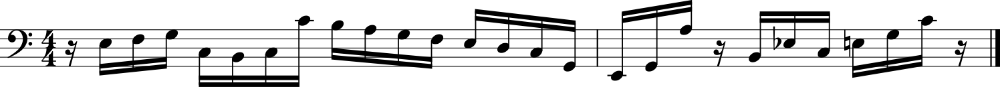

107/107 [==============================] - 63s 589ms/step - loss: 1.6646 - note_outputs_loss: 1.1188 - duration_outputs_loss: 0.5458
Epoch 239/5000
107/107 [==============================] - ETA: 0s - loss: 1.6590 - note_outputs_loss: 1.1194 - duration_outputs_loss: 0.5395[['START', 'C:major', '3/4TS', 'C4', 'C4', 'B-3', 'G#3', 'B-3', 'G#3', 'B-3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'B-3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G#3', 'G#3', 'G3', 'F3', 'E-3', 'F3'], ['0.0', '0.0', '0.0', '3.0', '1.0', '1.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


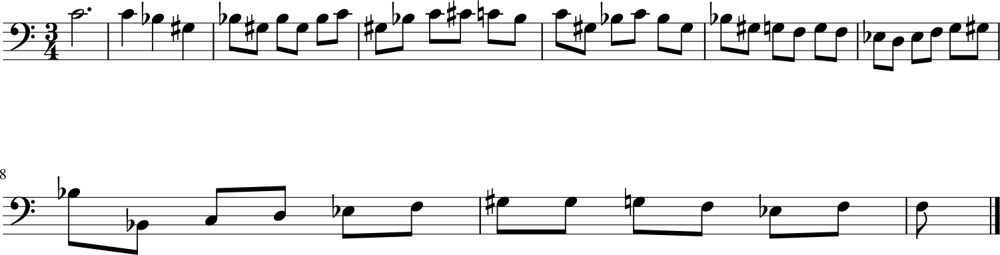

107/107 [==============================] - 64s 600ms/step - loss: 1.6590 - note_outputs_loss: 1.1194 - duration_outputs_loss: 0.5395
Epoch 240/5000
107/107 [==============================] - ETA: 0s - loss: 1.6689 - note_outputs_loss: 1.1223 - duration_outputs_loss: 0.5466[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E2', 'C2', 'C4', 'D4', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'E3', 'A3', 'F3', 'D3', 'E3', 'C#3', 'A2', 'G3', 'F3', 'E3', 'G3', 'B-3', 'G#3', 'G3', 'F3', 'E3', 'G3', 'G#3', 'B-3', 'C4', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3'], ['0.0', '1.0', '0.5', '0.5', '1.0', '1.0', '1.0', '1.0', '1.0', '0.5', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


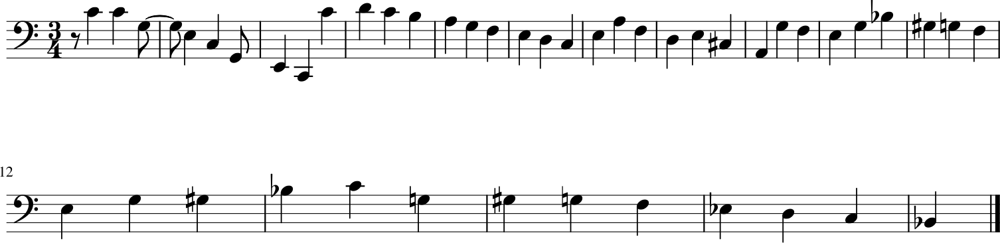

107/107 [==============================] - 64s 603ms/step - loss: 1.6689 - note_outputs_loss: 1.1223 - duration_outputs_loss: 0.5466
Epoch 241/5000
107/107 [==============================] - ETA: 0s - loss: 1.6548 - note_outputs_loss: 1.1112 - duration_outputs_loss: 0.5436[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'E-3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


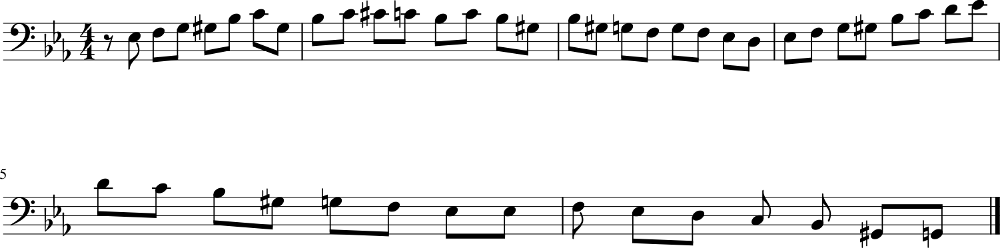

107/107 [==============================] - 64s 602ms/step - loss: 1.6548 - note_outputs_loss: 1.1112 - duration_outputs_loss: 0.5436
Epoch 242/5000
107/107 [==============================] - ETA: 0s - loss: 1.6591 - note_outputs_loss: 1.1152 - duration_outputs_loss: 0.5439[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'B-3', 'G#3', 'C4', 'F3', 'C4', 'E-3', 'D3', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'C3', 'D3'], ['0.0', '2.0', '1.0', '1.0', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


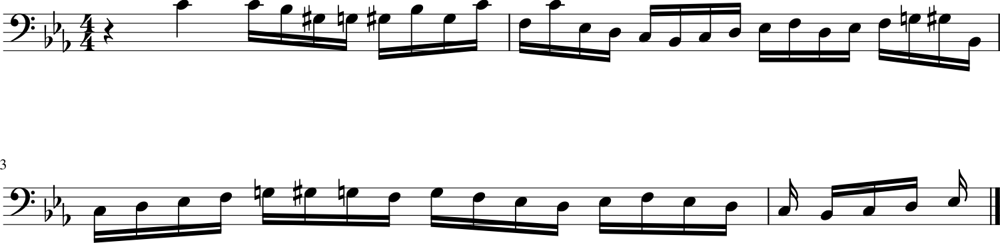

107/107 [==============================] - 65s 610ms/step - loss: 1.6591 - note_outputs_loss: 1.1152 - duration_outputs_loss: 0.5439
Epoch 243/5000
107/107 [==============================] - ETA: 0s - loss: 1.6491 - note_outputs_loss: 1.1082 - duration_outputs_loss: 0.5409[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E2', 'C2', 'C4', 'D4', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'G2', 'C4', 'B-3', 'G3', 'E3', 'G3', 'C3', 'B-3', 'A3', 'G3', 'F3', 'A3', 'D3', 'G#2', 'F3', 'D4', 'F4', 'E-4', 'D4', 'C4', 'B-3', 'B-3', 'C4', 'A3', 'B-3', 'C4', 'D4'], ['0.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


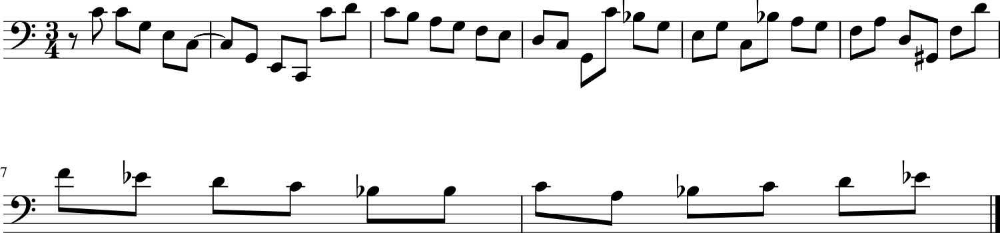

107/107 [==============================] - 65s 605ms/step - loss: 1.6491 - note_outputs_loss: 1.1082 - duration_outputs_loss: 0.5409
Epoch 244/5000
107/107 [==============================] - ETA: 0s - loss: 1.6505 - note_outputs_loss: 1.1081 - duration_outputs_loss: 0.5424[['START', 'C:major', '3/4TS', 'C4', 'C4', 'A3', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'C3', 'B2', 'A2', 'G2', 'F#2', 'E2', 'D2', 'C4', 'B3', 'C4', 'D4', 'B3', 'C4', 'A3', 'B3', 'G3', 'A3', 'B3', 'G3', 'D3', 'E3', 'D3', 'C3', 'E3', 'D3', 'E3', 'F3', 'G3', 'E3', 'F3', 'D3', 'E3', 'C3', 'C2', 'B2'], ['0.0', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


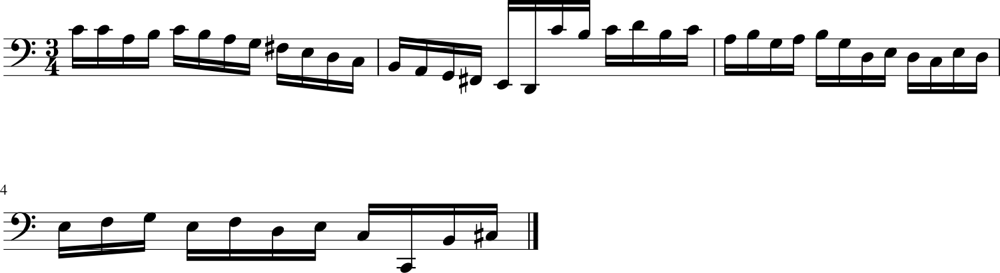

107/107 [==============================] - 65s 612ms/step - loss: 1.6505 - note_outputs_loss: 1.1081 - duration_outputs_loss: 0.5424
Epoch 245/5000
107/107 [==============================] - ETA: 0s - loss: 1.6505 - note_outputs_loss: 1.1073 - duration_outputs_loss: 0.5432[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E2', 'C2', 'C4', 'D4', 'C4', 'B3', 'C4', 'D4', 'B3', 'G3', 'D3', 'B2', 'G2', 'F2', 'D4', 'C4', 'B3', 'A3', 'G3', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'F3', 'D3', 'G2', 'A3', 'G3', 'F3', 'E3', 'D3', 'E3', 'C3', 'G2', 'E3', 'D3', 'E3'], ['0.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


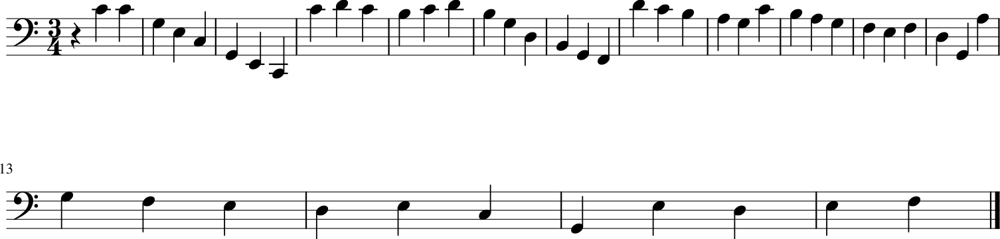

107/107 [==============================] - 65s 605ms/step - loss: 1.6505 - note_outputs_loss: 1.1073 - duration_outputs_loss: 0.5432
Epoch 246/5000
107/107 [==============================] - ETA: 0s - loss: 1.6529 - note_outputs_loss: 1.1090 - duration_outputs_loss: 0.5438[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'E-3', 'D3', 'C3', 'D3', 'G#3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'D4', 'C4', 'D4', 'E-4', 'B-3', 'C4', 'G3', 'G3', 'G#3', 'G3', 'G#3', 'G#3', 'F3'], ['0.0', '0.0', '0.0', '3.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


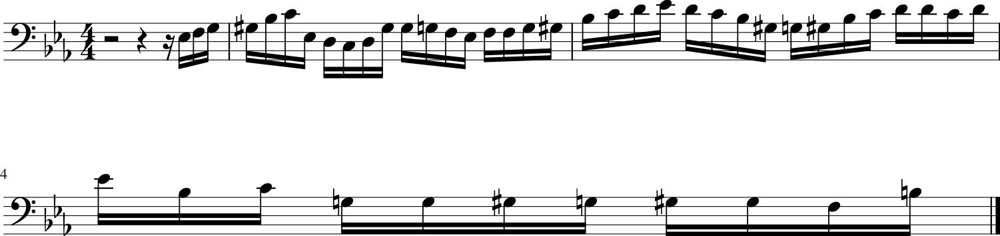

107/107 [==============================] - 65s 605ms/step - loss: 1.6529 - note_outputs_loss: 1.1090 - duration_outputs_loss: 0.5438
Epoch 247/5000
107/107 [==============================] - ETA: 0s - loss: 1.6455 - note_outputs_loss: 1.1040 - duration_outputs_loss: 0.5415[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E2', 'C2', 'C4', 'D4', 'C4', 'B3', 'C4', 'D4', 'B3', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'F3', 'F2', 'D4', 'C4', 'D4', 'G#3', 'F3', 'G3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'B-2', 'G#2', 'G2', 'B-2', 'C3', 'D3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


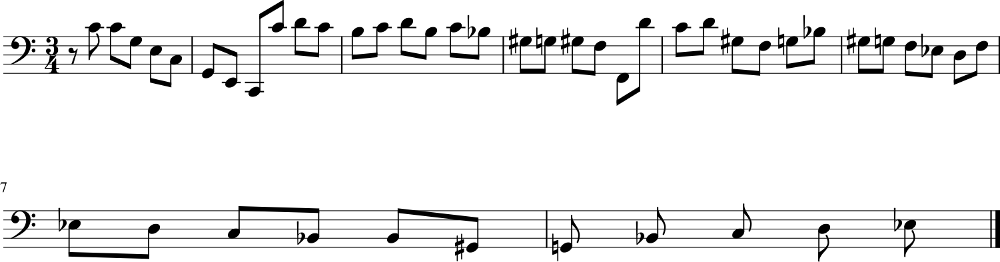

107/107 [==============================] - 65s 604ms/step - loss: 1.6455 - note_outputs_loss: 1.1040 - duration_outputs_loss: 0.5415
Epoch 248/5000
107/107 [==============================] - ETA: 0s - loss: 1.6477 - note_outputs_loss: 1.1067 - duration_outputs_loss: 0.5410[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'F3', 'E-4', 'D4', 'E-4', 'D4', 'C4', 'D4', 'E-4', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'B-3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4'], ['0.0', '0.0', '0.0', '3.75', '0.25', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


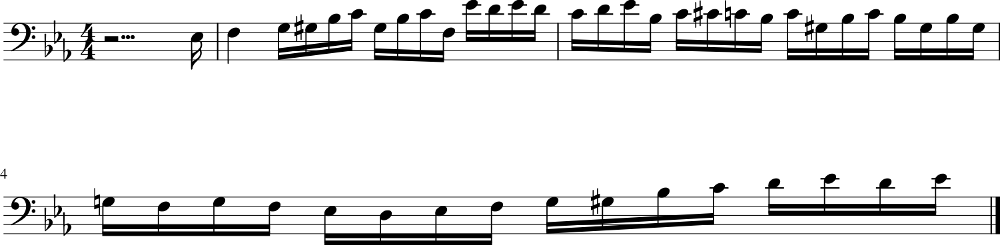

107/107 [==============================] - 65s 611ms/step - loss: 1.6477 - note_outputs_loss: 1.1067 - duration_outputs_loss: 0.5410
Epoch 249/5000
107/107 [==============================] - ETA: 0s - loss: 1.6487 - note_outputs_loss: 1.1009 - duration_outputs_loss: 0.5478[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'B-3', 'E-4', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'D4', 'C4', 'D4', 'E-4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'C4', 'G#3', 'B-3', 'C4', 'F3', 'E-4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'E-3', 'D3', 'C3', 'B-2'], ['0.0', '3.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


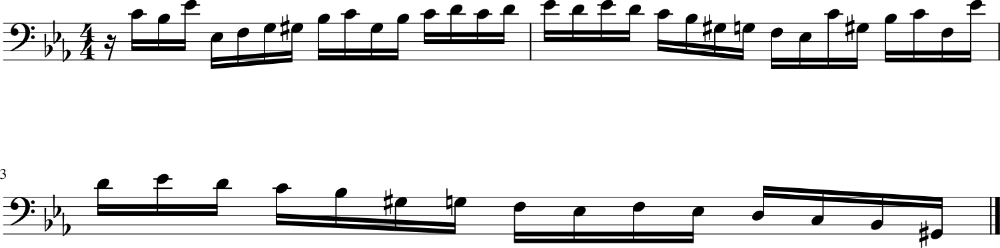

107/107 [==============================] - 64s 602ms/step - loss: 1.6487 - note_outputs_loss: 1.1009 - duration_outputs_loss: 0.5478
Epoch 250/5000
107/107 [==============================] - ETA: 0s - loss: 1.6477 - note_outputs_loss: 1.1015 - duration_outputs_loss: 0.5462[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2', 'G2', 'D3', 'D3', 'D3', 'C3', 'C3', 'G3', 'G#2', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B2', 'G#2', 'G2', 'F2', 'E-2', 'G2', 'B2', 'D3', 'F3', 'G#3', 'G3', 'F3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


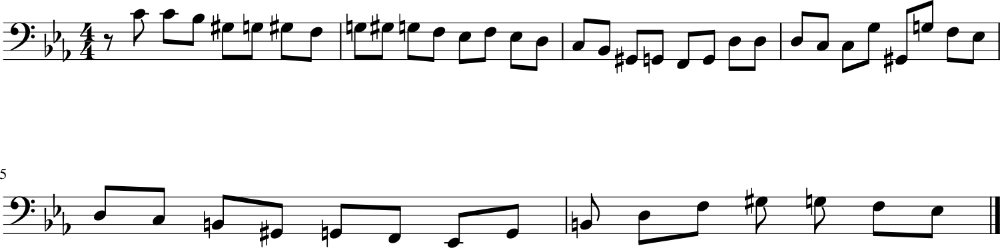

107/107 [==============================] - 65s 603ms/step - loss: 1.6477 - note_outputs_loss: 1.1015 - duration_outputs_loss: 0.5462
Epoch 251/5000
107/107 [==============================] - ETA: 0s - loss: 1.6440 - note_outputs_loss: 1.1024 - duration_outputs_loss: 0.5416[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'F3', 'G3', 'F3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G#3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'F3', 'G3', 'A3', 'B-3', 'C4', 'A3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'A3', 'G3', 'A3', 'B-3', 'G3', 'A3'], ['0.0', '0.0', '0.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


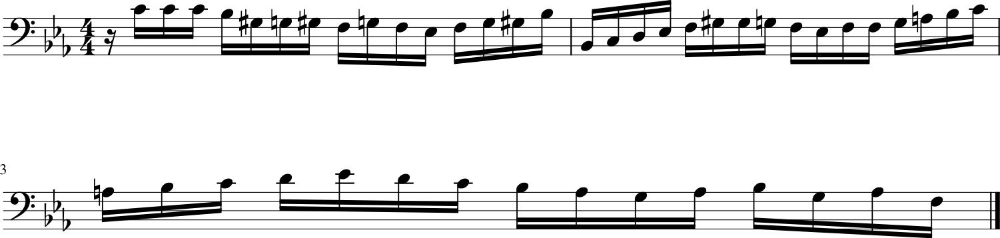

107/107 [==============================] - 64s 599ms/step - loss: 1.6440 - note_outputs_loss: 1.1024 - duration_outputs_loss: 0.5416
Epoch 252/5000
107/107 [==============================] - ETA: 0s - loss: 1.6435 - note_outputs_loss: 1.1024 - duration_outputs_loss: 0.5411[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'B-3', 'E-4', 'G3', 'F3', 'E-3', 'B-2', 'D4', 'E-4', 'rest'], ['0.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


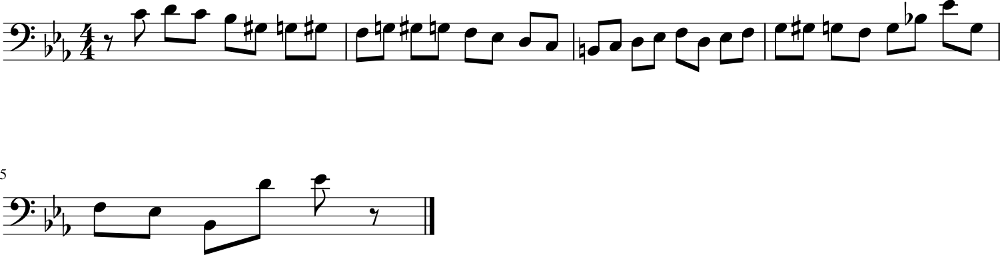

107/107 [==============================] - 64s 595ms/step - loss: 1.6435 - note_outputs_loss: 1.1024 - duration_outputs_loss: 0.5411
Epoch 253/5000
107/107 [==============================] - ETA: 0s - loss: 1.6536 - note_outputs_loss: 1.1054 - duration_outputs_loss: 0.5483[['START', 'C:major', '3/4TS', 'C4', 'C4', 'A3', 'B3', 'C4', 'D4', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'G2', 'E2', 'G2', 'C2', 'D2', 'E2', 'F2', 'G2', 'A2', 'B2', 'C3', 'D3', 'E3', 'F3', 'G3', 'E3', 'F3', 'D3', 'E3', 'F3', 'G3', 'E3', 'F3', 'D3', 'E3', 'C3', 'C2', 'C3', 'D3', 'E3', 'F#3', 'G3'], ['0.0', '1/6', '1/12', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


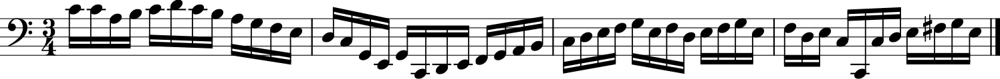

107/107 [==============================] - 64s 602ms/step - loss: 1.6536 - note_outputs_loss: 1.1054 - duration_outputs_loss: 0.5483
Epoch 254/5000
107/107 [==============================] - ETA: 0s - loss: 1.6440 - note_outputs_loss: 1.1032 - duration_outputs_loss: 0.5408[['START', 'E-:major', '3/4TS', 'rest', 'E-3', 'E-3', 'B-2', 'C3', 'G#2', 'F2', 'D3', 'E-3', 'E-2', 'D3', 'E-3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'G#3', 'B-3', 'B-3', 'G#3', 'G3', 'F3', 'F3', 'F3', 'E-3', 'F3', 'G3', 'G3', 'A3', 'G3', 'B-3', 'A3', 'B-3', 'C4', 'A3', 'B-3', 'C4'], ['0.0', '0.0', '2.0', '1.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


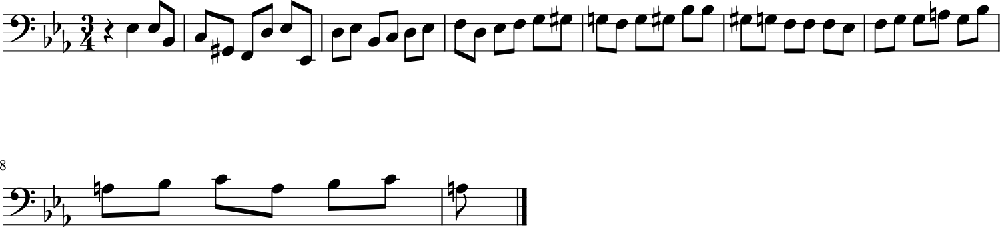

107/107 [==============================] - 64s 596ms/step - loss: 1.6440 - note_outputs_loss: 1.1032 - duration_outputs_loss: 0.5408
Epoch 255/5000
107/107 [==============================] - ETA: 0s - loss: 1.6370 - note_outputs_loss: 1.0959 - duration_outputs_loss: 0.5411[['START', 'E-:major', '3/2TS', 'rest', 'C3', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2', 'G2', 'G#2', 'F2', 'G#3', 'G#3', 'G3', 'G#3', 'F3', 'D4', 'C4', 'D4'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


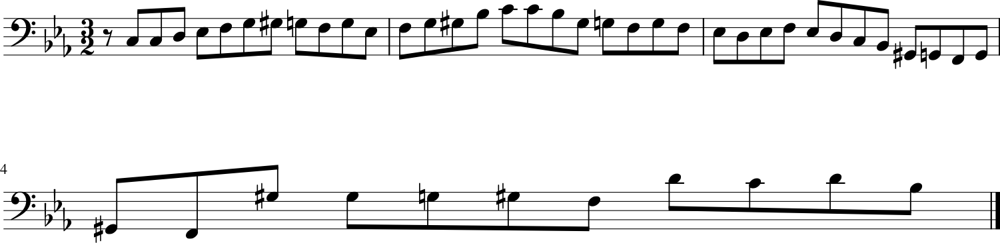

107/107 [==============================] - 64s 598ms/step - loss: 1.6370 - note_outputs_loss: 1.0959 - duration_outputs_loss: 0.5411
Epoch 256/5000
107/107 [==============================] - ETA: 0s - loss: 1.6473 - note_outputs_loss: 1.1037 - duration_outputs_loss: 0.5436[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'G3', 'G#3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2', 'G#3', 'G3', 'F3', 'B-2', 'G#3', 'G3', 'F3', 'E-2', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B2', 'A2', 'C3', 'F2', 'E2', 'C3', 'D2', 'B2', 'F3', 'A3', 'F3', 'D3', 'F3'], ['0.0', '0.0', '0.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


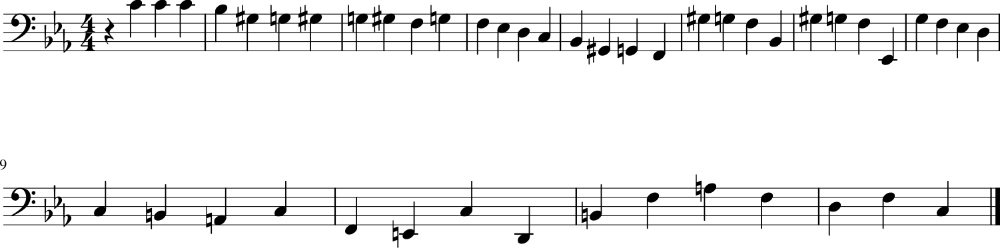

107/107 [==============================] - 64s 599ms/step - loss: 1.6473 - note_outputs_loss: 1.1037 - duration_outputs_loss: 0.5436
Epoch 257/5000
107/107 [==============================] - ETA: 0s - loss: 1.6469 - note_outputs_loss: 1.1017 - duration_outputs_loss: 0.5452[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'B-3', 'C4', 'G3', 'G#3', 'F3', 'F2', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'B-3', 'E-4', 'C2', 'D4', 'C4', 'B-3', 'A3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'C4', 'B-3', 'G#3'], ['0.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


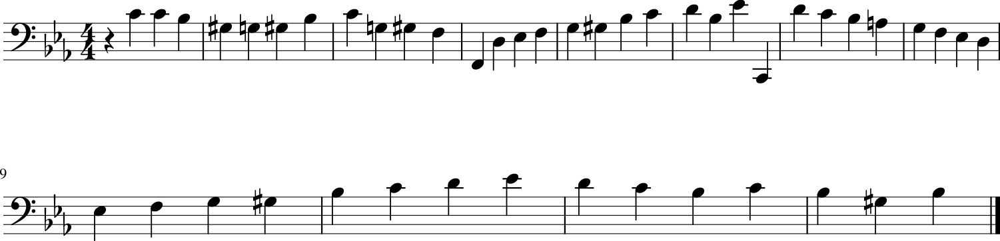

107/107 [==============================] - 64s 596ms/step - loss: 1.6469 - note_outputs_loss: 1.1017 - duration_outputs_loss: 0.5452
Epoch 258/5000
107/107 [==============================] - ETA: 0s - loss: 1.6313 - note_outputs_loss: 1.0882 - duration_outputs_loss: 0.5431[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'F3', 'G3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'B-2', 'D3', 'F3', 'B-3', 'A3', 'B-3', 'G3', 'A3', 'F3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'C3', 'D3', 'E-3'], ['0.0', '0.0', '0.0', '2.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.25', '0.25', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


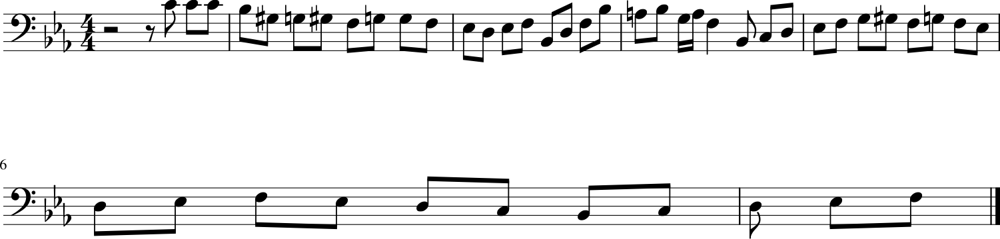

107/107 [==============================] - 64s 596ms/step - loss: 1.6313 - note_outputs_loss: 1.0882 - duration_outputs_loss: 0.5431
Epoch 259/5000
107/107 [==============================] - ETA: 0s - loss: 1.6318 - note_outputs_loss: 1.0920 - duration_outputs_loss: 0.5398[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'D4', 'D4', 'C4', 'C4', 'C4', 'C4', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'G#2', 'F2', 'C3', 'D3', 'E-3', 'C3', 'C3', 'G2', 'F2', 'G2', 'E-2', 'F2', 'G2', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'B-2', 'G2', 'C#4', 'B-3', 'G#3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


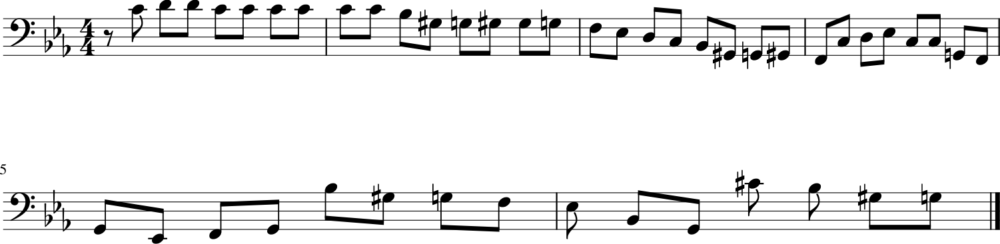

107/107 [==============================] - 64s 600ms/step - loss: 1.6318 - note_outputs_loss: 1.0920 - duration_outputs_loss: 0.5398
Epoch 260/5000
107/107 [==============================] - ETA: 0s - loss: 1.6417 - note_outputs_loss: 1.0974 - duration_outputs_loss: 0.5443[['START', 'C:major', '3/4TS', 'C4', 'C4', 'B3', 'G3', 'C3', 'B2', 'A2', 'B2', 'G3', 'A3', 'B3', 'C4', 'D4', 'E3', 'B3', 'A2', 'C4', 'D4', 'C4', 'F#3', 'C4', 'B2', 'D4', 'E4', 'D4', 'C4', 'B3', 'A3', 'B3', 'C4', 'D4', 'B3', 'C4', 'A3', 'B3', 'G#3', 'F#3', 'G#3', 'A3', 'B3', 'G#3', 'E3', 'B3', 'G#3', 'E3', 'B3'], ['0.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


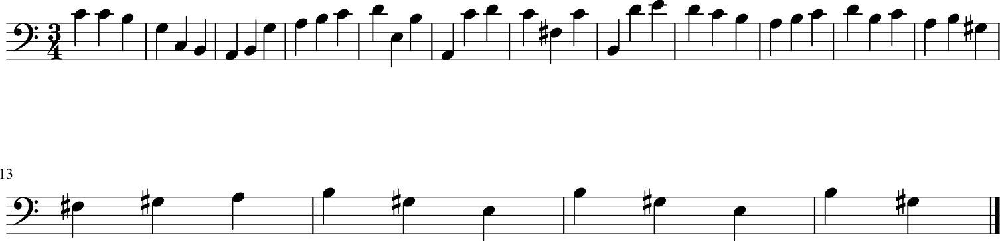

107/107 [==============================] - 64s 599ms/step - loss: 1.6417 - note_outputs_loss: 1.0974 - duration_outputs_loss: 0.5443
Epoch 261/5000
107/107 [==============================] - ETA: 0s - loss: 1.6368 - note_outputs_loss: 1.0920 - duration_outputs_loss: 0.5448[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E2', 'C2', 'C4', 'D4', 'C4', 'B3', 'G3', 'D3', 'E3', 'F3', 'D3', 'B2', 'A2', 'B2', 'G2', 'A2', 'B2', 'G3', 'E3', 'C#3', 'A2', 'B2', 'C#3', 'D3', 'E3', 'F#3', 'G3', 'A3', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'C#3', 'D3', 'B2'], ['0.0', '0.0', '0.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '0.5', '1.0', '1.0', '1.0', '0.5', '0.5', '0.5', '0.5', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5']]


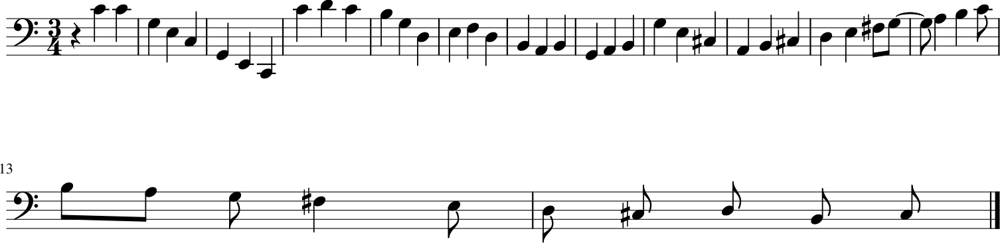

107/107 [==============================] - 64s 595ms/step - loss: 1.6368 - note_outputs_loss: 1.0920 - duration_outputs_loss: 0.5448
Epoch 262/5000
107/107 [==============================] - ETA: 0s - loss: 1.6283 - note_outputs_loss: 1.0904 - duration_outputs_loss: 0.5379[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'F3', 'G3', 'F3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G#3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G#3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'D3', 'E-3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


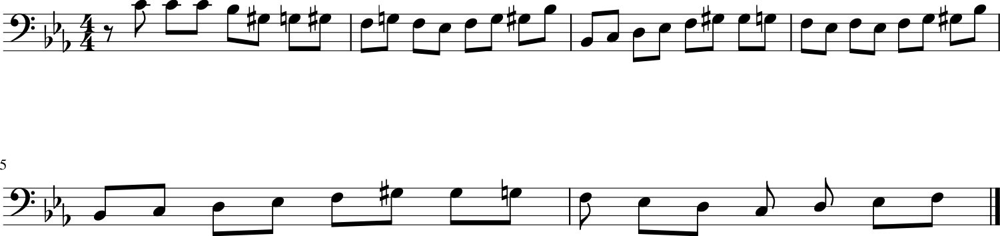

107/107 [==============================] - 64s 596ms/step - loss: 1.6283 - note_outputs_loss: 1.0904 - duration_outputs_loss: 0.5379
Epoch 263/5000
107/107 [==============================] - ETA: 0s - loss: 1.6348 - note_outputs_loss: 1.0867 - duration_outputs_loss: 0.5481[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'F#3', 'F3', 'F#3', 'E-3', 'D3', 'E-3', 'C3', 'B-2', 'C3', 'A2', 'C3', 'E-3', 'D3', 'C3', 'D3', 'B-2', 'A2', 'B-2', 'D3', 'C3', 'B-2', 'A2', 'G2', 'F#2', 'A2', 'C3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


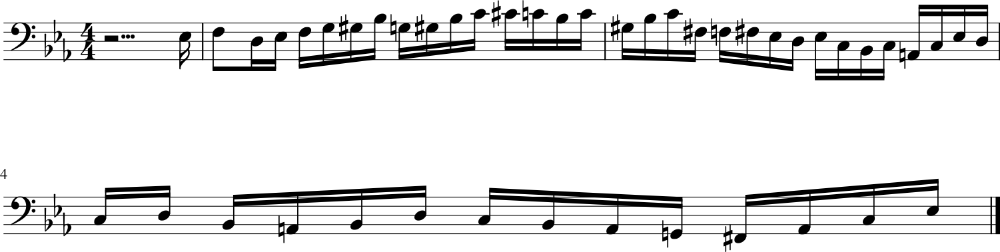

107/107 [==============================] - 64s 599ms/step - loss: 1.6348 - note_outputs_loss: 1.0867 - duration_outputs_loss: 0.5481
Epoch 264/5000
107/107 [==============================] - ETA: 0s - loss: 1.6268 - note_outputs_loss: 1.0841 - duration_outputs_loss: 0.5427[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'G3', 'G#3', 'F3', 'F2', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'G#3', 'B-3', 'E-4', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'F#3', 'F3', 'F#3', 'E-3', 'D3', 'E-3', 'C3', 'B-2', 'C3', 'A2', 'C3', 'E-3'], ['0.0', '0.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


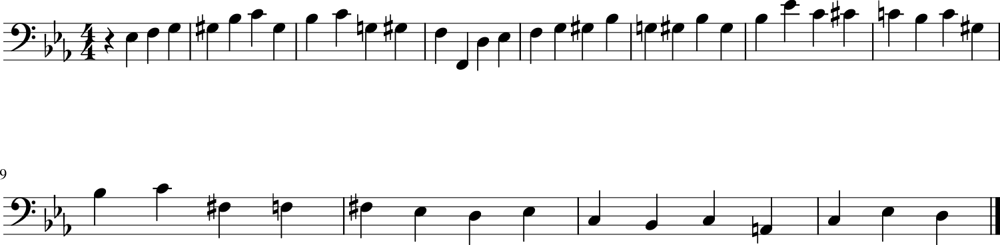

107/107 [==============================] - 64s 599ms/step - loss: 1.6268 - note_outputs_loss: 1.0841 - duration_outputs_loss: 0.5427
Epoch 265/5000
107/107 [==============================] - ETA: 0s - loss: 1.6231 - note_outputs_loss: 1.0818 - duration_outputs_loss: 0.5413[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'B-2', 'B-3', 'E-3', 'E-3', 'C3', 'D3', 'G#3', 'G#3', 'G#3', 'F3', 'G#3', 'G#3', 'F3', 'G#3', 'B-3', 'C4', 'D4', 'D4', 'C4', 'D4', 'B3', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'G#2', 'F3', 'B-2', 'D3', 'E-3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


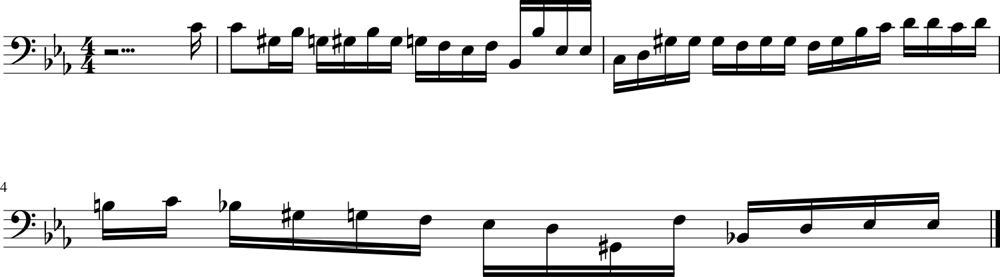

107/107 [==============================] - 64s 601ms/step - loss: 1.6231 - note_outputs_loss: 1.0818 - duration_outputs_loss: 0.5413
Epoch 266/5000
107/107 [==============================] - ETA: 0s - loss: 1.6300 - note_outputs_loss: 1.0841 - duration_outputs_loss: 0.5459[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G#3', 'B-3', 'E-4', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'G#2', 'B-2', 'G#2', 'C3', 'F3', 'D3', 'E-3', 'C3', 'D3', 'G#2', 'B-2', 'G#2', 'G2'], ['0.0', '0.0', '0.0', '5.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


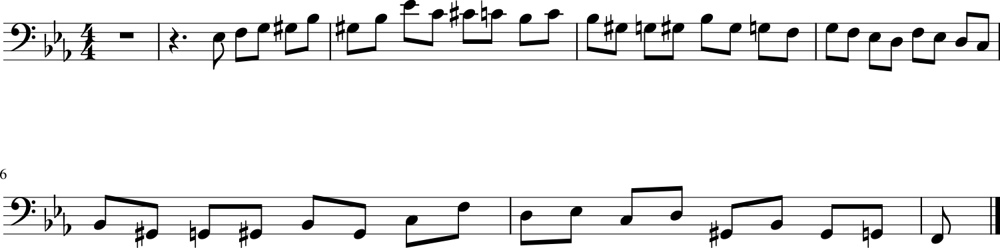

107/107 [==============================] - 64s 602ms/step - loss: 1.6300 - note_outputs_loss: 1.0841 - duration_outputs_loss: 0.5459
Epoch 267/5000
107/107 [==============================] - ETA: 0s - loss: 1.6325 - note_outputs_loss: 1.0879 - duration_outputs_loss: 0.5445[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'F3', 'G3', 'D3', 'E-3', 'C3', 'B-2', 'G#2', 'C3', 'F3', 'G#3', 'C4', 'E-3', 'D3', 'C4', 'D3', 'E-3', 'D3', 'C3', 'B-2', 'D3', 'F3', 'G#3', 'F4', 'E-4', 'D4', 'C4', 'B-3', 'E-4', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'E-3', 'D3', 'C3', 'D3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


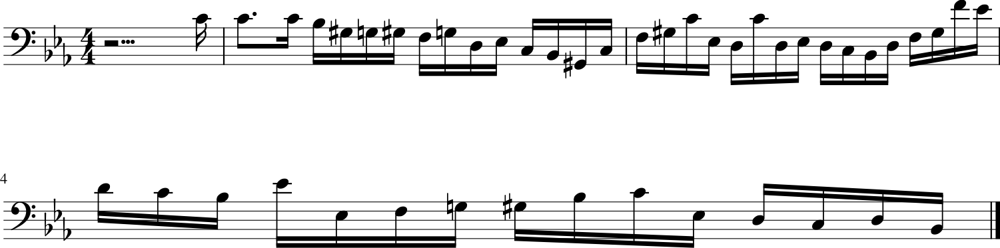

107/107 [==============================] - 65s 604ms/step - loss: 1.6325 - note_outputs_loss: 1.0879 - duration_outputs_loss: 0.5445
Epoch 268/5000
107/107 [==============================] - ETA: 0s - loss: 1.6200 - note_outputs_loss: 1.0777 - duration_outputs_loss: 0.5422[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'B-3', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'B-3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'D3', 'E-3', 'F3', 'G3', 'G#3'], ['0.0', '1.0', '1.0', '0.5', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


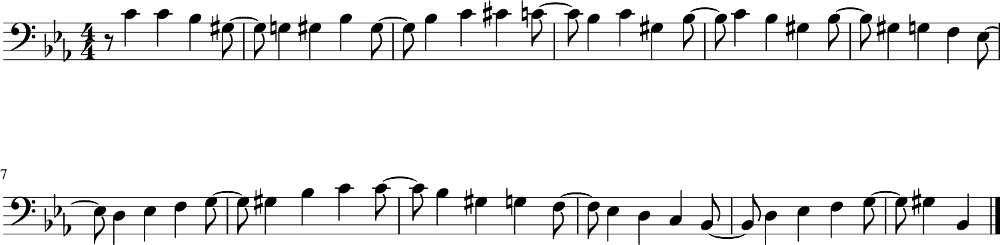

107/107 [==============================] - 64s 599ms/step - loss: 1.6200 - note_outputs_loss: 1.0777 - duration_outputs_loss: 0.5422
Epoch 269/5000
107/107 [==============================] - ETA: 0s - loss: 1.6303 - note_outputs_loss: 1.0871 - duration_outputs_loss: 0.5432[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'F3', 'G3', 'D3', 'E-3', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'B-3', 'E-4', 'G3', 'F3', 'E-3', 'B-2', 'D4', 'E-4', 'rest'], ['0.0', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


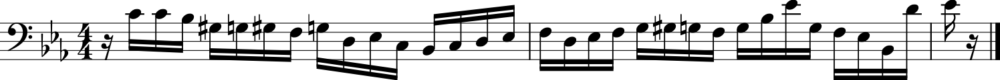

107/107 [==============================] - 63s 591ms/step - loss: 1.6303 - note_outputs_loss: 1.0871 - duration_outputs_loss: 0.5432
Epoch 270/5000
107/107 [==============================] - ETA: 0s - loss: 1.6310 - note_outputs_loss: 1.0872 - duration_outputs_loss: 0.5438[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E2', 'C2', 'C4', 'D4', 'C4', 'B3', 'C4', 'D4', 'B3', 'E3', 'G3', 'C4', 'D4', 'E4', 'C4', 'G#3', 'A3', 'F3', 'A3', 'D3', 'C4', 'B3', 'A3', 'G3', 'B3', 'A3', 'G#3', 'B-3', 'B-3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3'], ['0.0', '0.0', '0.0', '2.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


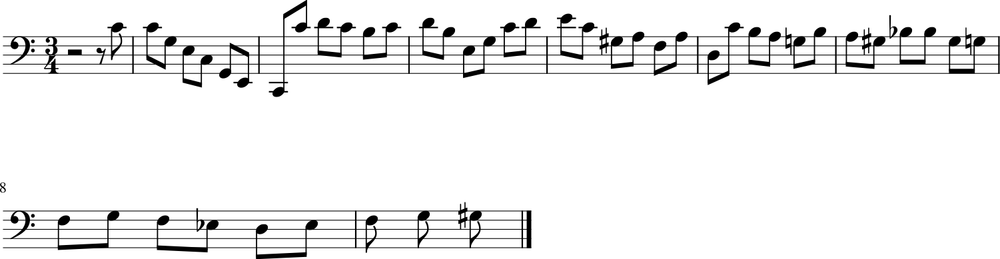

107/107 [==============================] - 65s 610ms/step - loss: 1.6310 - note_outputs_loss: 1.0872 - duration_outputs_loss: 0.5438
Epoch 271/5000
107/107 [==============================] - ETA: 0s - loss: 1.6170 - note_outputs_loss: 1.0754 - duration_outputs_loss: 0.5416[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'B-3', 'D3', 'E-3', 'F3', 'G3', 'E-3', 'G#3', 'F3', 'B-3', 'G3', 'E-3', 'E-2', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G#3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2', 'G2', 'G#2', 'F2', 'G#3', 'G#3', 'G3', 'G#3', 'G#3'], ['0.0', '0.0', '0.0', '5.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


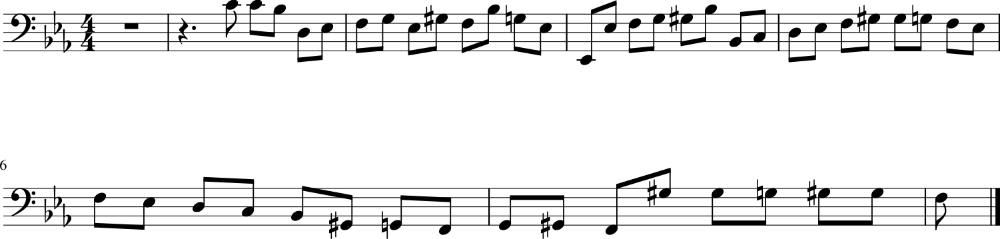

107/107 [==============================] - 64s 599ms/step - loss: 1.6170 - note_outputs_loss: 1.0754 - duration_outputs_loss: 0.5416
Epoch 272/5000
107/107 [==============================] - ETA: 0s - loss: 1.6226 - note_outputs_loss: 1.0774 - duration_outputs_loss: 0.5452[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'G3', 'G#3', 'F3', 'F2', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'F3', 'G3', 'E-3', 'E-2', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4'], ['0.0', '0.0', '0.0', '5.5', '0.5', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


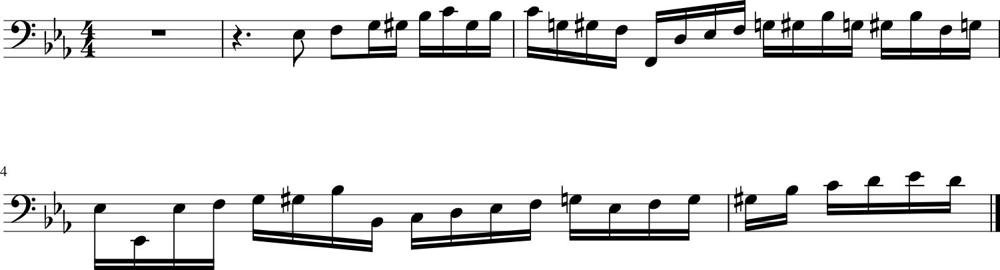

107/107 [==============================] - 64s 598ms/step - loss: 1.6226 - note_outputs_loss: 1.0774 - duration_outputs_loss: 0.5452
Epoch 273/5000
107/107 [==============================] - ETA: 0s - loss: 1.6214 - note_outputs_loss: 1.0753 - duration_outputs_loss: 0.5462[['START', 'C:major', '3/4TS', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'G2', 'B2', 'G2', 'F3', 'G3', 'F3', 'E3', 'D3', 'E3', 'C3', 'G2', 'E3', 'D3', 'E3', 'F3', 'C3', 'B2', 'E3', 'F3', 'A2', 'G2', 'E3', 'F3', 'F2', 'E2', 'G2', 'B2', 'D3', 'G3', 'E3', 'C3', 'G2', 'B2', 'C3', 'C4', 'D4', 'B-:major', 'E-4'], ['0.0', '0.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


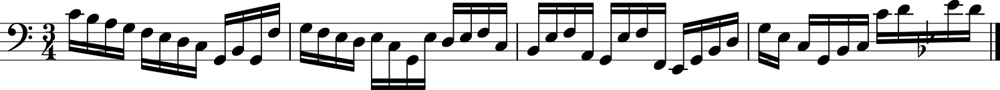

107/107 [==============================] - 64s 599ms/step - loss: 1.6214 - note_outputs_loss: 1.0753 - duration_outputs_loss: 0.5462
Epoch 274/5000
107/107 [==============================] - ETA: 0s - loss: 1.6219 - note_outputs_loss: 1.0801 - duration_outputs_loss: 0.5417[['START', 'C:major', '3/4TS', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E2', 'C2', 'C4', 'D4', 'C4', 'B3', 'A3', 'G3', 'D3', 'B2', 'C3', 'D3', 'B2', 'A2', 'G2', 'A2', 'D3', 'B2', 'D3', 'A2', 'B2', 'G2', 'D3', 'E3', 'C3', 'E3', 'C3', 'G2', 'F#3', 'C4', 'B3', 'C4', 'F#3', 'C4', 'F#3', 'G2', 'F#3', 'C4', 'F#3', 'G2'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


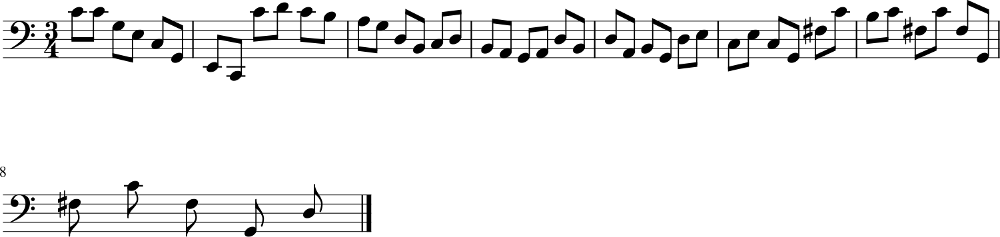

107/107 [==============================] - 65s 604ms/step - loss: 1.6219 - note_outputs_loss: 1.0801 - duration_outputs_loss: 0.5417
Epoch 275/5000
107/107 [==============================] - ETA: 0s - loss: 1.6145 - note_outputs_loss: 1.0724 - duration_outputs_loss: 0.5421[['START', 'C:major', '3/4TS', 'C4', 'C4', 'A3', 'B3', 'B-3', 'B-3', 'B-3', 'B-3', 'D3', 'E3', 'F3', 'C2', 'D2', 'E-2', 'G3', 'E3', 'F3', 'E-3', 'F3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'A3', 'B-3', 'F3', 'B-3', 'F3', 'E-3', 'B2', 'C3', 'E-3', 'C3', 'B-2', 'G#2', 'G#2', 'C4', 'B-3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'F3'], ['0.0', '0.0', '0.0', '3.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


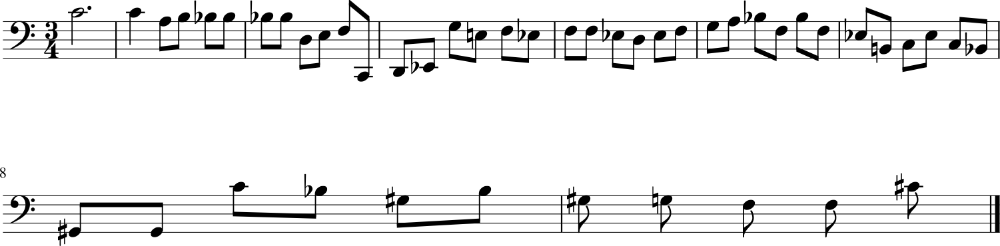

107/107 [==============================] - 64s 600ms/step - loss: 1.6145 - note_outputs_loss: 1.0724 - duration_outputs_loss: 0.5421
Epoch 276/5000
107/107 [==============================] - ETA: 0s - loss: 1.6264 - note_outputs_loss: 1.0830 - duration_outputs_loss: 0.5435[['START', 'F:major', '3/4TS', 'rest', 'A3', 'A3', 'B-3', 'D3', 'E-3', 'G2', 'B-3', 'E-3', 'F3', 'B-2', 'D3', 'E-3', 'F3', 'D3', 'C3', 'B-2', 'D3', 'F3', 'G#3', 'F4', 'E-4', 'D4', 'C4', 'B-3', 'E-4', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'E-3', 'D3', 'C3', 'D3', 'B-2', 'E-4', 'D4', 'C4', 'B-3', 'E-4', 'E-3', 'F3', 'G3', 'G#3'], ['0.0', '0.0', '0.0', '5.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


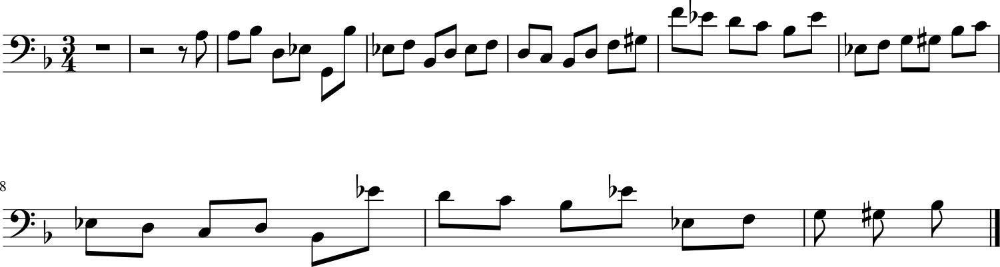

107/107 [==============================] - 65s 604ms/step - loss: 1.6264 - note_outputs_loss: 1.0830 - duration_outputs_loss: 0.5435
Epoch 277/5000
107/107 [==============================] - ETA: 0s - loss: 1.6106 - note_outputs_loss: 1.0678 - duration_outputs_loss: 0.5428[['START', 'E-:major', '3/4TS', 'rest', 'E-3', 'E-3', 'B-2', 'C3', 'G#2', 'C4', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'G3', 'G3', 'F3', 'G3', 'D3', 'E-3', 'D3', 'C3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'F3', 'G3', 'A3', 'B-3', 'D3', 'C3', 'B-2', 'C3', 'D3', 'F#3', 'G3', 'A3', 'B-3', 'C4', 'D4', 'E-4'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


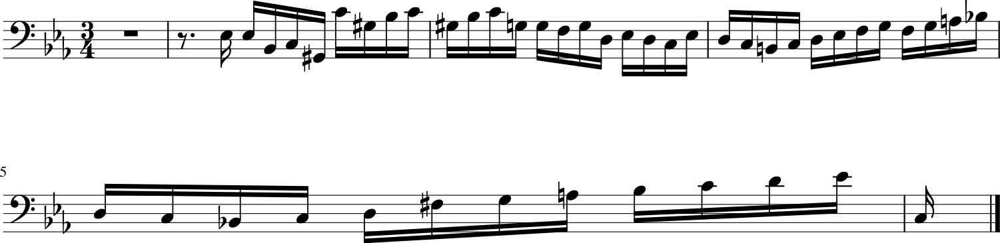

107/107 [==============================] - 66s 616ms/step - loss: 1.6106 - note_outputs_loss: 1.0678 - duration_outputs_loss: 0.5428
Epoch 278/5000
107/107 [==============================] - ETA: 0s - loss: 1.6166 - note_outputs_loss: 1.0737 - duration_outputs_loss: 0.5429[['START', 'C:major', '3/4TS', 'C4', 'C4', 'A3', 'B3', 'B-3', 'B-3', 'B-3', 'D3', 'E3', 'F3', 'C4', 'E3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2', 'G#3', 'G3', 'F3', 'B-2', 'G#3', 'G3', 'F3', 'E-2', 'G3', 'F3', 'E-3', 'A2', 'F#3', 'F3', 'E-3', 'D3', 'F3', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'G3', 'A3', 'B-3', 'C4'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


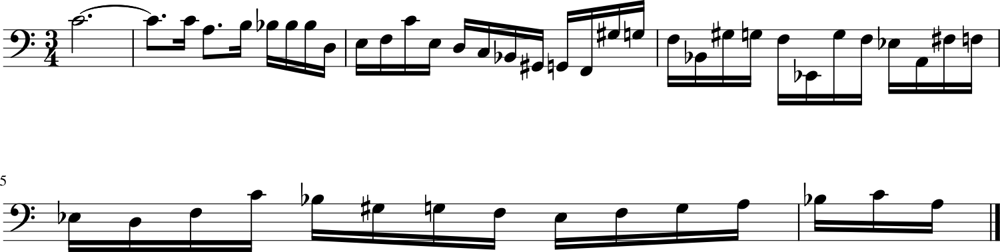

107/107 [==============================] - 68s 631ms/step - loss: 1.6166 - note_outputs_loss: 1.0737 - duration_outputs_loss: 0.5429
Epoch 279/5000
107/107 [==============================] - ETA: 0s - loss: 1.6160 - note_outputs_loss: 1.0729 - duration_outputs_loss: 0.5431[['START', 'C:major', '3/4TS', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E2', 'C2', 'C4', 'D4', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'G2', 'A2', 'F2', 'D2', 'A2', 'D3', 'E3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'C3', 'B2', 'D3', 'F3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'C3', 'C2', 'G3', 'F3', 'G3'], ['0.0', '0.0', '0.0', '0.5', '0.5', '0.5', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


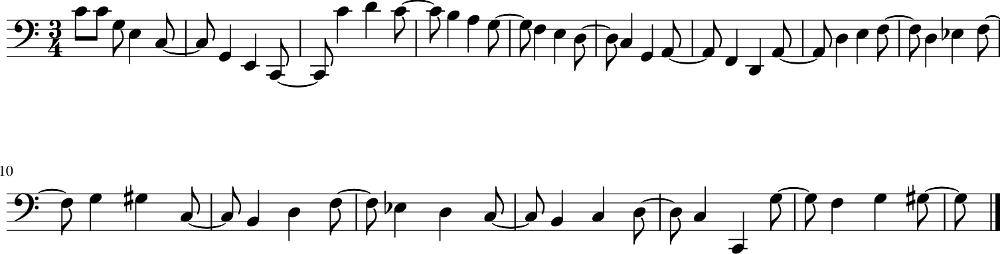

107/107 [==============================] - 67s 627ms/step - loss: 1.6160 - note_outputs_loss: 1.0729 - duration_outputs_loss: 0.5431
Epoch 280/5000
107/107 [==============================] - ETA: 0s - loss: 1.6093 - note_outputs_loss: 1.0691 - duration_outputs_loss: 0.5402[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'G3', 'G#3', 'F3', 'F2', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'C4', 'G3', 'G#3', 'G3', 'F3', 'G3', 'D3', 'E-3', 'D3', 'C3', 'E-3', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3'], ['0.0', '0.0', '0.0', '5.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


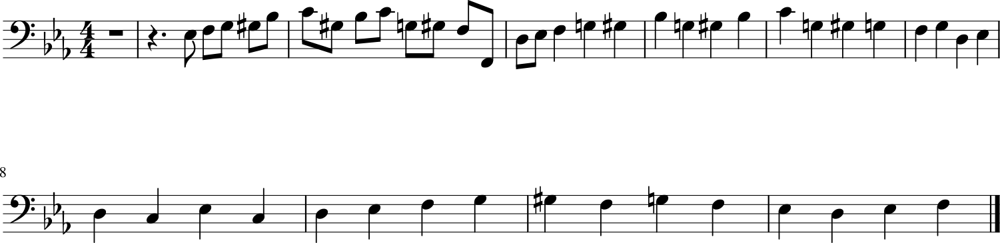

107/107 [==============================] - 66s 617ms/step - loss: 1.6093 - note_outputs_loss: 1.0691 - duration_outputs_loss: 0.5402
Epoch 281/5000
107/107 [==============================] - ETA: 0s - loss: 1.6165 - note_outputs_loss: 1.0736 - duration_outputs_loss: 0.5429[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E2', 'C2', 'C4', 'D4', 'C4', 'B3', 'C4', 'D4', 'B3', 'G3', 'D3', 'B2', 'G2', 'F2', 'D4', 'C4', 'B3', 'A3', 'G3', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'F3', 'D3', 'G2', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'B2', 'C3', 'G3', 'A3', 'B3'], ['0.0', '0.0', '0.0', '1.0', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


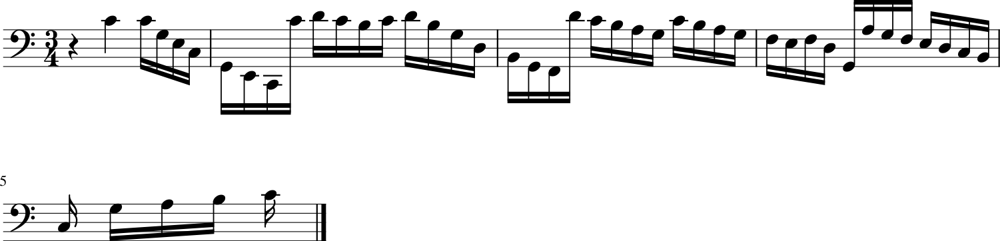

107/107 [==============================] - 64s 602ms/step - loss: 1.6165 - note_outputs_loss: 1.0736 - duration_outputs_loss: 0.5429
Epoch 282/5000
107/107 [==============================] - ETA: 0s - loss: 1.6090 - note_outputs_loss: 1.0668 - duration_outputs_loss: 0.5422[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'D3', 'E-3', 'C3', 'G2', 'E-2', 'C4', 'E-3', 'G2', 'B2', 'F2', 'G2', 'B2', 'D3', 'F3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'G2', 'B2', 'D3', 'G3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'E-3'], ['0.0', '0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


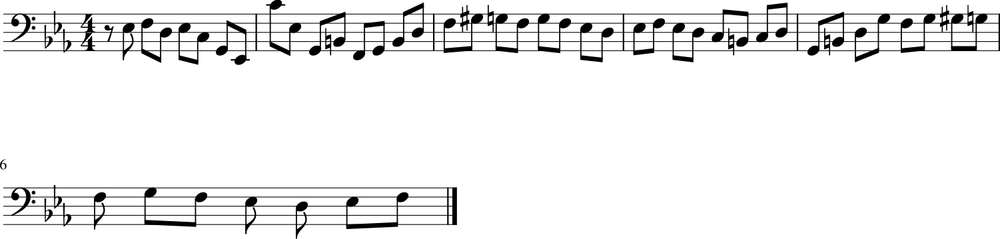

107/107 [==============================] - 65s 604ms/step - loss: 1.6090 - note_outputs_loss: 1.0668 - duration_outputs_loss: 0.5422
Epoch 283/5000
107/107 [==============================] - ETA: 0s - loss: 1.6128 - note_outputs_loss: 1.0698 - duration_outputs_loss: 0.5430[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E2', 'C2', 'C4', 'D4', 'C4', 'B3', 'C4', 'D4', 'B3', 'C4', 'B-3', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'B-2', 'A2', 'B-2', 'C3', 'A2', 'G2', 'F2', 'A3', 'F3', 'C#3', 'D3', 'B-3', 'G#3', 'A3', 'D4', 'E4', 'F4', 'G#3', 'D3', 'F4', 'E4', 'D4'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


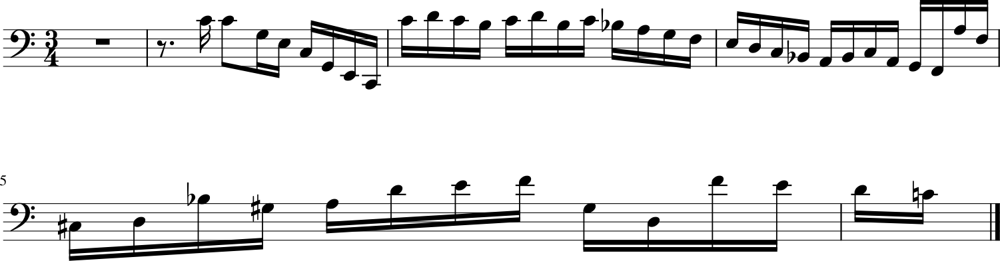

107/107 [==============================] - 65s 605ms/step - loss: 1.6128 - note_outputs_loss: 1.0698 - duration_outputs_loss: 0.5430
Epoch 284/5000
107/107 [==============================] - ETA: 0s - loss: 1.6132 - note_outputs_loss: 1.0705 - duration_outputs_loss: 0.5427[['START', 'F:major', '3/4TS', 'rest', 'A3', 'A3', 'D3', 'F3', 'D3', 'F3', 'D3', 'F3', 'A3', 'B-3', 'D3', 'E-3', 'F3', 'B-2', 'B-3', 'A3', 'B-3', 'F3', 'B-2', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'E-3', 'F3', 'G3', 'F3', 'G3', 'A3', 'B-3', 'B-3', 'A3', 'B-3', 'C4', 'A3', 'F#3', 'D4', 'F#3', 'E3', 'F#3', 'A3', 'D3', 'E3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


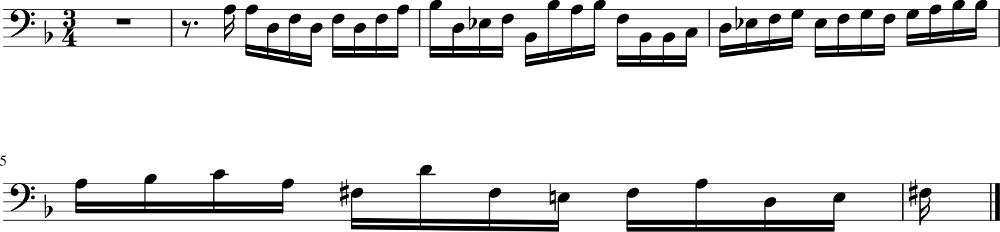

107/107 [==============================] - 64s 601ms/step - loss: 1.6132 - note_outputs_loss: 1.0705 - duration_outputs_loss: 0.5427
Epoch 285/5000
107/107 [==============================] - ETA: 0s - loss: 1.6016 - note_outputs_loss: 1.0624 - duration_outputs_loss: 0.5393[['START', 'F:major', '3/4TS', 'rest', 'A3', 'A3', 'D3', 'E3', 'C#3', 'A2', 'C3', 'F3', 'G3', 'F3', 'E3', 'G3', 'E3', 'F3', 'D3', 'E3', 'F3', 'G3', 'E3', 'F3', 'D3', 'E3', 'C3', 'B-2', 'A2', 'B-2', 'G2', 'F2', 'E2', 'G2', 'C3', 'E3', 'G3', 'B-2', 'G#2', 'C3', 'F3', 'G#2', 'G2', 'G#2', 'B-2', 'G2', 'G#2', 'F2', 'G2'], ['0.0', '0.0', '0.0', '5.5', '0.5', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


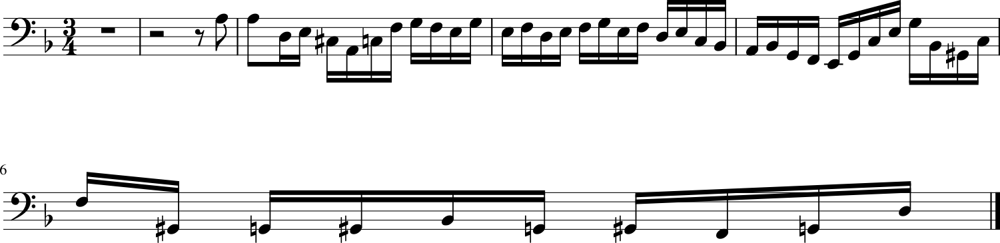

107/107 [==============================] - 64s 599ms/step - loss: 1.6016 - note_outputs_loss: 1.0624 - duration_outputs_loss: 0.5393
Epoch 286/5000
107/107 [==============================] - ETA: 0s - loss: 1.6064 - note_outputs_loss: 1.0680 - duration_outputs_loss: 0.5384[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'G3', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'B-3', 'B-3', 'G#3', 'B-3', 'G3', 'G2', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2', 'G#3', 'G3', 'F3', 'B-2', 'G#3', 'G3'], ['0.0', '0.0', '0.0', '1/6', '1/12', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


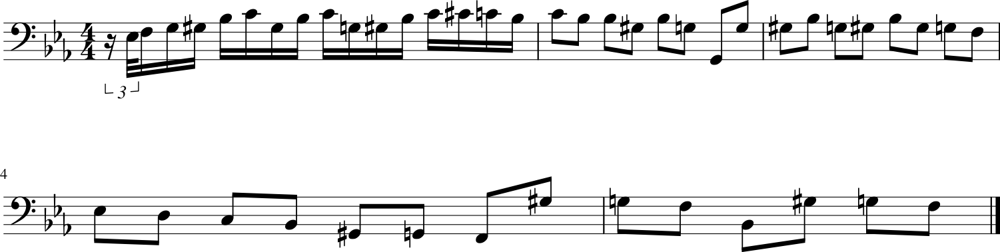

107/107 [==============================] - 64s 597ms/step - loss: 1.6064 - note_outputs_loss: 1.0680 - duration_outputs_loss: 0.5384
Epoch 287/5000
107/107 [==============================] - ETA: 0s - loss: 1.6073 - note_outputs_loss: 1.0682 - duration_outputs_loss: 0.5390[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G3', 'E-3', 'B-2', 'B-3', 'C4', 'B-3', 'A3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'D3', 'C3', 'B-2', 'D3', 'G3', 'B-2', 'E-3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-2', 'C3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


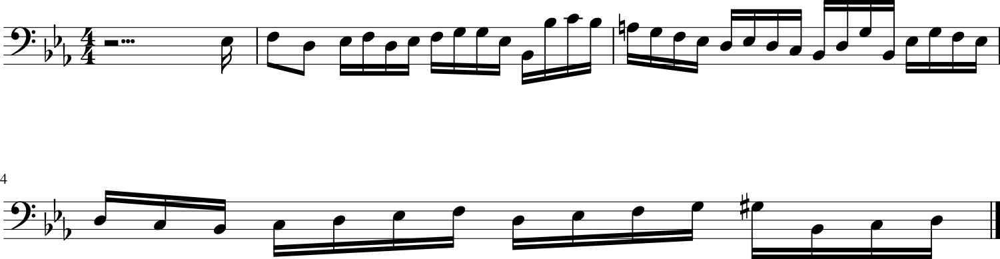

107/107 [==============================] - 64s 596ms/step - loss: 1.6073 - note_outputs_loss: 1.0682 - duration_outputs_loss: 0.5390
Epoch 288/5000
107/107 [==============================] - ETA: 0s - loss: 1.6088 - note_outputs_loss: 1.0655 - duration_outputs_loss: 0.5433[['START', 'C:major', '3/4TS', 'C4', 'C4', 'A3', 'B3', 'B-3', 'G#3', 'G3', 'F3', 'E3', 'F3', 'G#3', 'E-3', 'D3', 'C3', 'B2', 'G#2', 'G2', 'F2', 'E-2', 'G2', 'B2', 'D3', 'F3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4'], ['0.0', '0.0', '0.0', '3.75', '0.25', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


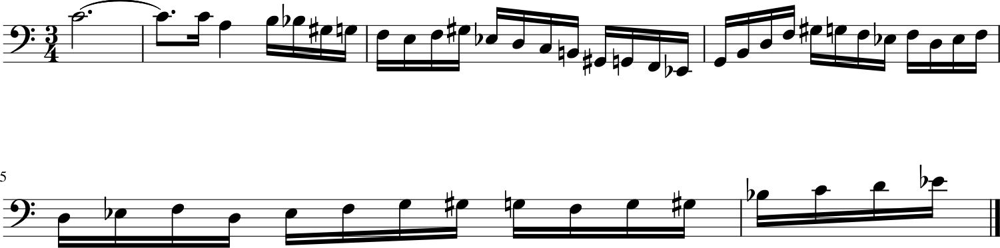

107/107 [==============================] - 64s 597ms/step - loss: 1.6088 - note_outputs_loss: 1.0655 - duration_outputs_loss: 0.5433
Epoch 289/5000
107/107 [==============================] - ETA: 0s - loss: 1.6061 - note_outputs_loss: 1.0635 - duration_outputs_loss: 0.5426[['START', 'G:major', '4/4TS', 'rest', 'B3', 'B3', 'B3', 'A3', 'B3', 'B3', 'B3', 'C4', 'B3', 'C4', 'B3', 'A3', 'B3', 'D3', 'G2', 'G3', 'B3', 'G3', 'A3', 'B3', 'G3', 'D3', 'E3', 'F3', 'D3', 'B2', 'A2', 'B2', 'G2', 'C2', 'F3', 'E3', 'D3', 'E3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'D3', 'D4', 'F4', 'B3'], ['0.0', '2.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


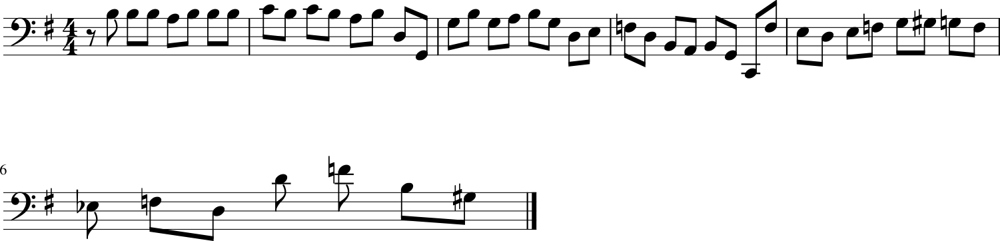

107/107 [==============================] - 64s 601ms/step - loss: 1.6061 - note_outputs_loss: 1.0635 - duration_outputs_loss: 0.5426
Epoch 290/5000
107/107 [==============================] - ETA: 0s - loss: 1.6057 - note_outputs_loss: 1.0638 - duration_outputs_loss: 0.5419[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E2', 'C2', 'C4', 'D4', 'C4', 'B3', 'C4', 'D4', 'B3', 'G3', 'D3', 'B2', 'D3', 'G2', 'F2', 'D4', 'C4', 'B3', 'A3', 'G3', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'F3', 'D3', 'G2', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'B2', 'C3', 'G3', 'A3'], ['0.0', '0.0', '0.0', '2.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


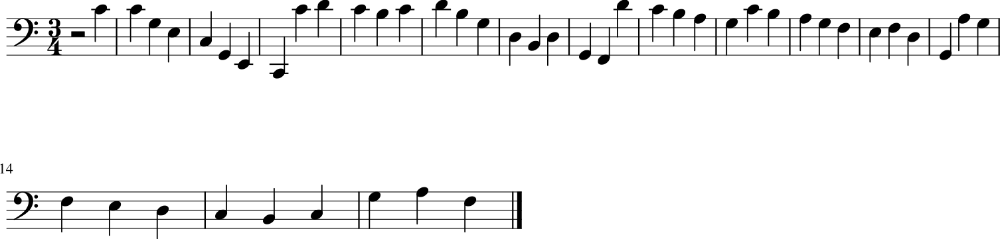

107/107 [==============================] - 64s 595ms/step - loss: 1.6057 - note_outputs_loss: 1.0638 - duration_outputs_loss: 0.5419
Epoch 291/5000
107/107 [==============================] - ETA: 0s - loss: 1.6026 - note_outputs_loss: 1.0604 - duration_outputs_loss: 0.5422[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E2', 'C2', 'C4', 'D4', 'C4', 'B3', 'C4', 'D4', 'B3', 'G3', 'D3', 'B2', 'G2', 'F2', 'D4', 'C4', 'B3', 'A3', 'G3', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'F3', 'D3', 'G2', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'B2', 'C3', 'G2', 'C2', 'C3'], ['0.0', '0.0', '0.0', '5.5', '0.5', '0.5', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


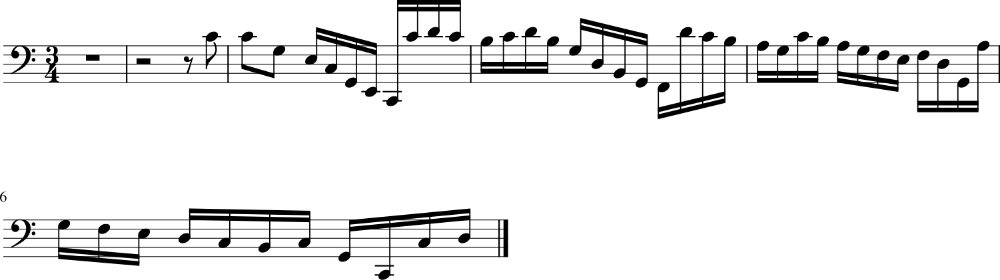

107/107 [==============================] - 64s 597ms/step - loss: 1.6026 - note_outputs_loss: 1.0604 - duration_outputs_loss: 0.5422
Epoch 292/5000
107/107 [==============================] - ETA: 0s - loss: 1.6003 - note_outputs_loss: 1.0568 - duration_outputs_loss: 0.5435[['START', 'G:major', '4/4TS', 'rest', 'D4', 'A3', 'B3', 'D3', 'G2', 'D3', 'B3', 'A3', 'B3', 'D3', 'G2', 'G3', 'B3', 'F#3', 'G3', 'E3', 'G3', 'A3', 'B3', 'C#4', 'D4', 'B3', 'C#4', 'D4', 'C#4', 'B3', 'A3', 'G#3', 'A3', 'G#3', 'F#3', 'E3', 'F#3', 'E3', 'F#3', 'G#3', 'A3', 'F#3', 'D3', 'F#3', 'G#3', 'A3', 'B3', 'C#4', 'D4'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


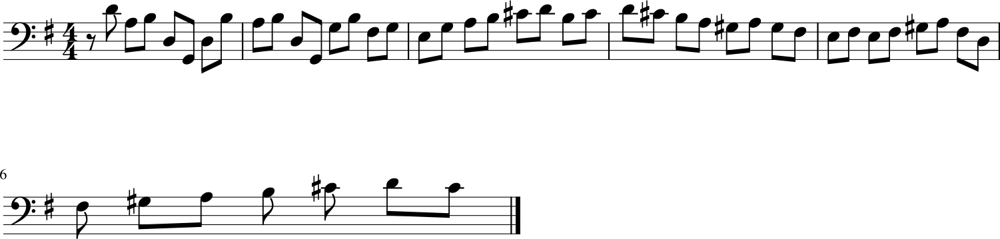

107/107 [==============================] - 64s 599ms/step - loss: 1.6003 - note_outputs_loss: 1.0568 - duration_outputs_loss: 0.5435
Epoch 293/5000
107/107 [==============================] - ETA: 0s - loss: 1.6039 - note_outputs_loss: 1.0623 - duration_outputs_loss: 0.5416[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'B-3', 'A3', 'G3', 'F3', 'E-3', 'C3', 'B-2', 'A2', 'C3', 'F2', 'A3', 'G3', 'F3', 'G3', 'G#3', 'A3', 'B-3', 'A3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'D3', 'C3', 'B-2', 'A2', 'C3', 'B-2', 'D3', 'C3', 'B-2', 'F3', 'G3', 'E-3', 'F3', 'G3', 'G#3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


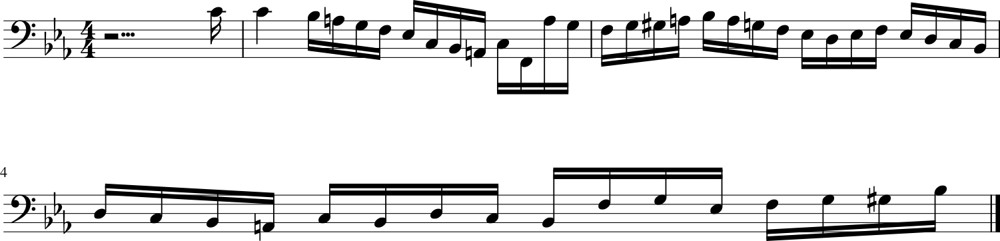

107/107 [==============================] - 64s 599ms/step - loss: 1.6039 - note_outputs_loss: 1.0623 - duration_outputs_loss: 0.5416
Epoch 294/5000
107/107 [==============================] - ETA: 0s - loss: 1.6037 - note_outputs_loss: 1.0640 - duration_outputs_loss: 0.5397[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E2', 'C2', 'C4', 'D4', 'C4', 'B3', 'C4', 'D4', 'B3', 'G3', 'D3', 'B2', 'D3', 'G2', 'F2', 'D4', 'C4', 'B3', 'A3', 'G3', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'F3', 'D3', 'G2', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'B2', 'C3', 'G2', 'C2'], ['0.0', '0.0', '0.0', '3.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


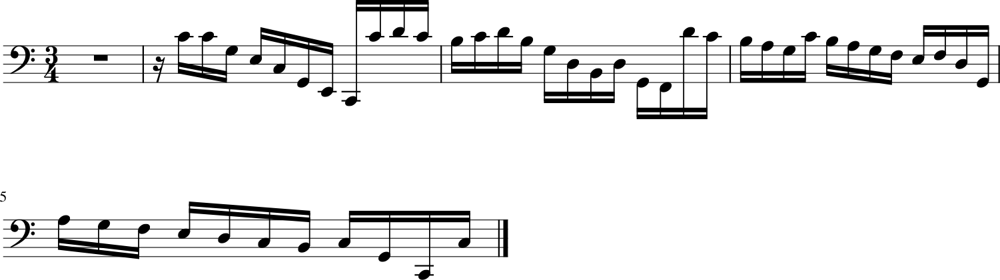

107/107 [==============================] - 65s 605ms/step - loss: 1.6037 - note_outputs_loss: 1.0640 - duration_outputs_loss: 0.5397
Epoch 295/5000
107/107 [==============================] - ETA: 0s - loss: 1.5955 - note_outputs_loss: 1.0557 - duration_outputs_loss: 0.5399[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G#3', 'B-3', 'E-4', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'F#3', 'F3', 'F#3', 'E-3', 'D3', 'E-3', 'C3', 'B-2', 'C3', 'A2', 'C3', 'E-3', 'D3', 'C3', 'D3', 'E-3', 'C3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'F3', 'G3', 'C4', 'G3', 'B-3', 'G#3', 'G3'], ['0.0', '0.0', '0.0', '3.5', '0.5', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


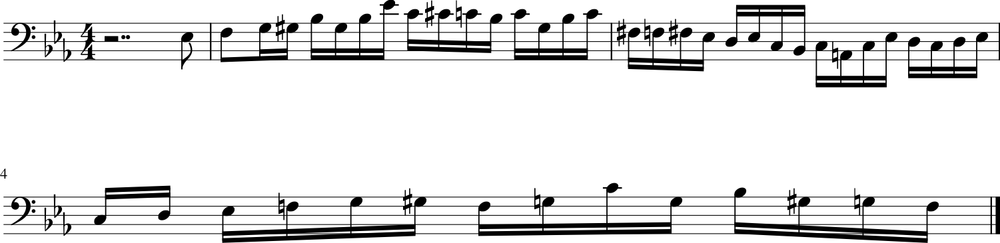

107/107 [==============================] - 64s 599ms/step - loss: 1.5955 - note_outputs_loss: 1.0557 - duration_outputs_loss: 0.5399
Epoch 296/5000
107/107 [==============================] - ETA: 0s - loss: 1.5964 - note_outputs_loss: 1.0538 - duration_outputs_loss: 0.5427[['START', 'E-:major', '4/4TS', 'rest', 'G3', 'C4', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'G3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B3', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'C4', 'B-3', 'G#3', 'B-3', 'G#3', 'B-3', 'E-4', 'C4'], ['0.0', '0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


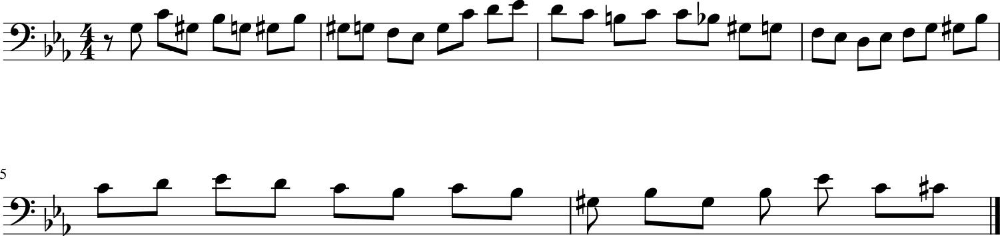

107/107 [==============================] - 64s 601ms/step - loss: 1.5964 - note_outputs_loss: 1.0538 - duration_outputs_loss: 0.5427
Epoch 297/5000
107/107 [==============================] - ETA: 0s - loss: 1.5999 - note_outputs_loss: 1.0574 - duration_outputs_loss: 0.5425[['START', 'F:major', '3/4TS', 'D3', 'E3', 'E3', 'D3', 'E3', 'F3', 'E3', 'D3', 'C3', 'B-2', 'G3', 'F3', 'E3', 'F3', 'G3', 'A3', 'B-3', 'D3', 'C#3', 'B2', 'A2', 'G2', 'D3', 'E3', 'F3', 'G3', 'E3', 'F3', 'D3', 'E3', 'F3', 'D3', 'E3', 'F3', 'G3', 'E3', 'C3', 'G3', 'A3', 'B3', 'C4', 'A3', 'D4', 'E4', 'F4', 'D4'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


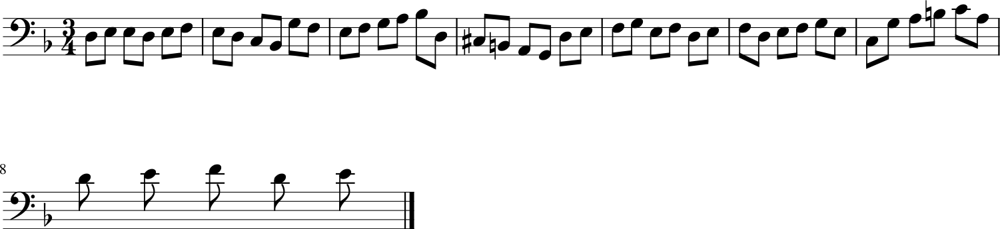

107/107 [==============================] - 64s 594ms/step - loss: 1.5999 - note_outputs_loss: 1.0574 - duration_outputs_loss: 0.5425
Epoch 298/5000
107/107 [==============================] - ETA: 0s - loss: 1.6001 - note_outputs_loss: 1.0557 - duration_outputs_loss: 0.5444[['START', 'E-:major', '4/4TS', 'rest', 'G3', 'C4', 'G#3', 'B-3', 'C4', 'G3', 'G#3', 'B-3', 'C4', 'G3', 'G#3', 'F3', 'F2', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2', 'G#3', 'G3', 'F3', 'B-2', 'G#3', 'G3', 'F3', 'E-2', 'G3', 'F3', 'E-3', 'A2', 'F#3'], ['0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


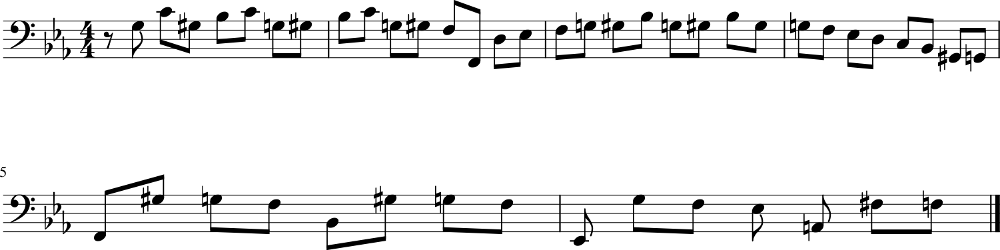

107/107 [==============================] - 64s 596ms/step - loss: 1.6001 - note_outputs_loss: 1.0557 - duration_outputs_loss: 0.5444
Epoch 299/5000
107/107 [==============================] - ETA: 0s - loss: 1.5924 - note_outputs_loss: 1.0492 - duration_outputs_loss: 0.5432[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E2', 'C2', 'C4', 'D4', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'E3', 'A3', 'B3', 'C4', 'A3', 'E3', 'C3', 'A2', 'C3', 'E3', 'C3', 'A2', 'C3', 'E3', 'C3', 'E3', 'C3', 'E3', 'C3', 'E3', 'C3', 'E3', 'G3', 'C4', 'B-3', 'A3', 'G3'], ['0.0', '0.0', '0.0', '3.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


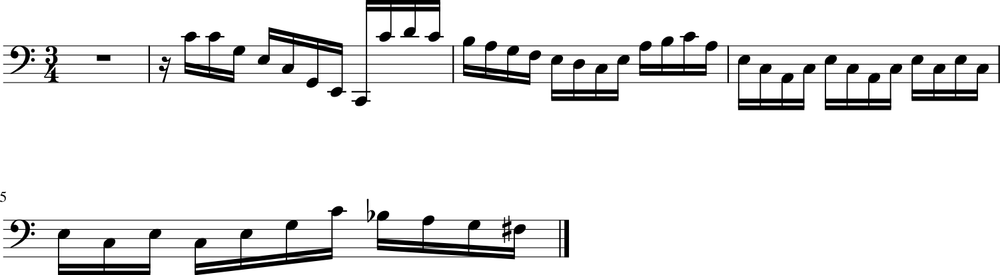

107/107 [==============================] - 64s 594ms/step - loss: 1.5924 - note_outputs_loss: 1.0492 - duration_outputs_loss: 0.5432
Epoch 300/5000
107/107 [==============================] - ETA: 0s - loss: 1.5999 - note_outputs_loss: 1.0575 - duration_outputs_loss: 0.5424[['START', 'F:major', '3/4TS', 'D3', 'E3', 'E3', 'D3', 'C#3', 'B2', 'A2', 'A3', 'B-3', 'B-3', 'A3', 'B-3', 'G3', 'A3', 'F3', 'E3', 'F3', 'A3', 'D3', 'D4', 'C4', 'A3', 'F3', 'D3', 'C4', 'B3', 'A3', 'G3', 'C4', 'E-3', 'F3', 'D3', 'C4', 'B3', 'A3', 'G3', 'C4', 'E3', 'G2', 'F3', 'C4', 'E3', 'G2', 'F3', 'C4', 'B3'], ['0.0', '0.0', '0.0', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


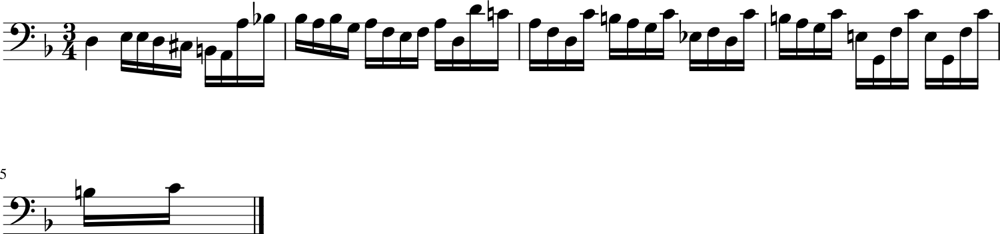

107/107 [==============================] - 64s 599ms/step - loss: 1.5999 - note_outputs_loss: 1.0575 - duration_outputs_loss: 0.5424
Epoch 301/5000
107/107 [==============================] - ETA: 0s - loss: 1.5977 - note_outputs_loss: 1.0537 - duration_outputs_loss: 0.5440[['START', 'F:major', '3/4TS', 'rest', 'D4', 'D4', 'E4', 'F4', 'E4', 'D4', 'C#4', 'E4', 'A3', 'C#4', 'E3', 'F3', 'D3', 'B-2', 'E2', 'G2', 'C3', 'D3', 'E3', 'F#3', 'G3', 'A3', 'B3', 'C4', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'A3', 'F#3', 'G3', 'A3', 'B3', 'C4', 'A3', 'B3', 'G3', 'D3', 'D3', 'B2', 'G2'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


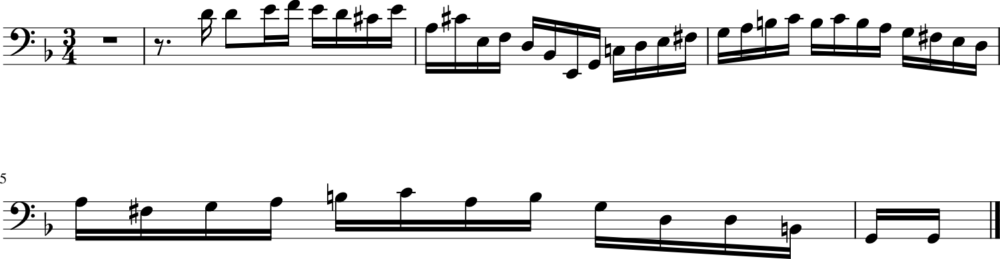

107/107 [==============================] - 64s 596ms/step - loss: 1.5977 - note_outputs_loss: 1.0537 - duration_outputs_loss: 0.5440
Epoch 302/5000
107/107 [==============================] - ETA: 0s - loss: 1.5863 - note_outputs_loss: 1.0441 - duration_outputs_loss: 0.5423[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E2', 'C2', 'C4', 'D4', 'C4', 'B3', 'C4', 'D4', 'B3', 'G3', 'D3', 'B2', 'G2', 'F2', 'D4', 'C4', 'B3', 'A3', 'G3', 'C4', 'B3', 'C4', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'G3', 'A3', 'E3', 'F#3', 'A3', 'D3', 'A3', 'G3', 'F#3', 'E3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


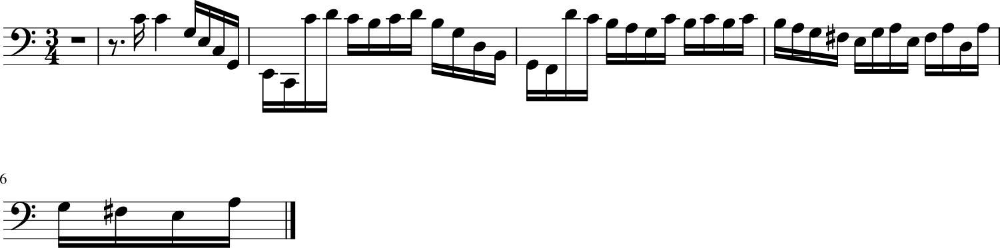

107/107 [==============================] - 64s 597ms/step - loss: 1.5863 - note_outputs_loss: 1.0441 - duration_outputs_loss: 0.5423
Epoch 303/5000
107/107 [==============================] - ETA: 0s - loss: 1.5940 - note_outputs_loss: 1.0517 - duration_outputs_loss: 0.5423[['START', 'C:major', '4/4TS', 'rest', 'G3', 'C4', 'C4', 'B3', 'G3', 'F3', 'E3', 'G3', 'C3', 'G2', 'B2', 'C2', 'G2', 'E3', 'D3', 'E3', 'F3', 'D3', 'E3', 'F3', 'G3', 'E3', 'D3', 'C3', 'E3', 'A3', 'F3', 'D3', 'E3', 'F3', 'D3', 'G3', 'E3', 'D3', 'E3', 'F3', 'D3', 'G3', 'E3', 'D3', 'E3', 'F3', 'D3', 'G3', 'E3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.75', '0.25', '0.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


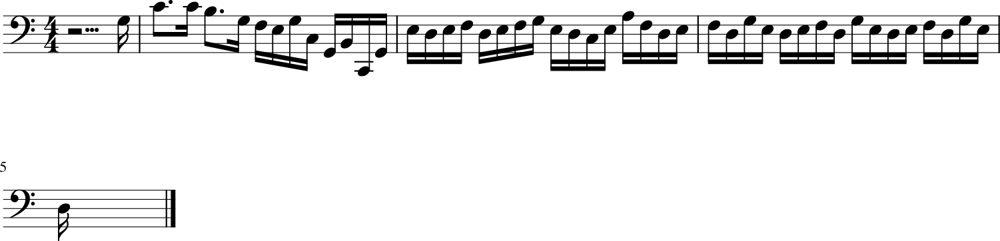

107/107 [==============================] - 64s 601ms/step - loss: 1.5940 - note_outputs_loss: 1.0517 - duration_outputs_loss: 0.5423
Epoch 304/5000
107/107 [==============================] - ETA: 0s - loss: 1.5910 - note_outputs_loss: 1.0494 - duration_outputs_loss: 0.5415[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'B2', 'C2', 'A2', 'B2', 'F2', 'A3', 'G#3', 'A3', 'E3', 'F#3', 'D3', 'E-3', 'D3', 'C3', 'D3', 'E3', 'F#3', 'B2', 'D3', 'G2', 'B2', 'D3', 'G3', 'A3', 'B3', 'D4', 'G3', 'B3', 'G3', 'D3', 'B2', 'G2', 'F3', 'B3', 'D4', 'G3', 'F3', 'B2', 'E3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '1.0', '1/12', '1/6', '1/12', '1/6', '1/12', '1/6', '1/12', '1/6', '1/12', '1/6', '1/12', '1/6', '1/12', '1/6', '1/12', '1/3', '1/12', '1/6', '1/12', '1/6', '1/12', '1/6', '1/12', '1/6', '1/12', '1/3', '1/12', '1/6', '1/12', '1/6', '1/12', '1/6', '1/12', '1/6', '1/12', '1/3', '1/12', '1/6', '1/12', '1/6', '1/12', '1/3', '1/12']]


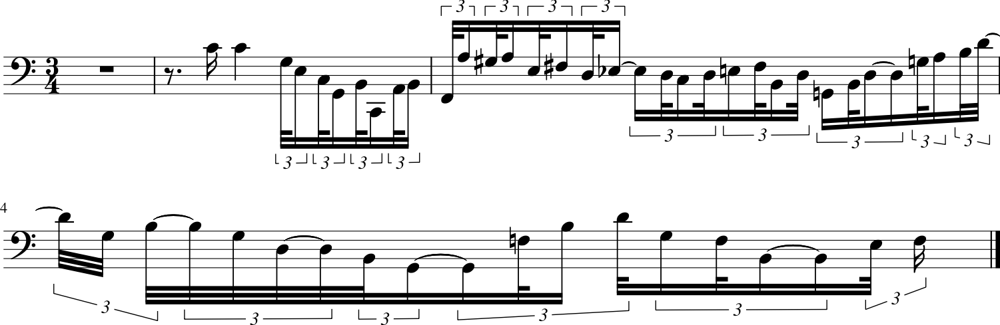

107/107 [==============================] - 64s 602ms/step - loss: 1.5910 - note_outputs_loss: 1.0494 - duration_outputs_loss: 0.5415
Epoch 305/5000
107/107 [==============================] - ETA: 0s - loss: 1.5945 - note_outputs_loss: 1.0496 - duration_outputs_loss: 0.5449[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'F3', 'F2', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'F4', 'E-4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G#3', 'G#3', 'G3', 'F3', 'E-3'], ['0.0', '0.0', '0.0', '2.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


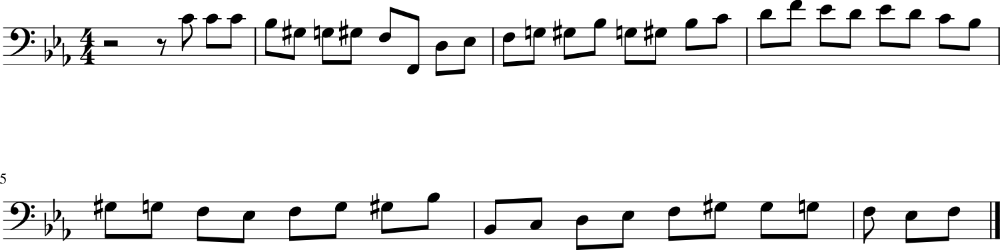

107/107 [==============================] - 64s 602ms/step - loss: 1.5945 - note_outputs_loss: 1.0496 - duration_outputs_loss: 0.5449
Epoch 306/5000
107/107 [==============================] - ETA: 0s - loss: 1.5890 - note_outputs_loss: 1.0458 - duration_outputs_loss: 0.5432[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'C3', 'B-2', 'E4', 'C4', 'C#4', 'G3', 'C4', 'E3', 'F3', 'G#3', 'E-3', 'F3', 'G#3', 'C3', 'D3', 'G#2', 'F3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'G3', 'A3', 'B-3', 'C4', 'A3', 'B-3', 'C4', 'D4'], ['0.0', '0.0', '0.0', '3.75', '0.25', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


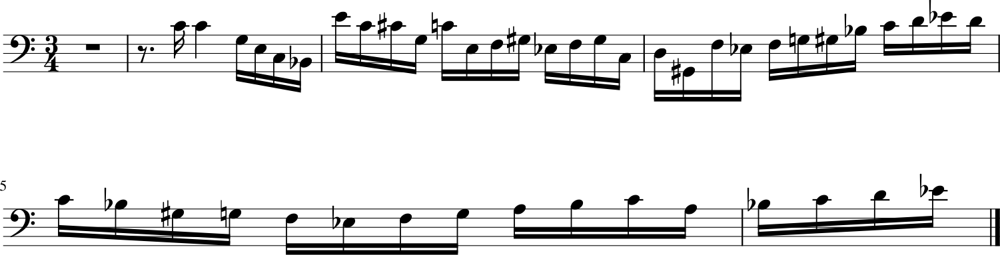

107/107 [==============================] - 64s 602ms/step - loss: 1.5890 - note_outputs_loss: 1.0458 - duration_outputs_loss: 0.5432
Epoch 307/5000
107/107 [==============================] - ETA: 0s - loss: 1.5863 - note_outputs_loss: 1.0432 - duration_outputs_loss: 0.5431[['START', 'C:major', '3/4TS', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E2', 'G2', 'C4', 'rest', 'B2', 'G3', 'A2', 'B2', 'C3', 'D3', 'E3', 'A2', 'C3', 'E3', 'C3', 'F2', 'A3', 'B3', 'B3', 'B3', 'C4', 'B3', 'C4', 'G3', 'C4', 'G3', 'C4', 'B3', 'C4', 'B3', 'C4', 'A3', 'B3', 'C4', 'B3', 'A3', 'B3', 'C4', 'D4', 'B3'], ['0.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


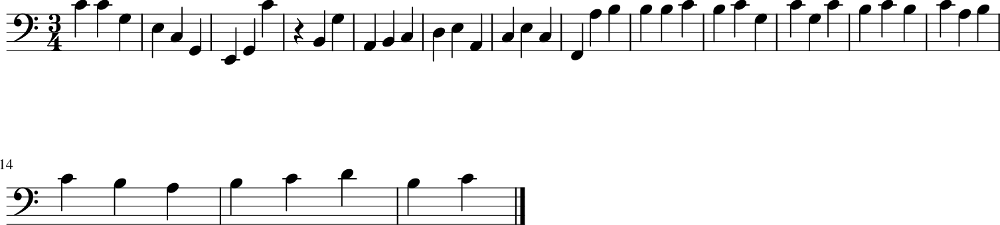

107/107 [==============================] - 64s 603ms/step - loss: 1.5863 - note_outputs_loss: 1.0432 - duration_outputs_loss: 0.5431
Epoch 308/5000
107/107 [==============================] - ETA: 0s - loss: 1.5841 - note_outputs_loss: 1.0414 - duration_outputs_loss: 0.5427[['START', 'C:major', '3/4TS', 'C4', 'C4', 'A3', 'B3', 'B-3', 'B-3', 'B-3', 'B-3', 'D3', 'E3', 'C4', 'B-3', 'A3', 'C4', 'C4', 'A3', 'B-3', 'E-4', 'G3', 'F3', 'E-3', 'B-2', 'D4', 'E-4', 'rest'], ['0.0', '0.0', '0.0', '3.75', '0.25', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


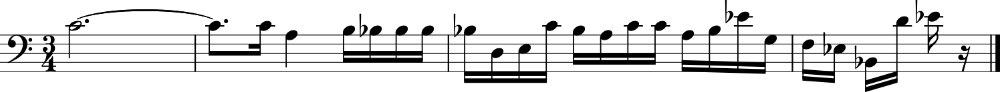

107/107 [==============================] - 63s 590ms/step - loss: 1.5841 - note_outputs_loss: 1.0414 - duration_outputs_loss: 0.5427
Epoch 309/5000
107/107 [==============================] - ETA: 0s - loss: 1.5927 - note_outputs_loss: 1.0493 - duration_outputs_loss: 0.5434[['START', 'E-:major', '4/4TS', 'rest', 'B-3', 'E-4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'C4', 'D4', 'D4', 'C4', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2'], ['0.0', '0.0', '0.0', '1.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


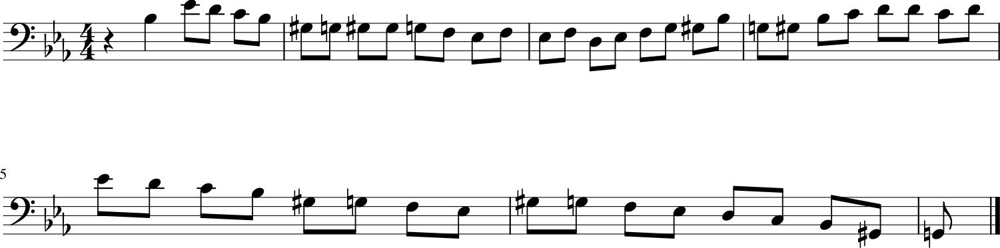

107/107 [==============================] - 65s 610ms/step - loss: 1.5927 - note_outputs_loss: 1.0493 - duration_outputs_loss: 0.5434
Epoch 310/5000
107/107 [==============================] - ETA: 0s - loss: 1.5879 - note_outputs_loss: 1.0480 - duration_outputs_loss: 0.5398[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'C#4', 'C4', 'B-3', 'C4', 'G#3', 'B-3', 'C4', 'B-3', 'G#3', 'B-3', 'G#3', 'G3', 'G#3', 'G#3', 'G3', 'F3', 'E-3', 'F3', 'D4', 'E-4', 'D4', 'C4', 'B-3', 'E-4', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'C4', 'E-3', 'D3', 'C3', 'D3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


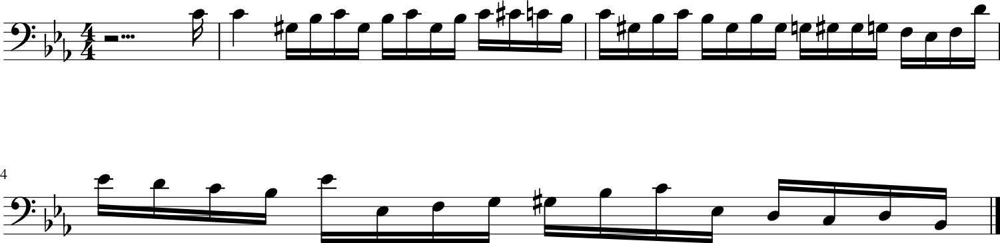

107/107 [==============================] - 65s 611ms/step - loss: 1.5879 - note_outputs_loss: 1.0480 - duration_outputs_loss: 0.5398
Epoch 311/5000
107/107 [==============================] - ETA: 0s - loss: 1.5853 - note_outputs_loss: 1.0441 - duration_outputs_loss: 0.5412[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'G#3', 'B-3', 'G#3', 'B-3', 'E-4', 'C4', 'C#4', 'C4'], ['0.0', '0.0', '1.0', '0.5', '0.25', '0.25', '0.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


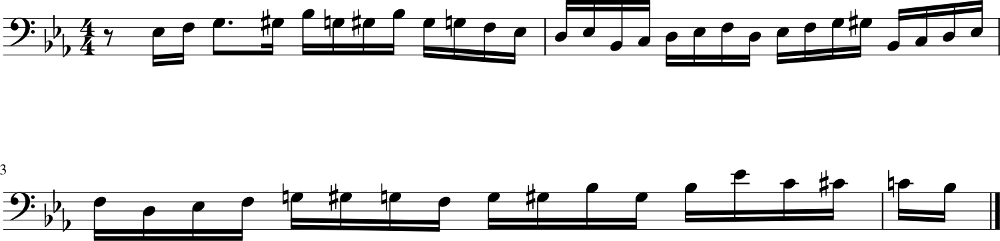

107/107 [==============================] - 65s 610ms/step - loss: 1.5853 - note_outputs_loss: 1.0441 - duration_outputs_loss: 0.5412
Epoch 312/5000
107/107 [==============================] - ETA: 0s - loss: 1.5876 - note_outputs_loss: 1.0459 - duration_outputs_loss: 0.5417[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'B-3', 'B-3', 'A3', 'G3', 'F3', 'A3', 'B-3', 'A3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'D3', 'E-3', 'G3', 'G3', 'E-3', 'C4', 'D4', 'E-4', 'A2', 'C3', 'G2', 'E-3', 'A2', 'B-2', 'D3', 'A2', 'G2', 'F2', 'E-4', 'D4', 'C4', 'B-3', 'A3', 'G3', 'A3', 'B-3', 'C4', 'A3', 'B-3', 'C4'], ['0.0', '0.0', '0.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0', '1.0']]


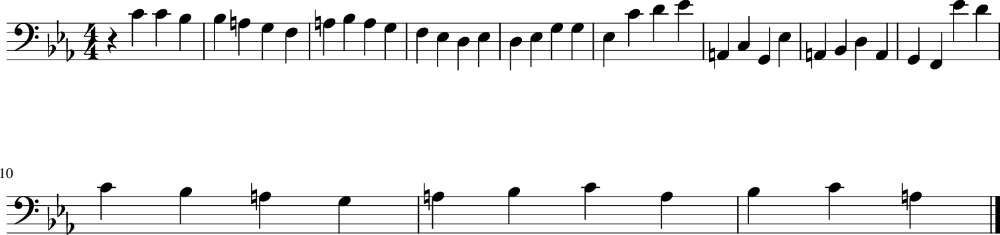

107/107 [==============================] - 64s 601ms/step - loss: 1.5876 - note_outputs_loss: 1.0459 - duration_outputs_loss: 0.5417
Epoch 313/5000
107/107 [==============================] - ETA: 0s - loss: 1.5822 - note_outputs_loss: 1.0431 - duration_outputs_loss: 0.5391[['START', 'C:major', '3/4TS', 'rest', 'C4', 'C4', 'G3', 'E3', 'C3', 'G2', 'E2', 'C2', 'C4', 'D4', 'C4', 'B3', 'C4', 'D4', 'B3', 'G3', 'D3', 'B2', 'G2', 'F2', 'D4', 'C4', 'B3', 'A3', 'G3', 'C4', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'D3', 'D3', 'E3', 'C#3', 'G3', 'A3', 'F#3', 'G3', 'A3', 'G3', 'F#3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


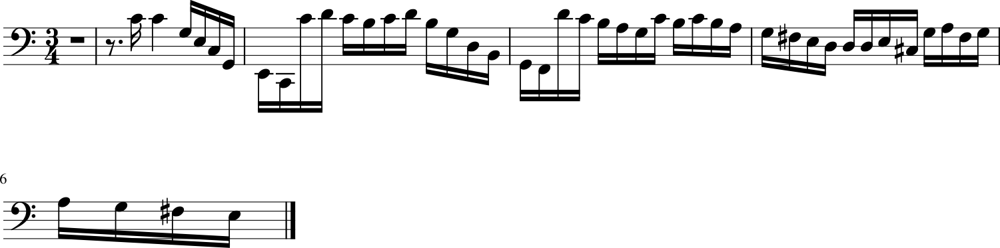

107/107 [==============================] - 64s 600ms/step - loss: 1.5822 - note_outputs_loss: 1.0431 - duration_outputs_loss: 0.5391
Epoch 314/5000
107/107 [==============================] - ETA: 0s - loss: 1.5846 - note_outputs_loss: 1.0438 - duration_outputs_loss: 0.5408[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'B-3', 'A3', 'G3', 'F3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'B-3', 'C4', 'D4', 'E-4', 'G3', 'F3', 'E-3', 'E-3', 'rest'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


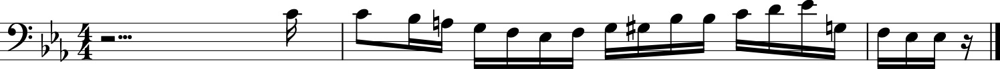

107/107 [==============================] - 63s 585ms/step - loss: 1.5846 - note_outputs_loss: 1.0438 - duration_outputs_loss: 0.5408
Epoch 315/5000
107/107 [==============================] - ETA: 0s - loss: 1.5831 - note_outputs_loss: 1.0416 - duration_outputs_loss: 0.5414[['START', 'C:major', '3/4TS', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'G2', 'E2', 'G2', 'C2', 'D2', 'E2', 'F2', 'G2', 'A2', 'B2', 'C3', 'D3', 'E3', 'G3', 'F3', 'A3', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3', 'D3', 'F#3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


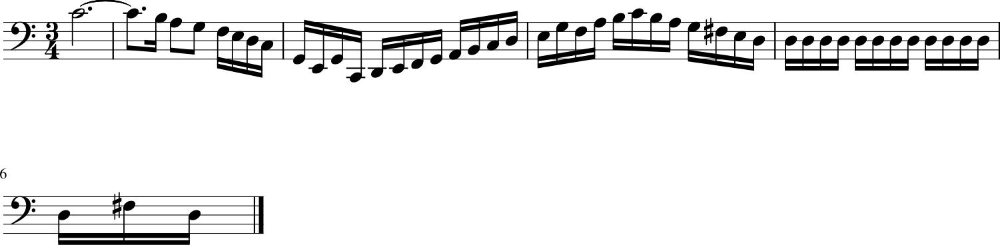

107/107 [==============================] - 64s 600ms/step - loss: 1.5831 - note_outputs_loss: 1.0416 - duration_outputs_loss: 0.5414
Epoch 316/5000
107/107 [==============================] - ETA: 0s - loss: 1.5797 - note_outputs_loss: 1.0368 - duration_outputs_loss: 0.5428[['START', 'C:major', '3/4TS', 'C4', 'C4', 'G3', 'E3', 'F3', 'A2', 'E3', 'A2', 'A3', 'B3', 'C4', 'F#3', 'E3', 'D3', 'C3', 'B2', 'A2', 'G2', 'F#2', 'E2', 'D2', 'C4', 'B3', 'C4', 'D4', 'B3', 'C4', 'A3', 'B3', 'G3', 'A3', 'B3', 'G3', 'C3', 'B3', 'A3', 'G3', 'F#3', 'A3', 'G3', 'F#3', 'A3', 'G3', 'A3', 'B3', 'C4'], ['0.0', '0.0', '0.0', '2.0', '1.0', '1.0', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


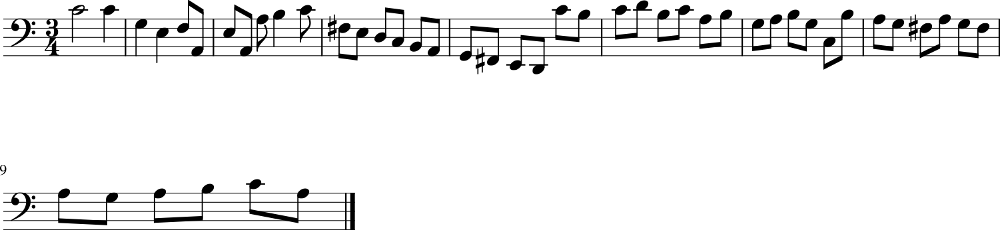

107/107 [==============================] - 64s 599ms/step - loss: 1.5797 - note_outputs_loss: 1.0368 - duration_outputs_loss: 0.5428
Epoch 317/5000
107/107 [==============================] - ETA: 0s - loss: 1.5841 - note_outputs_loss: 1.0403 - duration_outputs_loss: 0.5437[['START', 'E-:major', '4/4TS', 'rest', 'C4', 'C4', 'C4', 'B-3', 'B-3', 'G#3', 'G3', 'F3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3', 'C3', 'C2', 'E-3', 'D3', 'E-3', 'F3', 'E-3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'C3', 'E-3', 'D3', 'C3', 'B2', 'C3', 'D3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


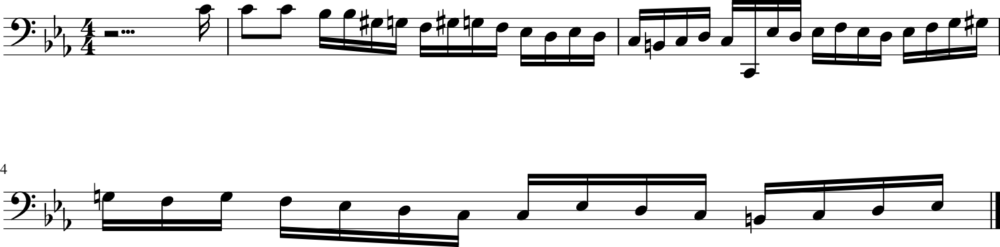

107/107 [==============================] - 64s 597ms/step - loss: 1.5841 - note_outputs_loss: 1.0403 - duration_outputs_loss: 0.5437
Epoch 318/5000
107/107 [==============================] - ETA: 0s - loss: 1.5845 - note_outputs_loss: 1.0419 - duration_outputs_loss: 0.5426[['START', 'C:major', '3/4TS', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'G2', 'E2', 'G2', 'A3', 'rest', 'B2', 'E-3', 'G2', 'B3', 'C4', 'E-2', 'G2', 'B3', 'G2', 'C3', 'E-3', 'G3', 'G2', 'E-2', 'G2', 'G#2', 'G2', 'G#2', 'G3', 'F3', 'G3', 'G#3', 'G3', 'G#3', 'F3', 'G3', 'F3', 'E-3', 'F3', 'G3', 'F3', 'E-3', 'D3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '1.0', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


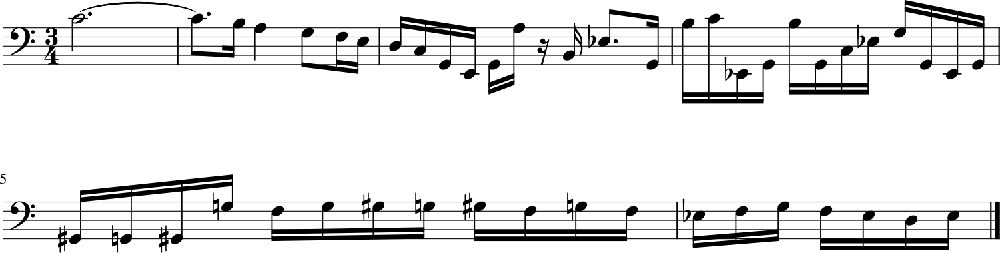

107/107 [==============================] - 64s 595ms/step - loss: 1.5845 - note_outputs_loss: 1.0419 - duration_outputs_loss: 0.5426
Epoch 319/5000
107/107 [==============================] - ETA: 0s - loss: 1.5858 - note_outputs_loss: 1.0425 - duration_outputs_loss: 0.5432[['START', 'C:major', '3/4TS', 'C4', 'G3', 'E3', 'C3', 'B2', 'C3', 'F#3', 'G3', 'A2', 'C3', 'A2', 'C3', 'G2', 'C3', 'D3', 'E3', 'C3', 'G2', 'E3', 'C3', 'E3', 'F#3', 'G3', 'A3', 'C3', 'D3', 'C3', 'D3', 'C3', 'D3', 'C3', 'D3', 'F3', 'D3', 'F3', 'D3', 'F3', 'D3', 'F3', 'D3', 'F3', 'D3', 'F3', 'D3', 'F3', 'D3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '1.0', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


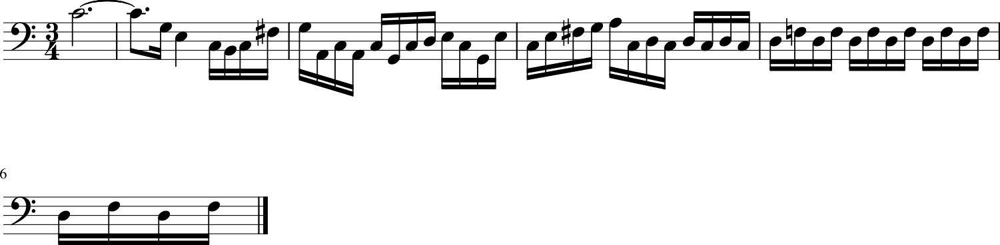

107/107 [==============================] - 64s 602ms/step - loss: 1.5858 - note_outputs_loss: 1.0425 - duration_outputs_loss: 0.5432
Epoch 320/5000
107/107 [==============================] - ETA: 0s - loss: 1.5793 - note_outputs_loss: 1.0387 - duration_outputs_loss: 0.5407[['START', 'E-:major', '4/4TS', 'rest', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G#3', 'B-3', 'E-4', 'E-3', 'E-3', 'E-3', 'E-3', 'G3', 'D3', 'E-3', 'G#2', 'E-3', 'C3', 'D3', 'E-3', 'C3', 'D3', 'F3', 'B-2', 'G#2', 'E-3', 'G3', 'B-3', 'D3', 'E-3', 'G2', 'B-2', 'E-2', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'G3', 'F3', 'G3', 'G#3', 'B-2', 'E-3', 'D3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


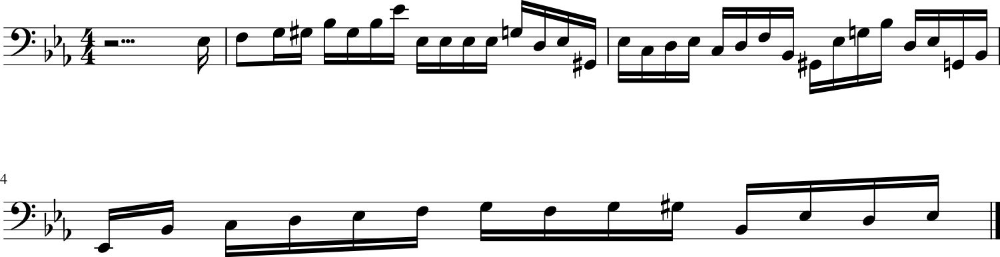

107/107 [==============================] - 64s 599ms/step - loss: 1.5793 - note_outputs_loss: 1.0387 - duration_outputs_loss: 0.5407
Epoch 321/5000
107/107 [==============================] - ETA: 0s - loss: 1.5808 - note_outputs_loss: 1.0330 - duration_outputs_loss: 0.5477[['START', 'C:major', '3/4TS', 'C4', 'C4', 'G3', 'E3', 'C3', 'B2', 'C3', 'G2', 'E2', 'E2', 'B2', 'E3', 'F3', 'G2', 'B2', 'C2', 'F2', 'A3', 'G#3', 'G3', 'C4', 'B3', 'A3', 'G3', 'C4', 'B3', 'A3', 'G3', 'F3', 'E3', 'D3', 'C3', 'E3', 'A3', 'C4', 'A3', 'F3', 'A3', 'D3', 'C4', 'B3', 'A3', 'B3', 'A3', 'G#3', 'A3'], ['0.0', '0.0', '3.75', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


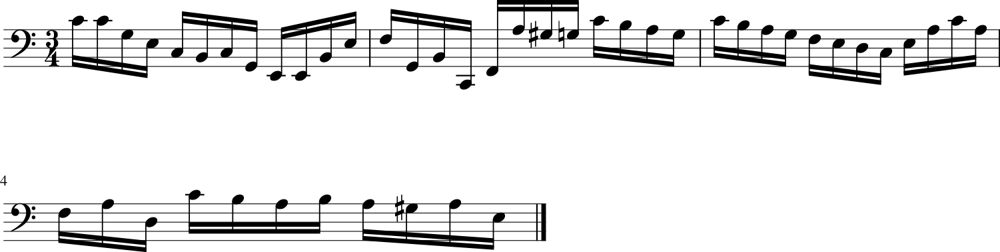

107/107 [==============================] - 64s 598ms/step - loss: 1.5808 - note_outputs_loss: 1.0330 - duration_outputs_loss: 0.5477
Epoch 322/5000
107/107 [==============================] - ETA: 0s - loss: 1.5817 - note_outputs_loss: 1.0399 - duration_outputs_loss: 0.5418[['START', 'E-:major', '4/4TS', 'rest', 'B-3', 'E-4', 'D4', 'C4', 'B-3', 'G#3', 'G3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'E-4', 'G#3', 'G3', 'F3', 'G3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'C3', 'B-2', 'G#2', 'G2', 'F2', 'G2', 'G#2', 'F2', 'G#3', 'G#3', 'G#3', 'F3', 'C3', 'D3', 'E-3', 'C3', 'D3', 'E-3', 'F3', 'G3'], ['0.0', '0.0', '0.0', '3.75', '0.25', '0.25', '1.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


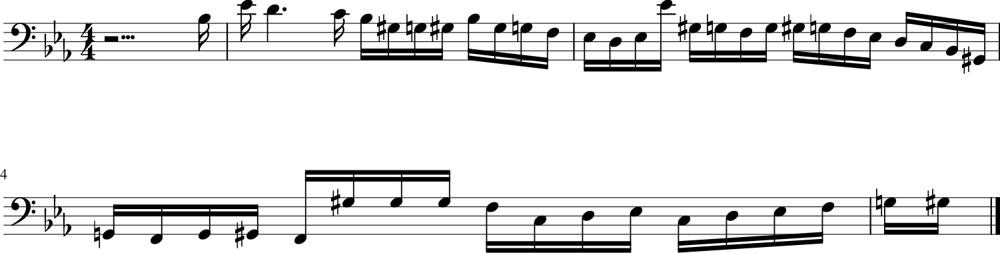

107/107 [==============================] - 65s 604ms/step - loss: 1.5817 - note_outputs_loss: 1.0399 - duration_outputs_loss: 0.5418
Epoch 323/5000
107/107 [==============================] - ETA: 0s - loss: 1.5782 - note_outputs_loss: 1.0359 - duration_outputs_loss: 0.5423[['START', 'G:major', '3/2TS', 'E3', 'D3', 'G3', 'D3', 'F#3', 'G3', 'E3', 'D3', 'C#4', 'F#2', 'G2', 'F#2', 'D3', 'A2', 'B2', 'C#3', 'D3', 'D2', 'A2', 'D3', 'F#3', 'A3', 'C#4', 'D4', 'A3', 'F#3', 'D3', 'D2', 'F#3', 'A3', 'F#3', 'G3', 'A3', 'A3', 'B3', 'C4', 'A3', 'G3', 'F#3', 'G3', 'A3', 'B3', 'A3', 'B3', 'C4', 'A3'], ['0.0', '0.0', '0.0', '0.5', '0.5', '0.5', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25', '0.25']]


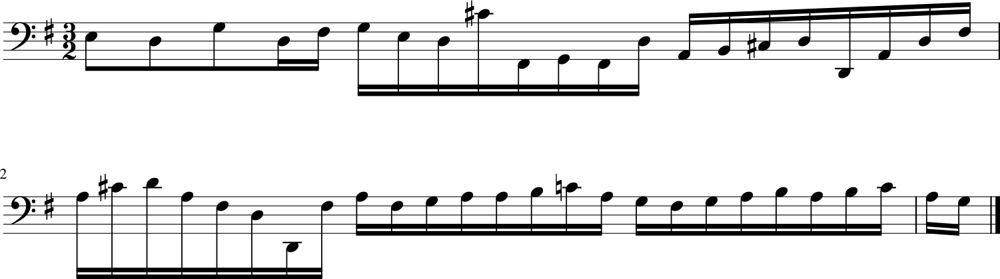

107/107 [==============================] - 65s 604ms/step - loss: 1.5782 - note_outputs_loss: 1.0359 - duration_outputs_loss: 0.5423
Epoch 324/5000
107/107 [==============================] - ETA: 0s - loss: 1.5716 - note_outputs_loss: 1.0286 - duration_outputs_loss: 0.5430[['START', 'C:major', '3/4TS', 'C4', 'C4', 'A3', 'B3', 'B-3', 'B-3', 'B-3', 'B-3', 'A3', 'G3', 'F#3', 'G3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'D4', 'C4', 'B3', 'D4', 'E3', 'G3', 'A3', 'B3', 'C#4', 'D4', 'B3', 'C#4', 'E3', 'G2', 'E3', 'C#4', 'A3', 'B3', 'C#4', 'A3', 'D4', 'B3', 'C#4', 'A3', 'E4', 'C#4', 'A4', 'A4', 'A4'], ['0.0', '0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


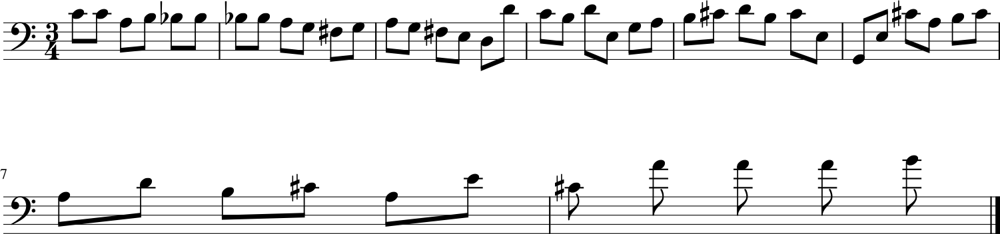

107/107 [==============================] - 64s 599ms/step - loss: 1.5716 - note_outputs_loss: 1.0286 - duration_outputs_loss: 0.5430
Epoch 325/5000
107/107 [==============================] - ETA: 0s - loss: 1.5733 - note_outputs_loss: 1.0315 - duration_outputs_loss: 0.5418[['START', 'C:major', '3/4TS', 'C4', 'C4', 'A3', 'B3', 'G3', 'E3', 'C3', 'A2', 'B2', 'G2', 'A2', 'B2', 'G3', 'A2', 'B2', 'G2', 'A2', 'B2', 'G3', 'E3', 'C#3', 'A2', 'B2', 'C#3', 'D3', 'E3', 'F#3', 'G3', 'A3', 'B3', 'C4', 'B3', 'A3', 'G3', 'F#3', 'E3', 'D3', 'D3', 'A2', 'D2', 'D3', 'F#3', 'A3', 'G3', 'D3', 'F#3'], ['0.0', '0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


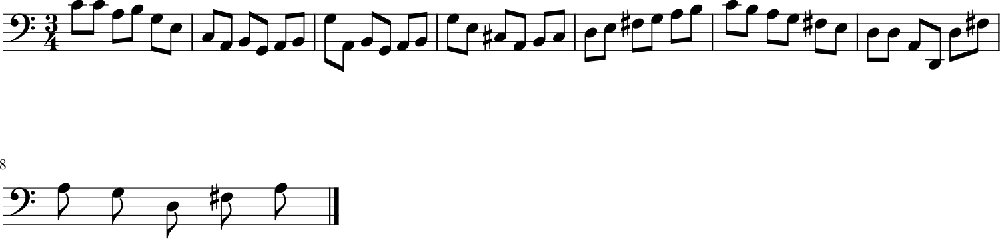

107/107 [==============================] - 64s 596ms/step - loss: 1.5733 - note_outputs_loss: 1.0315 - duration_outputs_loss: 0.5418
Epoch 326/5000
107/107 [==============================] - ETA: 0s - loss: 1.5692 - note_outputs_loss: 1.0279 - duration_outputs_loss: 0.5412[['START', 'E-:major', '4/4TS', 'rest', 'G3', 'C4', 'G#3', 'B-3', 'C4', 'C4', 'B-3', 'G#3', 'B-3', 'G#3', 'G3', 'F3', 'E-3', 'D3', 'E-3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-2', 'C3', 'D3', 'E-3', 'F3', 'D3', 'E-3', 'F3', 'G3', 'G#3', 'B-3', 'G3', 'G#3', 'B-3', 'C4', 'C#4', 'E-3', 'F3', 'G3', 'G#3'], ['0.0', '0.0', '0.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '1.0', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5', '0.5']]


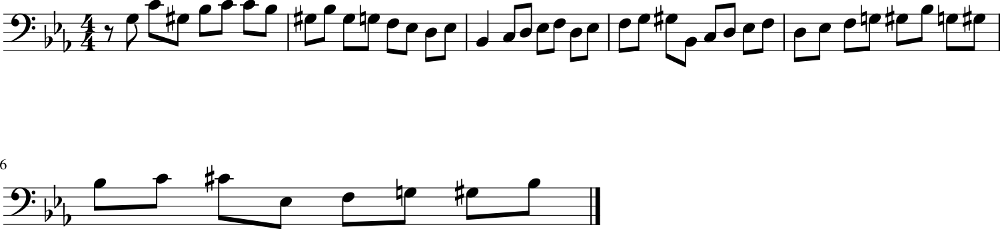

107/107 [==============================] - 68s 633ms/step - loss: 1.5692 - note_outputs_loss: 1.0279 - duration_outputs_loss: 0.5412
Epoch 327/5000
 37/107 [=========>....................] - ETA: 42s - loss: 1.6238 - note_outputs_loss: 1.0377 - duration_outputs_loss: 0.5861

KeyboardInterrupt: 

In [75]:
model.fit(
    ds,
    epochs=EPOCHS,
    callbacks=[
        model_checkpoint_callback,
        tensorboard_callback,
        music_generator,
    ],
)

In [76]:
# Save the final model
model.save("./models/model")

2023-08-27 21:27:38.117564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,?,256]
	 [[{{node inputs}}]]
2023-08-27 21:27:38.128826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,?,256]
	 [[{{node inputs}}]]
2023-08-27 21:27:38.134200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,?,256]
	 [[{{node inputs}}]]
2023-08-27

INFO:tensorflow:Assets written to: ./models/model/assets


INFO:tensorflow:Assets written to: ./models/model/assets


# 3. Generate music using the Transformer

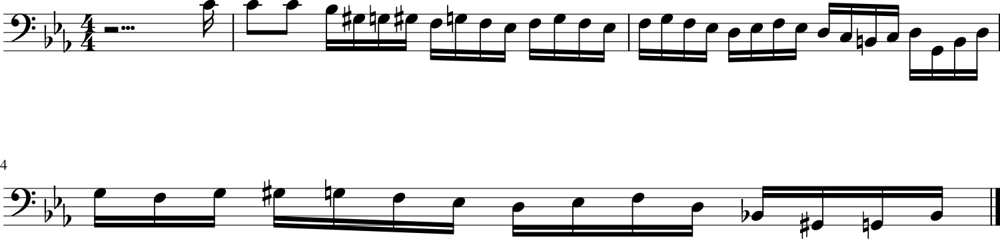

In [77]:
info = music_generator.generate(
    ["START"], ["0.0"], max_tokens=50, temperature=0.5
)
midi_stream = info[-1]["midi"].chordify()
midi_stream.show()

## Write music to MIDI file

In [79]:
timestr = time.strftime("%Y%m%d-%H%M%S")
midi_stream.write(
    "midi",
    fp=os.path.join(
        "/home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/11_music/01_transformer/output",
        "output-" + timestr + ".mid",
    ),
)

'/home/clachris/Documents/projects/Generative_Deep_Learning_2nd_Edition/notebooks/11_music/01_transformer/output/output-20230827-212811.mid'

## Note probabilities

In [80]:
max_pitch = 70
seq_len = len(info)
grid = np.zeros((max_pitch, seq_len), dtype=np.float32)

for j in range(seq_len):
    for i, prob in enumerate(info[j]["note_probs"]):
        try:
            pitch = music21.note.Note(notes_vocab[i]).pitch.midi
            grid[pitch, j] = prob
        except:
            pass  # Don't show key / time signatures

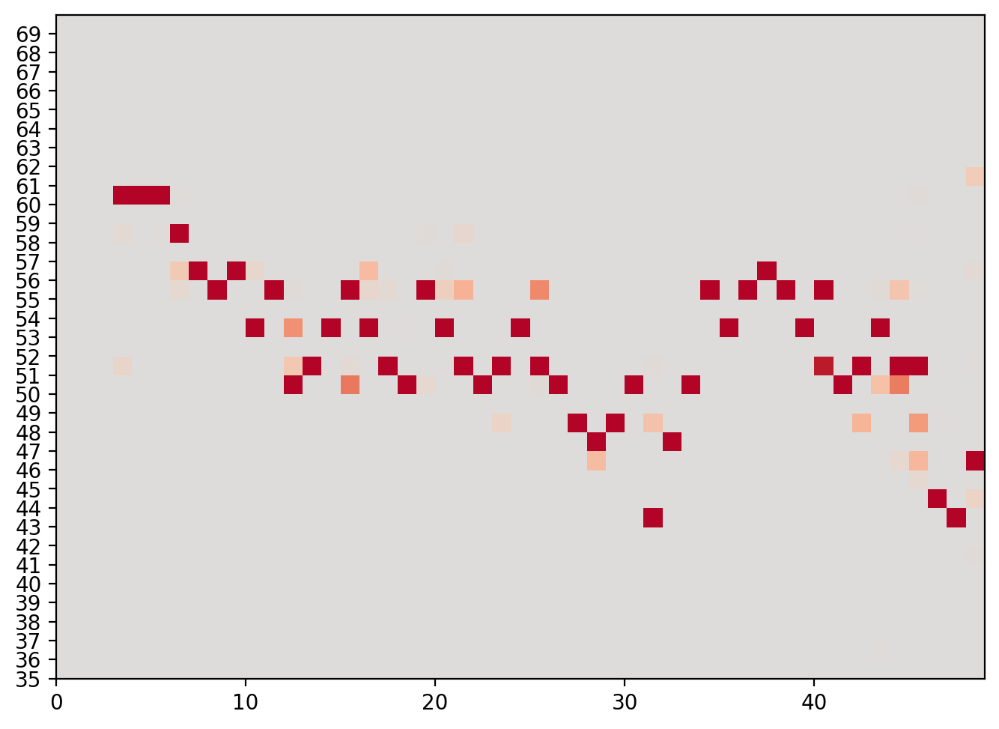

In [81]:
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_yticks([int(j) for j in range(35, 70)])
plt.imshow(
    grid[35:70, :],
    origin="lower",
    cmap="coolwarm",
    vmin=-0.5,
    vmax=0.5,
    extent=[0, seq_len, 35, 70],
)
plt.show()

## Attention Plot

In [82]:
plot_size = 20

att_matrix = np.zeros((plot_size, plot_size))
prediction_output = []
last_prompt = []

In [83]:
for j in range(plot_size):
    atts = info[j]["atts"].max(axis=0)
    att_matrix[: (j + 1), j] = atts
    prediction_output.append(info[j]["chosen_note"][0])
    last_prompt.append(info[j]["prompt"][0][-1])

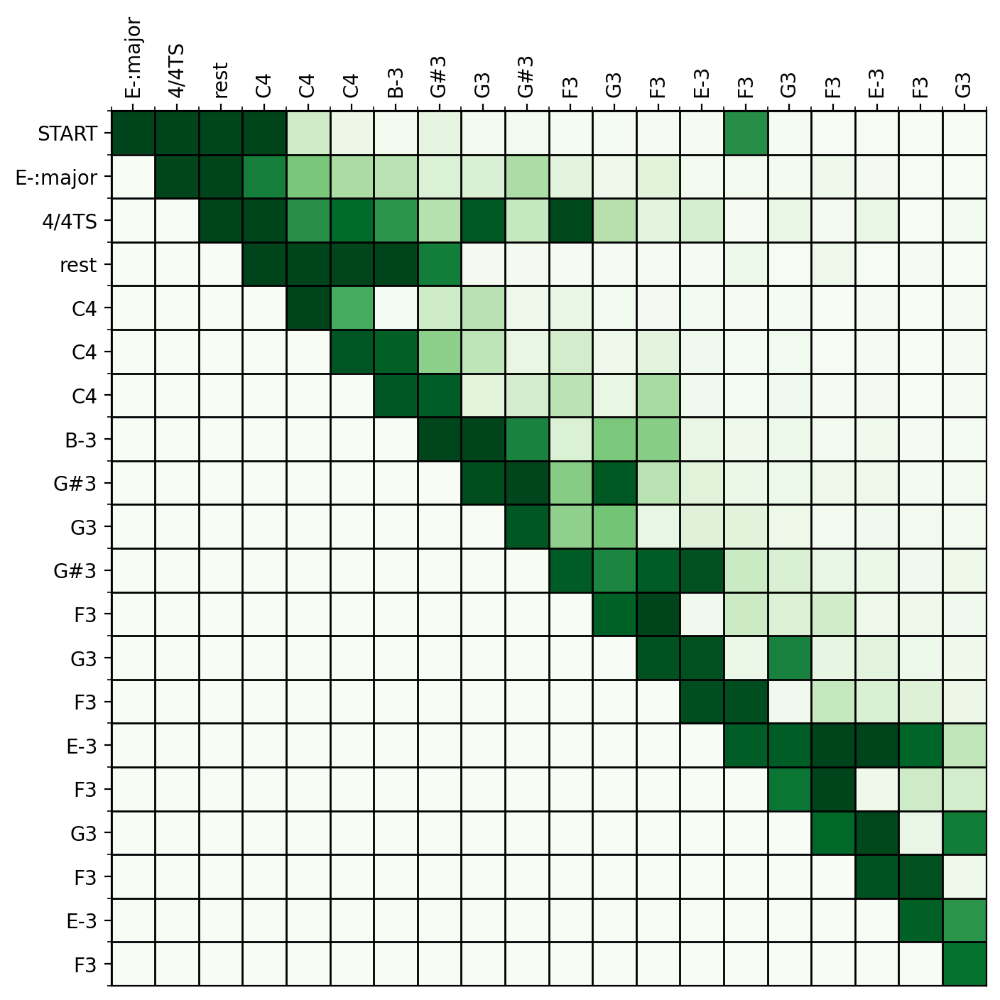

In [84]:
fig, ax = plt.subplots(figsize=(8, 8))
im = ax.imshow(att_matrix, cmap="Greens", interpolation="nearest")

ax.set_xticks(np.arange(-0.5, plot_size, 1), minor=True)
ax.set_yticks(np.arange(-0.5, plot_size, 1), minor=True)
ax.grid(which="minor", color="black", linestyle="-", linewidth=1)
ax.set_xticks(np.arange(plot_size))
ax.set_yticks(np.arange(plot_size))
ax.set_xticklabels(prediction_output[:plot_size])
ax.set_yticklabels(last_prompt[:plot_size])
ax.xaxis.tick_top()

plt.setp(
    ax.get_xticklabels(),
    rotation=90,
    ha="left",
    va="center",
    rotation_mode="anchor",
)
plt.show()